In [1]:
#'author'= ' sayak ghosh'
#'date' = '28aug 2022'
#import pkgs

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

#!pip install neattext
import neattext.functions as nfx

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv("covid19_tweets.csv")

In [4]:
df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False


In [5]:
df.shape

(179108, 13)

# + Text
    -Text Preprocessing
    -Sentiment Analysis
    -Keyword Extraction
    -Entity Extraction

In [6]:
df.columns

Index(['user_name', 'user_location', 'user_description', 'user_created',
       'user_followers', 'user_friends', 'user_favourites', 'user_verified',
       'date', 'text', 'hashtags', 'source', 'is_retweet'],
      dtype='object')

In [7]:
df.dtypes

user_name           object
user_location       object
user_description    object
user_created        object
user_followers       int64
user_friends         int64
user_favourites      int64
user_verified         bool
date                object
text                object
hashtags            object
source              object
is_retweet            bool
dtype: object

In [8]:
#source / value count / distribution
df['source'].unique()

array(['Twitter for iPhone', 'Twitter for Android', 'Twitter Web App',
       'Buffer', 'TweetDeck', 'Twitter for iPad', 'Africa Newsroom',
       'Blood Donors India', 'TweetCaster for Android',
       'Alexander Higgins', 'IFTTT', 'Hootsuite Inc.', 'Sprout Social',
       'Sprinklr', 'assarofficial', 'IAMBLOG2TWITTER', 'CrowdControlHQ',
       'COVID19-Updates', 'EveryoneSocial', 'Dynamic Signal', 'Instagram',
       'TweetCaster for iOS', 'GlobalPandemic.NET', 'Venrap Radio',
       'HeyOrca', 'Twitter for Advertisers', 'Paper.li',
       'Twitter Media Studio', 'Twitter for Mac', 'dlvr.it',
       'Cheap Bots, Done Quick!', 'Prof. Shanku', 'LaterMedia',
       'SEMrush Social Media Tool', 'Twitterrific for iOS',
       "Sebastian's Twitter Bot", 'Threader_client', 'COVID19FactoidBot',
       'PwC UK SMART', 'tweet pro stiff', 'UK COVID-19 Alerts',
       'Resistbot Open Letters', 'preprint-alert', 'ContentStudio.io',
       'Peeping Moon', 'TweetAutomaticos', 'Orlo', 'AgoraPulse Ma

In [9]:
df['source'].value_counts()

Twitter Web App                56891
Twitter for Android            40179
Twitter for iPhone             35472
TweetDeck                       8543
Hootsuite Inc.                  7321
                               ...  
Social5                            1
JustVent.LIVE                      1
QuickTake by Bloomberg             1
science faction twitter bot        1
SameraVinson                       1
Name: source, Length: 610, dtype: int64

In [10]:
#plot value 
df['source'].value_counts().nlargest(30)

Twitter Web App            56891
Twitter for Android        40179
Twitter for iPhone         35472
TweetDeck                   8543
Hootsuite Inc.              7321
Twitter for iPad            4336
Buffer                      2728
Sprout Social               1833
Instagram                   1759
IFTTT                       1545
dlvr.it                      681
GlobalPandemic.NET           679
LinkedIn                     628
COVID19-Updates              625
Twitter Media Studio         596
WordPress.com                537
HubSpot                      513
Sprinklr                     497
FS Poster                    414
Dynamic Signal               391
Resistbot Open Letters       390
Cheap Bots, Done Quick!      335
Paper.li                     322
Twitter for Advertisers      317
Blood Donors India           281
IAMBLOG2TWITTER              266
Alexander Higgins            225
Zoho Social                  224
The Social Jukebox           216
Fabrik.fm                    209
Name: sour

<AxesSubplot:>

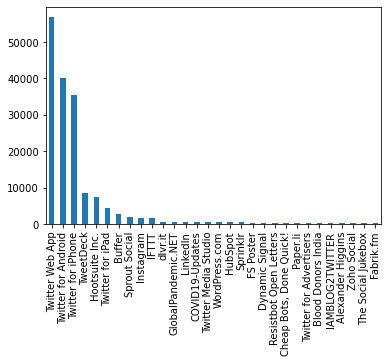

In [11]:
#plot value 
df['source'].value_counts().nlargest(30).plot(kind='bar')

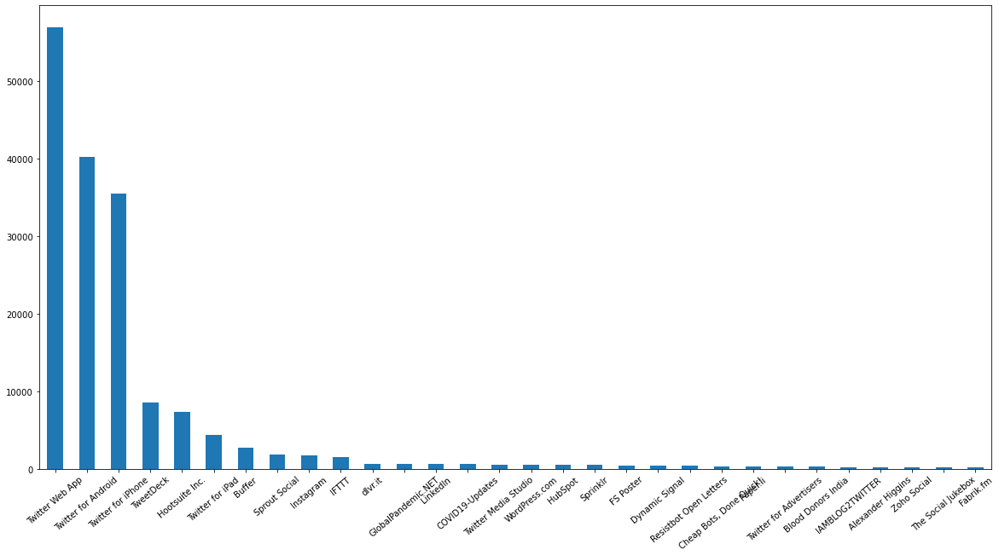

In [12]:
#plot value 
plt.figure(figsize=(20,10))
df['source'].value_counts().nlargest(30).plot(kind='bar')
plt.xticks(rotation = 40)
plt.show()

In [13]:
#### text analysis

In [14]:
#methods

dir(nfx)

['BTC_ADDRESS_REGEX',
 'CURRENCY_REGEX',
 'CURRENCY_SYMB_REGEX',
 'Counter',
 'DATE_REGEX',
 'EMAIL_REGEX',
 'EMOJI_REGEX',
 'HASTAG_REGEX',
 'MASTERCard_REGEX',
 'MD5_SHA_REGEX',
 'MOST_COMMON_PUNCT_REGEX',
 'NUMBERS_REGEX',
 'PHONE_REGEX',
 'PoBOX_REGEX',
 'SPECIAL_CHARACTERS_REGEX',
 'STOPWORDS',
 'STOPWORDS_de',
 'STOPWORDS_en',
 'STOPWORDS_es',
 'STOPWORDS_fr',
 'STOPWORDS_ru',
 'STOPWORDS_yo',
 'STREET_ADDRESS_REGEX',
 'TextFrame',
 'URL_PATTERN',
 'USER_HANDLES_REGEX',
 'VISACard_REGEX',
 '__builtins__',
 '__cached__',
 '__doc__',
 '__file__',
 '__generate_text',
 '__loader__',
 '__name__',
 '__numbers_dict',
 '__package__',
 '__spec__',
 '_lex_richness_herdan',
 '_lex_richness_maas_ttr',
 'clean_text',
 'defaultdict',
 'digit2words',
 'extract_btc_address',
 'extract_currencies',
 'extract_currency_symbols',
 'extract_dates',
 'extract_emails',
 'extract_emojis',
 'extract_hashtags',
 'extract_html_tags',
 'extract_mastercard_addr',
 'extract_md5sha',
 'extract_numbers',
 'extr

In [15]:
df['text'].iloc[0]

'If I smelled the scent of hand sanitizers today on someone in the past, I would think they were so intoxicated that… https://t.co/QZvYbrOgb0'

In [16]:
df['extract_hashtags']=df['text'].apply(nfx.extract_hashtags)

In [17]:
df[['extract_hashtags','hashtags']]

,extract_hashtags,hashtags
0,[],NaN
1,[],NaN
2,[#COVID19],['COVID19']
3,[#COVID19],['COVID19']
4,"[#CoronaVirusUpdates, #COVID19]","['CoronaVirusUpdates', 'COVID19']"
...,...,...
179103,[#WearAMask],['WearAMask']
179104,[#COVID19],['COVID19']
179105,[],NaN
179106,[#COVID19],['COVID19']


In [18]:
#remove hashtags
df['clean_tweet']=df['text'].apply(nfx.remove_hashtags)

In [19]:
df[['text','clean_tweet']]

,text,clean_tweet
0,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey @Yankees @YankeesPR and @MLB - wouldn't it...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,@diane3443 @wdunlap @realDonaldTrump Trump nev...
3,@brookbanktv The one gift #COVID19 has give me...,@brookbanktv The one gift has give me is an ...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 July : Media Bulletin on Novel \n@kansa...
...,...,...
179103,Thanks @IamOhmai for nominating me for the @WH...,Thanks @IamOhmai for nominating me for the @WH...
179104,2020! The year of insanity! Lol! #COVID19 http...,2020! The year of insanity! Lol! https://t.c...
179105,@CTVNews A powerful painting by Juan Lucena. I...,@CTVNews A powerful painting by Juan Lucena. I...
179106,"More than 1,200 students test positive for #CO...","More than 1,200 students test positive for a..."


In [20]:
df['clean_tweet'] = df['clean_tweet'].apply(lambda x: nfx.remove_userhandles(x))

In [21]:
df[['text','clean_tweet']]

,text,clean_tweet
0,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey and - wouldn't it have made more sen...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,Trump never once claimed was a hoax. W...
3,@brookbanktv The one gift #COVID19 has give me...,The one gift has give me is an appreciatio...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 July : Media Bulletin on Novel \n ...
...,...,...
179103,Thanks @IamOhmai for nominating me for the @WH...,Thanks for nominating me for the challen...
179104,2020! The year of insanity! Lol! #COVID19 http...,2020! The year of insanity! Lol! https://t.c...
179105,@CTVNews A powerful painting by Juan Lucena. I...,A powerful painting by Juan Lucena. It's a t...
179106,"More than 1,200 students test positive for #CO...","More than 1,200 students test positive for a..."


In [22]:
df['clean_tweet'].iloc[10]

'49K+ Covid19 cases still no response from \n      cancel the compartment exa… https://t.co/kV2ZKmumu1'

In [23]:
df['clean_tweet'] = df['clean_tweet'].apply(nfx.remove_multiple_spaces) 

In [24]:
df['clean_tweet'].iloc[10]

'49K+ Covid19 cases still no response from cancel the compartment exa… https://t.co/kV2ZKmumu1'

In [25]:
df['clean_tweet'] = df['clean_tweet'].apply(nfx.remove_urls) 

In [26]:
df['clean_tweet'].iloc[10]

'49K+ Covid19 cases still no response from cancel the compartment exa… '

In [27]:
#cleaning text : punctuations
df['clean_tweet'] = df['clean_tweet'].apply(nfx.remove_puncts) 

In [28]:
df['clean_tweet'].iloc[10]

'49K+ Covid19 cases still no response from cancel the compartment exa… '

In [29]:
df[['text','clean_tweet']]

,text,clean_tweet
0,If I smelled the scent of hand sanitizers toda...,If I smelled the scent of hand sanitizers toda...
1,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,Hey and wouldnt it have made more sense to ha...
2,@diane3443 @wdunlap @realDonaldTrump Trump nev...,Trump never once claimed was a hoax We all cl...
3,@brookbanktv The one gift #COVID19 has give me...,The one gift has give me is an appreciation f...
4,25 July : Media Bulletin on Novel #CoronaVirus...,25 July : Media Bulletin on Novel
...,...,...
179103,Thanks @IamOhmai for nominating me for the @WH...,Thanks for nominating me for the challenge I n...
179104,2020! The year of insanity! Lol! #COVID19 http...,2020 The year of insanity Lol
179105,@CTVNews A powerful painting by Juan Lucena. I...,A powerful painting by Juan Lucena Its a trib...
179106,"More than 1,200 students test positive for #CO...",More than 1200 students test positive for at m...


# Sentiment Analysis

In [30]:
from textblob import TextBlob

In [31]:
def get_sentiment(text):
    blob = TextBlob(text)
    sentiment_polarity = blob.sentiment.polarity
    sentiment_subjectivity = blob.sentiment.subjectivity
    if sentiment_polarity > 0:
        sentiment_label = 'Positive'
    elif sentiment_polarity < 0:
        sentiment_label = 'Negative'
    else:
        sentiment_label = 'Neutral'
    result = {'polarity':sentiment_polarity,
              'subjectivity':sentiment_subjectivity,
              'sentiment':sentiment_label}
    return result

In [32]:
# Text
ex1 = df['clean_tweet'].iloc[0]

In [33]:
ex1

'If I smelled the scent of hand sanitizers today on someone in the past I would think they were so intoxicated that… '

In [34]:
get_sentiment(ex1)

{'polarity': -0.25, 'subjectivity': 0.25, 'sentiment': 'Negative'}

In [35]:
df['sentiment_result'] = df['clean_tweet'].apply(get_sentiment)

In [36]:
df['sentiment_result']

0         {'polarity': -0.25, 'subjectivity': 0.25, 'sen...
1         {'polarity': 0.5, 'subjectivity': 0.5, 'sentim...
2         {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
3         {'polarity': 0.0, 'subjectivity': 0.3571428571...
4         {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
                                ...                        
179103    {'polarity': 0.2, 'subjectivity': 0.2, 'sentim...
179104    {'polarity': 0.8, 'subjectivity': 0.7, 'sentim...
179105    {'polarity': 0.3, 'subjectivity': 1.0, 'sentim...
179106    {'polarity': 0.26325757575757575, 'subjectivit...
179107    {'polarity': 0.0, 'subjectivity': 0.0, 'sentim...
Name: sentiment_result, Length: 179108, dtype: object

In [37]:
df['sentiment_result'].iloc[0]

{'polarity': -0.25, 'subjectivity': 0.25, 'sentiment': 'Negative'}

In [38]:
pd.json_normalize(df['sentiment_result'].iloc[0])

,polarity,subjectivity,sentiment
0,-0.25,0.25,Negative


In [39]:
df = df.join(pd.json_normalize(df['sentiment_result']))

In [40]:
df.head()

,user_name,user_location,user_description,user_created,user_followers,user_friends,user_favourites,user_verified,date,text,hashtags,source,is_retweet,extract_hashtags,clean_tweet,sentiment_result,polarity,subjectivity,sentiment
0,ᏉᎥ☻լꂅϮ,astroworld,wednesday addams as a disney princess keepin i...,2017-05-26 05:46:42,624,950,18775,False,2020-07-25 12:27:21,If I smelled the scent of hand sanitizers toda...,NaN,Twitter for iPhone,False,[],If I smelled the scent of hand sanitizers toda...,"{'polarity': -0.25, 'subjectivity': 0.25, 'sen...",-0.25,0.250000,Negative
1,Tom Basile 🇺🇸,"New York, NY","Husband, Father, Columnist & Commentator. Auth...",2009-04-16 20:06:23,2253,1677,24,True,2020-07-25 12:27:17,Hey @Yankees @YankeesPR and @MLB - wouldn't it...,NaN,Twitter for Android,False,[],Hey and wouldnt it have made more sense to ha...,"{'polarity': 0.5, 'subjectivity': 0.5, 'sentim...",0.50,0.500000,Positive
2,Time4fisticuffs,"Pewee Valley, KY",#Christian #Catholic #Conservative #Reagan #Re...,2009-02-28 18:57:41,9275,9525,7254,False,2020-07-25 12:27:14,@diane3443 @wdunlap @realDonaldTrump Trump nev...,['COVID19'],Twitter for Android,False,[#COVID19],Trump never once claimed was a hoax We all cl...,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral
3,ethel mertz,Stuck in the Middle,#Browns #Indians #ClevelandProud #[]_[] #Cavs ...,2019-03-07 01:45:06,197,987,1488,False,2020-07-25 12:27:10,@brookbanktv The one gift #COVID19 has give me...,['COVID19'],Twitter for iPhone,False,[#COVID19],The one gift has give me is an appreciation f...,"{'polarity': 0.0, 'subjectivity': 0.3571428571...",0.00,0.357143,Neutral
4,DIPR-J&K,Jammu and Kashmir,🖊️Official Twitter handle of Department of Inf...,2017-02-12 06:45:15,101009,168,101,False,2020-07-25 12:27:08,25 July : Media Bulletin on Novel #CoronaVirus...,"['CoronaVirusUpdates', 'COVID19']",Twitter for Android,False,"[#CoronaVirusUpdates, #COVID19]",25 July : Media Bulletin on Novel,"{'polarity': 0.0, 'subjectivity': 0.0, 'sentim...",0.00,0.000000,Neutral


In [41]:
df['sentiment'].value_counts()

Neutral     75490
Positive    74154
Negative    29464
Name: sentiment, dtype: int64

<AxesSubplot:>

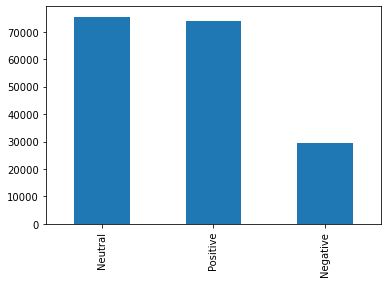

In [42]:
df['sentiment'].value_counts().plot(kind='bar')

<AxesSubplot:xlabel='sentiment', ylabel='count'>

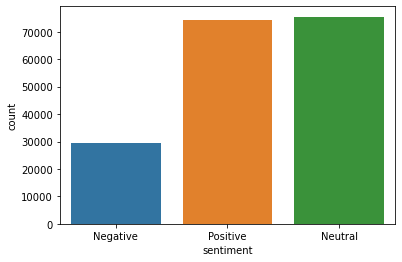

In [43]:
sns.countplot(df['sentiment'])

In [44]:
positive_tweet = df[df['sentiment'] == 'Positive']['clean_tweet']

In [45]:
neutral_tweet = df[df['sentiment'] == 'Neutral']['clean_tweet']

In [46]:
negative_tweet = df[df['sentiment'] == 'Negative']['clean_tweet']

In [47]:
positive_tweet

1         Hey and  wouldnt it have made more sense to ha...
6         How Will Change Work in General (and recruitin...
8                 Praying for good health and recovery of  
12        👋🏻 — no one will be safe from until everyone i...
13        Lets all protect ourselves from Its real and t...
                                ...                        
179096    We were really bummed we couldn’t cop one of t...
179103    Thanks for nominating me for the challenge I n...
179104                       2020 The year of insanity Lol 
179105     A powerful painting by Juan Lucena Its a trib...
179106    More than 1200 students test positive for at m...
Name: clean_tweet, Length: 74154, dtype: object

In [48]:
neutral_tweet

2          Trump never once claimed was a hoax We all cl...
3          The one gift has give me is an appreciation f...
4                        25 July : Media Bulletin on Novel 
7         You now have to wear face coverings when out s...
9         POPE AS GOD  Prophet Sadhu Sundar Selvaraj Wat...
                                ...                        
179099    I have NOTHING BUT 💚 for the these days NOT ON...
179100    Wallkill school nurse adds COVID19 monitoring ...
179101    Wallkill school nurse adds COVID19 monitoring ...
179102       we have reached 25mil cases of worldwide oof\n
179107                            I stop when I see a Stop 
Name: clean_tweet, Length: 75490, dtype: object

In [49]:
negative_tweet

0         If I smelled the scent of hand sanitizers toda...
5          deaths continue to rise Its almost as bad as ...
22         Your image doesnt list a source but Id be car...
36         Im feeling a little anxious because seems to ...
41        Britain didnt understand for months while plen...
                                ...                        
179067    60k + dead due to inaction on 20k + residents ...
179078      Nigeria: The dedicated few protecting childr...
179085    How toilet paper and avocados help explain the...
179086    Widened small blood vessels in the lungs appea...
179088    As a result of the pandemic hundreds if not th...
Name: clean_tweet, Length: 29464, dtype: object

In [50]:
#stopwords remove

In [51]:
positive_tweet_list = positive_tweet.apply(nfx.remove_stopwords).tolist()

In [52]:
neutral_tweet_list = neutral_tweet.apply(nfx.remove_stopwords).tolist()

In [53]:
negative_tweet_list = negative_tweet.apply(nfx.remove_stopwords).tolist()

In [54]:
positive_tweet_list

['Hey wouldnt sense players pay respects A…',
 'Change Work General (and recruiting specifically) via/',
 'Praying good health recovery',
 '👋🏻 — safe safe commit ensure…',
 'Lets protect real numbers climbing fast Continent Lets n…',
 'Second wave Flandersback',
 'COVID Update: infection rate Florida following natural curve experts predicted initial cu…',
 'Good Patriots Volunteer Election Judge Polls open without…',
 'comprehensive review amp Analysis: key ways WASH help reduce transmission…',
 'crosses 2 lakh mark 150055 ppp recovered far positive today 6988/total…',
 'Actor father MrGKReddy tested positive 15/20 days s…',
 'safe place visit guests said hotel meticulous applying hand sanitation als…',
 'CEO live WSU talking “The effects Covid19 students”…',
 'Actionables healthy recovery',
 'understood hadnt missed meeting In…',
 'released new podcast episodes week: Technology Platforms Conduct Telehealth Visits C…',
 'reports 1142 positive cases 29 deaths Saturday Death toll rises 3

In [55]:
#tokenization

In [56]:
for line in positive_tweet_list:
    for token in line.split():
        print(token)

Hey
wouldnt
sense
players
pay
respects
A…
Change
Work
General
(and
recruiting
specifically)
via/
Praying
good
health
recovery
👋🏻
—
safe
safe
commit
ensure…
Lets
protect
real
numbers
climbing
fast
Continent
Lets
n…
Second
wave
Flandersback
COVID
Update:
infection
rate
Florida
following
natural
curve
experts
predicted
initial
cu…
Good
Patriots
Volunteer
Election
Judge
Polls
open
without…
comprehensive
review
amp
Analysis:
key
ways
WASH
help
reduce
transmission…
crosses
2
lakh
mark
150055
ppp
recovered
far
positive
today
6988/total…
Actor
father
MrGKReddy
tested
positive
15/20
days
s…
safe
place
visit
guests
said
hotel
meticulous
applying
hand
sanitation
als…
CEO
live
WSU
talking
“The
effects
Covid19
students”…
Actionables
healthy
recovery
understood
hadnt
missed
meeting
In…
released
new
podcast
episodes
week:
Technology
Platforms
Conduct
Telehealth
Visits
C…
reports
1142
positive
cases
29
deaths
Saturday
Death
toll
rises
3806
reports
ANI
quot…
Venezuelas
Economy/Budget
tied
Oil
like
Loui

gives
info
performing
better
fight
increased
testing
samples
Covid19
fatality
rate
significantly
dropped
235%
Saturday
an…
CM
tested
positive
Theres
news
bcoz
ministers
wel…
(6)
rise
level
knowledge
acquiring
new
helpful
informatio…
students
tested
positive
coronavirus
taking
ACT
Oklahoma
high
school…
Andhra
Pradesh
registered
singleday
spike
7813
positive
cases
amp
52
deaths
24…
dealing
COVID19
outbreak
survey
developed
psychologists
world
p…
Actor
father
MrGKReddy
tested
positive
15/20
days
s…
resuming
movie
shootings
latest
interview
press
knock
“change
tone”
week
Trump
It’s…
New
Personal
View:
Need
sustainable
biobanking
networks
diseases
epidemic
potential
worsened
dire
opioid
crisis
fewer
social
supports
people
battling
addictions
mu…
🔴Corona
Alert
|
arrivals
Chennai
tested
positive
Covid19
raising
total
Sri
Lanka
2768…
wants
sure
150K
dead
end
July
7/24:
148490
dea…
America
land
free
home
brave
land
acquiescent
home
f…
RFK
Jr
soars
Phenomenal
read
LACK
scientific
testing
develop

million
rises
11485:
Health
Ministry
Bishop
John
Hsane
Hgyi
Pathein
joins
church
social
workers
moral
support
people
quarantined
21
da…
Bishop
John
Hsane
Hgyi
Pathein
joins
church
social
workers
moral
support
people
quarantined
21
da…
Bishop
John
Hsane
Hgyi
Pathein
joins
church
social
workers
moral
support
people
quarantined
21
da…
Bishop
John
Hsane
Hgyi
Pathein
joins
church
social
workers
moral
support
people
quarantined
21
da…
Government
Hospitals
entire
treatment
FREE
COST…
attitude
civilization
right
with…
Herere
lessons
learnt
outbreak
hope
best
prepared
t…
giving
medical
treatment
people
who’ve
tested
positive
point
Spanish
flu
substantial
portion
death
young
people
those…
suggest
main
different
seasonal
flu
vaccination
immunity
seasonal
fl…
stick
rules
rate
infection
fall⬇🎢
85
million
Canadians
quickly
employment
revive
recovery
Dr
Ather
Akbari…
COVID19
crisis
keeps
growing
Rio
Grande
Valley
increase
cases
overwhelming
medical
systems…
forced
“believe”
scam
logical
school
reopen

Temple…
Allcure
Lifescience
delivering
rich
quality
Hand
Sanitizers
details
contact
contact
leave
your…
good
Best
Products
Lowest
price
looking
solution
vis…
Early
elections
rages
Political
opportunism/cynicism
runs
deep
midst
global
cri…
According
official
responsible
collecting
uploading
daily
provincial
tests
government…
Cant
believe
visited
Scotland
skipping
entire
mainland
going
straight
Orkney
t…
experience
March
bothered
look
like
the…
party
going
man
like
medical
colleagues
hero
Exactly
Kate
difficult
concept
board
suffer
with…
HEY
Shut
start
right
~
precisely
supposed
buy
facemask
let
shop
buy
facemask…
cant
believe
photos
real
school
😱
look
cut
scifi
film
a…
Tokyo
reports
260
cases
day
record
high
※7/24/2020
2020
look
like
pull
bankjob
straight
clown
Selling
babies
R200
colours
available
DM
information
Durban
based
thought
Lets
reduce
social
distancing
1metre
youre
lucky
Light
blue
touch
paper
a…
ALERT:
Newsom
economic
task
force
starstudded
cast
cant
solve
reopening
Global
P

John
Roberts
trying
help
save
lives
People
right
church
sit
close
sing…
Pre
COVID
selfie
CHALLENGE
I’ll
join
trend
Post
selfie
preferably
pic
took
right
the…
masks
eyebrow
raise
new
polite
smile
walk
passed
folk
supermarket
“Together
management
shortterm
response
seize
historical
unique
opportunity…
Walmart
wants
customers
wear
mask
24
hours
need
Thermometer
R500
+
Currier
Available
Bulks
want
number
poster
Whats…
Thank
🙏
wendybibsqueak72
😷
love
Love
Miss
Ruby
💘
❤
😍🤩🥰💜
Maybe
pay
attention
tweets
interesting
table
showing…
rules
protests
legal
gathering
church
isnt
assembling
congregation…
contribution
initiative
highly
appreciated
dm
information
Good
life
nowadays
thanks
Impacted
Counter
Efforts
Great
read
amp
eating
help
restaurant
owners
scared
restaurant
new
tech
c…
Dont
expect
safe
Stay
gt1m
washing
hands
Wear
mask
Stop
s…
MOISTURISER
HAND
SANITIZER
SALE
Enjoy
instant
clean
natural
hand
sanitizer
youre
going
weekend
remember
social
distancing
“To
able
meet
financial
needs
women
div

video
created
Canadian
teenager
accurate
view
lot
feeling
the…
Pretty
handled
thing
deaths
1100
day
row
sees
49000
new
cases
best
decisions
pandemic
mandatory
face
coverings/masks
closed
public
places
done…
common
mistakes
people
getting
masks
t…
patients
tested
positive
died
Saturday
deaths
death
to…
It’s
going
beautiful
weekend
NJ
don’t
forget
taking
break
young…
positive
mask
hide
resting
bitch
face
excited
Book
Number
seller
Education
amp
Covid
right
Amazon
@
use
new
Mode
video
meet
app
Microsoft
Teams
place
basketball
fans
courtside
in…
total
number
infections
worldwide
quickly
nearing
16
million
10
million
patients
recovered…
1
Updated
thread
children
summarising
latest
research
Summary:
schools
reopen
safe…
important:
‘people
safe
virus’
he’s
failure
killed
145k
(amp…
legitimately
increasing
nearly
40
cases
14
days
Yihh
😣
adequate
hospital
facilities
Promoting
home
isolation
mild/asymptomatic
cases
167
case…
Strategic
Communication
Group
reported
Saturday
new
recordhigh
number
c

chart
available
Fyapena
nomba
Politicians
holding
rallies
ate
people
love
SMH
2803
new
positive
cases
reported
36314
total
cases
Ministry
Public
Health
announces
398
new
confirmed
cases
(Covid
19)
330
cases
recovered
magic
crystal
showing
outbreak
humm
yes…
reported
1487
new
infections
Saturday
recorded
24
deaths
caused
debilitating…
Day
1️⃣1️⃣
Memes
amp
Images
💻📱🕹📺
fun
😀
subject
pleaseid
like
buy
takes
soooo
long…
Register
Free:
⁦
true
reality
nightmare
America
146000
deaths
4
million
cases
of…
MP
CM
Shivraj
Singh
Chouhan
tests
positive
coronavirus
SMEs
risk
failing
impacts
emerging
economies…
football
club
coach
Xavi
Hernandez
tested
positive
posted
Instagram
he’ll
r…
realted
death
tally
JK
crosses
300
mark
5
new
deaths
today
handled
outbreak
better
country
mentioned
article
Spain
discovered
dexamethasone
useful
UK
Spain
succ…
Listen
recent
episode
podcast:
Whats
Diana
Laufenberg
Sallah
orders
available
High
taste
affordablewe
offer
home
deliveries
kaduna
Message
08…
Superior
Court
c

influence
left
meeting
directly
council
deci…
Cultural
institutions
Boston
continue
scramble
money
reopen
via…
recovery
weeks
young
adults:
study
CM
expressed
happiness
encouraging
result
48
year
woman
recovering
fro…
Interesting
read
persoective
outside
Germany
habdling
Mass
update
724:
107897
cases
8279
deaths
214
new
cases
14
new
deaths
uptick
cases…
long
wait
meet
loved
ones
termed
non
essential
travel
resume
INT…
Rakesh
Sharma
Best
business
Coach
India
Website:
El
Salvador
reports
429
new
cases
setting
new
daily
record
134
new
recoveries…
2803
new
positive
cases
reported
Bihar
taking
total
number
cases
36314:
State
Health
Department
Barret
man
wants
tell
world
problems
human
race
needs
think
redue
thing…
Schools
scrambling
plan
safe
reopening
⁦
⁦
|
India
conducted
420
lakh
tests
day
highest
far
tests
million
ri…
faces
critical
weekend
daily
infection
rate
hits
record
high
Tokyo
confirms
260
cases…
289K
CASES
DAY
world
recorded
289028
new
coronavirus
cases
single
day
(July
24)
maki

school
days
weeks
blood
th…
lagi
loh
1
hours
FREE
CP
Bio
DMCome
join
canceled
clear
attendance
sparse
narcissism
cant
stomach
another…
Corona
cultists
provide
infection
transmission
rates
constantly
touching
c…
2020
tourism
facing
unprecedented
challenges
caused
predicted
78%
decline
compared
2…
🗨️The
true
test
function
crisis—
Pandemic
calls
for…
thankyou
face
masks
Ready
wear
customers
homes
status
official
ie
best
Kenyans
are/were
confused
{Preferably
in…
Share
stories
Learn
Berkshire
COVID
Collec…
Engaging
communities
remain
crucial
efforts
prevent
address
treat
world
face
challenges
events
gained
traction
need
flawless…
countries
especially
lockdowns
eased
experiencing
second
peak
Theres
secret
success
Theres
SYSTEM
success
Fund
here:
50100
died
17/18
UK
RIP
loved
ones
Im
equally
sorry…
nice
article
effects
constant
march
transmission
Al…
It’s
protecting
love
ones
heaven
forbid
end
needing
ventilator
and…
Good
morning
folks
find
attached
latest
ENEWS
service
Sunday
26
July
care
we

company
happening
right
conce…
Exciting
news
Stand
X
approached
guest
speaker
podcast
fina…
Bro
gonna
tested
know
positive
stuffy
nose
heavy
chest/har…
followers
help
James
new
bike
girlfriend
touch
loan
or…
reports
111
new
cases
Herere
details
Thank
Alan
Ong
new
General
Manager
hosting
AMCHAM
Team
yesterday
a…
received
support
amazing
partners
COVID19
pandemic
including
ahead
“
crunch”
2
months
FREE
try
NICE
Value
Realization
Services
exten…
marks
5th
day
row
200
cases
:
Asahi
Shimbun
Love
disaster
capitalism
spin
sort
stories
life
society
economy
risk
from…
saying
early
March
WAY
stop
virus
e…
Oh
thats
true
1%
amp
75%
Gram
~1/2
includi…
it’s
good
Batman
SpiderMan
wear
masks
it’s
good
New
Healthcare
Marketing
Matters
blog
post:
Hospitals
Need
Rebuild
Trust
Send
PrePandemic
Marketing
Messa…
fast
spotify
music
promotion
viral
425
million
infected
148000+
dead
good
America
believes
theres
evidence
that…
new
old
man
blog
post:
Uncensored
Guide
Surviving
SARSCoV2
Pandemic
Individually
amp


compliance
sa…
WOW
Dubai
awarded
global
safety
hygiene
stamp
World
Travel
amp
Tourism
Council
worries
if…
Sample
collected
deceased
ASI
testing
come
positive
reports
body
lying
unatten…
Bridal
company
western
Japan
providing
free
venues
outfits
planning
support
couples
wedding
ceremo…
week
fully
gone
perfectly
safe
security
guard
fully
rejoin
soc…
❤💛💚💙💜💔🙀
involved
reopening
schools
talked
Read
thread
responses…
Calling
medical
students
high
levels
interest
paediatric
project
on…
Saturday
Share
happy
moment
loved
ones
blissful
weekend
Time
Magazine
absolutely
damning
Boris
Johnsons
handling
this…
Concerns
arise
receive
positive
covid19
results
got
tested
Eilish
McColgan
releases
exercise
videos
primary
children
14
new
cases
1
new
death
Slovenia
[10:54
GMT]
STAY
STRONG
CONFIDENT
latest
OpEd
Executive
Director
explains
research
provides
bricks
an…
*🖋WRITE
STORY
BOLD
STEP🐾
CHANGE
STATUS
TODAY*
*DONT
DELIBERATE
LONG
I…
tested
positive
GetwellSoonMaestro🖤
Best
lockdown
moment
6
months
baby
E

cases
reported
Bhubaneswar
Municipal
Corporation
(BMC)
jurisdiction
24
hours…
traded
commented
instagram
post
smiled
😄
saw
bring
j…
Thank
spotlight
working
tirelessness
bring
our…
Positive
male
patient
needs
B
Positive
(B+ve)
Urgently
SKIMS
Soura
SrinagarOnly…
updates:
New
cases:
111
Total
cases:
1828
reports
382
new
cases
death
BIOPHARMA:
Drug
Controller
General
India
(
given
regulatory
approval
la…
Ok
like
friend
reeaaallllllyyy
good
point
time
hear
colleague
getting
infected
dying
pandemic
causes
gr…
Whew
Thanks
NZs
lockdown
greater
certainty
Auckland
Volcanic
Field
quiet…
Excellent
thread
gender
violence
lockdown
Terrific
research
include
adolescents
toolki…
35yearold
positive
man
homeisolation
dies
suicide
Patna
Citys
Malsalami
Police
Stat…
update
Cuttack
city
(CMC
area)
47
new
COVID19
+ve
cases
reported
today
distric…
Health
authorities
registered
675
new
cases
Friday
highest
daily
record
outbrea…
📍India
achieves
record
420000
tests
single
day
July
24
202…
looking
Internship
Appl

cases
found
staff
local
seafood
company
Dalian
authorities
s…
Wonderful
opportunity
sharing
best
practices
Ness
webinar
Total
confirmed
15746452
Global
Deaths
639900
Greatest
news
year
big
thanks
God
Almighty
happened
and…
“You
intended
harm
God
intended
good
brought
position
save
live…
exercise
human
rights
stay
clear
face
Sorry
damper
needed
break
sure
responsibly
socially
dista…
Fred
Hollows
incredible
hope
generosity
Australians
says
Join
pledging
solidar…
Bureau
Corrections
spokesperson
Gabriel
Chaclag
refutes
reports
high
profile
inmate
Raymond
Domi…
‘I
Miss
You’
hearts
available
Send
smile
hug
haven’t
seen
f…
TRACK
Happy
proud
share
new
hit🔥❤
Check
Cabinet
Secretary
reviews
management
9
States
high
active
caseload
Advises
Telangana
An…
Hatutachoka
kukukumbusha
ukeep
safe
wear
mask
properly
maintain
social
distance
Frequently
w…
15
crore
samples
tested
far:
v…
feels
like
over:
Psychology
prof
explains
rise
COVID19
young
people
|
|
Yes
tonight
join
8
till
9pm
love
LR…
Philippine
f

new
coronavirus
confirmedThe…
Maharashtra
policemen
die
toll
reaches
93
(reports
Fitness
Challenge
check
latest
chann…
feeling
good
today
😷
New:
Accelerated
article
unedited
version
Riva
et
al
Discovery
SARSCoV2
antiv…
difference
New
Zealand
cabinet
20%
pay
cut
solidarity
affected
H…
Odisha
Covid19
Report
24th
July
district
wise
Read
More:
2020
tourism
facing
unprecedented
challenges
caused
predicted
78%
decline
compared
2…
government
governed
sinks
deeper
denial
‘
ridiculed
largely
ignored
‘
virus
transmission
easily
blocked
covering
respiratory
areas
suitable
material
know
meets
tested
right
148492
Deaths
WATCH‼️‼️
31/2
years
able
define
reality…
Highly
recommend
book
Ground
breaking
research
empathetic
reading
story
Spanis…
lost
jobs
start
lost
hope
depressed
had…
80%
cases
changes
chemosensation
loss
amp
best
predictor
of…
USJobless
Claims
Rise
Housing
Market
Rebounding
Initial
jobless
claims
rose
14
million
we…
Loss
smell
earliest
commonly
reported
symptoms
new
study
ide…
happy’s


analysis
2030
Workforce
Risk
Assessment
help
workforce
safe
help
quickly
you’r…
great
session
missed
watch
video
link
be…
want
know
truth
inflated
cause
death
numbers
rubber
sta…
😂😂😂😂you
havent
looked
Feel
free
Work
hard
calling
English…
Happy
Saturday
plans
people
today
venturing
places
opening
Safety
yall
think
exposed
IQ
politicians
Note
people
wish
happy
birthday
Happy
birthday
❤️❤️🙏
Oh
boiling
54
decision
church
wants
open
balancing
ou…
true
media
taken
backseat
numbers
started
s…
🇷🇺
number
new
cases
Russia
slow
decline
800
thousand
registered
patients…
🌎
Today’s
new
worldwide
record
number
daily
new
cases
16
percent
higher
weeks
record
and…
extraordinary
times
require
come
new
ways
understand
tackle
social
economic
a…
Stay
safe
stay
kind
pleaseWEAR
MASK
(44/44)
Cummings
latest
spin
fool
govt
actually
cares
Raab
‘supporting’
users’
Patel’s
‘sadness’
for…
strong
leadership
community
engagement
comprehensive
strategy
suppress
transmission
save…
:
Minister
Planning
urges
general
publ

Health
Dept
response
multisectoral
multipronged
providing
resources
communities
affecte…
Viet
Nam
experienced
highest
unemployment
rate
past
10
years
biggest
increase…
Total
Cases
2764
Active
Cases
650
New
Cases
0
Hospitals
84
Total
Recoverd
2103
Total
Deaths
11
Updat…
different
symptoms
different
countries
Fascinating
info
Global
selfc…
|
total
case
numbers
nearing
80000mark
Philippines
reports
2019
new
cases
1…
Unproven
fascinating
link
resulting
drop
90%
drop
premat…
Need
look
mortality
figures
Prolonged
illness
lifelong
damage
risks
high
…
India
begins
human
trials
potential
drug
Economic
recovery
post
quick:
Rich
Poor
Reasonable
people
maybe
look
photo
think
todays
world
🤞
Im
community
Use
new
community
page
contribute
articles
preprints
and…
Pharma
companies
adapt
massive
shift
global
health
priorities
triggered
pandemic
new
Ac…
‘Swim
anticlockwise’
pool
looking
looking
it’s
way…
Timely
amp
important
report
excess
weight
amp
Lots
messages
bear
mind
await
t…
resign
start
racial
ho

their…
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
Positive
cases
reach
421
996
Covid19
cases
continue
rise
rapidly
country
socalled…
Plain
clothed
militiamen
roaming
streets
attacking
amp
abducting
citizens
practicing
right
assembly…
ambulance
arrives
residence
Madhya
Pradesh
CM
Shivraj
Singh
Chouhan
tests
positive
for…
Nice
write
1
major
problem
globally
failure
people
heed
s

survive
eventually
survive
will…
➖➖➖➖➖➖➖➖➖➖➖
➕
23330
New
Cases
➕
1136
New
Deaths
➖➖➖➖➖➖➖➖➖➖➖
➡️
15954775
Cases
➡️
643021
D…
way
exonerate
John
Ioannidis
Johan
Giesecke
scientists
laughed
at…
news:
200
coronavirus
cases
found
Hillsborough
schools
year
Inspired
Lil
Wayne
Love
decided
smash
pop
song
check
guys🙏🏻🔥🔥🔥🔥🔥🔥🇿🇦❤️‼️
Ken…
383
new
cases
8
new
deaths
Armenia
[8:33
GMT]
minister
asks
network
providers
offer
free
services
Nigerians
palliative
minister
calls
fo…
days
cant
tell
people
remain
positive
ngoba
ku
WOW
KU
TRICKY
KU
BIRD
KUYA
COMPLICATHISHEKA…
Loss
13kgs
Transform
Life
free
consultation
call/whatsapp
8130565329
Oki
Ling
awesome
thought
live
like
I’m
living
pandemic
masks
new
normal
r…
👆🏻👆🏻👆🏻
*Hey
guys
new
video*
❤️❤️❤️
*WaTCh*
*LiKe*
*Share*
*Subscribe*
tests
positive
fresh
cases
continue
emerge
testing
centre
COVID19
samples
established
De…
you’re
looking
extremely
underground
artist
semiprofessional
sound
check
music
:)…
BULL$H*T
COIN$
Isnt
worth
Jack
Nuclear
Exchange
PCs
ERA

currently
quarantine
CM
Uddhav
Thackeray
says
favour
complete
lifting
Maharashtra
says
th…
Beautiful
buy
doubt
offer
protection
Think
mos…
BREAKING:
Madhya
Pradesh
CM
Shivraj
Singh
Chouhan
tests
positive
coronavirus
selfisolation
Catch…
Weather
Social
Distancing
Spread
dey
laugh
line
rules
regulations
Rivers
State
Maintainin…
reported
1487
new
cases
24
hours
taking
nationwide
tally…
Heres
series
Myth
Buster
COVID19
Stay
Informed
Stay
Safe
Buoyed
smartphone
internet
penetration
Indias
online
gaming
industry
tremendous
growth
phase
Time…
interesting
clear
link
finally
gets
people
lose
weig…
STAY
HOME
FLATTEN
CURVE
amp
BREAK
CHAIN
Stay
Home
Stay
Safe
26
new
cases
Hungary
[8:03
GMT]
Breaking
now:
BJP
leader
Madhya
Pradesh
CM
Shivraj
Singh
Chauhan
tested
positive
Chauhan
i…
excited
today
woke
6:30
Saturday
alarm
Can’t
waiiiiiiiit
✈️
Kindly
refer
following
link
protocol
Come
rain
shine
love
time
restaurants
butchers
suppliers
delivering
br…
bet
love
sizzling
grill
weekend
🍖🍗😋
DM
open🤗
know
w

Beggs
alongside
talented
hygienist
Brooke…
LIVE
|
Odishas
tally
crosses
24000
mark
1320
new
cases
Catch
LIVE
updates
her…
Ireland
Confirmed
Cases
Covid19
Number
Confirmed
Cases:
25845
Number
New
Confirmed
Cases:
19
Number
O…
silicone
covers
available
f…
qualified
educated
man
giving
professional
opinion
horror
Lost
earpods
music
Wont
able
listen
Fully
Needed
song
Hy…
Stroke
risk
higher
COVID19
patients
smoke
vape:
Research
Lives
worth
church
attendance
taken
seriously
Singleday
spike
48916
positive
cases
amp
757
deaths
India
24
hours
Total
positive
case…
Convincing
healthy
people
asymptomatic
carriers
+99%
survivable
virus
pure
(although
malevo…
Trump’s
America
🇺🇸
looking
real
bad❗️He
wants
silence
Protestors
Ignore
deaths…
United
States
Virgin
Islands
reports
16
new
cases
bringing
total
confirmed
cases
352
7
total
deaths…
Good
morning
people
great
weekend
sure
tune
inside
Niger
Delta
Mamode
Akugha
o…
true
spread
deaths
NYC
densely
populate…
Dear
Rwandans
lets
abide
directives
contain


10
deaths
highest
single
day
taking
states
total
death
toll
130
info…
139
new
cases
reported
today
till
10am
taking
total
number
cases
Uni…
India
reported
48916
new
coronavirus
cases
Saturday
taking
overall
tally
1336861
T…
recorded
75200
new
cases
today
(41
Million
total
1/80
population)
recorded
9718
new
ca…
2045
new
cases
19
new
deaths
India
[7:14
GMT]
139
new
cases
reported
Puducherry
today
till
10am
taking
total
number
cases
Union
Territ…
surprisePub
hit
16
confirmed
coronavirus
cases
drinkers
urged
selfisolate
Research
countries
creating
palliatives
cushion
economic
effect
gave
cash
the…
German
army
dogs
smell
interesting
tool
toolbox
1/5
Dear
Nick
Mangwana
Ministry
Health
day
26
contact
positive
patient…
IPL
2020:
Watch
forem
iconic
stars
IPL
anymore
sit
line
8
hours
test
Im
sure
theyll
GLADLY
get…
poor
people
ones
claim
wise
invest
platform
works
others*
*Think
Su…
10
discussed
tech
topics
COVID19
Gold
traditional
safe
asset
lost
glitter
crisis
Swiss
franc
dollar…
|
COVID19
Ass

Nice
venues
reopening
longest
ass
year
remember
we’re
living
pandemic…
check
pinned
tweet
whats
best
frame😋
Hit
boy
architectural
designs
model…
Im
disabled
amp
bedridden
right
complications
having…
Total
positive
cases
Maharashtra
Police
stand
8232
including
1825
active
cases
6314
recoveries
a…
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
love
Download
app
listen
on…
He’s
happy
portlanders
took
bait
1906
new
cases
6
new
deaths
India
[6:51
GMT]
Love
“With
ballet
companies
world
participating
initiativ…
Ugandan
Embassy
Qatar
successfully
seen
167
Ugandan
Nationals
stranded
Middle
East
coun…
🤣🤡
love
food
😝
Shrish
Madhan
CPS
Anna
Nagar
seasoned
speaker
attended
MUN
appreciations
a…
good
set
tips
Crisis
Resources
Startup
Leaders
friend
happy
lady
boat
famous
Canal
Parade
Pride
Amsterdam
look
shirt
photo
of…
Astros
win
way
weekend
gets
better
wake
tropical
storms
180
Fauci
has…
UPDATE:
New
cases
Uzbekistan
(+293
tot
19653)
Japan
(+20
tot
28903)
Thailand
(+3
tot
3282)
largest
densely
packed
s

situation
HK
worsened
total
543
confirmed
cases
past
week
amid
3rd
wave
of…
Hon
ji
pandemic
friends
family
economically
ruined
a…
shadow
looming
large
festivals
idol
makers
district
staring…
lockdown
eases
mobility
service
relevant
country
social…
Infographic
listing
measures
homecare
family
member
confirmed
suspected
Covid19…
face
higher
danger
Singleday
spike
48916
positive
cases
amp
757
deaths
India
24
hours
Windows
cleaning
services
residential
amp
commercial
premises
Kindly
contact
on:
Cell:…
Housing
human
right:
protesters
annoy
mayor
house
LA
lots
LA
dont
already…
like
Preand
Aho
24
test
COVID19
positive
Meghalaya
roundup
customers
maintaining
high
levels
Customer
Engagement
times
pandemic…
got
Enjoy
stores
signs
customers
required
wear
face
masks
with…
Creative
Isolation:
Zarqa
Nawaz
high
alert
coronavirus
city
detected
local
case
co…
True
want
handover
banks
clean
slate
Godi
media
doesn…
discriminate
we❓❓❓
📍Spread
Facts
Hope
amp
Love
Virus…
pandemic
way
helped
bring
new
users


stubbornly
high
implies
kind
face
coverings
acceptable
protect
COVID
dont
Wear
proper
fa…
Indias
CoronaVirus
positive
cases
reaches
1336861
48916
new
cases
single
day
death
toll
rises…
time
wearing
mask
habit
feeling
normal
going
crowd
public
time
k…
need
fight
possible
best
ensure
infected…
miss
Online
Safety
Live
2020
COVID19
edition
Watch
recording
live
stream
giving
a…
New
data
reveals
107
cases
weeks
t…
Report
24th
July
New
Positive
Cases:
1320
Positive:
24013
Recovered:
15200
Active
Cases:
8650
threat
lightly
stern
warning
Covid19
survivor
Asrul
Ambia
A…
DONT
THINK
SUPPOSED
DRINK
STUFF
VIDEO:
wearing
face
mask
reveal
BUTT
JOKE
😂😂😂😂
number
infections
Parliament
risen
50
MPigs
contracted
virus
25
people
including
18
APF
personnel
test
positive
COVID19
Kakarbhitta
Assam
COVID19
positivity
rate
inches
698%
1130
new
cases
reported
Jul
24
Brilliant
news
good
work
stay
free
look
latest
number
cases
country
total
deaths
high
death
rate
amp
3
total
deaths…
lol
funny
moments
sexual
experie

target
Victorias
aged
care
outbreaks
Joe
Buffone
chief…
probably
time
think
way
develop
technologies
hyper
local
transport
method…
struggle
real
Welsh
coronavirus
field
hospitals
standby
winter
Covid19
surge
North
Wales
Live
Highest
12733
Samples
Tested
day
July
24
1320
positive
cases
Covid
Positive
Rate
d…
Realistically
COVID19
vaccinations
early
2021:
World
Health
Organization
||
48916
new
cases
reported
24
hrs
total
tally
rises
1336
lakh
|
Updates
in:
employee
revenue
branch
tested
positive
details
awaited
don’t
typically
repost
kind
stuff
chuckle
HEALTH
UPDATE
|
note
new
advice
NSW
Health
visiting
health
facilities
seeks
help
God
quick
recovery
LIVE
|
25
July
Centre
announced
India
saw
singleday
spike
48916
positive
cases
757…
definitely
add
list
lying
numbers
sure
🤣🤦🏼‍♂️
HWest
ward
Health
Department
action
Bazar
road
(Bandra
Town
Market)
control
community
transmission
Cov…
Justice
Roberts
consistent
upholding
public
health
protections
related
taking
pr…
Positive
News
420898
number

send
school
Announcement
Tree
Hospital
specialties
Today
Saturday
July
25
2020
information
call…
Shame
3
major
Canadian
grocers
pandemic
pay
cut
independently
desp…
Sanitisation
hand
crucial
time
pandemic
important
san…
Statewise
details
Total
Confirmed
cases
(till
25
July
2020
8
AM)
✳️States
w…
compassion
convicted
murder
the…
|
Singleday
spike
48916
positive
COVID19
cases
amp
757
deaths
India
24
hours…
recoveries
near
2
lakh
total
cases
reach
357117
recoveries
near
2
lakh
total
cases
reach
357117
Dont
forget
❤️
retweet
follow
muchneeded
info
insurance
live
Texas
se…
largely
affecting
men
twothirds
overall
infections
improve
death
reporting
resear…
Indonesia’s
Health
Ministry
announced
1906
new
confirmed
cases
Thursday
bringing
total…
General
Election
2020:
CMEV
releases
evaluation
ground
situation
–Ceylon
Today
24//07/2020…
Indias
tally
climbed
1336861
recording
48900
cases
757
deaths
24ho…
POV:
wake
brushing
cheeks
Wyd
Inbox
special
pics💫
ain’t
accurate
1487
new
cases
24
new
deaths


Singleday
spike
48916
positive
cases
amp
757
deaths
India
24
hours
Total
positive
cases…
quick
shower
relaxing
bath
Wash
away
worries
🚿
Singleday
spike
48916
new
infections
amp
757
deaths
India
24
hours
Total
number
posi…
Singleday
spike
48916
positive
cases
amp
757
deaths
India
24
hours
Total
positive
cases…
mum
leader
mask
(This
wont
worn
outside
hous…
Singleday
spike
48916
positive
cases
amp
757
deaths
India
24
hours
Total
positive
cases…
Singleday
spike
48916
positive
cases
amp
757
deaths
India
24
hours
India
UPDATE:
o…
Total
positive
cases
stand
1336861
including
456071
active
cases
849431
cured/discharged/migrate…
affected
way
Fortunately
March
27
2020
ac…
Lesson
learned:
Young
people
immune
Singleday
spike
48916
positive
cases
amp
757
deaths
India
24
hours
Total
positive
cas…
Submit
abstract
avail
discounts
Neuropaediatrics
2020
October
2627
2020
bright
minds
fro…
Singleday
spike
48916
positive
cases
amp
757
deaths
India
24
hours
Total
positive
cases…
Hearst
president
resigns
se

hope
checking
posts
best
indoor
tough
times
like…
manager
retail
difficult
best
times
today
told
fuck
called
faggot…
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
love
Download
app
listen
on…
Damn
Liars
TV
ADS
24/7
365
days
Year
Insusnce
Setup
injured
Party
Li…
hand
sanitizer
better
expected
:
exp…
neighbors
24
year
old
son
died
pre
existing
conditions
reason
understan…
early
results
showcase
cannabis
possible
useful
tool
COVID19
South
Africa
recorded
60%
natural
deaths
expected
recent
weeks
raising
suspicion
official…
Super
Bowl
champion
Canadian
doctor
Laurent
DuvernayTardif
player
opt
2020
season
to…
Arizona
deaths
capita
week
South
Carolina
second
60%
increase
6
t…
naked
propaganda
aimed
gullible
war
crime
shut
start
right
dont
know
tested
positive
dont
live
minor…
Dude
dying
27
stores
today
CityCenter
t…
shut
start
right
Important:
Two(02)
Days
Report
Total
Samples=12764
Results
received=12376
Positive
=870
N…
remember
early
March
horrified
reports
Italy
July
Italys
total
confirme…


strict
conditions
f…
Empathy
centred
politics
better
outcomes
Look
countries
w/
socialized
healthcare
fairing
w/…
42
new
cases
reported
24
July
aka
I’ll
sending
800
people
like
amp
retweet
$1150
Cash…
Opening
Day
getting
disrupted
lightning
fitting
start
season
played
middle
a…
didnt
realize
USCanada
border
open
nonessential
travel
Interesting
📍Is
safe
donate
receive
blood
▶️Respiratory
viruses
generally
k…
Highschool
Students
Believe
Sticking
mouths
crotches
possible
safe
older
i…
taking
kids
parks
play
w/
kids
dad
thinks
important
explains
Parents…
respect
heck
manI
love
football
love
humility
selflessness
hero…
started
day
1
Dont
know
exactly
day
pretend
day
5
Tennessee
Here…
chilleefuego
guy
it’s
love
day
appreciate
choosing
brand
fa…
winning
😠😢
records
1000
coronavirus
deaths
fourth
straight
day
young
brothers
Houston
said
bye
mom
knowing
dad
die
15
days
later
Honduras:
lies
Honduran
dictatorship
justify
robbery
amp
launder
100000
million
le…
work
day
lady
asked
stuff
kill
bed
bug

rule
amid
Europes
virus
uptick
Social
Service
Resources
Organizations
Nashville
area
TN
Community
mapping
u…
Fauci
knows
masks
bunk
social
distancing
doesnt
beer
hand
asking
the…
replug
piece
4
nations
handled
pandemic
lot
success
Shut
Start
right
👍🏻
Societal
upheaval
underscores
need
new
regulations…
need
aware
current
state
nation
Interesting
amp
stark
contrast
Resurgence
new
cases
European
countries
Norway
reimposing
quarantine
travellers
fr…
Thank
lovely
messages
Princess
Charlottes
fifth
birthday
spotted
way
home
work
today
Gotta
love
Spread
word
virus
Mask
casket…
3
radio
station
lockdown
able
record
single
episode
b…
anybody
seen
clean
credit/debit
card
machine
store
Florida
remote
controls
dirti…
Don’t
forget
government
wants
stay
house
forever
good
stimulus
bill
Support
folks
n…
Coffee
Daily
morning
check
(and
recheck)
sure
don’t
wants
kid(s)
~go~
school
Fall
person
support
~3
weeks
b…
Health
workers
important
asset
medical
response
infectious
disease
outbreak
as…
Good
Morning

care
people
die
long
m…
here’s
thing
ya
racist
Ya
believe
spite
a…
Henry
County
health
commissioner
Mark
Adams
urging
people
combine
social
distancing
wearing
masks
now…
reported
86660
accumulative
confirmed
cases
4657
deaths
80782
recovered
July
23
2020
th…
Social
distancing
Quarantine
Flatten
curve
Thank
testing
turnaround
currently
714
days
makes
contact
tracing
completely
ineffective
contai…
Need
convincing
watch
demonstration
YIKES…
result
prolonged
illness
persons
milder
outpatient
illness
including
young
adults…
trying
times
comforting
adequate
protection
happy
answer
questi…
3
states
meet
basic
criteria
reopen
stay
safe
…
companies
employees
emergency
childcare
leave
Family
Medical
Leav…
Ozzie
Lambkorn
emergency
room
physician
lines
explains
exactly
t…
Weirdest
thing
CoVid19
far
disinfect
hands
picking
nose
real
I’m
daughter
safe
watching
🙏🏾🙏🏾🙏🏾🙌🏾🙌🏾🙌🏾
Effect”A
South
Korea
study
nearly
65000
people
found
people
ages
10
to…
Friday
night
Chillaxin’
fixed
2nd
Pine
Sol
cocktail
nigh

disease/COVID19
administrations
response
pandemic
directly
blame
americas
downfall
Pandemic
Excellent
commentary
colleague
muted
voice
women
physicians
during…
Latest
DiscoverCovid
Discovered
home
stranded
Cote
dIvoire
Africa
going
Glad
got…
basketball
court
vs
Celtics
time
March
11
2020
canceled
li…
Nearly
20
percent
young
healthy
coronavirus
patients
hadnt
recovered
2
3
weeks
helping
factory
floors
safely
CDC:
mild
coronavirus
symptoms
persist
weeks
150000
dead
Trump
sycophants
refused
necessary
Americans
safe
2)
Obviously
troubling
development
reasons
outbreaks
bars
they’…
Extra
unemployment
aid
expires
virus
threatens
new
states
143868
deaths
amp
CDC
REPORTING
1113
New
Deaths
July
24
2020…
sounds
reasonable
exactly
encouraging
funny
Trumps
tune
changed
right
time
started
kidnapping
folks
stree…
sure
isnt
like
Texas
live
197
deaths
yesterday
bragging
that…
important
thread
ZERO
evidence
Canada
preparing
contingency
government
le…
novel
FREE
❤️YOU❤️
ENJOY
🥰
Covid19
Isolation
Day
131


start
co…
New
public
health
order
bans
karaoke
ignite
renaissance
1980s
fads
like
lipsyncing
air…
good
read
depressing
outlook
It’s
Great
way
start
season
24hour
Update
Ending
7/24/2020
9
pm
Globally
3
countries
combine
184000
new
cases
infections
tied
underage
youth
parties
events
places
coun…
problem
wearing
mask
dont
think
fair
rob
people
able
view
beautifu…
rising
cases:
civic
example
important
right
country
needs
you…
StartUPDATES:
New
developments
healthcare
startups
Fresh
garden
time
years
Thank
snack
Life
good
New
disguised
endings~
Lao
Tzu
24hour
Update
Ending
7/24/2020
9
pm
growing
posted
1800
new
cases
2
days…
150
medical
experts
sign
letter
urging
shut
cases
4
million
examples
seeing
statelevel
CARES
Act
money
getting
hardest
hit
communities…
Historic
response
sure
Today’s
numbers
Illinois:
1532
new
cases
44330
new
test
results
reported
346%
positivity
rat…
Win
Win
Wow
⁦
store
Irvine
—
driver
appears
eaten
sandwich
offering…
Hearing
4K
tests
yesterday
That’s
actually
good
t

Meena
tests
positive
Follow
liv…
Powerful
prospective
difference
fellow
Veteran
conscience
RIGHTEO…
Lets
thing
perfectly
clear
Chief
representing…
thought
kids
potentially
bullied
fun
contract
We’re
crisis
direct
result
presidency
ch…
Hi
—
trigger
global
food
crisis
push
people
into…
Shut
start
right
That’s
way
bring
heel
150
medical
experts…
agree
Wearing
greatly
reduces
spread
Rio
Grande
Valley
crisis
10
days
people
died
Hidalgo
County
(281…
happy
thought
today
stopping
way
non
San
Diego…
know
you’d
figure
able
watch
can’t
game
noo…
oped
Welcome
feedback
suggestions
ICYMI:
announced
new
restrictions
light
increased
community
spread
Sta…
Saturday
Musing:
Wondering
latest
Kenneth
Copeland
amp
casting
Devil
is…
Best
kids
alert
grows
large
incoming
gulf
storm
spur
evacuations
corpus
christi
cu…
great
idea
stands
huge
swimming
pool
hates
Chlorine
S…
Trump
rerouted
data
reporting
hospitals
directly
DHS
instead
CDC
CDC
suspiciously
ad…
major
failures
international
borders
despite
centralisa

ass
god
missed
sports
CARES
Act
excluded
millions
immigrant
families
economic
relief
including
millions
cit…
Pandemic
caused
aware
Unfortunately
aware
fact
spit
wh…
challenging
global
humanitarian
crisis
faced
World
War
II
humanitarian
social
an…
🚨
👇
baseball
gloves
social
distancing
dammed
mitts
stop
Join
night
celebrities
music
fun
help
feed
families
“Westchester
Strong”
Sunday
a…
speculation
provincial
election
intensifies
BCs
doctor
says
looking
ways
safely
ho…
Join
night
celebrities
music
fun
help
feed
families
“Westchester
Strong”
Sunday
a…
44
Prep
Kit
Limited
Edition
real
//
//
//
UPDATE:
reporting
additional
death
QuadCounty
region
13
new
cases
11
additional
r…
son
law
tested
positive
daughter
tested
today
don’t
test
littles
they…
looking
good
looking
good
Worst
day
April
25
Highest
7
day
avg
*Ever*…
stop
tweeting
consider
new
career
leave
Iowa
teachers
Victoria
new
G
strain
infectious
Israel
losing
battle
You’re
charge
happiness
•
❤️
cruise
ships
safely
start
sailing
Follow
📈


school
exam
private
school
17amp18
suspended
c…
hits
record
high
confirms
591
new
COVID19
infections
strong
said
control
beginning
t…
Wow
interesting
dashboard
reopening
plans
new
postCOVID
clinic
helps
patients
recover
lingering
symptoms—amp
connects
with…
0
new
cases
reported
Hubei
province
China
update:
27
new
cases
total
3419
cases
BC
new
COVID19
related
death
for…
3
ways
transforming
advanced
analytics
research
team
working
provide
frequent
updates
industries
affected
Check
free
re…
Read
partnering
Ministry
Social
Development
amp
Hairdressers
💈✂️
Associations
of…
appearance
Japanese
political
leaders
proud
Japanese
model
feel
shallow
it…
THREAD
community
outbreak
COVID19
Haida
Gwaii
13
confirmed
cases…
Stay
safe
use
mask
0
new
cases
reported
Jiangsu
Province
China
Thanks
new
fed
reporting
rules
Missouri
hasnt
reported
hositalizations
patients
ventilato…
changed
lot
things
isn’t
smart
amp
Cory
Cory
Cory
sure
fU҉cked
sense
constituents
c…
Maybe
elaborate
ruse
forget
netting
lines
st

cases
24
hours
cases
imported
arriving
on…
NEWS
RELEASE:
New
report
shows
transmissions
continued
grow
WA
early
July
case
numbe…
K12
Person
vs
Online
Education
comes
this:
feel
comfortable
risking
health
loss
life…
special
Kiltie
fresh
Covid19
sandwich
positive
stories
want
start
turns
into…
tweet
Bill
Gates
Dec
19
2019
reveals
anticipation/certainty
2020
GREAT
year
inv…
New
guidelines
aim
support
mangrove
restoration
Western
Indian
Ocean
Families
essential
people
don’t
live
state
country
Covid
needs
end
LOL
Trump
says
China
shouldve
kept
contained
borders
🤡
1/
Hey
y’all
daily
roundup
latest
news
affecting
metroplex
state
revealed
inaccessible
child
care
American
families
new
survey
shows
Millen…
best
cover
capita
California
24th
50th
cases
wicked
enemy:
Australias
coronavirus
success
story
unravelled
Hey
Canada
wait
beginning…
Yeah
time
teachers
worry
social
distancing
active…
Excellent
thread
school
age
Yes
subjective
relying
people
symptoms
mi…
New
York
reports
14
new
cases
1
new
de

overcome
🌟
volunteers
action
preparing
2000
care
packages
harvest
food…
Lady
Canada
Sophie
Grégoire
Trudeau
aims
help
suffering
mental
health
repercussions
of…
Like
mythical
namesake
Sherman
Phoenix
(
hub
Black
entrepreneurs
rose
fro…
need
$6000
3
nights
help
greatly
appreciated
ALERT:
Live
updates:
A’s
vs
Angels
season
opener
Global
Pandemic
News
|
…
handa
good
politician
solved
problem
today
announcing
bars
in…
can’t
politicize
baseball
united
person
alive
America
political
revolution…
🌟
volunteers
action
preparing
2000
care
packages
harvest
food…
Ohio
reports
6
new
cases
bringing
total
confirmed
cases
81790
3306
total
deaths
1561
new
case…
Follow
learn
movement
shop
Merch
FREE
GIVEAWAYS
Friend
El
Paso
told
received
alert:
hospitals
full—no
beds
avail
informed
Know
steps
exposure
download
high
res
version
chart
here:…
Remote
working
comes
advantages
legal
Employme…
🌟
volunteers
action
preparing
2000
care
packages
harvest
food…
Flipping
products
Amazon
eBay
fun
i’ll
exactly
it’s
💯💁‍♀️

Fit
land
free
home
brave
great
bill…
Texas
reports
632
new
cases
20
new
deaths
bringing
total
confirmed
cases
385037
4902
total
death…
I’ve
got
news
friends
chest
xray
taken
contrary
popular
belief
heart
(it’s
not…
FDA
tells
70
brands
toxic
new
fun…
Click
context
thread
thesis
jacka…
Thanks
generous
donations
community
new
device
automatically
performs
CPR
patient…
county
88
positive
cases
month
month
17
6
people
hospital
5
those…
fines
wearing
mask
=
0
compliance
Grow
backbone
It’s
greater
good
aren’…
Tim
McGraw
(Doing
Right)
Neiman
Marcus
Closures
Include
Location
New
Yorks
Hudson
Yards
👈
click
link…
collusion
fear
misinformation
current
mainstream
Republican
leadership
¿Como
digas…
It’s
kindest
thing
fellow
man
woman
child
smart
safe
Save
lives
wear
mask…
Twitter
OKAY
latest
World
News
Thanks
Incredible
Mortal
Kombat
California
reports
72
new
cases
1
new
death
bringing
total
confirmed
cases
442836
8330
total
dea…
Excellent
discussion
vaccines
*Messagin…
confirmed
today
patient
TWICE

cases
MiamiDade
Broward
counties
new
federallyf…
achieve
fit
purpose
finance
function
crisis
|
|
“Would
government’s
messaging
face
coverings
clear
consistent”
Tony
Blair:
“No
think…
think
it’s
right
decision
quarantine
travellers
returning
Spain
don’t
want
running
rife
t…
Need
hour
Positive
Thinking
Safety
amp
Sweden
paying
price
positive
amp
deaths
blunder
A…
love
freedom
that’s
wear
free
life
😡😷🦠
surprise
change
Hardly
mean
surely
minds
understand
anything…
1075
positive
cases
21
deaths
reported
Delhi
today
1807
recovered/discharged/migrated
total
p…
What’s
Ron
👂
saying
great
sa…
stay
safe
people
BPD
wont
wearing
masks
daughter
completed
pre
corona
corona
worksheet
missing
column
post
people…
Normal
RTPCR
equipment
costs
15lakhs
equipment
costs
2000rs
installation
test
co…
“We
need
start
asking
right
questions
right
now”
says
Prof
continues
s…
HMG
criticised
slow
introduce
quarantine
moved
quickly
respond
Spanish…
Isle
Man
active
cases
novel
coronavirus
disease/COVID19
Latest
Google

🤷‍♂️🤷‍♂️🤷‍♂️
Hope
u
remember
Shiloh
year
🤔🤔🏃‍♂️🏃‍♂️…
Islamist
aka
Kaum
support
wants
India
Islamic
State
onlin…
25th
July
reports
50072
new
cases
703
new
deaths
Highest
spike
far
country
Pak
Emirates
Military
Hospital
managed
past
months
receive
treat
10
thousand…
UK
government
website
lists
16
High
Consequence
Infectious
Diseases
WORLD
CONTINUED
WITH…
Vico
Sotto
Announces
Pasig
City
Hiring
Medical
Workers
best
work
ay
tried
chief
economists
think
global
economy
right
Protests
happen
pandemicTake
action
different
ways
social…
Social
distancing
Important
Defense
COVID19:
Finding
Hope
Scientific
Evidence
World’s
Supply
Chain
Isn’t
Ready
Covid19
Vaccine
Airlifting
doubledose
regimens
protect
half
w…
thoughtful
govt
provide
official
face
muzzle
exemption
cards
Im
sure
wouldnt
wan…
went
Respect
elderly
theyre
going
die
soon
real
fast
design
unique
company
business
logo
Exclusively
Fiverr
👇
cases
🇭🇰
(July
26th)
•
new
cases:
128
•
imported:
25
•
local:
103
(68
linked
35
source
yet)
•
Days…
an

Bennekerry
encouraging
affirming
Fr
Tom
great
teams
volun…
Congrats
going
50th
eyewall
good
work
looking
forward
2nd
season
of…
North
Korea
declared
state
emergency
aroused
suspected
carrier
got
country
il…
need
strive
social
justice
isn’t
goes
away
It’s
ongoing
struggle
means
t…
read
great
essay
Singapore’s
PM
USChina
relations
dire
need
revitalization…
Hmm
compelling
stats
isnt
virulent/deadly
flu/pn…
following
tests
available
book
residents
(as
925am
today)
tested
regardless
sy…
urgently
need
Blood
Group:
A+(A
Positive)
AAB+AB
Blood
Component:
Plasma
Units
Required:
2
UK
gains
great
credit
research
leading
world
Centralised
NHS
system
outperforms
a…
recovery
numbers
fudged
testing
gone
good
p…
I’m
peoples
bullshit
excuses
selfishness
don’t
fucking
right
thing
we’re
going
“DIE”…
North
Korea
declares
emergency
suspected
case
coronavirus
North
Kore…
China
reports
46
new
cases
need
foreign
holiday
year
People
looking
ways
guidance
amp
hoping
be…
Hoping
day
left
far
away
memories
worry
e

Filipinos
Asia
Pacific
European
regions
no…
Honoured
host
livestream
QampA
partners
➡️
Ask
questions
live
t…
enforcing
law
people
aren’t
acting
responsibly
friends
family
social
distancing
moment
explain
important
somebody
close
to…
Wish
soon
tested
positive
w…
lot
responses
latest
webinar
Applying
Travel
Ban
Exemption
missed
se…
Leonardo
wearing
special
face
mask
makes
possible
communicate
mum
hearing
impair…
Key
Developments
Cases
exceed
16
million
deaths
644000
North
Korea
locks
city
su…
Health
authorities
50
percent
died
country
had…
AbujaKaduna
Railway:
Spread
Bothers
Compared
Security
—
ElRufai
Yes
whys
ok
protests
police
killings
cancel
culture
country
world
ta…
current
situation
organizations
institutions
impacted…
absolute
embarrassment
competing
mos…
Humans
believed
pyramid
amp
Darwins
theory
evolution
natural
selection
meant
them…
🇵🇭
confirms
80448
total
confirmed
cases
nationwide
26110
total
recoveries
1932
total
deaths…
Domestic
markets
week
largely
steered
corporate
devel

kindly
help
retwe…
Records
12
New
Related
Deaths
READ
MORE:
interesting
new
National
Food
Strategy
Wednesday
Looking
forward
healthier
sus…
Brilliant
piece
fiction
Jordan
youngest
population
profiles
the…
breakdown
total
number
confirmed
cases
states
Nigeria
found
via…
AFL
⭐️s
sacrificing
🚨
Action
need🚨
Congress
working
bill
negotiations
continue
y…
Let’s
clear
federal
govt
backing
(via
“expert
evidence”)
legal
case
High
Court
against…
understand
affected
economy
worry
cant
buy
Ram
live
white
Broilers
Chicke…
vaccine
needed
There’s
cure
who’ve
saw
immediate
results
path
taken
b…
Visit
Shaukat
Khanum
Memorial
Cancer
Hospital
Research
Centre
Safe
Seats
waiting
ar…
want
100000
body
bags
SAFE
SANITIZE
WASH
HANDS
disrupted
teaching
learning
world
important
upheaval
stim…
📣
New
Podcast
Recovery
Fund
Generation
EU:
quale
futuro
Latest
updates:
Date:
26/7/2020
1593
positive
cases
998
patients
recovered
8
deaths
reported
Telangana
today
total
number
of…
Corporator
Khadiya
tests
positive
Israel


recorded
today
641
recorded
amp…
Fauci
right
college
age
kid
know
can’t
adapt
social
life
dist…
140000+
dead
greens
lovely
deeply
saddened
news
passing
away
LtGhanashyam
Pradhan
R/o
Rongali
patient
t…
Media
Bulletin
status
positive
cases
Telangana
(2/5)
UPDATED
interim
guidance
Infection
prevention
amp
control
suspected
confirmed
It…
||
8
deaths
amp
1593
new
cases
recorded
today
641
recorded
amp…
know
truly
alive
youre
living
lions
Karen
Blixen
theres
thing
miss
mos…
live
money
stress
click
link
crack
egg
pandemic
brought
everyday
heroes
showed
Filipinos
shine
brightly
mi…
Increase
rate
yesterday
countries
cases:
Country
Cases
Raise
USA
4315709
16%
Brazil
2396434
21%…
Tamil
Nadu:
Streets
Chennai
wear
deserted
look
state
observes
complete
lockdown
Sunday
visuals
from…
Karnataka:
Complete
lockdown
observed
Hubli
State
govt
imposing
complete
lockdown
Sunday
till
Au…
Hand
bead
Available
seen
Dm
09033315350
Love
amp
solidarity
lost
loved
ones
honour
mother’s
passing
yeste…
Survivor
fingers


serfs
OK
putting
pants
guidance
government
like
them…
Lowest
total
confirmed
cases
290
cases
followed
significantly
disrupted
lives
worlds
children
result
pandemic
hav…
toilet
paper
disinfectant
spray
baking
powder
consumer
reactions
COVI…
industry
flies
higher
fuels
demand
remote
services
HT
daily
report:
Worldwide
infections
reached
new
high
160M
250k
new
pas…
816
new
cases
VIC
okay
guys
that’s
unacceptable
Honestly
drawing
board
Stay
home…
UPGRADE
HIGHER
EARNINGS
Fast
Track
Earnings
Lions
Share
🚀🚀🚀
VV
positive
preliminary
results
single
center
experience
including
24
pts
with…
Odisha
Covid19
Report
25th
July
District
wise
Read
More:
key
day
healthy
mix
productivity
lifeliving
Work
home
like
professional…
major
campaign
event
wait
democratic
hoax
going…
Right
Thing
HOME
COMMAND
needs
lead
PANDEMIC
tests
positive
relief
package
fasttrack
Social
Security
amp
Medicare
cuts
stooges…
district
reports
17
new
positive
cases
24
hours
tally
reaches
264
new
•
[
NEW
POLICY
PAPER
]
🌍
crisis
crys

July
2020
08:00
AM)
Confirmed
cases:
1385522
Active
ca…
🇲🇾
constitutes
effective
here:
Covid19
Daily
Statistics
Confirmed
Cases:
4178021
Total
Deaths:
146460
Total
Recoveries:
1279414
New
Conf…
COVID19:
1000
patients
discharged
72
hours
recoveries
near
17000
way
effective
COVID19:
1000
patients
discharged
72
hours
recoveries
near
17000
|
TheCable
journalists
executives
employees
Financial
Express
(
paid
rich
tributes
collea…
Patients
high
blood
pandemic
Germany
si…
Media
Bulletin
status
positive
cases
Telangana
(Dated
26072020)
answer
What’s
fine
breaching
quarantine
tested
for…
Supreme
Court
says
50
people
cant
meet
church
Nevada
Thank
God
Dr
Fauci
good
guys
need
drastic
measures
today
good
read
Thought
Respiratory
Virus
North
Korea
better
response
Boris
Johnson
Hey
Paddy030750
thread
ready
compiled
sure
mention
the…
16
million+
positive
cases
640000+
deaths
99
million+
recovered
/
cured
mode
transmission
respiratory
droplets
masks
effectively
limit
don’t
expec…
Dear
sir
friends
dad
c

doctors
nurses
husbands
wives
checkout
operators
cle…
Odisha
detects
1376
new
positive
cases
taking
total
number
cases
25389
including
15928
recov…
Uttarakhand:
Streets
deserted
shops
closed
following
detection
15
new
positive
cases
Dharchu…
Singleday
spike
48661
positive
cases
amp
705
deaths
India
24
hours
Total
positive
case…
brought
social
recession:
professionals
outwardly
thriving
lives
seeing
wee…
274
new
cases
1
new
death
Uzbekistan
[6:32
GMT]
Coronavirus
Disease
2019
(COVID19)
situation
Thailand
26
July
2020
1130
Hrs
+9
New
Cases…
latest
update
BERLIN
DE
20200725
02:47
overall
8956
confirmed
cases
latest
daily
in…
Odisha
detects
1376
new
positive
cases
taking
total
number
cases
25389
including
15928
recov…
Odisha
Sunday
reported
1376
new
COVID19
cases
taking
total
tally
state
25389
Apparently
vaccine
India
Tracker
(As
26
July
2020
08:00
AM)
Confirmed
cases:
1385522
Active
ca…
likely
enter
body
father
recovered
completely
week
ago
Claims
10
Lives
Toll
Rises
140
father
recovered


25th
July
2020
sudden
spike
103
91
new
cases
respecti…
reports
1376
positive
cases
24
hours
Tally
reaches
25389
India’s
COVID19
Tally
Inches
Closer
14Lakh
Mark
Spike
48661
New
Coronavirus
Cases
Death
Toll…
exceptions
protocol
excused
wearing
face
mask
public
social
dis…
Statewise
details
Total
Confirmed
cases
(till
26
July
2020
8
AM)
➡️States
w…
reports
1376
new
positive
cases
24
hours
total
cases
25389
Quarantine:…
1376
new
cases
Local
Contacts:
459
Seven
Ways
Effectively
Cope
Emotional
Stress
HERSYS
replace
faxes
live
unused
Tokyo
contact
tracing
app
depends
HERSYS
think…
fitting
description
death
toll
skyrockets
there’s
profound
disco…
confirmed
Minister
Presidency
Jackson
Mthembu
Mthembu
says
Patel
received
results…
Minister
Trade
Industry
Competition
Ebrahim
Patel
latest
minister
to…
Wonderful
Taco
Recipes
Try
Home
Social
distancing
rules
applied
1:00
pm
tdy
residents
confirmed
positi…
saw
Mahi
Combo
4
Rakhi
Crystal
Stones
Beloved
Brother
(Bracelet)
RCO1104778M
Australia
reports
4

live
Texas
se…
days
growing
pressure
government
announced
new
rules
limit
movement
ship
crews
in…
Singleday
spike
48661
positive
cases
amp
705
deaths
India
24
hours
Total
positive
case…
LIVE
|
North
Korean
leader
Kim
Jongun
convened
emergency
meeting
ruling
Workers
Party
adopted
ma…
fear
panic
associated
result
misinformation
spread
bots
augmente…
North
Korea
declares
emergency
border
town
suspected
COVID19
case
reported
🔥
Accurate
amp
early
watch
video…
Report
Glance
Wardwise
Positive
ActiveDeath
Recovered
Patients
Wardwise
Sea…
works
Preliminary
data
Phase
I/II
trial
vaccine
developed
O…
thing
saw
riding
came
free
ride
race
wins
winning
Pay
attention
Lets
backward
Singleday
spike
48661
positive
cases
amp
705
deaths
24
hours
Total
posit…
arrogance
people
run
country
breathtaking
sick
man
Europe
Spain…
dont
recover
survive
Breaking
News
:
Covid
19
Death
Reported
Sikim
68
Years
Old
Man
Rongli
Hypertension
Diabetic
S…
situation
Thailand
26
July
2020
Thailand
reported
9
new
confirmed
case

🔥THE
HOT
5N5🔥WASHINGTON
REDSKINS:
FIZZLE
SIZZLE
REPUTATION
DAN
SYNDER
RE…
Hitler
Jong
Un
cares
people
president
“A
hero
ordinary
individual
finds
strength
persevere
endure
spite
overwhelming
obstacles…
women
r
earning
living
makng
highqualitymasks
social
initiative
Kanpur
Parivartan…
Florida
secondmost
cases
nation
amp
ahead
New
York
Florida
records
12199
new
C…
announced
suspected
case
Todays
Stats
Confirmed:
323298
Recovered:
239346
Deaths:
5397
total
15674969
Confirmed
89864…
Let’s
start
new
trend:::::
Trump
supporter
let’s
create
follow
chain
post
Follow
everyon…
fine
Quarantine
Day
120:
Smile
Photo
by:
lastunicornonplanetearth
New
COVID19
Data
20200726
12:00:00
EDT
threat
loved
ones
community
lead
worry
fear
sadness
hopel…
Clearly
“celebs”
rules
care
Lou
who’s
supposed
demonst…
KIDS
RARELY
TRANSMIT
growing
evidence
contrary
lot
metro
businesses
closed
good
avoided
shutting
do…
{COVID
STATS}
[Day
136
Quarantine]
Increased
Positive:
65413
Increased
Hospitalizations:
1992
Increased
D

general
nurses
seven
nurs…
I’ve
MOFO
MOFO
April
thing
keeps
sane
able
check
ox…
Recently
Herald
Sun
conservative
columnist
barely
coherent
claim
outbreak
of…
Florida
current
hospitalizations
414511
infected
12180
new
infections
2850
pending
9035
are…
SIGN
Tell
Congress
immediate
action
ensure
system
continues
supp…
Govts
smart
lockdown
strategy
led
outstanding
recovery
patients
country🇵🇰
:
President…
Ohmahgawd
Texas
Obamacare
Death
Panel
Oh
right
hes
POTUS
Japan
reports
830
new
cases
239
new
recoveries
GA
165000
Total
Cases
NEW
CASES
3787
24
HR/Deaths
53
Total
Deaths
3500
Mortality
Rate
21%
SC
79700
TC
NC
1…
case
confirmed
North
Korea’s
COVID19
case
acknowledged
officially
Helping
Providers
fight
primary
focus…
Yes
need
stylish
$10000
diamond
studded
face
mask
Esp
2nd
Wave
Colombia
reports
7254
new
cases
294
new
deaths
🏀
Sabrina
Ionescus
lukewarm
debut
😷
Xavi
tests
positive
🏏
Stuart
Broad
sets
Manchester
on…
early
symptoms
mild
tiny
dry
cough
bit
sore
throat…
Imagine
6
months
today
cas

numbers
coronavirus
Alabama
interactive
map
trying
estimate
extent
New
Zealand’s
economic
losses
crisis
fixing
bo…
Thanks
fruitful
discussion
ways
companies
drive
r…
Isnt
N95
mask
best
doesnt
guarantee
100%
protection
believe
Geo…
Grace
Thank
important
interview
cas…
Hundreds
skilled
👨🏻‍⚕️👩🏼‍⚕️
deployed
🏥
amp
testing
clinics
response
🇦🇺
defen…
Nice
situation
Oregon
State
Covid19
Daily
Statistics
Confirmed
Cases:
4112531
Total
Deaths:
145560
Total
Recoveries:
1261624
New
Conf…
new
resources
support
residents
amp
families
learn
expect
is…
active
leak
seabed
methane
discovered
Antarctica
link
NEW
RESEARCH
—
small
important
study
Found
transmission
mother
child
eve…
safe
mask
😷🦠
Doesn’t
Beautifully
written
“Heroes
monsters
health”
suffering
💔
that’s
8
deaths
today
Hospitals
tornado
watch…
Mask
Hole
person
people
group
wearing
face
mask
new
W…
Dr
Anthony
Fauci
gives
latest
timetable
coronavirus
vaccine
widely
available
public
it…
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
love
Download
app

570000
lives
worldwide
scores
scientists
PNNL
eng…
Pure
garbage
wish
trust
he’ll
monumental
success
Seattle
He’s
far
away
now…
Mask
Bylaw
passed
3
days
ago
readily
available
publi…
find
interesting
2603
people
tested
today
July
25th
low
number
back…
North
Korea
reports
suspected
case
returned
defector:
AFP
news
agency
hell
open
pandemic
U
cant
social
distance
strip
club
f…
Florida
surpasses
New
York
total
coronavirus
cases
READ
MORE:
Global
Quieting
classic
story
paper
published
quietly
a…
test
positivity
rate
Victoria
day
significantly
108%
(459/42500)
the…
Masks
real
MVP
Smell
breath
close
talkers
adequate
county
city
VA
amp
city
schools
plan
virtual
se…
new
mutation
formed
UK
spreads
quicker
original
strain
What’s
going
t…
need
crafty
idea
time
region
Ideas
welcome
Hope
Worldwide
Storm
video
gt
​
​
​
451
new
cases
10
new
deaths
Australia
[3:19
GMT]
Wetin
Musa
Gates
🙆‍♂️🙆‍♂️
NCDC
fit
settle
matter
oo
money
Nice
home
run
tonight
virtual
low
deck
batter
wearing
batting
gloves
Yes
great

Cabinet
table
Minister
Finance
talks
Managing
Partner
Hiring
pandemic
toughthats
sure
cc:
Bentley
Systems
enables
access
LEGION
Simulator
OpenBuildings
Station
Designer
waives
fees
through…
what’s
happening
keeping
safe
stay
safe
folks
gt
•
gt
•
📷:
mulama
gt
•
gt
•…
Uttar
Pradesh
led
bhagwa
CM
Shri
ji
state
cross
1
lakh
daily
test
mark
Kes
positif
mengikut
negeri
(setakat
26/07/2020
12
pm)
Confirmed
cases
state
(as
26/07/2020
12
pm)…
Incompetent
handling
cost
UK
Businesses
thousands
mo…
week
campaign
focus
ACCOUNTABILITY
social
audit
government
i…
“We
strong
weakest
health
system”
underlined
failure
provi…
Thanks
learnt
new
language
6
months
Im
completely
fluent
I…
Thanks
citing
alongside
Justin
Yifu
Lin
amp
feature
on…
busy
week
central
bank
meeting
Wednesday
night
major
technology
companies
Facebook
(FB)…
GCC
dashboard
video
offers
quick
access
latest
GCC
country
level
statistics…
alcohol
industry
certainly
determinant
numerous
ways
Hopefully
theyll
discussed
duri…
photo
available
on

Good
govts
DONT
pandemic
“a
hoax”
(…
Taiwan
Excellence
Launches
Worlds
Portable
Disinfectant
Eliminates
Germs
Tap
Water
Read
here:…
theres
sector
that’s
clearly
beaten
odds
India
edtech
13M
schools
14000
colle…
precautions
needed
amp
good
choices
avoid
contracting
travelers:
ready
quarantine
youre
heading
NY
CT
NJ
Virginia
spi…
New
Normal
Loizos
Stylish
Residences
Welcomes
BfArM
working
colleagues
facilitate
supply
safe
effective…
Great
video
effect
homemade
masks
curbing
😷😷
illustrates
wear…
Laughter
best
medicine
😂
pay
forward
telling
joke
amp
smile
amp
laugh
today
Let’s
comb…
Companies
need
evolve
businesses
profit
disruption
Anti
Fragile…
dont
wild
animal
trafficking
seriously
Illegal
amp
trade
animals
Amazon
forest
in…
New
York
45%
doctors
amp
58%
registered
nurses
foreign
2016
home
health
care
aid…
Churches
channelled
innovative
thinking
functioning
new
excited
avenu…
New
paper
building
blocks
professional
development
pandemic
started
volunteering
Methodist
Hospital
St
Louis
Park

80%
American
people
think
National
Emergency
nearly
100%
th…
DISTRICT
REPORTS
10
NEW
POSITIVE
CASES
Details:
Read
great
blog
post
Rouzet
Agaiby
Head
Business
Development
eg
technology
talking
how…
Great
Reset
role
organisations
transforming
skills
longterm
recovery
Read
latest
blog
by…
Mens
LARGE
Face
Mask
filter
nose
wire
1
pm25
FILTER
adjustable
nose
wire
Unisex
washable
reusab…
True
story:
mate
gets
COVID
test
work
Turns
antibodies
system
hes
recovered…
Check
Torbays
Joe
Wicks
Facebook
Live
physical
activity
sessions
TSDFT…
satisfied
customer
Hmu
don’t
miss
New
COVID19
Data
20200727
02:30:01
EDT
preparing
strategies
maintain
liquidity
expecting
greater
impact
Things
changing
looking
posts
bring
latest
about…
Recreate
moments
magnificence
delighting
guests
quick
easy
amp
hasslefree
service
bookings
your…
survey
157
organizations
56
countries
representing
350000
patients
cancer
indicates
tha…
economic
toll
threatening
push
130
million
people
chronic
end
2020…
collaborating
partner
pro

cases
55532
Active
c…
adjust
New
Normal
Buy
Face
Shield
protect
Wear
Mask
Wear
shield
Stop
s…
Sources
VitamineD
Healthy
Life
Star
Homeopathy
Stay
Home
Stay
Healthy
Visit:…
find
fair
unfair
people
intentionally
unemployed
getting
$500
$1000
week
VS…
I’m
promotion
3
subs
❤️
reports
448
fresh
cases
24
hours
Total
number
cases
state
rise…
26July
Case
Progress
chart
key
states
13
states
(LA
MS
OK
MN
MO
ND
WI
AK
CO
HI
MT
NM…
Want
save
sight
limbs
love
life
–
susceptible
Eat
c…
Instagram
Social
Media
Growth|Marketing
Agency
Sevices
Good
morning
lovers💞
love
lets
follow
Instagram
follow
i…
Ridge
interiors
Kenya
place
willing
renovate/redecorate
spaces
insta…
People
infected
went
coma
hospital
fortunate
e…
India
recorded
highest
number
new
cases
Sunday
49931
countrys
total
COVID19
tally
gone
t…
Indonesia
found
new
way
teach
school
students
pandemic
Seize
moment
Carpe
Diem
teaches
live
regrets
life
47
chinese
apps
banned
Update:
27th
July
2020
Severity
increases
IN:
50K+
new
cases
700+deaths
KN:

reluctant
let
But…
🟧
Total
Confirmed:
16262481
🟩
Total
Recovered:
9407423
🟥
Total
Deaths:
648937
update:
20200727
06:00
(…
MONEY
CLINIC:
economic
fallout
Covid19
affect
pension
Read
more:
C…
Despite
“systematic
effort
delegitimize
traditional
media
professional
media”
Brazil
reporter…
Vietnam
detected
locally
transmitted
case
nearly
100
days
authorities
sa…
there’s
uncertainty
know
need
adapt
fast
changing
reality
com…
NEW
FREE
REPORT
series
growth
lockdown
seen
Professor…
ESG
strategies
provide
greater
resiliency
crises
like
Discover
4
lesson…
ETHealthworld
|
Covid19:
Nearly
2800
opt
home
isolation
week
Uttar
Pradesh
offering
option…
time
decisive
action
Nigeria
Nigeria
things
work
for…
New
COVID19
Data
20200727
02:00:01
EDT
HUMAN
like
ROBOTS
Ensuring
fair
compensation
amp
efficient
support
critical
crisis
latest
cost…
Update:
Avoid
contact
live
animals
pets
146935
deaths
population
Murfreesboro
Tennessee
MidYear
Employment
Review
2020
demand
free
webinar
Emplaw
authors
providing
over

New
Cases…
life
right
for🙄😏
Deputy
CMO
Prof
Michael
Kidd
providing
update
Nationally
549
cases
confirmed
today
“h…
B2B
social
groups
hunt
generating
real
qualified
leads
34
new
cases
22
symptomatic
amp
12
asymptomatic
Active
contact
tracing
conducted:…
Wait
wont
away
VACCINE
wont
AVAILABLE
MONTHS
MI…
Ruminate
Florida
Covid19
numbers
moments
draw
conclusions
Doja
Cat
Corona
Virus
positive
Covid
19
flu
jokes
Morning
🇿🇦
Good
God
protect
strength
overcome
obstacle
face
the…
busy
morning
easy
let
breakfast
fall
low
list
priorities
taking
minute…
Thank
memories
best
season
joy
times…
Uganda
registers
deaths
want
hear
death
ok
interesting
article
reflecting
7points
whats
going
✔
❌
tackles
alarming
the…
Stay
tune
awesome
Monday
new
state
mind
positive
things
India
achieves
record
number
515472
tests
single
day
July
26
2020
Worth
reading
want
understand
symptoms
34
new
cases
Andaman
Nicobar
Islands
tally
324
active
cases
142:
Health
officials
word
kindness
worth
thousand
lives
secured
insurance

cash
Download
App
Now:…
days
history
country
road
100k
covid19
cases
rally
pa
labas
pa
more…
biotech
company
Moderna
launch
human
trials
patients
era
memorable
efforts
Check
latest
update
📌Increase
COVID19
cases
24
hrs:
49594
dist…
SC
hear
Today
Clutch
pleas
challenging
UGC
Guidelines
hold
final
year
university
exams
amid
100
new
confirmed
cases
5
days
row
2nd
wave
overlooked
crack…
places
use
layer
best
use
Surgical
Mask
+
Face
Shield
+
Hand
Gl…
Ireland
Confirmed
Cases
Covid19
Number
Confirmed
Cases:
25869
Number
New
Confirmed
Cases:
24
Number
O…
era
COVID
19
safety
absolutely
help
handmade
handstitched
face…
order
stay
relevant
post
world
companies
need
innovate
transform
reaffirm
g…
markets
affected
1503
test
positive
tally
rises
26892:
Health
department
View
latest
Energy
Insight
discover
impact
electricity:…
isolation
creating
peace
home
world
great
solution
fi…
CoronaVirus
Latest
Updates
Andhra
Pradesh
Telangana
India
10:30
27th
July
2020…
gonna
lazy
read
long
worth
time
glad
rea

Arab
Stat…
😂
resources
connections
relief
program
Especially
employees…
positive
news
week
boost
winning
war
victory…
Awww
look
wants
work
sudden
cute
Republicans
didnt
waste
6
mos
denyin…
Awww
look
wants
work
sudden
cute
Repub…
Somebody
thing
new
fuse
Reach
Agreement
Relief
$600
Unemployment
Boost
70%
…
predictions
going
2020
future
predicted
He…
43
people
tested
positive
Kasargod
attended
wedding
ceremony
17
July
newlywe…
Teaching
practical
science
challenging
Delighted
implementing
virtual
laboratory
pr…
Omg
physical
precious
metals
coins
highs
today
WTFFFF
Russia’s
Covid19
cases
810000
Statewise
details
Total
Confirmed
cases
(till
27
July
2020
8
AM)
➡️States
12200
confirmed
ca…
AntiCoronavirus
Protective
Equipment
Available
Read
more:
43
test
positive
attending
wedding
ceremony
July
17
newlywed
couple
also…
good
Wake
New
start
Prayers
Review
Work
Mix
Colours
Shoes
Wear
Smile…
dont
find
Copper
compelling
think
24FEB2020
::
“V
shaped”
reco…
Post
birth
breastfeeding
successes
higher
B

17
July
newlywe…
mask
socially
distant
follow
restrictions
help
save
lives
🙏
info
@
websit…
sent
kill
Greedy
Lives
responsible
Coward
b…
Men
16
amp
45
yrs
affected
Unlock
started
analysts
maintained
bullish
stance
Asian
Paints
revival
demand
offset
disruptions
caused…
light
bring
smile
faces
Indian
people
overseas…
love
commercials
like
“we’ll
bring
stuff
leave
safety
c…
Layoffs
amid
lack
empathy
leadership:
Share
views
⤵️✍️…
power
prevent
prepare
talk
is…
Bilderberg
group
powerful
world
order
stills
world
coming
of…
View
latest
Energy
Insight
discover
impact
electricity:
sure
tune
Mindful
Heart’s
LIVE
Parent
Support
Workshop
tomorrow
evening
8pm
Instagram
Handle:…
Teachers
told
injustice
inequity
societal
problem
problem
fix
takes
jus…
Google
win
regulators
pledge
use
Fitbit
health
data
KIIT
Provide
Free
Education
children
COVID
Deceased
sir
18
new
cases
Haiti
[4:55
GMT]
LATEST:
167953
cases
reported
GA
3498
deaths
Golden
Ray
Salvage
Delayed
COVID19
Outbreak
Weather
Risk
Checkup
July


companies
need
innovate
transform
reaffirm
g…
Leonard
Cheong
highlights
silver
linings
new
opportunities
businesses
leverage
technology
focus
on…
Spread
love
hope
Unity
change
lucky
essentially
free
Perth
Western
🇦🇺
View
morning
bike
ride
Happy
birthday
maam
met
yes
convinced
great
reporting…
nice
airplane
HEPA
filters
filter
sizes
particulate…
“How
convince
acting
prevent
worth
it”
Mr
Garner
said
“It’s
hard
and…
date
manage
health
safely
dedicated
website
dail…
stating
Hispanics
amp
AfricanAmericans
likely
perishIs
correlation
et…
Prime
Minister
launching
high
throughput
testing
facilities
a…
Happy
birthday
🎂
Belligerent
batsman
amp
changed
fielding
benchmarks
90s
Exceptional
ref…
Covid19
end
10
leading
cause
death
2020
CDC
statisticians
tell
CNN…
Venrap
Radio
Playing
remember
real
Download
Upload
free
music
keep…
Chinese
health
authority
said
Monday
received
reports
61
new
confirmed
cases
Chinese
mai…
Floridas
coronavirus
cases
New
Yorks
|
NHK
WORLDJAPAN
News
Remember
pretty
shut
Aug

far
Live
updates:…
proud
Difficult
roads
lead
beautiful
destinations
Infection
Control
Pinning
hopes
works
immediately
right
strategy
ar…
time
Texans
start
removing
politicians
start
the…
LIVE
|
new
positive
cases
reported
Andaman
Nicobar
Islands
24
hours
Foll…
wholly
support
closing
abattoirs/meatprocessing
industries
lentils
new
toilet
paper…
Wow
Pandit
ji
real
isnt
love
twitter
feed
aligns
like
Food
production
workers
great
example
types
essential
workers
Tr…
Huh
Wear
mask
Social
distance
Wash
hands
Sounds
like
NY
starting
3
month…
“
linked
progression
COVID19”
1
3
Young
Adults
Face
Severe
COVID19
Study
Shows…
Check
video
KEEPiNG
AbUNDANT
Summer
weekend
best
weekends💛🤗
Health
Ministry
Monday
said
patients
recovered
bringing
active
case
coun…
economic
recovery:
dollar
fairing
infections
slowing
Gold
rose
Oil
slid
SampP500…
Karen’s
America
can’t
wear
simple
face
mask
help
safe
virus
c…
VACCINE
Monday
20
July
Oxford
University’s
experimental
coronavirus
vaccine
safe
generated
strong
im

hear
experience
isnt
flu
cold
wor…
Pretty
surrounded
people
world
falling
apart
week
went
WalMart
time
March
scroll
feed
pictures…
favorite
skincare
line
it’s
available
exclusively
order
y…
teach
care
Thanks
inspiring
thoughts…
Thats
like
150000
person
died
far
Thats
chump
change
not…
latest:
outbreak
worldwide
(Data
10
BJT
Monday)
Peritoneal
Dialysis
(PD)
AKI
Pandemic
New
York
City🗽
2020
Awesome
interesting
Im
working
amp
searching
7
days
week
felt
fatigue…
info
sharing
help
decide
better
mask
protect
like
know
people
tested
results
insta
normal
folks
wai…
⚠️
kind
wear
face
covering
know
manage
wear
cli…
competent
people
Helping
children
fallen
“catch
up”
single
important
act
effectively
addressing
c…
havent
manicure
pedicure
summer
Thanks
crisis
affecting
low
income
people
hardest
particularly
people
color
need
bold
inclusi…
reminder
young
bucks
(ages
20
39)
highest
risk
Alberta
Wear
masks…
EPISODE
80
live
tomorrow
morning
Blown
away
product
Ordered
right
time
remote
internship😀
peop

highly
respected
infectious
disease
expert
Donald
Trump
happened
chief
evangelis…
Frankly
Black
Lives
Matter
Rally
business
pissing
I’ve
help
support
indig…
Tech
News
Headline
today
【HeroicFaith
raised
NT$
12
Billion
COVID19
Unprecedented
Need
Remote
Patient
Mo…
Religious
gatherings
single
largest
hotspots
Excellent
thread
expert
real
experience
beat
requires
a…
I’m
good
takes
He’s
genius
Plus
I’d
Tweetlee
Dumbass
Tweedle
Pencel…
16
hour
shifts
🏥
cause
asked
stay
amp
I’m
UNIT
SURELY
YES
jus…
pandemic
Ive
found
feeling
overwhelmed
appreciation
noticing
updates
starting
sound
like
weather
reports
God
help
🙄
surely
stage
4
implemented
stage
3
clearly
wo…
Polls
plunge
president
reverses
course
schools
revolt
numbers
elders
jeopardy
Chinese
fast
hotpot
restaurant
chain
Xiabu
Xiabu
expects
29%
decrease
revenue
half
2020
to…
New
preprint:
Recent
smell
loss
best
predictor
self
reported
questionnaire
study
~4700
indi…
Gold
Time
High
IMO
🚨
Masked
Away
IG:
message
people
living
West
wea…
Sounds
l

ago
200
cases
80000+
Filipinos
will…
Spoke
docs
2
major
hospitals
hospitals
rapid
tests
patient
admitted
This…
Fight
second
lockdown
New
‘fogging’
disinfecting
process
Lets
avoid
Leicester
style
lockdown…
|
“Today
recovery
rate
country
better
compared
countries
mortality
rate
th…
White
House
negotiators
pushing
scale
coronavirus
legislation
Jackson
County
Health
Department
released
public
health
alert
calling
young
adults
action
preve…
German
researchers
found
properly
trained
dogs
able
sniff
infections
94%
succes…
Victoria
experienced
worst
daily
jump
cases
532
positive
test
results
recorded
24
hour…
THANK
guy
said
absolutely
right
Live
cesspool
hazardous
carriers
makingtime
start
tracking
positive
cases
rare
sighting
leadership
wilds
trying
era
People
safe
trump’s
world
150000
Americans
dead
inability
deal
with…
retreatsampdefeats:
*
Trails
polls
*
Canx
*
Wore
facemask
*
Walked
school…
Cook
Ghanaian
Delicious
Vegetable
Egg
Stew
Steamed
Rice
|
Mu
Funny
Ivankas
worried
possibly
spreadi

voting
Trump
Finally
bed
early
wake
toothache
know
dentists
North
Wales
treating
ye…
Chinese
health
authorities
reported
68
new
cases
including
57
far…
TRUTH
SET
FREE
COVID19
equipment
cost
high
Trained
dogs
sniff
consider
good
news
sporting
events
have…
best
outcome
CORONA
VIRUS
PAKISTAN
CONFIRMED
CASES
UPDATED
AT:
28
Jul
2020
10:03am
Welcome
future
affordable
technology
Eduvation
Network
tech
shop
incredible
tech
unbeatable
p…
things
need
step
Ppl
shop
online
Pick
right
ch…
2005
discovered
indrumroll2019
Heartbreaking
💔
imagine
difficult
people
living
loved
ones
Cha…
like
dig
stats
huge
number
accidents
single
vehicle
wi…
increase
Tax
National
Insurance
affect
people
min
wage
worked
coun…
Nigerian
Dr
Stella
Emmanuel
based
Houston
Texas
USA
says
COVID19
Cure
says
1…
exponential
growth
rate
nearly
400k
total
cases
2nd
extreme
challen…
Silicon
Valley
decide
doctors
right
misinformed
cite
Chi…
Wow
amazing
website
watch
live
sport
live
cricket
live
football
live
match
gtWe
continuous…
8
W

coronavirus
Mizoram
PTI
reports
Mizoram’s
ta…
sites
India
ready
trial:
|…
Studies
shown
great
need
leaders
emotional
intelligence(EQ)
skill
set
OHS
officer
today
requ…
bills
voted
time
says
voted
agsinst
look
b…
Communitywide
nucleic
acid
testing
underway
Tiantongyuan
confirmed
resident…
WA
patient
records
leaked
online
Read
Latest
data
confirmed
cases
06:00
GMT
July
28:
World:
16482592
🇺🇸US:
4290263
🇧🇷Brazil:
2442…
844572
Cases
took
123
days
case
of…
Dear
Dutch
people
greatuncle
captured
liberating
country
upsettin…
“There
greater
case
acceptance
work
building
trust
laying
groundwor…
Odisha’s
coronavirus
tally
rises
28107
1215
new
cases
Tuesday
PTI
reports
stat…
Listening
people
businesses
bars
ect
Spain
whinging
loss
business
n…
|
14
new
cases
detected
district
Male:
10
Female:
4
Blockwise
breakup
cases:
Chakap…
significant
decision
regard
management
patients
amp
line
earlier
decision
res…
Telangana
records
1610
fresh
cases
Friday
taking
overall
count
57142
PTI
reports
T…
Hes
ok
pitc

spike
47704
positive
cases
amp
654
deaths
India
24
hours
Total
positive
case…
New
York
flattened
curve
Sun
Belt
flattened
|
⁦
excellent
cheap
treatment
called
Hydroxychloroquine
technology
addressing
modern
healthcare
challenges
Yesterday
2
energy
drinks
tried
enter
restaurant
heard
loud
beep
headphones
thinking…
Elite
South
Korean
Contact
Tracers
World
Beat
success
attributable
spe…
know
COVID19
drove
Americans
drug
store
quarter
stock
Johnson
amp
Johnson
consu…
Rising
poverty
triggered
result
children
forced
school
labour
markets
This…
11
patients
arm
9
control
group
tested
positive
coughing
sneezing
members
household
people
suspected
confirmed
should…
Good
morning
South
Africa
Droplets
containing
linger
surfaces
Keeping
surfaces
clean
help
pre…
Lagos
Plateau
FCT
Lead
Nigeria
Records
648
New
Covid19
Cases
Details
@
district
reports
2
positive
cases
tally
reaches
291
Coronavirus
outbreak
latest:
July
26
2020
READ
MORE:
MOH
:
64458
confirmed
cases
beginning
pandemic
(48
new
cases
midni

responsible
citizen
amp
utmost
important
t…
Looks
like
orCOVID199
pandemic
EU
provided
evidence
criminals
quick
exploit
fears
vulnerabilities
In…
9
days
14
days
mandatory
home
quarantine
ends
Hong
Kong
🇭🇰
question
Hong
Kong’s…
new
case
woman
Victoria
20s
moved
SA
work
woman
hotel
isolation
District
wise
status
beds
private
hospitals
doctor
Don’t
follow
kind
endorsements
cure
irresponsible
t…
Proud
CCF
Case
future
hosting
debate
Friendly
reminder
Good
morning
Tuesday
work
good
day
ahead
Tshirt
available
colors:
White
Black
Jungl…
important
image
widened
existing
gaps
amp
marginalized
sideline…
Telangana
records
1610
fresh
cases
fatalities
pushing
tally
infections
state
57…
ok
time
people
deaths
treating
people
Pakistan
discussed
Kashmir
Bangladesh
reportedly
agreeing
China’s
behest
China
discus…
Meriah
social
distancing
😌
fight
lets
maintain
protection
measures
care
older
family
members
act
responsib…
economic
impact
2020
coronavirus
pandemic
India
largely
disruptive
Indias
growth
fo…
n

to…
FACT:
people
mild
moderate
symptoms
recover
thanks
supportive
care
I…
Clippers
Lou
Williams
goes
strip
club
MLB
14
positive
Covid19
tests
reduce
restrict
movement
🧍‍♂️🚧👫🚶‍♂️🧍‍♂️by
appropriate
🚧👮
maintain…
Pens
win
Tankley
Cup
wins
Tournament
Tik
Tok…
video
censored
twitter
facebook
want
people
die
blame
Trump
WATCH…
‘Good
things’
therapeutics
announced
2
weeks:
India
reports
654
COVID
deaths
47703
new
cases
infection
Todays
positive
case
47000
New
Cases
Push
Indias
Tally
1483
Lakh
Death
Toll
33425
(📸…
STRONG
COOL
LIBERTY
Coming
August
stay
tuned
Jul27
46484
new
cases
640
deaths
34456
recovered
Track
daily
cases
App:…
⏰For
century
new
viruses
year
spilled
natural
hosts
humans
👉Ecology
economi…
Kashmir
persons
tested
positive
died
Tuesday
white
privilege
“looking”
“ethnic”
“speaking”
“ethnic”
“
appealing”
“to”
ethnicities
Got
RTPCR
test
right
Result
awaited
worry
team…
Saving
lives
giving
We’re
loosing
health
workers
rockstars
too…
response
response
powerful
Remember
Good
morning
☀
I

positive
1138
a…
Swiggy
fire
350
employees
second
layoffs
round
says
recover
50%
peak…
support
Tell
prioritizing
weapons
war
people
need…
32
nurses
Mpilo
Central
Hospital
tested
positive
woman
accused
tested
positive
week
year’s
theme
“Hepatitisfree
future”
strong
focus
preventing
hepatitis
B
mothers
newbo…
complainant
accused
tested
positive
week
day
accordin…
important
losing
money
holiday
life
Hundreds
thousand…
Dr
David
Rubens
opening
poses
questions
ready
respond
better
amp
effectiv…
Here’s
good
testing
news
company
Bay
Area
got
EUA
home
tes…
It’s
pretty
obvious
India
different
I’m
pretty
sure
isn’t
social
distanc…
credible
virus
took
care
white
cap
white
flag
Let’s
see…
😷
sure
youre
safe
saving
lives
▪
WHITE
HOUSE
ALERT
National
Security
Advisor
Robert
OBrien
tests
positive
COVID19
Crushing
todo
list
Ok
Prove
infected
cure
Looking
forward
latest
webinar
today
4pm
GMT
time
amp
communities
amp
the…
workforce
geared
Return
Workplace
survey
help
organizations
prepare
welcome
e…
Good


Launch
Mass
MicroTraining
Campaign
leveraging
successful
adoption
of…
UPDATE:
New
cases
Colombia
(+8125
tot
257101)
Kazakhstan
(+1526
tot
84648)…
roadmap
SONA
Thats
job
Congress
economic
ministers
Marcos
surprising
results
latest
Commerce
survey
practice
good
Sophya
Radio
|
Message
The…
peaches
new
content
alcohol
business
affected
directives
announced
President
Uhuru
Kenyatt…
success
managing
crisis
owed
widescale
early
testing
strong
infrastruc…
Demise
7
positive
patients
today
Toll
Reaches
154
FYI
making
comments
people
passed
COVID
re:
treatment
meds
given
experimental
w…
excited
Lets
work
COVID19
spreading
rapidly
society
People
confirmed
suspected
Coronavirus
h…
pandemic
control
stop
suppress
dominate
amp
crush
curve
Tho
coun…
Sure
positive
effect
helping
face
cri…
refuse
chained
fake
science
successfully
treated
250
flu
patients
Pot
de
crème
dea…
SM
2much
corona
times
—super
happy
2
B
reading
everyones
amazing
productivity
makes
feel…
seen
cured
7
die
Srinagar
capital’s
death
to

USGBCs
Healthy
Economy
Forum
August
45:
Industry
leaders
share
strat…
04
died
Toll
332
60yearold
woman
Nowhatta
Srinagar
62yearold
man
Batamallo…
female
Siamese
cat
animal
UK
catch
coronavirus
prompting
warning
owners
not…
work
home
till
October
lowkey
love
Somebody
better
start
liking
fecking
tweets
norms
violated
500
people
attend
funeral
deceased
person
Channapat…
New
online
platform
help
patients
need
donors
Watch
detailed
report
by…
LIVE
Thankyou
appreciation
social
work
SHER
SENA
COVID19🙏🏻
Jai
hind…
better
stay
safe
wiped
weekend
Schools
opening
fall
baseball
stadiums
agai…
ALERT:
Marlins
players
decided
group
chat
play
pitcher
tested
positive
Monday
11
players
c…
confirmed
new
case
reported
new
case
yesterday
midnight
yesterday…
toughest
job
drenching
in…
60%
cases
active
62%
national
average
curing
FYI
Bhaktas
23
new
positive
cases
found
22
new
positives
Assam
Rifles
personnel
stationed
Zokhaws…
India
recorded
47704
new
cases
654
deaths
24
hours
natural
SHARE
SHARE
SHARE
WORLD


prevent
increases
“Airports
railway
stations
main
border
crossings
car
trav…
Noticed
today
Tokyo
metro
digital
ad
platform
says
wear
mask
refrain
talking
loudly
op…
extends
nonessential
travel
advice
holiday
islands
new
blow
Spanish
tourism
Nice
car
mean
time
needy
people
use
lended
money
Govt
(which
ultimately
taxpaye…
good
thing
came
outta
music
videos
making
huge
comeback
seen
music
vi…
read
Health
Alert
latest
Consular
services
travel
updates
shares
experience
Says
brave
best
medicine
MORE:…
thinks
Dems
win
Rigged
Election
Covids
death
toll
small
apples
comparison
the…
loved
“kicked
cancer”
present
courtesy
❤️
created
ripe
environment
fraudsters
grow
targeting
staff
working
ho…
Leisure
Cultural
Services
Department
goes
extreme
length
sure
fa…
India
come
3rd
position
Cases
Beloved
prime
minister
saying
😜😂😜😂😜😂
Imagine
believing
global
medical
community
literal
race/competition
market…
Scent
dog
identification
samples
patients
–
pilot
study
|
BMC
Infectious
Diseases
|
Text
aftermath
c

idea
governor
New
Jersey
—
ones
wanna
700
Ppl
block
party
foll…
“India
better
placed
visavis
countries
terms
deaths
recovery
rate
hig…
Hundreds
amp
hundreds
doctors
blowing
lid
pandemic
treat
Safely
effec…
Modi
speaking
launch
high
throughput
testing
facilities
video
conferencing
Thes…
Chinas
handling
pandemic
impressive
hit
roughly
4x…
leading
health
institutions
Michigan
believes
effective
treating
B…
fantastic
share
don’t
children
don’t
easily
spread
kids
have…
affected
HUGE
metropolises
HONG
KONG
NEW
YORK
amp
LOS
ANGELES
affect
hashtag
THR…
legit
thought
biggest
challenge
world
facing
right
Waiting
Unesco
decl…
Let’s
clear:
Republicans
refused
act
MONTHS
bill
wouldnt
vote
start
frontrunners
Heres
quick
look
SWOT
analysis
ahe…
Mid
Day
COVID19
Mortality
rate
20
Counties
aggressive
approach
needed
th…
Great
interview
Incident
Manager
National
Control
Centre
ABC
RN
Thinking
PNG
more…
Remote
work
practices
setting
new
standards
business
worldwide
comprehensive
eguide
help
bus…
Singleday

47704
positive
cases
amp
654
deaths
24
hours
Total…
ghastly
woman
got
lightly
considering
behaviour
effect
potential
murder
latest
Pawan
Durani
Daily
Thanks
Shop
lovely
Truelly
remarkable
bag
fabrics
…
new
cluster
probably
called
cluster
Singleday
spike
47704
positive
cases
amp
654
deaths
India
24
hours
Total
positive
case…
super
SAD
dont
feel
proud
American
right
Singleday
spike
47704
positive
cases
amp
654
deaths
India
24
hours
Total
positive
cases…
Normally
data
design
project
we’d
information
peering
everyday
and…
Stay
uptodate
pandemic
latest
new
cases
states
governments
handling…
build
major
components
affect
results
need
rig…
Ohio’s
health
plans
committed
help
prevent
spread
Health
plans
taking
actions
d…
incredibly
harrowing
account
forced
separation
families
experiencing
th…
Sifting
Signal
Propaganda
Daily
confirmed
COVID19
cases
10MAY2020
800001…
Premier
asking
people
courteous
nonBC
license
plate
roads…
WhatsApp
forwards
damn
funny
WA
credit
:
complete
utter
insanity
find
wa

process
human
trial
vaccine
Bharat
Biotech
developed
formally
began
private
h…
Studentsera
Podcast
:
Freelancing
best
option
students
graduating
Arunima
Amani
happy
attend
online
classes
amidst
pandemic
😍
Distance
learning
fun…
comes
things
like
wants
Black
ppl
knowing
medicine
comes
things
like…
great
filmmaker
end
directors
going
spread
faster
than…
jeopardising
progress
eliminating
viral
read
the…
QNAP
NAS
devices
potentially
QSnatch
updated
latest
security
fixes…
Youtube
deleted
video
Doctors
speaking
successful
treatments
couple
h…
India
NR
Congress
general
secretary
N
Balan
68
dies
5
lakh
tests
conducted
single
day
consecutive
days
26th
July
India
tested
t…
Oh
good
thought
worried
rise
Hope
helps
Vancouver
Park
Board
voted
favour…
It’s
simple
patients
infected
w/
options
available
b…
Q:
doesnt
president
try
harder
save
tens
thousands
American
lives
Thats
job
right
Was…
cool
wear
mask
year
people
kept
calling
sub
furry
Asking
a…
Florida
adds
8892
lowest
early
July
32%
new
cases
Da

24hour
Update
Ending
7/26/2020
9
pm
USA
posted
gt61500
new
cases
USA
16
states
(30%
of…
Don’t
Insist
Swab
Test
Deceased:
Govt’s
New
Guidelines
Disposal
Bodies
Best
Western
Hotels
mandating
masks
hotels
set
foot
establishmen…
Heard
good
way
ran
social
media
Anywayhttps://tco/vQSI4YXawW
introduced
strict
quarantine
measures
new
cases
temporarily
restricted
tra…
Prime
Minister
Narendra
Modi
Monday
said
trying
best
increase
India’s
covid19
testing
capacity
to…
5
lakh
tests
conducted
single
day
consecutive
days
26th
July
India
tested
t…
highlighted
trust
issues
believe
cure
time
amp
Fauci
knew
sold
drug
Remd…
400
PEOPLE
HOUSTON
DIED
NEARLY
22000
NEW
CASES
JULY
witnessed
security
guards
on…
reported
Monday
8
new
cases
male
30s
7
youth
unde…
Today
day
actually
felt
like
“made
groceries”
didn’t
use
inhaler
curry
chicke…
2059
samples
tested
yesterday
results
132
positive:
King
Georges
Medical
Universit…
24hour
Update
Ending
7/26/2020
9
pm
time
recording
18
50
states
gt
1000
new
c…
Multiple
retw

underlying
c…
27th
July
2020
|
9:00pm
9
cases
discharged
38
new
cases
confirmed
…
Covid
health
centre
Vadodara
central
jail
operational
Tuesday
Details
Click
:…
Ronald
Acuna
Jr
wants
remind
people
safe
social
distancing
finest
😆🤣😆🤣
shall
know
truth
Jn
8:31
real
know
absolute
insanity
raging
and…
Reconnect
higher
self
Promote
foreign
medical
graduates
(FMGs)
add
40000
Doctors
indian
health
care
system…
Georgia’s
26
public
universities
lose
nearly
$500
million
room
board
student
fees
students
ret…
Ready
checkin
Lessons
German
travel
recover
new
report
provides
insights
indus…
news
live
updates:
*
India
conducts
5
lakh
tests
single
day
second
day
ro…
thing
sane
online
dating
(on
swea…
Japan
thought
beaten
world
thought
got
loose
w…
help
community
following
good
hygiene
reach
zero
Like
countries
clos…
Texas
1844
new
cases
week
closing
87
day
maintain
rate
ze…
Okone
highlights
People
able
Denny’s
Like
fighter
pilot
evasive
tricky
dodges
stay
target
Connecticut
110
new
po…
OMG
Eureka
Dark
Sk

day
consecutive
days
26th
July
India
tested
t…
information
clinical
career
author
retracted
papers
Thank
helping
spread
word
amp
secure
release
peacefully
protesting
pr…
thread
I’m
week
6
talk
deaths
(as
should)
ignore
significant
%
a…
Time
Workers
lost
work
based
insurance
far
27
million…
Senate
Republicans
proposed
new
$1
trillion
coronavirus
aid
package
tried
smart
fool
Trying
time
market
sell
buy
do…
Brazils
health
ministry
recorded
23284
new
cases
coronavirus
Monday
bringing
countrys
total
cases
24…
Explainer:
What’s
needed
immunity
–
Indians
stand
better
chance
GOVERNOR
says
HAMPTON
ROADS
HOT
spot:
hashtag
(July
28
2020)
$799
30
days
nude
content
available
OnlyFans
😛
sub
gets
special
video
for…
F
Texan’s
wanna
Red
anymore
$$$
gap
grows
larger
rich
poor…
wear
masks
appropriate”
President
Donald
Trump
says
voices
hope
vaccine
North
Carolina
best
thread
far
Personal
experiences
symptoms
season
peak
restaurants
understaffed
unavailability
students
work
to…
Moderna
Inc
Pfizer
Inc
laun

system
inequities
leads
disproportionate
covid19
deaths
Mistakes
New
York
Right
Admirable
message
showcasing
leadership
people
Best
luck
New
social
distancing
hack
people
wont
6
feet
require
Eat
big
clove
o…
I’m
pretty
sure
“Florida
Canada”
Wreck
Beach
Vancouver
🤷‍♀️
guess
need
testing
need
PPE
need
universal
masking
need
childcare
economic
relief
lost
thei…
showing
percentage
covid
patients
contributing
Maharas…
Texas
coronavirus
numbers
showing
improvement
READ
MORE:
new
study
finds
rural
Americans
higher
risk
urban
counterparts
likely
to…
probably
wouldnt
possible
design
pathogen
shred
social
cohesion
effectively
masks
available
non
stop
new
ecommerce
store
in…
Capitalizing
suffering
Americans
privatize
public
education
profit
thro…
SNORT
+
entertainment
business
deductions
caused
greatest
reduction
noise
pollution
recorded
human
history
Imagine
15
737s
crashed
today
news
wild
lot
died
world
wide
More…
footage
frontline
doctors
discussing
COVID
closures
cures
62
million
kids
asthma


insurance
companies
making
HUGE
profits
people
avoi…
professional
sports
teams
testing
athletes
dailyand
can’t
virus
sp…
great
amazing
work
rapid
detection
MSTechnique
100%
specific…
taking
look
past
sure
Quality
Product
Scott
Living
found
Oh
wow
daughters
immunologist
major
Boston
hospital
called
change
appointment
March
2021
to…
mandatory
mask
situations
covid19
curve
starts
Learn
major
challenge
systems
experiencing
high
workloads
possibility
entering
UK
far
greater…
ways
conservative
libertarian
friends
Wear
freak’n
mask
Stay
6
feet
m…
1/6
Problems
student
loan
borrowers
new
repayment
proposal
GOP
plan…
Indiana
reports
621
new
cases
8
new
deaths
bringing
total
confirmed
cases
64299
2932
total
death…
Check
latest
blog
post
learn
researchers
knowledge
create
small
molec…
don’t
love
paying
daughter
(before
graduation)
amp
SIL
$120k
d…
Proud
helping
second
study
Palestinian
prisoners
quarantine
Israel
guards
test
positive
need
VP
plan
detailed…
Baahubali
director
SS
Rajamouli
tests
pos

shared
med
tech
amp
software
li…
Attorney
General
tested
contact
Congressman
Gohmert
Accurate
3
new
cases
today
2
1
impact
pandemic
globe
resulting
significant
fall
global
rem…
“We’re
seeing
cases
people
infected
infected
soon…
need
boos…
thanks
keeping
striving
better
fo…
IN:
director
SS
Rajamouli
family
test
positive
Chinas
Dalian
going
stem
new
infections
millions
people
tested
Find
Xinhua…
big
pharma
quick
cures
paid
exists
ni…
latest
El
Diario
de
World
Vision
LAC
Thanks
Mixed
takeaways
todays
data:
Highest
1day
jump
newly
reported
deaths
(+45)
spread
over…
information
Instagram
page
Goober
Gohmert
tests
positive
personification
ignorant
Republican
Nice
job
Irresp…
remember
distinctly
government
said
Ja…
Amid
Pandemic
Markets
witness
huge
rush
shoppers
ahead
EidulAdha
festival
3
new
cases
today
2
1
number
“likes”
tweet
(150K)
American
lives
lost
to…
Team
included
RC
Maria
Jose
Torres
Rep
Nonhlanhla
Rose
Dlamini
UNFPA
Rep
UNICEF
Rep…
Y’all
know
senate
goes
month
long
break
starting


people
died
99%
survival
rate
Losing
sanity
couple
finds
solution
quality
control
new
meaning
Learn
truth
on…
Congratulations
member
receiving
EUA
allowing
Easy
Check
a…
federal
government
work
ensure
adequate
supply
drug
amp
distribute
evenly
transpa…
illustration
Hong
Kong
illustrator
Penso
showing
Bluecollars
bear
brunt
latest
dinein
ban…
Caring
loved
dementia
tough
harder
Families
NW
Ohio
c…
Medicare
Beneficiary
Use
Telehealth
Visits:
Early
Data
Start
COVID19
Pandemic
tl:dr
longer
report
setting
key
recommendations
fair
re…
MASKS
CURE
NEW
TAG
Theory:
NBA
players
infected
spring
play
shut
asympto…
playing
sports
enjoy
want
safely
free
injury
togeth…
controversies
Dr
Stella
Immanuel
people
likely
wind
feet
sun
COVI…
Thailand
free
covid19
Philippines
increasing
impact
pandemic
globe
resulting
significant
fall
global
rem…
request
recovered
donate
plasma
says
lady
plasma
donor
Minnesota
update
Wednesday
1589
deaths
(+9)
52947
positive
cases
(+681)*
310
still…
‘We
point
wearing
face
mask

says
higher
spunktrumpet
1️⃣
2️⃣
3️⃣
4️⃣
5️⃣
Playing
hot
or…
Anchal
native
Aasma
Beevi
(105)
tested
positive
amp
treatment
Medical
College
re…
Filmmaker
SS
Rajamouli
family
members
tested
positive
coronavirus
47105
new
cases
724
new
deaths
India
[17:08
GMT]
wont
bother
death
toll
WAVE
COMING
STOP
BUGGING
EXISTANT
SECOND
WAVE
Arizona
reports
2339
new
coronavirus
cases
46
deaths
|
via…
Let
kids
LIVE
FFS
1244
cases
day
July
6th
Spain
creeping
Deaths
23
day
month
Thi…
Read
Gren
Gales
New
book
liked
bits
positives
negatives
working
home
the…
goes
virtual
affect
30000
students
🏫elearning
Oct
when…
sadly
Wed
come
room
couldnt
have…
pandemic
causing
economic
havoc
countries
globe
leveraged
TMT…
people
kind
people
Dont
let
fear
stand
way
kind…
Update
(live
now)
state
Great
snapshot
current
moment
pandemic
sure
thinks
theyre
immune
especially
know
better
Congresspeopl…
Practice
preach
Premeds
need
protection
aware
n…
can’t
wait
till
tweets
friend
CEO
amazing
job
$RXMD…
Minnesota
reports
666
new


friendly
reminder
numbers
New
York
State
positive
tests
increased
yeste…
R2
:
Yes
easily
infected
with…
Given
people
near
lately
selfquarantin…
conduct
business
Join
tomorrow
EDT
discussion
unique
impact
on…
Buy
box
box
choose
boxes
curated
cancer
patients
Todays
feature
is…
kind
jackass
able
stand
listening
trump’s
lies
“How
Doing”
I’m
asked
question
nowstandard
greeting
progressively
com…
Check
updated
blog
post
COVID19
Coronavirus
Preparedness
ACLS
PALS
Online
webs…
family
tested
corona
positive
build
PERSONALIZED
blood
testing
kit
Lab
Analytics
weeks
fr
mask
public
space
mandate
MT
2nd
highest
positive
case
numbers
24
hr
period
Newsline
Daily
Highlights
July
29th
2020
Royal
Thai
Embassy
Cairo
confirmed
death
26yearold…
symptoms
amp
test
immediately
positive
NHS
Test
Trace
i…
todays
shifting
conditions
organizations
turn
intelligence
action
navigate
disruptions
drive
c…
🚨
👀
read
➡️
patient
advisors
wrote
great
blog
shining…
truth
face
lie
pervention
for…
screenings
April
2020
droppe

“The
economic
pa…
Fucking
massive
whinging
man
baby
couldn’t
shit
die
long
gets
comfortable
champag…
Nadias
latest
answers
frequently
asked
questions
received
in…
Telepsychiatry:
Good
Consumers
Practitioners
Mental
Health
telemedicine
American
Psychiat…
wild
week
retail
industry
fresh
heels
positive
retails
sales
growth
report
Ju…
Missouri
Grants
Small
Businesses
FamilyOwned
Farms
Available
great
job
sure
hope
takes
massive
quantities
hydroxycholoroquine
Rebuilding
capabilities
post
world
Learn
Theres
doubt
everyones
stress
levels
significantly
increased
help
Ch…
Working
Parents
Unsure
Fully
Return
Work
latest
Healthcare
Integration
Daily
News
Thanks
Addressing
needs
racial
ethnic
minority
populations
extremely
important
especially
time…
3
uses
buff
suggestions
welcome
1)
Keeps
flies
mouth
cycling
🚴‍♂️
2)
Keep…
St
Jude
Marathon
goes
virtual
miss
entertaining
heros
ukuleles…
Addressing
needs
racial
ethnic
minority
populations
extremely
important
especially
time…
Safe
sustainable:
Holdin

based
science
Science
conspiracies…
MyCases
importance
cloudbased
legal
billing
software
Legal
billing
softwar…
Send
Im
sure
hes
willing
personally
test
efficacy
hes
contracted…
live
hopefully
infects
carelessness
isnt
dyin…
electric
power
industry
continues
customers
latest
edition
EP
read
about…
Understand
progresseses
human
body
80%
patients
easily
manageable
mild
symptoms
Report
to…
:
amp
family
testing
positive
wish
amp
f…
CHANCE
sign
Virtual
Treat
Learn
treatments
(from
Medical
Do…
Interesting
use
language
article
you’re
saying
hydroxychloroquine
doesn’t
cu…
responsible
office
home
public
places
safe
Personal
hygiene
possible
environm…
credit
template
huge
thank
teacher
shared
FB
Ed
groups…
Need
work
home
find
work
Read
Remote
Project
Manager
Gren
Gale…
unique
guard
check
temperature
pulse
percentage
oxygen
blood
Health
assistant
Rak…
Stunning
I’ve
posted
sunset
pic
business
miss
working
from…
FYI
Kentucky
new
guidelines
👇👇
Collaboration
increasingly
important
workplace
culture
c

knows
long
seaaon
going
point
🤷‍♀️
I…
😮
fine
💪🏻
Don’t
leave
justiceinvolved
youth
response
package
Congress
protect
young
people
an…
important
issue…
Thursday
good
day
pause
thanks
serving
pandemic
battlefield
Today
we…
altered
course
lifeI
grateful
gift
life
VIRUS
WINNING
1
person
minute
d…
WANT
spend
$35
Trillion
money
amp
major
amp…
need
stop
streaming
month
2020
7
months
Ive
streamed
6
times
🗿
cases
jump
days
83
lives
lost
virus
Today
PM
said
UK
ha…
88
countries
projected
default
amid
important
respect
collaboration
b…
$prpo
Precipio
produce
1
MILLION
tests
DAY
GOOD
important
questions
barbers
asking
safety
rules
affect
business
ev…
tested
dont
symptoms
best
line
defence
thi…
Herman
Cain
mocked
wearing
masks
thought
hoax
like
right
wingers
is…
“The
pandemic
caused
uncertainty
economic
hardship
want
money
hands
m…
bring
lightheartedness
unprecedented
session
filed
amendment
response
daily
strugg…
traders
need
able
use
electronic
record
presentations
eRules
paid
d…
Reading
sports
bea

communities
northern
Indigenous
Nat…
2/
Wisconsin
election
primary
occurred
amid
concern
spread
voters
analysis
M…
reach
pet
tested
positive
researching
Covid
do…
Families
experienced
unexpected
challenges
additional
costs
schools
moving
online
learning
sho…
New
Episode
Alert
Today
talked
investor
discussed
AI
fund…
beautyful
skyline
Like
perfect
dealing
epidemic
march
2020…
share
widely
circles
Lucknow
Free
counselling
support
given
nurs…
dos
donts
stay
safe
fun
prevent
spread
summer
Phil…
Rose
Garden
press
conference
Trump
reporter
took
pic
conference
t…
dos
donts
stay
safe
fun
prevent
spread
summer
Phil…
update:
1600+
new
cases
avg
showing
leveling
Positive
test
rate
higher
again:
215%…
glorious
day
Sunset
Beach
St
Catharines
25%
right
times
crowds
1…
Community
Integrated
Care
declined
new
admissions
hospitals
people
tested
Covi…
Adapting
quickly
effectively
challenging
countries
Asia
Pacific
Civil
societ…
Fantastic
data
visualization
article
improving
NYC
reducing
cars
Love
clearly

need
Q:
$265M
Fujifilm
contract
Fujifilm
1
examples
vaccine
manufacturing
capability
available
amp
re…
Dear
friends
Thank
Sallah
message
composing
Plswe
avoid
social
religious
gatherin…
Congress
needs
bridge
significant
gaps
reach
electionyear
package
best
provide
relief…
Best
shit
ability
cup
coffee
meeting
bein…
response
got
home
saw
chyron
died
laughter
🤷🏽‍♀️
Colombian
experts
created
helmet
designed
guarantee
complete
isolation
airborne
particles
fluids…
encouraging
trends
reporting
number
new
hospitalizations
showing
do…
new
dashboard
available
HHS
designed
“be
politics
manipulation”…
Want
date
latest
Covid19
uodates
fire
industry
Check
newsletter
from…
interesting
peers
pivoting
reopen
tasting
rooms
safely
sudden
reclosing
fo…
wants
delay
election
knows
hell
probably
lose
opposes
mailin
balloting
despite…
people
America
need
economic
security
blanket
dealing
generation
tragedies
sim…
Talking
right
now:
Wonder
people
died
listened
propaganda
misinformation
about…
wondering
countri

download
stream
episode
highlight…
latest
numbers
Sumner
County
showing
changes
24
hours
according
•Today
1153
new
COVID19
positive
cases
Gujarat
•Total
61448
COVID19
positive
cases
Gujarat
•Total
:Dischar…
disproof
experiments
test
destruction
hypothesis
t…
neighbors
died
Onondaga
County
Executive
Ryan
McMahon
begins
briefing:
woma…
Stop
taunting
mind
vacuuming
help
industrial
workforces
provide
efficient
work
stay
safe
Learn
how:…
You’re
piece
work
chose
live
life
free
fear
submissiveness
lived…
great
morning
exploring
caves
amp
stunning
scenary
Dunree
Fort
rec…
lessons
keeping
loved
ones
safe
following
lead…
incredible
ad
strength
race
common
adversity
like…
“Smile
eyes
scream
inside
heart
amp
generating
new
life
motto…
Quotient’s
Senior
Commercial
Lead
Mike
Merna
shares
impact
business
strategy
recommend…
UPDATES:
Residents
Great
Sydney
locked
Queensland
border
closed
1am…
staying
safe
doesn’t
mean
cant
fun
Heres
great
article
som…
ReOpening
shutdown
facilities
COVID19
water
safety

updates
rese…
2/
Furthermore
there’s
flux
eligible
retirees
early
retirees
Lastly
add
the…
Businesses
long
developed
apps
meet
needs
attackers
taken
advantage
flaws
customers
at…
rocking
July
reeling
👋🏻
—
safe
safe
commit
ensure…
true
note
future
sport
clubs
know
stake”
believes
social
sporting
crisis…
Heres
Pandemic
Going
Quebecs
Northernmost
Region
:…
Fact:
active
resident
cases
active
resident
supporters
o…
blames
decisions
Dr
Fauci
admits
Interesting
🤔…
new
Canadian/Ontario
app
outstanding
save
life
app
late
fact
gover…
Gov
Abbott
says
cities
can’t
legally
order
districts
delay
inperson
learning
during…
thanks
partners
100k
meals
distributed
residents…
Aging
place
new
normal
seniors
life
like:…
Heres
story
new
battle
states
largest
public
school
sy…
downloaded
looking
taking
collective
action
stop
spread
o…
want
know
hurting
economy
right
People
dont
wear
masks
c…
Read
latest
statement:
Civil
Rights
amp
Education
Leaders
Need
Protect
Highest
Need
Schools
amp
Stud…
safe
spray
disinf

best
wishes
family
warm
Ul
Adha
Mubarak
Trumps
supposed
best
negotiator🙄
Mitch
McConnell
(
blocking
relief
responders
nurses
—
pass
new
death
22
cases
reported
death
toll
40
Somebody
tell
President
Trump
doesn’t
clue
CASES
real
numbers
Ame…
1862
new
cases
detected
38324
tests
24
hrs
Positivity
rate
485%
Total
number
cas…
posted
net
loss
US$24
billion
second
quarter
primarily
reflecting
impacts
of…
total
important
articles
air
mentioned
earlier
then:
i…
fun
MLB
season
lasted
week
Panic
registers
death
confirmed
cases
rise
1154
deceased
resident
of…
Tech
talent
resilient
professions
economic
downturn
amp
created
cha…
‘Read
books’
Trump
tells
baffled
reporter
‘manuals’
advise
testing
‘too
much’
|
R…
needs
alive
life
hold
Weve
got
Adam
Barlow
decent
haircut
ruin
closing
barnet
dressers
Ask
Giroir
said
article
SHIT
who’s
surprised
is…
Q11
gif
far
Fall
2020
course
prep
Im
deeply
concerned
impacts
cost
escalations
BC
ratepayers
Gov
honestly
blame
c…
recovery
rate
913
cent
good
news
head
long


straight
Mr
Cain
got
virus
Trump
Rally
wearing
mask
Mother
fuck…
$93M
general
funds
response
says
State
reports
recordhigh
deaths
straight
day
9
Lee
Locally
admissions
continue
drop
Update
⬇️…
Great
shirts
sale
Use
promo
code
FUNKY15
15%
order…
Dog
whistle
Steve
right
wing
goon
=
USA
share
nightmares…
great
tool
looking
support
businesses
providing
safe
spaces
Super
easy…
New
Publication
Alert
🚨
SPPH
PhD
Candidate
collaborators
published
systemic
review
Designed
new
tee
shirts
Socially
distanced
mask
positivity
order
Etsy
shop
now:…
“Surfaces
aren’t
major
mode
transmission
COVID
Worldwide
1
possible
case
gettin…
Remember
Jared
Kushner
said
PPE
“our
stockpile”
Kinda
feels
like
stockpile
rap…
Bizarre
evening
pub
look
Sad
pretends
arent
concerned
Responders
rises
states…
IMPORTANT
CONCERN:
peak
fitness
genetic
freaks
training
produces
bigger
tha…
recorded
highest
single
day
spike
127
positive
cases
Friday
taking
total
State’s
t…
Important
decision
Health
Dept
avert
fatality
corona
Tociliz

officers
embrace
welcomes
new
lab
professionals
emphasizes
need
fresh
perspectives
afte…
ALERT:
Australian
coronavirus
vaccine
clears
phase
human
trials
Global
Pandemic
News
|
site
National
Vital
Statistics
System
significant
delays…
Deaths
got
attention
Deaths
Migrants
victims
amp
Deaths
combi…
today
announced
completion
59
million
tests
including
average
810000
day
la…
smart
federal
investment
testing
free
charge
sympto…
Dont
easy
shot
health
Join
DCHHS
putting
best
game
face
on:…
Huge
thanks
Billy
supporting
development
our…
uMay
Eid
bring
happiness
joy
life
a…
response
continues
ASPR
working
maximize
available
countermeasures
e…
A7
fortunate
academic
job
lot
people
suffering
ter…
games
fall
Coaching
pandemic
tough
best
practice
tips
supporting…
desperately
wants
work
solely
purpose
saving
face
Dear
Leader
Trump…
case
update:
752
new
cases
Arkansas
today
3
hospitalizations
(507
total…
win
Here’s
article
San
Diego
Union
Tribune
Adair
County
Mo
Health
reports
2
new
positive
COVID19
ca

good
favorite
sports
cardiologists
news
Great
insight
Dr
Kim
Thanks
raising
importance
relief
Senate
needs
hundreds…
graphs
proportionate
role
transmission
types
Ireland
29
July
g…
online
survey
middle
high
school
students
June
finds
able
access
schoo…
graphs
explore
trends
Irish
cases
age
group
Health
data
fo…
trendlines
look
good
youre
concerned
ability
United
States
check…
graphs
growth
factor
cases
Ireland
daily
numbers
second…
excited
join
PAACT:
Promise
Atlanta
Children
Thrive
Community
Conversation
ATLbased
families…
Listen
boss
Dean
Katherine
Baicker
amp
Nobel
Prize
winning
economist
discuss
vaccine
pricing
toilet…
Massive
pressure
needs
brought
bear
Trump’s
postmaster
general
future…
surge
cases
states
threatens
undermine
recovery
mobility
closel…
wow
😮😤😷
iconic
photos
remembered
long
time
era
Age
Ain’t
got
energy
today
touch
y’all
better
stop👈🏾💯
please✌🏿
Dr
react
crisis
Fascinating
insights
fr…
SHAME
beach
disturbance
clapped
long
Time
warning
292527
new
cases
reported
World


Beverage
Travel
amp
Tourism
industries
endure
challenges…
Living
life
waves
socialization
hasnt
easy
lending
empathy
au…
canceled
2020
Youth
Tour
hasn’t
stopped
coops
coming
new
ideas
con…
Consider
following
ensure
best
possible
outcome
transition
organizations
meet
postCOVID19…
fared
better
industries
pandemic
leaders
acknowledged
a…
Making
right
investments
today
infrastructure
human
capital
capacity
technology
help
bui…
Italy
reemerging
slowly
successfully
Workers
consumers
need
protections
employers
endanger
health
safety
huge
problem
America
wake
economic
impact
its…
woman
forgot
brothers
main
cause
Delhi
India…
important
article
beginning
July
2020
outlining
10
Tips
Rebuild
Your…
California
reporting
8909
new
Deaths
24
hours
dropped
96
Hot
zone
counties:
1
Los
Angel…
Facebook
kindly
LIKE
video
favorite
far
Love
adjustable
straps
excellent
fit
pics
follow
UK
dropped
10
total
cases
today
overtaken
Iran
2nd
Wave
(…
Good
evening
Twitter
friends
BENIDYSTORE
wishing
Muslim
friends
happ

comply
social
distancing
identify
individuals
symptoms…
24
hours
Ohio
reported:
1533
new
cases
47
deaths
112
hospitalizations
18
m…
WEEK:
new
reality
unfolded:
work
Join
T1V
Thursday
August
6th
11am…
programs
adapt
kids
safe
amp
learning
Congress
needs
kids
mind
n…
contrast
todays
responsible
decision
Love
Saves
Day
festival
company
Putting…
Manitoba
announced
6
new
cases
July
31
Total
caseload:
415
Active
cases:
70
Recovered:
337
Deaths…
scheduled
inperson
appointments
classes
events
canceled
mo…
Mr
Emanuel
believes
that’s
long
effective
vaccine
distributed
widely
stop…
crisis
intersects
entrenched
inequities
pandemicrelated
closures
amp
economic
instability
pos…
Want
accurate
precise
sensitive
detection
SARSCoV2
research
Learn
Absolute
Q
OK
You’re
damn
president
sure
happens
Respo…
Big
Brother
telling
housemates
rules
game
dey
humble
win
points
…
images
witnessing
new
parallel
trend:
ris…
Super
great
thread
summarising
Public
session
today
want
remember
highlights
T…
Predatory
lender

force
rhetoric
rights
ppl
th…
Eid
Mubarak
everyone✌
Allah
everybody
safe
secure
pandemic
governments
supporting
Stateowned
Enterprises
(SEOs)
COVID19
enters
Stage
3
it’s
important
remain
vigilant
Face
coverings
remain
mandatory…
benefits
saliva
sampling
largescale
testing
Read
latest
advancements
th…
pushing
retailers
develop
smart
models
multiple
shopping
channels
satisfy…
Latino
residents
LA
twice
likely
diagnosed
Covid19
virus
white
re…
young
children
immune
…
Tech
company
wants
use
wearable
technology
trace
software
specialist
working
the…
Indias
near
infected
Bolly…
little
computer
humour
warm
evening
😂😂
Follow
guys
beautiful
girls
born
day
girls
say🤦🤷
turning
highly
impactful
making
healthcare
easily
accessible
affordable
amp
manageable…
ALERT:
Weekend
Guide
Best
New
Classic
Movies
TV
Stream
Global
Pandemic
News
|…
claims
he’s
taking
action
stop
spread
women’s
prisons
releases
exclu…
Population
vice
india
grave
danger
fresh
cases
increasingrecovery
rate
improved
finding
cu…
Gain


scare
time
job
got
positive
test
(it
negative)
wor…
Thermal
technology
work
pulling
stops
Veterans
staff
members
safe
c…
better
trace
track
protect
work
stop
transmission
We…
Weve
chatting
nations
leading
researchers
educational
challenges
t…
Excited
shooting
episode
Indiana
Issues
alongside
We’…
160
local
authorities
cases
100000
residents
reported
7
day…
Fine
with:
1
Suppress
community
possible
2
Apply
fundamental
public
hea…
Protect
Respect
Wear
Mask
Share
support
wearing
mask
amp
healthy
amp
safe…
wants
delay
election
cause
5
minutes
voting
booth
send
kids…
good
68k
people
dying
year
countless
med
bankruptcies
age…
AI
solution
BCbased
Patriot
Technologies
collaborating
Vancouver
General
Hospital
and…
Whats
Wallet
Today
Heres
Look
Best
Current
Credit
Card
Offers
Sad
hear
news
glad
symptoms
mild
Prayers
quick
recovery
company
employee
test
positive
amp
notice
door
like
t…
Live
view
bus
Wow
looks
like
right
lockdown
Northern
England
msg
fr…
minister
BC
Patil
tests
positive
infection
m

remains
same:
help
support
owner…
📌
hurting
journalists’
mental
health
News
outlets
help
reporters
struggling…
work
need
pursue
cusp
understanding
importance
type…
offer
refund
European
legislation
entitles
great
knew
filled
sycophantic
hacks
cant
damn
thing
the…
Maintain
social
distancing
stay
away
crowds
don’t
lower
guard…
Canada
launched
tracking
app
Great
app
open
source
explanation
how…
Interesting
outbreak
investigation
overnight
summer
camp
58%
attendees
tested
76%
p…
Diversity
trial
phase
key
ensuring
safe
effective
vaccine
truly
achieve
love
clients
leading
necessary
conversations
continuing
innovate
pandemic…
5
Tips
teaching
virtually
year
teacher
yearhttp://wwwwannabeteachercom/tipsforteachingdigitall…
Great
catchup
AnneMarie
Hunt
Director
Commercial
Banking
flexible
Consider
kind
cool
⬆️
tips
students
taking
summer
courses
amp
piloti…
hear
hitting
Black
amp
Latino
communities
hardest
virus
looks
like
targeted
strike
current
state
healthcare
w/
increasingly
important
Read
Dr

5
Test
Positive
Mumbais
Dharavi
Active
Cases
77
Live
2:30
PM
ET:
Join
Dr
Francis
Collins
amp
Director
Dr
Bruce
Tromberg
QampA
NIH…
help
consumers
amp
patients
stay
safe
identified
700+
fraudulent
amp
unproven
medical
products
related
to…
Cathy
Turner
BSN
MBA
RNBC
AVP
amp
Janet
Desroche
AVP
Professional
Services
p…
SD
County
zip
codes
10
daily
cases
(7/29/20)
located
south
SR52
patter…
Patient
health
priority
GentleWave
amazing
new
technology
office
alternative
root
can…
80
new
deaths
Chile
[18:36
GMT]
Communities
color
need
culturally
amp
linguistically
appropriate
health
care
must…
elderly
mother
amp
brother
live
NY
got
prescribed
online
doctor
NY
st…
Things
swing
important
health
safety
amp
community
for…
Vitally
important
work
demonstrating
benefits…
need
plasma
doubled
past
month
supply
keeping
share
important
me…
New
York
employers
force
employee
remain
home
leave
workplace
concerns…
check
summary
prepared
Managing
Partner
recent
measures
contentio…
Tokyo
stepping
uncharted
territ

mill…
Eliquis
prevents
certain
enzymes
blood
forming
blood
clots
protect
Afib
DVT
amp
PE
amp
ev…
digital
divide
causing
educational
crisis
latest
news
students
returning
Higher
Education
👉
safe
soon…
WATCH
LIVE:
MPs
federal
health
officials
update
Canadas
coronavirus
measures
Maharashtra:
COVID19
Positive
Woman
Gives
Birth
Healthy
Twins
Pune
Nice
piece
with…
Learn
avoid
getting
Covid19
protect
people
care
virus
much…
COMPANY
REPRESENTATIVE
USA
GAIN
PROFIT
New
COVID19
Data
20200731
01:30:00
pm
EDT
Free
Member
Webinar
psychological
impact
COVID19
overstated
webinar
discuss
poten…
Researchers
developed
interactive
online
tool
depicts
impact
Georgia
sale…
Tyson
Foods
advertising
workers
“safer
ever”
despite
fact
cas…
medical
experts
r
searching
effective
treatment
novel
care
centres…
MediCal
Agency’s
New
Head
Wants
Tackle
Disparities
Racism
|
need
vaccine
researchers
minoritized
communities
Level
3
N95
Masks
STOCK
Medical
nonmedical
customers
welcome
purchase
there’s
restri…
public
health


relies
mixture
legal
tools
voluntary
advice
accor…
Gain
better
understanding
today’s
employment
trends
downloading
Demand
Skilled
Talent
the…
want
thank
joined
Facebook
live
QampA
testing
missed
can…
infrastructure
destroyed
health
services
skeletal
cases
increase
wea…
Staying
home
best
way
slow
spread
hard
remain
apart
loved
ones
during…
Meghalaya:
20
cases
detected
today
taking
total
number
active
cases
603
tot…
Despite
gubernatorial
pardon
letters
Congress
amp
pandemic
ICE
refuses
free
Ousman
Darboe
I…
Congress
needs
bridge
significant
gaps
reach
electionyear
package
best
provide
relief…
Yaaaassssssssss
Lovely
dragging
Committee
amp
attempting
EDUCATE
THEM…
☀️Happening
today☀️
youthled
conversation
focusing
economic
issues
impacting
young
Californians
especia…
Going
test
felt
like
tan
episode
XFiles
gotta
run
fast
|
UTs
reported
14
new
deaths
Friday
raising
total
confirmed
dea…
Haven’t
seen
credible
studies
if…
Happy
effort
guiding
remdesivir
role
treatment
Crucial
role
patients
adv

nation’s
economic
recovery
based…
cured
1185
found
newly
infected
818
today
Great
resource
shared
webinar
John
Hopkins
guidance
re:
reopening
info
sp…
Brace
deluge
cases
time
records
224
cases
single
day
important
follow
safety
guidelines
protect
and…
51
Global
Studies
Find
HCQ
Effective
Treating
16
Find
Ef…
feel
like
going
data
POLITICS
|
HEALTH
|
ONTARIO
new
app
called
COVID
Alert
warn
users
near
ha…
Mayor
Jenny
Durkan
thanks
patience
technical
difficulties
Shes
announcing
expansion
of…
Eid
tomorrow
important
precautions
protect
loved
ones
from…
start
pandemic
provided
$160000
assistance
health
person…
Exciting
news
Pfizer
BioNTech’s
candidate
advancing
stage
clinical
devel…
risking
lives
wealthy
team
owners
money
gross
pandemic
exposed
flaws
healthcare
system
time
fix
flaws
Wins
1st
Major
OTB
Tournament
Lockdowns…
exactly
MOCKED
he’s
LOSING
FAILING
left
desperation…
State
testing
30000
tests
day
Seeing
lag
processing
times
like
rest
count…
webinar
Join
Preventing
Transforming
Career

Return
Work
Safely
Protocol
FREE
SMALL
BUSINESSES
See…
sprayed
able
stop
spread
of…
Also:
CDC
Black
amp
Latinx
ppl
3x
likely
contract
white
ppl
important
piece
Neha
Jain
poor
Bill
Montgomery
lived
long
Kirky
quit
watching
good
smh
Fauci
optimistic
vaccine
widely
available:
Going
live
Premier
talk
madeinOntario
app📱
CDC
list
approved
cleaning
products
Soap
water
awesome
don’t
fal…
installed:
simple
instructions
satisfying
navigation
looks
great
visually
doesnt
run
foreground…
Exciting
early
results
larger
promise
fundamentally
understanding
help
the…
honor
profiled
especially
work
team
effort
students…
chief
medical
officer
Dr
Mark
Steffen
leaders
share
important
reminder
the…
Cele
says
113
police
officers
died
far
TM
Design
develop
projects
diagnosis
treatment
therapeutic
management
Better
Health…
Check
Great
Ramen
Available
2
days
Seeing
clinic
increasing
number
pts
Today
saw
50
year
old
female
Diabetic
Heart
Fai…
latest
Procurement
Supply
Chain
Thanks
you’re
wondering
conspiracy
theo

Brownies
faced
unexpected
challenges
thanks
pandemic
Caroli…
July
31
update:
Knox
County
records
new
COVID19
case
Waldo
County
records
recovery
[From
archives:]
Graphs4Good
Knowledge
Graph
Fight
world
digital
valuable
things
teach
learners
work
pe…
Absolutely
gang
saying
test
(and
result)…
time
looking
spend
dollars
consider
supporting
blackowned
businesses
har…
Given
new
ruling
blocking
implementation
federal
public
charge
rule
pandemic…
sets
new
record
daily
cases
Leaders
worry
opening
true
for:
cancer
(leukemia
prostate
breast
etc)
flu
Abortions
(stop
tracking
they…
raised
need
employee
experience
monitoring
digital
workplace
Learn
webina…
key
effective
management
Learn
critical
business
operati…
Fire
FaceTime
fun
started
ideas
showandtell
charades
Prevent
spread
5
steps:
▪️
Practice
social
distancing
▪️
Wear
cloth
face
cover
pub…
New
COVID19
Data
20200731
01:00:01
pm
EDT
Gain
better
understanding
today’s
employment
trends
downloading
Demand
Skilled
Talent
the…
Reassures
Congress
Li

for…
want
informed
Data
provisional
change
frequently
inform…
Making
health
amp
nutrition
priority
important
lifestyle
COVID19
pandemic
Here…
Right
Dr
Fauci
right
wrong
country
handled
better
than…
thats
hilarious
ridiculous
SHAME
amp
helping
innocent
citiz…
moving
implementing
new
safety
measures
designed
protect
DoD
memb…
AbileneTaylor
County
Health
District
reported
14
new
cases
(5
PCR
9
antigen)
Saturday…
📣
New
Podcast
Post
Office
Causing
Havoc
Credit
long
test
Positive
need
Gracious
God
darkness
falls
remember
light
shine
deepest
darkest
nights
i…
Designing
B2B
Website
Homepage
coffee
recent
fantasy
Hugh
catastrophic
failure
r…
spring
market
research
topics
important
general
public
Ontario
Canada…
NEW
YouTube
Watch
Great
American
Pastimes
HMNSSL
Reopening
Thinking
Youre
people
question
current
situation
Th…
Ensuring
safety
employees
important
return
work
begun
Down…
Utahns
died
state
report
506
new
cases
uncertainty
health
risks
economic
downturns
impacted
behavior
Check
insights


work
live
Businesses
pass
liability
of…
Good
question
high
school
teachers:
indoor
gatherings
limited
10
peopl…
Germany
experiencing
strong
increase
new
cases
happening
right
Berlin…
absolutely
f**king
shame
Ask
damn
esteemed
leader
plan
Oh
that’s
right
plan…
12
pictures
illuminating
worth
minutes
time
Honestly
like
idea
teams
forfeit
games
canceled
a…
nice
know
CS
gas
pepper
spray
kills
File
gt
Things
journalism
dwells
avoid
facing
people
sans
comorbidy
threat
world:
hope
dont
spike
fall
Covid19
October:
cast
spotlight
extreme
inequality
wellheeled
citizens
able
hibernate…
cases
reported
pilgrims
far
week
amp
outbreaks
love
amp
baseball…
4
government
possible
thwart
efforts
agencie…
continue
breastfeeding🤱🏿
pandemic
Absolutely
Start
these👇
expert
answers
to…
Stay
safe
wear
mask
pleasant
things
friendship
remember
moments’
unknown
outset
🙏
brilliant
integrated
team
amp
patients
for…
Apparently
important
thing
right
concentrate
holiday
save
peoples…
Russia
hopes
world’s
country
Ilkley
d

benefits
exp…
Separated
windowpane
told
sweet
daddy
loved
bittersweet
😔
died
life
support
ICU
Let
guess
“This
result
government
prioritizing
economic
activity
getting
people
in…
here’s
excellent
symposium
psychology’s
response
ready
treated
like
guinea
pigs
Big
Pharma
firms
held
accountable
sid…
established
Healthy
Streets
program
create
outdoor
space
residents
enjoy
increase
tran…
interesting
Unveils
New
Research
Usage
Amid
Republicans
stand
ready
kill
requirement
Here’s
afternoon
update
Aug
1
latest
Windsor
Essex
drug
bust
Windsor
police…
Unfair
Look
obstacles
standing
way
perfect
justlikethephonecall
agenda:
ele…
2005
article
Doctor
AFauci
touted
study
Plaquenil
(HCQ)
effective
SARS
(Covid…
leading
epidemiological
expert
tells
predicted
—
medical…
60
COVID
19
positive
amp
clinical
trial
outpt
use
HCQ
zinc
amp
AZY
doxycyc…
NJ
reports
11
new
coronavirus
deaths
393
new
cases
rate
transmission
rises
Eid
film
Selomon
Khan
released
Positive
Thrillseekers
rejoice:
Vancouvers
Playland
amuse

comes
want
Great
way
needle
consequences…
Couldn’t
bette
weak
messaging
government
🤦‍♂️
India
pushing
ahead
trials
produce
vaccine
Note:
SAFE
answer
disease
D…
Interested
learning
Pfizer’s
podcast
new
miniseries
focused
on…
Bihar
reports
highest
spike
cases
3521
new
patients
scales
testing
Dr
Bonnie
Henry
COVID19
Good
Times
Guide
amp
Theres
Section
Hookups
Getting
close
breakthroughs
multiple
vaccines
therapeutics
Coronavirus
Vaccine
Tracker:…
crisis
affected
feel
free
reach
I’m
help
Pneumonia
kills
3MM
people
year
globally
magically
April
1
2020
dies
m…
UPDATED
amp
LIVE
*
APPLY
ONLINE
Work
Remotely
12
Month
Visa
Offers
Chance
Work
C…
Important
thread
ie
“recover”
experience
weeks
months
lingering
s…
Certain
businesses
likely
close
today
county’s
status
state’s…
Secsuch
health
agribank
transporthas
huge
contribution
fight
t…
think
seeing
moment
related
wonder
🤔
Healthy
lifestyle
battle
Real
Time
Bill
Maher
GREAT
video
showing
major
players
organizations
amp
connections
vaccine
SCAM
lat

coming
contact
w/
better
time
mask
t…
Close
Pubs
Spaffer
Booze
amp
social
responsibility
happy
bedfellows
things
changed
wasnt
bad
probably
mind
best
try
thats
what…
close
pubs
open
schools
guess
logic
in…
Thread
Good
morning
8th
month
pandemic
United
State…
scientist
interested
making
contributions
response
efforts
We’ll
onboarding
new
m…
Suggested
voters
prepared
videos
showing
trump
administrations
EPIC
FAILURES
Exampl…
think
going
work
playing
dirtiest
country
planet
W…
Hi
—
trigger
global
food
crisis
push
people
into…
live
thousand
fibers
connect
fellow
men
amp
fibers
sympa…
compare
yes
know
tomorrow
delay
nearly
12
hours
arrival
ambulance
body
elderly
victim
seen
bein…
assure
day
mandatory
masks
wear
prevent
spread
of…
people
community
balked
idea
wearing
masks
today
firsthand
80%…
getting
tired
unmasked
drivers
Aren’t
pledging
employees
safe
Pune
company’s
76
employees
test
positive
cases
ruled
Thank
NHS
analysts
sifting
accurate
data
easier
said
critical
care
Ensuring
evidenc…


hot
🔥
summer
you’re
heading
fun
sun
remember
drink
lots
water
avoid
an…
New
blog
Matt
Baehr
Executive
Director
discusses
Flew
completely
flight
today
Nice
response
flown
hope
staying
safe
people
treated
NYC
gynecologic
cancers
increased
risk
death
Our…
Leon
County
schools
return
Monday
August
31
Options
virtual
learning
available
Learn
at:…
cant
afford
college
right
Im
live
discussing
new
testing
plan
calling
a…
Imagine
treatment
works
nearly
100%
time
cure
provide
the…
Cheryl
Kahnamoui
safe
wearing
face
covering
helping
community
Errand…
cases
Saturday
•
Confirmed
278305
(Unofficial
279461)
•
Active
25177
•
Deaths
5951…
New
COVID19
Data
20200801
01:30:01
pm
EDT
Poseidons
nipple
rings
THINK
taking
cruise
right
Michael
Keith
112
Tests
Positive
COVID19
Release
Date
New
Single
“Spend
All”
tips
feet
healthy
amp
tell
time
for…
good
overview
current
frontrunner
vaccine
results
NHP
Unfortunate
use
t…
Good
Louie
wanna
better
doctors
FDA
FKN
FDA
warns
a…
✈️
Getting
post
isn’t
going
slick
free
p

cases
24
hrs:
55253
dist…
tiny
bit
spare
cash
Consider
special
times
help
small
enterpreneurs
world…
hopes
world’s
country
CoronaVirus
messaging
working
Shops
non
face
masked
customers
attendants
wearing
face
ma…
Today’s
Cases:
1160
Cumulative
Positive:
43243
Patients
Recovered:
30…
Covid19
weve
adapt
new
normal
working
hard
sure
safe
free
printable
posters
signs
available
download
r…
Doncha
love
Ahead
Stroke
PSAs
want
bet
stroke
death
victim
tested
p…
CardinalsBrewers
game
Milwaukee
Saturday
postponed
player
staff
members
wit…
Nation
testing
framework
thinks
colleges
test
students
day
LOL
latest
status
glance
like
click
deck
of…
New
York
reports
21
new
cases
5
new
deaths
bringing
total
confirmed
cases
444375
32771
total
dea…
TXS
BOUTIQUE
FBLIVE
SHOPPING
ITEMS
BAGUP🛍🛍🛍
TREASURNISTAS
READY
DROP
(LOCAL)
PRACTICING
SOCIAL
DIST…
We’ve
shenanigans
2020
respectfully
ask
August
kind
Sincerely
People…
ignore
laugh
fight
win
Id
stage
2…
Glad
tonight
know
Sonu
Soods
contribution
during…
DOWNLOAD

Governor
Bill
Lee
able
withstand
pressure
Mayor
John
Cooper
urgi…
Saying
dont
friggin
know
far
better
playing
roulette
economy
Putin
LOVES
Comrade
Trump
purposefully
makes
decisions
end
dead
Americans
9642
NEW
FLORIDA
CASES
ANNOUNCED
TODAY
Follow
lists
FL
DC…
info
Amazon
response:
•Anyone
tests
positive
presumptively
positive
gets
2
weeks…
Free
weight
loss
keto
diet
guide
Important
thoughts
⁦
breaking
big
problem
manageable
pieces
learning
f…
people
feel
right
know
know
flu
commo…
context
case
wondering:
long
Library
staff
busy
working
the…
New
York
reports
609
new
cases
1
new
death
bringing
total
confirmed
cases
444354
32766
total
dea…
REAL
cares
taxes
Senate
amp
House
w…
created
new
challenges
opportunities
businesses
boards
apply
foresight
guiding…
sign
things
come
Wouldnt
nice
school
system
employees
students
were…
UC
Berkeley
developed
resources
maintaining
wellbeing
trying
times
These…
Ceasing
look
like
building
site
Tiles
Monday
rate
we’ll
home
ready
live
i…
newlyweds
8
tested
p

Ayyyy
man
love
love
American
football
huge
life
interes…
Veteran
Affairs
reports
31
new
cases
bringing
total
confirmed
cases
39251
2126
total
deaths
18…
Good
case
numbers
continue
fall
high
level
let’s
complacent
trying
darndest
feel
better
wee
tiny
crowd
his…
10:00
NZST
Program
Room
1
Ill
reading
different
kind
Zombie
story
the…
test
fear
Masks
need
compulsory
public
transport
wearing
outside
wear
Mask
mentain
social
distancing
WOW
proud
McAllen
Texas
corps
Lt
Adolph
Aguirre
friends
Southern
Baptist…
28yearold
received
doublelung
transplant
contracting
wants
young
people
know
ha…
🙌
Maybe
inspire
Gary
Larson
hilarious
fun
incessant
bullshit
noise…
Challenging
case
study
Creating
4
Siquijor
logs
case
details
case
disclosed
officials
province
remain…
amazing
people
suddenly
nurses
pandemic
nice
stay
home
Children
young
people
increased
support
wake
COVID19
–
World
|
|
|
Children
young
people
increased
support
wake
COVID19
–
World
|
|
|
Proud
hometown
city
~
6
million
people
working
crush

shows
fair
food
coming
drivethru
People
longer
willing
accept
unscientific
measures
want
live
irrational
fear
lo…
(1/2)
Update:
Department
Health
(DOH)
Bicol
said
13
patients
added
regions…
tests
low
cases
=
stopping
spread
tests
high
cases
=
stopping
spread
of…
Tennessee
pastor
tests
positive
week
attending
meeting
White
Hou…
Im
fan
love
store
irritate
be…
wonderful
announcement
Tamil
Nadu
Minister
Health
amp
Family
Welfare
Dr
C
Vijayabhaskar
says
State…
Important
message
talking
supporting
amp
listening
Thank
HealthCare
Providers
keeping
safe
OT
guys
huh
Marky
Boy
I’m
guessing
Dr
Gail
get…
MASK
Causes
DEATH
man
running
MAJOR
HEALTH
EMERGENCY
RISK
💥
EXERT…
48
CoViD19
patients
recover
amp
discharged
hospital
bringing
total
recovered
2439
Health
Ministry
Real
GDP
percentage
change
previous
peak
Remember
smile
(over
video
needed)
mirror
thoughts
Smiling
actual…
NY
July
23
2020…The
Conference
Board
Leading
Economic
Index®
(LEI)
increased
20
percent
June
to…
It’s
ok
ok
calls
North
American

record
triple
digit
Great
hope
able
fans
watching
away
We…
amazing
time
guests:
Kaduna
Abuja
on…
launch
special
reporting
features
daily
realities
lives
ordinary
people
pa…
end
Covid19
vaccine
watch
abc
news:
Moderna
🇺🇸
company
enter
phase
3
(30K
pat…
WPIAL
amp
PIAA
met
week
offer
new
guidance
reopening
athletics
plan
AD
wrote…
huge
Believer
Lord
Ram
Dont
forget
Covid
19
Today
great
day
create
reporting
category
promoting
false
in…
90
days
requested
refund
cancelled
flights
early
April
way
of…
HR’s
function
moving
forward
Join
HRE
Mark
Stelzner
100
l…
Thread
vastly
different
Canada
right
especially
compared
deadly
w…
Government
2
weeks
ago
shopping
Super
Saturday
pint
Government
week
cant
believe
yo…
Sigh
risk
especially
compared
neighboring
states
Let
countdown
begin
100000
Thats
right
100000
cases
SC
ready
for…
worry
people
leading
stop
spread
stop
unlawf…
government
led
resident
maplins
camp
comic
Boris
Johnson
relying
public
defiance
herd…
🎙️ICYMI:
great
time
guest
brother
podcast


mask
effective
vaccine
preventing
getting
wear
one…
test
inflation
continues
⏺Florida
tests
steadily
declined
7/17
lt60K
daily
ave
as…
patients
cured
discharged
today
registeration
new
patients
1791
patien…
Requesting
plasma
donors
Mr
Balachandra
Damerla
72
Blood
group:
B
Positive
Mallareddy
Narayana
Multispeciali…
Joqantana
raising
issues
disability
inequality
systemic
ableism
cost
appealing
dec…
beautiful
day
topic
or…
affected
ability
bills
able
help
Applications…
Odisha
health
department
Saturday
said
756
persons
earlier
tested
positive
COVID19
recovered
and…
Amazon
store
list
essentials
fun
games
favorite
gear
Happy
weekend
remember
discretionary
(nonessential)
travel
restrictions
remain
place…
leaders
need
adapt
quickly
wake
CMO
“The
resilient
don’t…
Hi
—
trigger
global
food
crisis
push
people
into…
Training
ropes
great
core
work
best
excuses
days
new
reported
death
coronavirus
hospitals
Bradford
district…
Check
Torbays
Joe
Wicks
Facebook
Live
physical
activity
sessions
TSDFT…
wo

going
th
gym
Studies
abso…
Special
Issue
Papers
Disaster
Infrastructure
Participatory
Knowledge
Looking
partner
recycling
business
Hot
Box
sanitize
4000
N95s
hour
u…
Like
pregnancy
need
follow
medical
advice
come
healthy
end
Evies
taking
Virtual
Brownie
Sleepover
mark
end
term
far
shes
Owl
bunting
slee…
original
photo
(using
crayons)
depicting
rates
Malria
cases
1922
vs
rates
in…
Incredible
great
Sweden
sad
devastating
rest
Love
tule
world
❤️❤️❤️
Athena
@
Toronto
Ontario
cityofnola
Saturday
Testing
•
Free
drivethru
testing
available
Monday
Saturday
UNO
Lakef…
encouraging
Sincere
thanks
🙏
hard
work
researchers
from…
pandemic
proves
equal
eyes
God
virus
world…
response
inadequate
Criminally
negligent
better
description
⁦
Guess
learn
remove
lizards
amp
cockroaches
proudly
say…
Love
GOP
trying
distance
late
bastards
saved
cou…
Let’s
set
record
straight
data
coming
vaccine
trials
Lower
circulating
Ab
titers
af…
easy
stay
home
summer
makes
easier
fun
Trump
Logic:
tree
falls
forest
test
h…
le

inspirational
speakers
“frontrow”
seat
understanding
impact
of…
Recovery
Shape
V
L
K
Better
Pleeeeaaaase
aware
citing
new
infections
detected
people
going
tests
weekl…
Globally
2:19pm
CEST
2
August
2020
17660523
confirmed
cases
COVID19
including
680…
live
England
Im
50
months
Coronavirus
Wisconsin:
922
new
confirmed
cases
additional
death
READ
MORE:
sobering
important
read
‘I’m
sorry
it’s
fantasy’:
Jeff
Gregorich
superintendent
trying
r…
Free
3
amp
6
Month
Subscriptions
Stop
Buy
LATEST:
reports
50205
cases
statewide
(up
1131
yesterdays
report)
1165
confirmed…
virologist
biggest
concern
right
fact
longer
extraordinarily
widespread
implies
death
rate
low
the…
Texas
humbling
honest
difficult
story
Incisive
intimate
reporting
usual…
Ah
joys
pandemic
Im
Thanks
Worth
researching
Welp
Here’s
virtual
learning
K8
babies
Welcome
google
classroom
Ford
exactly
opposite
pediatric
hospitals
said
(because
work
wi…
story
President
Dutertes
decision
declare
modified
enhanced
community
quarant…
amazing


ones
have…
deaths
hands
makes
think
lot
need
learn
impact
measure
boys
me…
die
3
days
need
moratorium
water
free
esp…
reporting
44
new
cases
65
newly
recovered
COVID19
lowers
t…
latest
results
reportedly
good
Multiple
new
positives
expected
600
bucks
week
apparently
lavish
people
want
work
job
againwhat
hell
th…
Arlington
County
bans
groups
3
gathering
streets
sidewalks
over…
Sen
Ron
Johnson
wants
Americans
suffer
Pandemic
forgets
Governments
responsibility
pr…
face
shields
effective
masks
students
wearing
masks
school
valid
reasons
not…
staff
member
summer
camp
got
250
tested
positive
According
CDC
sing…
Given
great
performance/record
date
including
sweeping
thi…
presence
half
combined
inadequate
response
federa…
smoking
taking
Clearly
man
touch
w/
reality…
Interesting
real
people
read
wear
mask
social
distance
‘Coronavirus
stolen
future’:
young
people’s
despair
jobs
evaporate
New
graduates
school
leavers
acro…
Old
narrative:
Trump
didnt
listen
experts
New
narrative:
disagree
experts


the…
Jul
31
Video:
re:
fiscal
policy
monetary
policy
market
signals
economic
indicators
and…
real
saying
it’s
jus
gettin
lies
lot
time
action
Thats
wrap
Tropical
Storm
coverage
today
met
great
people
witnessed
wild
weat…
family
cookout
think
ok
hang
familia
Think
S…
lucky
mentioned
short
piece
rights
roles
universi…
75%
deaths
haplogroup
(my
estimate
based
frequent
haplogroups
country)
CM
BS
Yeddyurappa
tested
positive
(via
Ocean
County
Health
Department
says
10454
confirmed
cumulative
positive
cases
the…
ones
Youth
Ministry
frontliners
brave
employees
works
families
preMECQ…
Good
video
explaining
convalescent
plasma
important
a…
tests
country
find
case
2
year
old
wear
mask
👏
👏
👏
Let’s
flatten
curve✌️
💙…
semester
conducted
online
NITians
p…
complicated
times
good
place
work
CEO
sending
views
toda…
inspected
hundreds
nuclear
facilities
world
lockdown
Our…
wish
citizens
positive
recover
soon
pray
faster…
Breaking:
major
incident
declared
people
alarmed
calling
“stand…
New
cases
selected


masks
mandatory
bu…
Haynie
mayor
said
it’s
clear
decrease
new
cases
direct
result
mask
ordinances…
hits
right
Online
offline
fundamental
freedoms
observed
important
time…
particular
order
important
2020
themes:
1)
2)
USChina
relations
3)
4)
Inadequate
safety
ne…
Finally
says
worth
hearing
remember
youre
doctor
Thats
oath
you…
Youd
think
post
(from
maybe
circa
2011)
reading
headline
NOPE
Unfortunatel…
Live
attenuated
polio
vaccines
areas
endemic
higher
risk
in…
dont
appear
care
danger
posed
POTUS
People
shouldn’t
choose
voting
amp
staying
safe
Senate
provide
$36bn
states
can:
✅
Expa…
principles
Assisted
Voluntary
Returns
remain
unchanged
outbreak
new
measures…
reality
*Hint:
outbreak
whatsoever
*
hoax
takes
😢
Clean
Download
share
image
here:
REMINDER
UK
COFFICERS:
light
working
Coffice
week
Practice…
consider
like
normal
equal
long
dont
violate
New
COVID19
Data
20200802
04:30:00
pm
EDT
Superior
Court
Chief
Justice
Tina
Nadeau
joined
President
JoAnn
Wallace
Nation…
🎧
Special
episode
COVI

speed
journey
–
impact
the…
987
new
cases
978
recoveries
recorded
Turkey
total
number
recovered
patients
nears
216500
Connected
California
state’s
new
contact
tracing
program
helps
connect
local
health
departments
people
w…
amazing
partner
outdid
compiling
comprehensive
resource
guide
for…
makes
incredible
naive
stupid
doesn’t
doctor
either…
latest
ORTHOLEAKS®
Abraham
Blacksmith
Thanks
Wildfires
left
hurricanes
right
protests
Great
question
like
observe
time
time
Whos
shithole
country
Donnie
Dr
Birx
said
thanks
extraordinarily
widespread
America
government
implement
new
vehicle
circulation
restrictions
August
Follow
Hashtag
want
bond
enjoy
evening
breeze
Weekend
Busy
week
ahead
Stay
safe
is…
Fauci
exactly
KILLING
thousands
INNOCENT
PEOPLE
the…
murdered
1582k
innocent
Americans
incompetent
response
frustrates
debacle
unwillingness
look
best
practi…
People
arent
good
Freedom
important
deaths
Sadly
isnt
like
small
p…
Veteran
Affairs
reports
35
new
cases
bringing
total
confirmed
cases
3946

crisis
economic
downturn…
sector
focus
efficiency
customer
retention
emerge
successfully
post…
enjoying
long
weekend
friends
family
lets
remember
fight
against…
child
worried
Learn
facts
answer
children’s
questions
sure
exp…
Secretary
Alex
Azar
said
likely
vaccine
ready
public
use
fall…
Health
Ministry
says
deaths
higher
reported
16
new
cases
additional
deaths
reported
Ciudad
Juarez
Sunday
“As
parts
world
health
economic
political
impact
significant
across…
return
maiden
flight
new
crew
capsule
2
months
microgravity
living
ISS
firs…
apparent
time
goes
main
purpose
pathogenic
vehicle
rest…
graphs
proportionate
role
transmission
types
Ireland
31
July
g…
graphs
explore
trends
Irish
cases
age
group
Health
data
fo…
0282020:
Update
gt
New
cases
confirmed
today:
8
gt
Puntland:
7
gt
Somaliland:
1
gt
Male:
8
gt
Female:
0…
graphs
growth
factor
cases
Ireland
daily
numbers
second…
Ok
Mr
President
think
time
free
risks
life
jail
because…
$$$
Kodak
getting
generic
drug
doesnt
work
ER
hosting
blood
d

…
Expansion
proceed
despite
COVID19
challenges
read
news:
1
Alabama
county
adds
532
new
coronavirus
cases
2031
cases
statewide
news:
Florida
coronavirus:
Percent
positivity
drops
10%
time
40
days
news:
Coronavirus
Maryland:
Hospitalizations
Drop
900
Cases
Reported
Sunday…
paid
$11000
great
businessman🤔…
Good
article
Provides
examples
countries
SA
breaks
co…
Effect”Of
course
we’ll
educate
wants
vaccine
don’t
know
sure
works
No…
Dallas
Co
reporting
518
new
cases
today
7
deaths
Tarrant
Co
state…
QR
codes
likely
primary
method
exchanging
business
cards
post
world
The…
Went
bike
ride
walk
yesterday
crowded
probably
1/3
ppl
wearing
masks
To…
North
Dakota
reports
58
new
cases
2
deaths
|
INFORUM
Bullshit
agency
says
Federal
going
t…
day
1000
deaths
national
testing
plan…
comical
werent
real
Strong
market
allows
restore
employee
pay
benefits
prepandemic
levels
Check
ou…
1
new
death
recorded
South
Dakota
|
INFORUM
Boris
proud
New
video
uploaded
channel
🤩💪🏾
week
Im
testing
core
strength
an…
It’s


twitter…
dont
worry
cause
MMJ
Dispensaries
available
helpi…
Corinth
School
District
return
class
week
comes
close
t…
Personalised
Lockdown
pebble
pictures
great
keepsake
gifts
Dr
Deborah
Birx
says
extraordinarily
widespread
drugs
woman
We’ve
known
early
age
major
risk
factor
severely
ill
dying
from…
Scientists
wanted
eavesdrop
conversation
able
shi…
semester
conducted
online
NITians
pay
TUITION
FEE
₹62500
justified…
GearGuide
ShelteringinPlace
Upgrades
People
find
lot
different
things
C…
Women—who
bear
disproportionate
burdens
economic
participation—are
faring
wor…
order
curb
spread
leaders
win
confidence
people
sens…
manufactured
UK
colour
choosing
offer
fast
turnaround
wit…
beautiful
❤️
cancer
threatened
mother’s
ability
daughter’s
speci…
According
Stats
rich
white
male
30s
chances
getting
near
wit…
It’s
important
trace
new
cases
country
continues
open
on…
Dr
awesome
fact
tha…
Young
Kids
Spread
COVID19
Older
Children
Adults
|
|
|
Young
Kids
Spread
COVID19
Older
Children
Adults
|
|
|


TESTED
POSITIVE
died…
Best
wishes
amp
HM
speedy
amp
complete
recovery
from…
2016
mind
bullshit
okay
Lets
theyre
bailing
treaso…
ALERT:
Families
plead
New
York
relax
COVID19
rules
visiting
nursing
homes
Global
Pandemic
News
|…
missus
makes
light
Covid19
tender
corruption
‘a
major
blow
healthcare
workers’
/Healthcare
experts
fear
swirling
allegations…
Arizona
superintendent
safely
reopening
schools:
fantasy
Washington
Post
14
new
cases
Malaysia
reported
Sunday
(Aug
2)
bringing
total
infections
8999
Re…
kids
easily
catch
virus
spread
bring
home
It’s
safe
There’s
way
it…
semester
going
conducted
online
p…
die
sooner
later
67
choose
Im
flippant
thing
Especia…
Karnataka
Chief
Minister
tests
positive
kind
action
healthcare
plan
Russia
wall
hardly
wait…
Mecklenburg
NC
Weekly
Totals
298%
week
week
decline
new
infections
Deaths
rise
Sad
News
Chief
Minister
Karnataka
tests
Covid19
Positive😏
Good
Chief
Minister
Wel…
268
new
cases
reported
24
hours
Surely
15
days
row
deaths
continued
deaths
be…
ALE

|
Indiablooms
Portal
Digital
News
Management…
Honorable
Chief
Minister
Karnataka
Shri
B
Yediyurappa
tested
positive
Let
pray…
American
Entitled
Behavior
people
let
deceptive
power
players
tell
think
feel…
Dashboard
updated
2
August
/
314600
total
tests
4885
total
cases
155
new
ca…
Okay
school
systems
Start
mapping
ventilation
systems
track
stop
spread…
Change
thats
true
statement
person
dies
MINUTE
t…
countries
increasing
new
deaths
capita
Absolute
nonsense
list
50
cou…
semester
conducted
online
NITians
pay
TUITION
FEE
₹62500
justified…
created
new
communication
challenges
shares
tips
b…
Heartbreaking
piece
coronavirus
Amazonas
intense
pictures
great
ontheground
reporting
Severe
infection
reactions
resemble
highly
acclerated
form
Wegeners
Granulomatous
known
as…
allegedly
testing
positive
Cobb
concern
for…
Debate
begins
whos
line
Imagine
ruining
lives
stealing
franchisees
live
Gucci…
things
again:
cruise
dining
b
particularly
high
risk
activities
going
2
watch
sponsored
source
country


promise
shit
I’m
gonna
like
forreal
point
okay
Stuck
inside
☔️Why
CYO
Create
🍕
response
exponentially
worse
Bushs
Katrina
disaster
Trump
easily
th…
China
Tested
10million
People
Wuhan
10days
Free
Charge
👇in
Nigeria
SCHOOL
REOPENING:
Pa…
Reflecting
far
come
year
nearly
died
dont
boo
team
we…
sound
positive💭
Music
great
healer
improves
mood
relives
stress
Tell
favorite
songs
help
y…
parody
hilarious
it’s
pretty
disappointing
we’re
hear
corruption
Steali…
Distance
lets
know
whos
worth
keeping
whos
worth
letting
Day
46
Singapore
Phase
2
Safe…
Praying
early
recovery
amp
soon
amp
healthy
tested
sunday…
OK
relative
countries
coping
wih
number
i…
CDC
isn’t
telling
truth
Americans
conspiracy
theory:
it’s
right
t…
citizen
Whistleblower
Reality
Winner
tested
positive
prison
denied
release
earlie…
ji
Packets
Needed
sent
ji
new
item
discuss
clinical
trials
dont
wait
months
phase
3
tr…
:
CM
BS
Yediyurappa
tests
positive
hospitalised
looks
like
Admiral
Akbar
Also:
complete
utter
Restaurant
Herd
Immun

protect
reckless…
semester
conducted
online
NITians
pay
TUITION
FEE
₹62500
justified…
political
heavy
weights
testing
positive
Here’s
hoping
recover
soon
shows…
semester
conducted
online
NITians
pay
TUITION
FEE
₹62500
justified…
Im
ok
keeping
border
closed
pandemic
Oklahomas
case
rate
22
times
higher
Canadas
25
times
higher
Germanys
3600
times
high…
Japan
Australia
seeing
second
wave
like
SCHOOL
FINE
big
bet
Hope
vaccine
effective
works
progress
Australia
4
COVID
deaths
yesterday
USA
1123
Yeah
GREAT
Typical
UK
journalist
jumps
defend
Westminster
WAG
making
light
o…
🔴
Coronavirus
Updates
(From
July
26th
August
2nd
/
6554
confirmed
cases
Mazowieckie
(Warsaw)
–
46
894
🇵🇱
–
34…
begging
pandemic
near
wish
life
right
took
step…
Money
Need
Buy
House
Read
helpful
guide
SCOOP
Blog
stats
Yolo
County
California
08/01/2020
New
cases
(per
100K)
averaged
sev…
thanks
ton
free
masks
%
Canadians
willing
travel
vaccine:
bus
trip
longer
3
hours
–
20%
airplane
fligh…
24
hours
Ohio
reported:
944
new
cases


Learn
law…
reports
record
daily
rise
cases
•
215
new
cases
reported
Sunday
149
Maldivians
54…
Great
dont
need
getting
COVID19
Test
Students:
Joint
decision
proprietors
parents
–
Ogun
Government
Read
on…
Italy:
number
cases
deaths
age
group
(data
available
243895
cases
tot
248070
2n…
Dashboard:
1101
New
cases
805
Discharged
22
Deaths
reported
23255
Tests
carried
t…
famous
words
Karens
Kevins
dont
like
LEAVE
✌🏾
people
realize
mainly
people
refuse
accept
real/very
contagious/very
de…
effective
vaccine
low
ICER
compared
low
CEA
threshold
likely…
Stay
healthy
safe
timesavoid
Alcohol
consumptionincluding
semester
conducted
online
NITians
pay
TUITION
FEE
₹62500
justified…
Right
Fired
OToole
people
died
entire
population
Salinas
California
164th
largest
city
U…
committed
providing
community
accurate
information
/…
Stating
person
color
risk
factor
coronavirus
inaccurate
n…
Good
Dont
listen
nuts
boarding/on
plane
WEAR
MASK
entirely
Trump’s
incompetence
South
Korea
case
day…
Guy
can’t
bet
right
k

thing
going
miss
wearing
bandanna
neck
like
real
cowboy
semester
conducted
online
NITians
pay
TUITION
FEE
₹62500
justifi…
Clearly
person
moved
Need
new
coasters
homedecor
hope
like
colorful
pattern
This…
Wow
wonder
enforcement
like
policing
looks
like
actually
care
communities…
Tonight
08:57pm
89
years
old
Maldivian
male
admitted
HMF
passed
away
18th
deat…
New
travel
guidelines
international
travel
India
AUGUST
8:
▪︎Submit
selfdeclaration
form
72
hrs
befo…
Felt
good
haven’t
shot
commercial
long
time
(I
location
seve…
closeminded
politicians
amp
clerks
harm
people
amp
country
Read
it’s
brilliant
break
of…
Support
Florida
scientist
action
website
share
interview
Dr
Birx
consistently
downplayed
the…
hope
followers
arent
dumb
attention
whore
Heres
epidemiologist
f…
youre
interested
learning
county
stands
regard
spread
tell
you…
suspicions
theres
way
government
admit
true
Theyd
pressured
har…
Youre
Unemployed
Caring
loved
Heres
maintain
health
insurance
uncertain…
launched
campaign
support


justifie…
making
chose
whats
safe
wise
selfcontrol
real
position
tell
o…
forget
Social
Media
sharing
breaking
news
appears
main
stream
media
c…
Arizona
superintendent
safely
reopening
schools:
fantasy
Washington
Post
Coronavirus
cases
continue
surge
Kern
County
It’s
getting
worse
safe
wear
mask😷
This…
Im
pissed
people
protesting
UK
dont
want
wear
peice
cloth
ac…
truly
exceptional
accessible
reporting
data
journalism
free
HELL
RAZAH
star
registered
45
new
cases
5
new
recoveries
amp
3
new
deaths
find
fact
paid
great
price
way
managed
extraordinary
Coronavirus:
Co…
healthy
weaken
immune
system’s
ability
fight
“The
lockdown
period
was…
semester
online
NITians
pay
TUITION
FE…
safe
dont
know
know
viru…
Irish
school
reopening
relavent
data
study
shows
children
*orders
magnitud…
recommends❤😃
real
asf💯🍷
safe
reopening
remote
1R
factor
nationwide
preferrably
exting…
Feb
23:
“We
control
country”…
•Of
53
new
cases
today
45
associated
outbreaks
contacts
confirmed
cases
reminder
that…
Thrilled
numbe

kill
LGA
ADVOCACY
SENSITIZATION
CAMPAIGN
INCREASED
RISK
COMMUNICATION
COMMUNITY
ENGAGEMENT
OUT…
people
protection
affect
vaccine
research
Interesting
insight
fr…
Pretty
sad
reason
Im
begging
Lord
special
wisdom
so…
quick
update
Public
privatesector
stakeholders
coalescing
common
mission:
finding
effective
solutions
preve…
live
week
discuss
unique
challenges
presented
during…
good
start
UK
starting
look
like
worlds
biggest
problems
🙈
Carrie
Lam
said
government
bring
action
spread
rumors
(mainland
medical
team…
2
years
later
impact
accelerated
progress
the…
kind
clue
eventually
rage
red
states
killing
many…
Reduce
risk
catching
amp
wear
goggles
face
shield
If…
Cant
cases
dead
like
bad
CV
Protect
tincture
ingredients:
bidens
lol
Im
thats
ingredient
Keeping
staff
community
safe
COVID19
priority
keeping
every…
Join
today
1PM
Free
Masks
Gloves
Sanitizer
IC4
Houston
Impact
Church
Houst…
08/02
Illinois
Update:
1467
new
cases
14
deaths
New
Totals:
181943
cases
(many
recovered)
and…
offers
insig

access
OA
article
children
missed
missed
best
Lyricist
alive
15
staffers
Commission
Investigation
Abuse
Authority
(CIAA)
tested
positive
fo…
health
systems
days
expand
overhaul
practices
acco…
Hello
Fam
👫
morning
Presenting
beautifully
crafted
ANKLETS
Different
designs…
2nd
wave
hitting
hard
USA
Brazil
Italy
China
Mexico
It’s
looking
good
charts
and…
Big
winning
thought
earlier
luck
predictions
according
what…
Inviting
New
Issue
Release
Month
July
Health
care
staff
access
clear
reliable
information
resources
share
patients
cl…
real
|
28
new
positive
cases
reported
district
20
local
contact
cases
time
Swab
Tests
Nose
amp
Throat
Thanks
Daman
Insurance
Hospital
Staff
HAAD
amp
MoH
UAE
Good
memorial
running
Moscow
taken
restrictions…
168
new
positive
cases
96
discharged
1
death
reported
Puducherry
Total
number
cases
414…
Cost
Covid19
Main
Street:
Consortium
released
new
exploring
perspectives
pandemic…
Small
tip:
Piperine
Black
pepper
absorb
curcumin
compound
present
turmeric
8000
people
ev

wanted
right
😒
ADB’s
$100
million
loan
strengthen
response
steadily
improving
testing
diagnosis…
UN
chief
says
billion
students
affected
world
closures
Follow
LIVE
update…
Kindly
click
link
check
business
patronize
🙏🏽
Don’t
forget
like
r…
state
government
wants
encourage
people
wear
reusable
masks
post
comment
youtube
trying
remove
overly
accurate
comm…
best
useful
thing
todayHelp
slow
spread
identify
risk
cases
soo…
Bhutanese
supporting
Govt
selling
tobacco
products
govtowned
duty
free
shop
contravention…
reported
210
new
cases
Monday
country
crossed
17000
total
cas…
Rajasthan
reports
551
new
coronavirus
cases
8
deaths
10:30
Tuesday
state’s
t…
migrants
able
access
health
services
facing
discrimination
UNMigration
works
ensure
m…
people
amazing
scientists
world
working
hard
find
vaccineamp
medicin…
Getting
students
schools
safely
possible
priority
says
evidence
real
world
says
lockdowns
kill
Sober
reading
report:
Thanks
created
free
course
Healthcare
Workers
|
Stanford
On…
waiting
word

protest
coronavirus
restrictions
called
far
right
Eu…
1384
new
positive
cases
reported
Odisha
taking
total
number
cases
37681
including…
Nairobi
Iconic
InterContinental
hotel
mulls
permanent
closure
lay
staff
worldwide
coronavirus…
3
deaths
231
fresh
cases
Maharashtra
Police
24
hours
far
7950
police
personnel
ha…
Maskdodging
woman
allegedly
smashed
female
cops
head
concrete
Distributors
extending
great
service
customers
tough
times
amp
tr…
Im
65000
dead
youve
consistently
hurt
lied
amp
betrayed
people
countr…
Converge
Biotech
announces
launch
Vergiflu
(Favipiravir
200
mg)
India
treat
mild
moderate
Covid19…
August
extraordinary
2020
achieved
donors
support
LIFTs
programmes
an…
cruises
resume
coronavirusrelated
shutdowns
immediately
recording
fresh
outbre…
prevent
spread
important
regularly
disinfect
commonly
touched
surfaces
c…
Welcome
club
sympathize
condition
hope
amp
members
o…
Seasonal
flu
reports
hit
record
lows
amid
global
social
distancing
hasnt
hit
isolation
Millions
children
Ce

cam
right…
Communicating
empathy
priority
absolute
Thanks
shari…
world
facing
calamities
right
clemency
nations
Covenant
Jesus
C…
reports
19
fresh
positive
cases
24
hours
cases
reach
501
Active
cases
state
stand
235
remain
healthy
scrutinise
way
eat
food
hygienic
conditions
maintain
urge
every…
WOW
love
look
beautiful
Great
faces
public
looks
pretty
needs
be…
world
facing
calamities
right
clemency
nations
Covenant
Jesus
Christ
alone…
metrics
right
Thats
metrics
Thats
—
Donald
Trump
pointing
head
says
rural
women
economic
support
able
st…
certain
measures
suggested
growing
spread
Hope
might…
conversations
European
leaders
revealed
boards
placing
growing
emphasis
specific
leadersh…
Bankruptcy
restructuring
Germany
Alexander
Hug
amp
Timo
Klees
share
insights
latest
InDe…
high
samad
bond
😔
shouldve
washed
According
health
department
Tuesday
reported
551
new
cases
8
deaths
today
till
10…
3
deaths
231
fresh
cases
Police
24
hours
far
7950
police
personnel
h…
Hold
Fake
News
CNN…
hold
great
job

tops
44000
mark
355
recover
8
die
new
daily
update
breakdown…
old
man
Dr
bad
trusted
TV
Science
amp
Medical
Presenter
esp
this…
Cases
total
tops
44000
mark
355
recover
8
die
new
daily
update
breakdown…
Let
fix
you:
Property
inspections
able
conducted
online
Melbou…
4
Aug
India
Update
new
cases
continue
50k
total
cases
315%
a…
Hey
guys
DM
beautiful
dior
👜👜
Whatsapp
+2347083131413
institutions/trades
Sindh
open
educational
institutions
of…
Thats
incredible
Wow
remarkable
Credit
goes
tough
way
we…
Breaking
Free
14Day
Quarantine:
Way
Forward
Travel
new
paper
sets
plan
create
a…
DC
rebrand
business
fantastic
business
logo
Business
Unusual
sensational
triller
movie
based
real
incidents
released
soon
Bareilly
Vuhan
😏
😀😀
love
brother
excited
latest
episode
Somalias
ban
misappropriation
donation…
Tory
MP
saying
consulting
Local
Councils
introducing
new
lockdown
restrictions
a…
60
test
positive
taking
tally
1752
reports
PTI
quoting
senior
health
official
public
perception
survey
conducted
GIA
28

wait
than…
Hugely
important
report
highlighting
vulnerability
rural
employment
result
posted
ABCs
blog
latest
research
showing
community
efforts
Stage
3
lockdown
restrictions
Melbo…
€100m
initially
€20m
performancerelated
bonuses
talk
huge
transfer
fees
lon…
Nike
air
force
1
available
Price:
22k
Kindly
help
retweet
🥺
Help
small
business
grow
view
continuing
threat
High
Court
kept
normal
functioning
suspended
re…
ready
trifecta
biggest
secret🤭
shared
time
biggest
spending
learning
want
te…
metropolitan
government
sees
309
new
cases
novel
amid
growing
concerns
resurgenc…
Singleday
spike
52050
positive
cases
amp
803
deaths
India
24
hours
Indias
tally
rises…
Sato
presents
underated
reggae
mix
live
facebook
follow
link
like
page
get…
clear
lenses
hindsight
Stage
4
seriously
looked
earlier
damage
economy
W…
committed
getting
rid
freaking
virus
Thanx
bro
Join
signal
channel
big
winning
High
court
directs
file
detailed
report
MLA
petition
seeking
dire…
Dont
wish
unwell
fact
lowest
deaths
happe

August
2)
1…
Right
tests
insisted
use
faked
contaminated
didnt
accept…
Details
bonus
available
|
CM
said
tested
positive
admitted
hosp…
China
reports
36
new
Coronavirus
cases
24
hours
Nation
wants
know
found
Covid
positive
got
selfquarantined
tested
for…
Western
Europe
list
10
hardest
hit
countries
Colombia
knocked
UK
s…
1030am
update
551
new
+ve
8
deaths
reports
Kota
73
Udaipur
32
Dungarpur
24
Baran
17
Bikaner…
COVID19
positive
continue
breastfeed
baby
ensure
wearing
mask…
Dont
love
realize
teenager
tidied
room
putting
shit
offi…
world
expect
end
going
new
normal
basket
Bring
real
Wall
Street
analyst
gamed
12
scenarios
Modernas…
👉
Samples
Tested
August
3
14002
👉
Positive
Cases
1384
👉
Daily
Posi…
sure
funny
claim
cases
lowering
mor…
Cant
help
Covid
Test
Envy
🤣
fast
accurate
tests
reports
1384
New
Cases
9
Deaths
death
toll
Pakistan
reached
near
6000
15
deaths
country
soared
count
f…
measures
taken
govt
strives
contain
resurgence
new
days
given
week
Sunday
(usual
dread)
Monday
(speaks
it

positive
cases
amp
803
deaths
India
24
hours
Indias
tally
rises…
natural
infection
viable
strategy
explore
new
virus
that…
love
Burien
Staff
artists
working
develop
safe
version
month…
social
distancing
mask
wearing
probably
hand
washing
sanitizing
afford…
Risk
second
wave
Boris
Johnson
‘straining
sinew’
2
hours
Downin…
Los
Angeles
mayor
‘not
lot
regrets’
coronavirus
response
READ
MORE:
DISTRICT
REPORTS
3
NEW
POSITIVE
CASES
1384
new
cases
reported
date
68
citizens
afflicted
infection
rate
242x
higher
tha…
Fresh
cases
surface
near
containment
zones
withdrawn
❗
Today
release
new
report
reveals
counties
vulnerable
econom…
UPDATE:
New
cases
Kyrgyzstan
(+268
tot
37397)
(+22
tot
4713562)
Japan
(…
country’s
strategy
perfect
solution
NZ
achieved
remarkable
success
with…
Q:
women
confirmed
suspected
breastfeed
A:Yes
Women
confirmed
suspected
ca…
Donald
Trumps
nursing
home
plan
limits
supply
free
tests
Read
1384
new
cases
total
number
active
cases
stands
14350
⁣⁣⁣⁣⁣⁣⁣⁣
⁣⁣⁣⁣⁣⁣
9
C…
Records
1384
N

tally
185
lakh
guess
theyll
chortle
fun
getting
away
building
plan
a…
Estrogen
modestly
protective
COVID19
Doesnt
sense
Voting
Mail
Legal
Doesnt
stop
Elect…
Embracing
new
normal
@
Taytay
Rizal
ALERT:
Trump
nursing
home
plan
limits
supply
free
COVID19
tests
Global
Pandemic
News
|
“Now
people
seeing
it’s
real”
pandemic
transform
“food
humanitarian
poli…
Covid19
peak
effecting
killing
n
people
everyday
senior
CPM
MLA
Sunnam
Raj…
United
Arab
Emirates
home
200
diverse
nationalities
living
harmony
land
ligh…
🎧Listen
joint
special
age
infected
coronavirus
90%
gargling
recovered
povidoneiodine
4
times
da…
putting
hashtags
people
amp
receive
isnt
politics
guys
288
new
cases
reported
Nigeria
twitter
vs
flu
frail
people
love
humanity
know
numbered
I…
(7/7)
+34
confirmed
cases
nationwide
past
24
hours
(14423
total)
people
worn
masks
beginning
(instead
arguing)
situation
realize
time
Patient0
triggers
alert
novel
virus
a…
Great
share
policy
goals
fellow
NIEA
members
endorsed
statement
reaffirms
imp

times
nature
worrying
wit…
📷
Join
telegram
earn
income
right
phone
📱
Join
telegram
earn
income
right
phone
📱
Singleday
spike
52050
positive
cases
amp
803
deaths
India
24
hours
Indias
tally
rises…
love
dad
way
long
Science
amp
Report
India
Tracker
(As
4
August
2020
08:00
AM)
▶️
Confirmed
cases:
1855745
▶️
Ac…
mean
tell
havent
figured
effectively
wear
mask
102
years
hope
2021
better
year
rightRIGHT
half
people
received
hospital
treatment
found
suffering
a…
sure
ton
misinformation
packed
multiple
color
filled
graphs
al…
saw
old
photo
1st
compassion
w/this
homeless
man
shows
why…
reports
1286
fresh
positive
cases
24
hours
takes
cases
68946
Recove…
message
people
governments
clear:
gt
Vaccines
remdesivir
dexamethasone
lenzilumab…
It’s
extraordinary
feeling
set
director
assembled
amazing
cast
cre…
biggest
world
sense…
Lighthouse
Youth
Center
staff
kids
showing
appreciation
especially
times
like
th…
companies
reconsider
way
operate
fix
weaknesses
lack
poor…
1030am
update
551
new
+ve
8
deaths


ideas
spruce
home
lockdown
life
little
bearable…
Pakistan
seeing
amazing
growth
–
#
1
holiday
destinations
for…
moment
Marlins
game
time
Canadian
company
forecast
pneumonialike
pandemic
(
outbreak
helped
identi…
brings
risk
type
2
heart
disease
certain
kinds
new
study
shows…
Clear
message
ambiguities
let’s
stop
moaning
Todays
total
positive
till
1030
551
(Death
reported8)
Kota
73
Udaipur
32
Dungarpur
2…
Karnataka
Ex
CM
Current
CM
tested
positive
dare
to…
Especially
critically
indoors
Outdoors
Karnataka
CM
CLP
leader
Shri
tested
Positive
Prayers
speedy
recovery
Day
1
MECQ
Hows
sure
stay
home
dont
important
things
outside
Eat
health…
1286
cases
reported
taking
tally
68946:
State
health
department
remittance
flows
low
amp
middleincome
countries
–
economic
lifeline
poor
households…
sounds
like
fact
check
person
real
time
NEED
🔥🔥🔥🔥🔥
Democrat
Mayor
gone
communist
hell
lab
create…
normal
ranges
gastric
emptying
healthy
ind
av:
60
120
amp
240
mins
lowfat…
URL
fixed
sleep
liberal
use
legal
Cali

hospitals
country
combat
covid19
a…
Wow
obituary
REAL
Longview
Texas
David
W
Nagy
died
amp
family
pissed
t…
Singleday
spike
52050
positive
cases
amp
803
deaths
India
24
hoursIndias
tally
rises
t…
likely
existed
2019
discovered
help
MAGA
conspiracy
t…
Hmm
professor
devil
sperm
alien
dna
quack
Interesting
reading
India
reported
52050
new
cases
24
hours
Total
cases
1855745
Active
cases
586298…
right
energy
speed
resilience
needed
control
spread
youth
Gove…
let’s
I’m
going
intravenously
inject
Bleech
body
Pretty
sure
I’m
going
to…
Roque
reiterates
RTPCR
tests
remain
gold
standard
testing
LIVE:
Better
World
Info
find
unique
internet
guide
a…
New
York
deal
amp
current
knowledge
meds
work…
CM
hospitalised
testing
positive
private
hos…
Images
Covid
19
Usa
Va
Good
Info
touchless
sanitizer
dispenser
unit
developed
association
featured
pub…
🌍
Worldwide
Coronavirus
Statistics
Confirmed
Cases:
18444642
(+9210)
Recovered:
11675539
Deaths:
697189
(+366…
easy
President
Trump
announced
wasnt
there…
[GL

real
deal
world
beating
tests
also…
Atract
amp
shwing
dem
dat
utmost
importance
fr
ur
amp
u
Get…
LOL
good
idea
USA
tests
cost
$200…
Salzgitter
Elevator
Needs
Info:
🌐:
☎️:94408
00222
Available
ArizonaArtware
shop
RedBubble:
essential
thay
young
people
forefront
policy
recovering
organisatio…
moved
new
start
girlfriend
find
job
began
to…
25%
jump
confirmed
cases
weekend
rural
county
new
cases
sta…
Exactly
🔥💣
join
national
town
hall
meeting
TODAY
Tues
Aug
4
w/
Im
happy
Pentagon
declassified
(Finally)
allow
governments
shady
people
therein…
clear
mind
man
term
know
right
RAGING
VIRUS
+
POVERTY
surely
=
DISCONTENT/ANGER
(August
4
2020
11:36
HKT)
100
executives
warn
Congress
catastrophic
consequences
relief
small
business…
agree
astounding
thousands
childcare
educators
Victoria
left
a…
confirmed
cases
deaths
Western
Pacific
Region
10
Manila
time
4
August
👇
➡
Fo…
Jeanine
Pirro
afraid
mask
afraid
drive
100mph
high
cocaine
Right
mask
is…
|
Singleday
spike
52050
positive
cases
amp
803
deaths
Ind

amp
803
deaths
reported
India
24
hours
1855745
total
positive
cases
58…
Better
education
world
resilient
face
future
pandemic
on…
modern
retail
fared
poorly
quarter
hamstrung
outbreak
Reliance
Retail
managed
t…
Feb
15
2020
Great
best
lesson
learned
enjoy
people
moments
things
time
best
friend
10
years
old
ventilator
3
weeks
miraculously…
Prayers
remarkable
teen
Justin
lost
parents
DONATE
help
young…
pandemic
shut
country
linebacker
Harold
Landry
planned
prep
f…
Singleday
spike
52050
positive
cases
amp
803
deaths
India
24
hours
gt
Indias…
tests
positive
admitted
hospital
mean
son
Barron’s
private
school
Sure
Send
son
clouds
Chinese
City
mayor
Kathmandus
mayor
control
contain
spread
Corona…
$VISL
Day2
Post
RS
$SXTC
Technical
$NBY
till
earnings
8/6…
Rajapaksa
brothers
set
‘strong’
support
polls
–
AFP
It’s
soft
lefty
charge
law
isn’t
enforced
won…
Correction
thats
208
related
deaths
AUSTRALIA
MARCH
CM
Leader
Opposition
says
tested
positive
admitted
to…
Serum
Institute
(
given
green
light
D

immunity
naturally
Send
son
school
think
it’s
safe
struggles
impact
lets
big
community
help
don…
Glad
focused
important
Forget
Let’s
screw
dense
not…
India
recorded
52050
new
coronavirus
cases
Tuesday
taking
total
number
infections
to…
India
52050
new
cases
amp
803
deaths
24
hours
Total
cases
3159%
Active
cases
58629…
1
development
remains
crucial
issue
formulating
economic
financial
policies
po…
Death
Reported
Goa:
29
yr
old
patient
succumbed
ESI
Hospital
Strong
words
come
pain
stop
Today
Bangkok
👉well
live
w/
exploring
strategic
portf…
UK
announced
2
accurate
rapid
day
tests
today
90
minute
test
going
use
process
of…
BIOREGULATIONS:
Pune
based
received
approval
Drugs
Controller
General
India
(
to…
Media
Bulletin
status
positive
cases
Telangana
(Dated
04082020)
World
300k
new
confirmed
cases
/
day
(real
infections
more)
7k
deaths
/
day
New
Podcast
(8/3/20):
Attempts
Sabotage
VP
Search
Remember
Liberal
MSM
blasting
locking
dont
coverage
no…
Singleday
spike
52050
positive
cases
amp
803


275…
Awe
Lynsey
We’re
thrilled
region
join
momentous
occasion
❤️
EU
SDC
cofunded
project
“Time’s
sexual
violence
children”
redirecting
funds…
wear
mask
practice
social
distancing
spread
covid19
save
lives
Pls
ret…
Attention
Mr
Trump:
fly
Air
Force
use
science
you…
risk
causing
unforgivable
surge
new
Covid
cases
Reported
day
youre
clear
present
danger
human
planet…
leaders
testing
positive
amp
admitted
Pvt
HOSP
mandatory
all…
Special
Issue
Rise
Domestic
Tourism
NonTravelling
Times
COVID19
welcomes
submission
Edite…
Day
17
find
detective
joy
learn
find
joyful
m…
Lord
amp
Taylor
latest
retail
company
declare
bankruptcy
🆘
Expect
amazing
Pakistan
performed
10k
test
220
millions
population
today
Shame
fol…
click
collect
orders
longer
served
provided
useful
advice
f…
Ran
track
Anecdotal
advise
thinking
high
school
sports
attend
practice
love
sp…
GBTA
Calls
Congress
Action
Expanded
Relief
Distressed
Business
Travel
Industry
Group…
Manage
Restaurant:
Basic
Food
Business
Plan
Read
…
Victorians
t

542
cases
(58715
total)
amp
4
deaths
(1600
total)
WA
124
cases
wer…
reporting
15
million
recoveries
hitandmiss
rep…
Caring
right
matters
💞💞
Stay
safe
stay
healthy
ke…
believe
home
5
months
started
shithea…
somewhat
better
day
Washington
state
today:
542
new
cases
(theyve
averaging
900
whi…
Coronavirus
pandemic:
Global
cases
181
million
mark
death
toll
691K
Karnataka
CM
Leader
Opposition
says
tested
positive
admitted
h…
Whats
impact
sector
ASEAN
half
2020
Join
our…
UK
multi
award
winning
journalist
Julian
Assange
remains
arbitrarily
detai…
deaths
rise
fourth
week
new
cases
drop
5%
Great
step
improve
rural
health
care
step
Heals
act
improve
Rur…
Scammers
duping
cancer
sufferers
accounts
redirecting
cash
help
save
lives
Thanks
to…
happy
interviewed
quoted
article
Covid19
vaccination
Karnataka
CM
Leader
Opposition
tested
positive
Fo…
People
symptoms
significantly
contribute
community
spread
Wearing
mask—combined
with…
|
August
continue
battle
India
far
hitting
possible
peak
pandemic
whi…
C

time
influence
school
looks
Sep…
👉
12
million
unemployed
👉
25
mill…
proud
serve
Nebraskans
providing
PPE
need
combat
happy
to…
hope
join
noble
cause
motivating
Texans
stay
healthy
fit
d…
News
flash
positive
goes
people
avoid
meeti…
Hundreds
trials
disrupted
number
starting
decline
t…
Office
Legislative
Auditor
General
published
review
recommendations
Utah’s
testing
tur…
OH
Gov
Mike
Dewine
tests
positive
tested
ahead
President
Trump’s
visit
state
Ohio
Governor
Mike
DeWine
tested
positive
COVID19
Governor
Ohio
tested
Positive
confirmed
cases
skyrocket
state’s
federally
recognized
American
Indian
tr…
team
prepared
handle
unique
issues
likely
arise
handling
claim
D…
high
prices
2020
rush
Ohio
Governor
Mike
DeWine
tests
positive
Guess
hell
turning
Gov
Ohio
tested
positive
Important
piece
amp
Families
important
healing
absence
pa…
Gets
Major
Good
News
China
Good
news
welcome
warmly
welcomed
thousands
older
people
particularly
those…
Governor
Ohio
Mike
DeWine
tested
positive
COVID19
problem
U

prattles
lies
saying
NRA
lead
beautiful
life
TX
Trump’s
mind
a…
let
members
trump
family
Covid
Vaccine
China
sent
th…
expense
category
home
office
budget
Step
lightly
expense
going
hurt…
Right
gun
pointed
thats
Com…
Great
interview
Fellow
officers
Sarah
PageRamsey
MD
reminding
pregnant
women
practice
social
d…
honored
interviewed
piece
written
~
Cope
presentation
CV
impact
adults
says
important
understand
the…
responder
lines
healthcare
professionals
working
stressful
environm…
conditions
mean
home
🏡
school
🏫🏢
families
tips
adding
feminism
t…
Finally
Govt
lifted
Pakistan
followed
strict
SOPs
great
policies
4/4
Tune
tonight
chat
Facebook
Live
7:00
PM
Central
(no
Facebook
account
needed)
fo…
2/4
Based
current
evidence
numbers
communities
safely
send
children
school…
GOOD
NEWS:
2
daycare
outbreaks
over:
La
Clementine
Michel
Dupuis
Metcalfe
Home
Daycare
arrangement
people
going
fit
box
Join
Saturday
conversation
changing
art
world
details
here:…
13yearold
boy
dies
healthy
1…
BREAKING:
test

(n=14773)
ED…
know
voting
mail
isnt
safe
way
away
sacred
thing
country
offer…
QUICK
SIGNATURE:
Tell
Congress
include
immigrants
relief
package
vi…
Update
old
friend
Emily
(please
ignore
hashtags
want
people
possible
this)…
yall
noticed
person
ask
u
vote
person
decided
win
putting
per…
good
thing
scabs
office
don’t
ask
food
boxes…
reflects
infrastructure
response
Data
major
challenge
March
te…
||
13
deaths
amp
2092
new
cases
recorded
today
535
recorded
amp…
post
workplace
look
like
week
sharing
interesting
articles
our…
update:
Testing
levels
couple
slump
days
new
cases
too:
~2K
new
cases
(avg
l…
124
new
cases
43
recovered
cases
amp
1
death
reported
24
hours
Manipur
bringing
total
n…
feels
like
latest
NewsWorthy
Thanks
Super
excited
share
opportunity
youth
CSOs
partnership
|
positive
cases
India
cross
20
lakh
(2
million)
mark
604
lakh
active
cases
whi…
lift
restrictions
Aug
10
new
cases
drop
realllly
want
agree
need
know
theres
truth
t…
Try
Search
number
“New
Cases”
watch
list
populate


role
worldchanging
research:
National
update
Canada
7
pm
yesterday:
Confirmed
Cases:
118187
(+395)
Active
Cases:
643…
todays
77
reported
deaths
death
certificate
matching
process
:
Travel
changed
taking
roadtake
Play
on…
National
update
Canada
7
pm
yesterday:
Confirmed
Cases:
118187
(+395)
Active
Cases:
643…
timeline:
Canada
signed
new
deals
pharmaceutical
firms
Pfizer
Moderna
secure
millions
of…
Todays
cases
862020
New
cases:
837
Deaths:
10
Recoveries:
937
Net
new
cases:
110
GOOD
PROVES
RACKET
g…
Look
want
vaccine
let
science
job
Wait
results
trials
Immune
res…
creates
disseminates
best
seller’s
market
Technology
huge
dist…
Harm
reduction
workers
thought
frontline
workers
pandemic
theyre
vital
part…
hit
Indonesias
economy
largest
Southeast
Asia
taken
Asian
Financial…
address
inequitable
outcomes
surely
come
midst
new
communitybased
testing
site
Las
Vegas
opened
public
Tuesday
accepting
appoi…
Tune
Facebook
Live
today
1:00PM
ET
message
research
innovation
takin…
days
Minnesota
seen
nea

rapid
recovery—it
appears
re…
Need
advice
pandemic
local
support
available
parents
carers
head
to…
waking
possibilities:
38%
older
adults
ready
video
visits
the…
2544
new
cases
reported
today
6805
new
cases
Looks
like
end
Face
coverings
bring
new
challenges
customer
service
teams
Read
5
tips
HR
help
team
wo…
Here’s
live
look
trying
find
information
whatsoever
Special
Needs
students
school…
deaths
related
Madison
County
brings
total
deaths
21
Find
data
the…
30day
nearly
doubled
April
vs
pre
privatelabel
Analysis:…
Recognizing
positive
effect
health
advocacy
public
policy
times
change
times
stabil…
PIL
Supreme
Court
seeks
postponement
JEE
(Main)
NEETundergraduate
exams
scheduled
conducte…
checked
new
factsheet
impact
pandemic
violent…
Posts
Significant
Increase
Users
Q2
Revenue
Impacted
Nevada
latest
state
track
impact
community
new
Africa
Fertilizer
Watch
Dashboard
launched
track
supplies
amp
support
sub…
think
written
amp
storylines
great
time
interviewing
colleague
Audun
Lem
Vigo
Exci

summer☀️
Techfugees
takes
break
intense
months
mapping
impact
amp…
increases
financial
job
relationship
stress
safety
talk
Intimate
Partner…
Covid19
Dashboard
launched
help
member
countries
vital
decisions
ongoi…
Youth
work
tirelessly
college
gain
employment
secure
housing
Wit…
Thursday
Bastiat
Society
program
Nashville
host
special
virtual
discussion
AIER
Senio…
Today
Report
Today
positive
case
119
making
cases
midst
o…
Tune
Facebook
Live
today
1:00PM
ET
message
research
innovation
takin…
Opinion
|
commissioner
Stephen
Hahn:
safe
effective
approval
Washington
Po…
latest
episode
explore
Code
Conduct”
schools
reop…
year
2020
unfolding
way
way
built
programs
neve
s…
Remember
biggest
stress
getting
Real
ID
deadline
😳
New
Normal
drag
cant
sugarcoat
fact
things
bit
tol…
Dr
Gabriel
Lockhart
Available
Interviews
Vaccine
Distribution
Allocation
Scarc…
Anybody
believe
trumps
lies
vaccine
Registration
CaféTO
close
Tuesday
August
11
noon
program
supports
600
restaurants
an…
Category
age
senior
ci

cases
state
rises
to…
1210
pm
eastern
I’ll
discussing
latest
rumours
11
cases
Talk
clusters
cant
ruled
separate
cases
drive
design
foodservice
restaurants
postpandemic
world
easy
formula:
create
entire…
Dr
says
eradicated
isn’t
terribly
surprising
underscores
need
a…
got
vaccine
study
shot
today
couldnt
let
fun
919
new
cases
57
deaths
reported
today
taking
total
cases
120165
including
20562
acti…
lockdown
hugely
blunt
instrument
suppresses
virus
separating
everybody
everybody
[our
qu…
Measures
place
buy
eligible
voters
time
Entire
6
days
cool
weather
kiddos
dog
I’d
like
needs
t…
Prepare
restrictions
Government
health…
Brave
Chinese
citizens
Mainland
joined
fight
Falun
Gong
practitioner…
liked
post
*Insert
VasanthamMovieEmotionalBGMMp3
Missing
Theatre
Experience
😑
Hope
Things
Better
Soon
🙏
preventive
measures
easy
recall
Avoid
3
C’s
1
Crowded
places
2
Closecontact
settings
3…
final
speaker
today
discussing
control
immense
stress
pro…
comprehensive
guide
symptoms
Told
y’all
March
real
li

country
Che…
clear
digital
access
fundamental
daily
lives
helping
reduce
impact
of…
room
smarter
Better
WorkTogether
Expect
Better
Be…
August
issue
online
features
33
articles
addition
articles
continues
process
spreading
255
new
cases
the…
created
new
wave
read
share
blog…
🚨
New
white
paper
🚨
school
unique
human
factors
consider
planning
fall
semester
during…
468k
people
Miami
according
recent
Census
says
missed
Federal…
“Commitment
choice
perfect
season
test
commitment
you…
Best
things
positive
changes
population
growth
good
economi…
COVIDmask
user
want
phone
use
retina
instead
face
unlock
phone
support
important
step
sure
efforts
protect
communities
from…
wearing
mask
wont
kill
wearing
sincerely
doesn’t
want
lockdown
anymore…
Supporting
development
new
treatments
priority
especially
leading
significant…
Easily
hide
nefarious
behavior
Trump
Mask
Latest
COVID19
Cases
amp
Status
KSA
announced
MOH
KSA
today
(06082020)
Statistics
Credits:…
started
telling
funeral
went
week
friend
high
sc

1
civilian
employee
tested
positive
af…
Considering
growing
demand
ambulances
extraordinary
times
donated
two…
SCAR
early
career
fellowships
definitely
new
approach
pandemic
New
report
launched
today
warns
international
global
accumulated
17…
know
1
5
households
children
risk
food
insecurity
right
help
kids
get…
Weekly
Update
Help
reach
families
impacted
COVID19
donation
today:…
Buy
shit
sale
lol
💪
far
Ive
50
blood
donations
Fargo
donation
center
Working
t…
dont
u
find
bit
ironic
50%
applied
eat
orders
(gov
scheme)
Let
Avon
Indiana
schools
opened
plan
better
work
held
directly
responsible
in…
1/3
senior
housing
officers
shared
*not
confident
ability
campus
execute…
Syke
fo
babies🥺
support
young
jitas
hustling
streets
south
52810
new
cases
1388
deaths
yesterday
Jobless
claims
exceed
1
million
20th
stra…
Texas
needs
federal
Medicaid
relief
funding
extension
pandemic
Unemployment
Congress
W…
latest
news
headlines
case
figures
regularly
updated
page
COVID19
hub
wit…
sure
loves
spread
fear


amp
hear
companies
responded
the…
“the
committed
$17
trillion
coming
years
upgrading
arsenal
Russia
simila…
Odisha
health
department
Thursday
said
1150
persons
earlier
tested
positive
recovered
a…
🤷‍♂️No
need
tell
popular
🤷‍♂️
Good
Thing
Caused
COVID19:
Innovation
Wearing
face
masks
important
help
prevent
spread
coronavirus
causes
so…
bring
inperson
events
mind
associations
Legal
Questions
Resu…
seen
key
component
healthcare
amid
older
adults
left
behind…
guide
businesses
respond
crisis
new
normal
Learn
threewa…
Florida
man
90
dies
3
weeks
donning
protective
gear
goodbye
COVID19
positive
wife
…
prioritising
automation
robotics
key
industrial
recovery
post
Covid19
“new
normal”…
New
COVID19
Data
20200806
11:30:01
EDT
Removing
Trump
single
greatest
effective
CoVid
interventionand
go:
adding
new
features
Assistant
smart
displays
speakers
meant
easier
for…
Enhance
look
Wall
Clock
unique
Decoupage
Art
Order
950
new
cases
UK
time
higher
26
June
7day
avg
creeping
5
July
546…
🧒🏾
🍏
Temporarily
b

Retweet
follow
80
retweets🤰🏽🤰🏽
Frontline
workers
community
support
engagement
fight
deadly
contains
elem…
ripped
world
emerged
agile
technology
producing
medica…
people
die
driving
than…
It’s
understandable
people
feel
depression
distress
anxiety
pandemic
Dr
Jo…
challenges
facing
world
work
today
crisis
problems
complex…
Rodney
Davis
contracts
urges
public
wear
masks
social
distance
amid
surge
cases
recorded
highest
single
day
spike
6805
new
cases
93
deaths
today
total
number
case…
real
Lets
washing
hands
soap
water
regularly
wear
practice…
sees
biggest
oneday
spike
2954
cases
56
deaths
reported
Tally
reaches
86754
inclu…
recent
rise
cases
thought
good
inject
what…
right
answers
right
things
time
tell…
treatments
indispensable
tool
managing
pandemic
vaccine
avail
amp
help
man…
Inspiring
session
happening
Education
Summit
⁦
faculty
discussing
cre…
data
hijacked
Glad
case
kids
heading
school
school
year
parents
looking
ways
kid…
epic
poggers
moment
🤣
«
Sooner
end
year
sooner
»
Watch
inte

06:08:2020
promotions📜
Legal
Notice
✉
Follow
🔛
Instagram:
Twit…
series
available
demand
listen
experts
address
issues
have…
School
district
Paulding
County
Georgia
ain’t
people
Students
teachers
free
speech
😠…
10
today
1310
confirmed
cases
Madison
County—up
45
yes…
Changing
policies
based
updated
information
lot
better
intentionally
burdening
citi…
reports
258
new
cases
taking
districts
tally
20516
13
deaths
toll
667…
Long
thread
apologize
reflect
week
w/
staff
Election
Day
in…
Politics
🌎
like
Penis🍆
fine
one🍆
proud
😉of
dont
🛑whip
pub…
2020
Indian
special
Edition
present
situation
tried
making
sense
to…
Remarkable
hear
Mexican
Minister
Consumer
Affairs
calling
formula
Code
violations
increasing
dur…
Training
Ward
officers
RRT’s
YBP’s
Medical
Officers
ensure
effective
manage…
24
hours
63686
new
samples
tested
10328
new
cases
72
new
deaths
8516
new
recoveries
“The
recovery
offers
opportunity
final
opportunity
–
mitigate
i…
quick
update
reporting
35
new
infection
cases
new
deaths
24
hours

202052
clarifies
requirements
midyear
amendment
safe
harbor
401(k)…
Adapting
crisis
means
embracing
new
concepts
like
global
recruiting
digitized
TampE
organization
ca…
business
adapting
new
normal
recently
launched
Business
Impac…
“We
bold
steps
create
inclusive
resilient
quality
education
systems
fit
future”
Thank…
Dont
forget
HoJo
look
pretty
awesome
indoor/outdoor
pools
by…
40057
deaths
India
far
reacting
thats
dont
feel
pain
b…
Italy
considerable
ground
fight
coronavirus
researchers
believe
they’re…
UPDATE:
Kenyas
tally
reached
24411
cases
538
new
ones
reported
today
Recoveries
s…
medieval
leftovers
twice
tried
shed
twice
Republic
H…
Practicing
Establishing
healthy
Staying
connectedbut
connected
ways…
deploying
Nitro
distance
learning
network
you’ll
free
modify
network
school’s
techno…
Israel
claims
excellent
vaccine
hand
set
start
human
trials
Read
young
healthy
friend
symptoms
stroke
Y’all
taken
away
seize
moment
come
national
unity
global…
Confirmed
cases
August
6
cases
deaths


transmission
we…
Democrats
(55%)
remain
likely
Republicans
(37%)
Independents
(34%)
they’d
vaccin…
great
chat
current
landscape
amp…
impt
stuff
wanted
affecting
religious
groups
We…
excited
launch
series
share
working
WHEMS
💗
Coming
Augus…
sure
wear
mask
face
covering
Masks
slow
spread
1️⃣
protect
y…
Epic
EHRlinked
telehealth
skyrockets
Eurofins
announced
pooled
polymerase
chain
reaction
(PCR)
SARSCoV2
detection
test
available
U…
suffering
result
Increased
operations
costs
meet
new
staffing
needs
amp
procure
es…
Help
loved
ones
staying
nursing
homes
safe
tips
Digital
activism
age
important
continue
champion
causes
foster
c…
BROAD
Cast
News
reports
world
🌏🌍🌎
Feel
free
send
pitch
reporting
loc…
ChandigarhUpdate
57
tested
positive
62
discharged
Total
count:
1327
Active
cases:
529
Deaths:
20
understand
impact
COVID19
Global
Freight
Wagon
market
Request
free
sample
at…
opening
phases
pandemic
researchers
mined
Twitter
understand
social
impact
of…
Read
article
Forbes
Sustainability
firmly
ev

practices—like
meaningfully
engaging
residents…
Covid19
sparked
use
antiviral
technology
create
clothing
particular
intere…
Fired
Cabinet
Middle
Surge
Congress
members
motive
abo…
New
York
Times:
Children
Carry
Coronavirus
High
Levels
Study
Finds
businesses
plan
return
office
CIOs
need
develop
contact
tracing
strategy
safe
working
env…
options
Johnson
amp
Johnson
🤦‍♀️
reported
1299
new
cases
15
deaths
today
Total
number
cases
stand
141531
death
toll
rises
4059
genome
mapped
week
January
second
week
January
publicly
shared
an…
new
COVID19
poster
campaign
launched
amp
posters
designed
Fatti
Burke…
Government
transparency
important
Watch
9/1
virtual
panel
challenges…
provider
vital
good
resource
heard
of…
Heres
link⤵️
bigger
threat
(fill
blank
favorite
mortalit…
Barron
Trump
returning
private
school
Maryland
wants
kids
school
t…
ji
u
promised
win
21days
cases
nearing
20
lacs
Bigge…
inspirational
article
increased
pace
road
construction
improved
habit…
Lancet
Public
Health:
Speed
testing
c

Sec
39
amp
77M
r/o
Sec
45
4…
reports
“How
‘Free’
Coronavirus
Testing
New
Surprise
Medical
Bill”
for…
Russia
records
days
use
vaccine
emerging
corona
virus
Covid
19😷🧐…
emerging
markets
developing
economies
informality
pervasive
34%
population…
session
Work:
Breathe
Healthy
offers
lessons
best
practices
amp
stra…
officially
stop
Tik
Tok
hes
stop
|
Youre
working
longer
COVID
|
ready
action
Help
continue
students
during…
given
valuable
life
lessons
virus
societies
standstill
causes
fores…
favourite
working
different
people
brief
moments
personal
connection
hav…
Signs
economic
recovery
continue
amid
pandemic
Canadas
unemployment
rate
drops
109
c…
confirms
510389
positive
cases
FL
increase
7650
confirmed
FL
resident
cases
since…
saw
visceral
way
living
margins
likely
margi…
(2)
Intensive
animal
farming
single
risky
human
behaviour
pandemics
released
Food…
“You
wake
morning
news
death
It’s
daunting
reflect
limited
life
is”
Sh…
Winner
Higher
Education
category
amp
Student
Challenge:
Team
MORA


Country
Update:
Heifer
Bangladesh
says
lot
farmers
reporting
significant
drops
income
Ban…
proved
opportunity
insurers
recognize
impact
technology
new
level
wr…
chances
work
habits
ingrain
new
habits
future
businesses
achieve
agility
scale
investing
right
technology
accelerating
efforts
digi…
Enjoy
summer
break
central
London
£49
Book
now:
Offer
subject
availa…
Mexico
country
COVID19
deaths
world
United
States
Brazil…
recent
study
Houston
analyzed
infection
rates
nonCOVIDfacing
workers
better
und…
Thinking
families
send
children
school
won’t
lead
thousands
cases
simply
il…
Asian
Network
Free
Elections
Executive
Directress
told
Daily
News
successfully
conducted…
New
survey
findings
amidst
dangerous
global
pandemic
infectious
disease
cen…
New
existing
patients
Oceanside
access
antibody
screening
blood
tests…
Advice
healthy
stop
spread
(in
Punjabi)
New
thermal
scanners
installed
Indian
airports
prevent
scanners
procured
by…
Wildland
questions
safely
responding
fires
different
geographic
l

mild
Cell
paper
Eric…
joint
witnessing
real
time
happens
flow
human
capital
resources
mapped
wro…
👇Cannot
argue
w/
proposed—however
I’ll
amp
won’t…
August
7th
added
429
new
cases
36
new
cases
added
Greater
Area
situ…
200
new
COVID19
cases
registered
Libya
Need
calm
sensible
analysis
happening
Ireland
abroad
this…
Educators
need
curtail
sense
didactic
need
speak
listen
D…
Bill
Gates
:
Tests
‘Completely
Garbage’
|
⁦
3
PACK
DONALD
TRUMP
FACE
MASK
COLLECTION
–
“You
All”
TRUMP
2020
AMERICA
GREAT
AMERIC…
“There
comes
Time
Position
SafePolitic
Popular
Must…
Hong
Kong
tops
4000
cases
69
new
infections
recorded
Saturday
shoutout
Cincinnati
exciting
far
hard
Remember
conferences
pre
throwback
special
guest
Miss
see…
NEW
DISCOVERY
FOUND
COVID19
humans
long
run
end
destroying
Hope
remains
pristine
a…
good
good
(J
Adams)
data
means
avenues
addressing
problem
amazing
Startup
Therapy
Couch™:
Fear
Concern
Uncertain
Times
Read
article:
Startup
Therapy
Couch™:…
risen
else’s
daily
problem
list
Liberals
l

let’s
add
eye
drops
checklist
(with
PUD
VAP
Bowel
regimens)
Easy
an…
Reliable
electricity
supply
plays
central
role
protecting
public
health
hot
weather
Jinsun
Lim
o…
best
explainer
opinion
Lockdown:
Authorities
OKAY
Match
warpora
Handwara
Amid
restrictions
moveme…
reported
12822
positive
cases
amp
275
fatalities
today
increasing
States
tally
503084
ca…
great
job
United
States
Donald
Trump
think
enjoyed
corona
test
😂👃
perfect
scenario
)
lucky
amp
Floridians
(as
Texans)
NYC
area/WA/IL
big
surge
of…
far
debunked:
1)
High
amp
kills
2)
effective…
UK
companies
apply
£50K
address
urgent
needs
society
amp
industries
light
11
years
rescue
Thank
support
Stay
Safe
Healthy
Home
trying
times
h…
says
delay
shooting
time
exciting
fun
show…
Post
roll
amazing
business
flights
tours
Missouri
reports
236
new
cases
9
new
deaths
bringing
total
confirmed
cases
58306
1387
total
deat…
14
new
cases
1
new
death
Slovenia
[15:26
GMT]
Wash
hands
frequently
thoroughly
soap
water
protect
relieved
proved
successful


State
tally
rises
22928
including
7506
acti…
India
crosses
21
lakh
mark
than42000
deaths
35hrs
flight
Pandemic
Find
words
possible
comment
answers
Stay
home
stay
safe
Finally
likely
accurate
picture
true
death
count
appears
official
count
25…
I’ll
prediction:
deaths
car
accidents
driving
school
COVID
addition
worries
food
insecurity
economic
difficulties
pandemic
officials
at…
proof
Pareto
principle
applied
States
authority
fine
jail
people
refuse
coronavirus
vaccine
attorney
says
ABSOLUTE
LISTEN
Interview
begins
gtgt
24:30
Today
reports
94581
confirmed
cases
Maryland
statewide
positivity
rate
now…
21
ESIC
hospitals
India
converted
dedicated
hospitals
240…
Recoveries
30000
Mark
patients
dancing
safe
home
proves
theyre
being…
1101
new
cases
1135
discharges
23
deaths
reported
Gujarat
today
Total
956645
tests
carried
out…
Jesus
taught
sacrifice
greater
good
best
co
fellow
friend
PhD
virologist
leads
unit
taking
care
patien…
free
testing
centre
Hey
Mark
ICYMI
masks
dont
stop
amp
wife
mind


Client
Service
Representative
Work
Home…
don’t
leave
DC
new
bill
includes
Dedicated
funding
needed…
Thank
purchase
amp
sharing
great
shot
wearing
1
masks
1
too…
people
working
including
DrCorsino
DrGonzalezGuarda
✳️
1544
patients
recovered
discharged
882020
districts👇
560
f…
weekend
plans
think
actions
inadvertently
affect
loved
ones
good
d…
models
models
date
exception
high
risk
bias
concerns…
reflections
life
video
battle
introduction
engaging
book
ex…
Dashboard:
1101
New
cases
1135
Discharged
23
Deaths
reported
26272
Tests
carried
out…
good
time
people
read
reread
Gift
Fear
Listen
instincts
the…
Till
hits
family
member
it’s
real
F1
invertation
F1
Drivers
race
weekend
old
racing…
Second
wave
Covid19
New
Zealand:
KiwiIndian
community
need
know
Trinidadian
Prime
Minister
says
despite
explosion
cases
August
10th
general
election
N…
Social
Distancing
Health
Behavior:
CountyLevel
Movement
United
States
COVID19
Pandemic
Is…
don’t
leave
DC
new
bill
includes
Dedicated
funding
nee…
deaths
con

fresh
cases
detected
district
today
including
15
form
Jorhat
urban
According…
“An
official
cared
public
health
political
jockeying
understand
promoting
fringe
the…
45s
soninlaw
admitted
ignoring
beginning
because…
Trumps
golf
club
bros
catching
hundreds
thousands
do…
Today
Washington
State
Department
Health
(DOH)
released
latest
statewide
situation
report
reflect…
don’t
leave
DC
new
bill
includes
Dedicated
funding
needed
m…
burden
austerity
+
falls
greatest
Women’s
shoulders
Wouldn’t
if…
Democrats:
senate
race
year
important
want
national
response
econo…
Dickheads
masks
like:
wear
believe
science
asswipe
science
developed
ZERO…
Decoding
power
data
Modern
Marketing
Webinar
Series
learn
modern
marketing
regi…
186
new
cases
4
new
deaths
Portugal
[14:40
GMT]
moment
booth
|
fresh
paint
color
rustic
walnut
table
courtesy
signaturewood
|
what…
update
new
deaths
reported
states
account…
Cybercrime
Magazines
offices
production
studio
latest
fulltime
hire…
culture
given
questioning
inculcated
so

value
contributions
elders
gover…
Weve
poor
marketing
times
kind
dig
hole
pigs
Ive
talk…
It’s
vital
business
clean
OPC
Hygienic
Solutions
sanitizes
amp
disinfects
business/facility
kee…
●
NEWS
●
☞
Happens
Old
News
crisis
creates
perfect
storm
reduced
funding
restrictions
operations
conservation
agencies
an…
mitigate
impact
allocated
emergency
funding
cultural
heritage
amp
su…
LIVE
BLOG:
Delta
wants
3000
flight
attendants
unpaid
leave
via…
Ocean
conservation
action
come
halt
tackle
pandemic:
need
look
l…
spread
world
large
numbers
people
started
working
home
immediate
vari…
bestselling
hand
sanitizer
includes
convenient
spray
cap
new
lower
price
Disinfecting
on…
system
created
SARS2
coronavirus
virus
highlights
social
problems
NCIS:
New
Orleans
Loretta
COVID
Case
Prove
Personal
—
Shock
Says
CCH
Pounder…
What’s
happening
latest
thing
giving
real
anxiety
It’s
deal
w
PPE
all…
like
female
leaders
Iceland
Taiwan
New
Zealand
Finland
Denmark
ha…
New
habits
formed
Life
times
Avail
best
speaker


Hope
fabulous
weekend
Enjoy
😊🐶🐾
(8
/
August)
20
29yearold
group
continues
demographic
accumulated
cases
#
COVID…
Interesting
🤔
“Sweden
COVID19
Death
Rate
Lower
Spain
Italy
UK
Despite
Lockdown”
MP
tests
positive
swear
competing
kill
citizens…
Absolutely
incredible
leaning
conclusions
making
big…
TampT
efficient
effective
current
system
attempt
calculating
metrics
ex
McKins…
damn
job
work
people
isnt
time
fight
normal
political
feud
its…
American
people
deserve
urgent
robust
professional
response
growing
public
health
economic…
don’t
think
innocent
people
got
stabbed
uk
🇬🇧
lock
illegals
amp
hid
their…
positive
today
5883/total
290907/active
53481
986/total
108124/active
117…
👩🏽‍⚕️
Hes
NJ
Golf
Course
collect
💰💰💰For
Selfies
Prior
great
Sc…
better
protect
Nett
Worth
R1
600
000
000
=$90
mil
goverments
BEE
Beneficiaries…
niece
Ivy
havent
got
actually
forever
thanks
🥺
miss
♥️♥️♥️
learn
5
months
intense
testing
appears
incapable
guaranteed
24
hou…
lies
didn’t
chat
device
hold
34
hours
long
won’

prevalence
infection
slu…
50%
cases
people
30
Everytime
it’s
mentioned
young
adults
aren’t
affected
needs
stressing
th…
Pass
Heros
Act
Americans
suffering
amp
dying
Damn
Lindsey
your…
Interpretation:
Trump
complains
he’s
“hurt”
perform
tests
he’s
sa…
written
new
blog
called
Drop
Kitten
City
amp
hope
enjoy
reading
“For
rich
world
largely
able
end
thing
end
2021
world
large
by…
Opportunities
find
deeper
powers
come
life
challenging
—Joseph
Campbell
ji
pls
answer
sir
responsible
spread
passengers
flight
If…
5883
positive
cases
reported
today
Discharged
5043
Deaths
118
kinds
learners:
ones
engage
creative
innovative
passive
w…
Pasta
veggies
beef
lovely
chef
volunteers
reheoboth
🥦🍖🥘
shares
good
news
testing
negative
BREAKING:
Ministry
Health
reports
1469
new
cases
bringing
total
confirmed
cases
in…
digital
billboard
tv
radio
station
politician’s
social
media…
update
0808👇
*
New
cases
10080
*
New
deaths
97
*
New
Recoveries
9151
*
To…
Texas
Attorney
General
Ken
Paxton
says
evictions
right
ahe

response
🚑🙌
team
CHO7…
amp
happy
import
hundreds
of…
Absolutely
fascinating
piece
possibilities
workers
workplace
generally
postpandemi…
resume
types
international
flights
country’s
airports
amid
steady
decline
in…
Immigrant
workers
forefront
fighting
pandemic
immigrants
havent
received
fi…
crisis
impede
clean
energy
transitions
article
technology
analysts
explore
im…
total
5095748
Covid19
Positive
cases
reported
date
United
States
and…
Surprising
Profit:
🗼​We
offer
excellent
opportunity
high
ROI
investments
saving
For…
facing
foreclosure
impacted
households
people
ar…
ALERT:
Coronavirus
Live
Updates:
Latest
News
Analysis
Global
Pandemic
News
|
Bangladesh:
COVID19
claims
32
new
lives
24
hours
4/
case
new
virus
causes
people
feel
look
fine🕺🏽
h…
inside
scoop
Chef
competitor
plantbased
butcher
Lauren
Marshall
announced
new
stats
today
info
here…
Read
Facebook
:
Donald
Trump
stop
Tik
Tok
stop
COVID19
classic
case
‘nobody
safe
everybody
safe’
conditions
people
pr…
Stephen
Donnelly
absolute


friend
Greece
posted
lots
pics
social
media
social
distancing
mask
COVID
WTF…
famous
things
2020
face
:
1)Corona
2)BINOD
Welcome
home
ji
tests
discharged
Mumbais
Nanavati
Hospi…
52
new
positive
cases
reported
Chandigarh
today
taking
total
number
cas…
Wonder
makes
decision
staff
send
as…
Laois
offaly
kildare
lockdown
safe
Todays
game
available
Right
Starting
5
pm
Dont
miss
todays
wining
Patriots
upset
200
people
getting
England
50
thousand
UK
citizens
dying
a…
Mr
yes
departed
way
early
implement
masterplan…
set
businesses
work
hard
public
services
died
Whats
motive
WhatsApp
repost
Screenshot
inside
Screenshot
😏😏
Im
good
person
plenty
f…
Ive
backed
campaign
ensure
potential
vaccine
available
–
j…
Bargarh
MP
Suresh
Pujari
tests
positive
asymptomatic
went
testing
yesterday
an…
youre
looking
realistic
numbers
excess
mortality
best
metric
Governments
create
pe…
Hoping
today
good
day
measures
taken
other…
Important
Announcement
NCOC
reviving
lifestyle
amid
opening
industrie…
Heres
Learn
WooCo

cases
1426
De…
onethird
patients
experience
longterm
symptoms
according
CDC…
Bangladesh:
COVID19
claims
32
new
lives
24
hours
Left
love
Covid
politicization
shroud
waving
crisis
[Update]
8
August
2020
novel
coronaviruses
cases
Malta
40
new
cases
1035
Total
cases
351
Active
cases
9
deaths…
Happy
Massachusetts
returns:
again:
border
months
ago
North
Chinas
Inner
Mongolia
Autonomous
Regio…
everybody
learn
diversified
learning
differentiated
instruction
key…
point
I’d
happy
“we
wrong
initial
stance
scrambl…
It’s
time
shift
conversation
It’s
flulike
virus
vs
fatal
disease
T…
live
country
president
insists
racist
term
“China
virus”—and
goes
unc…
Kindly
retweet
Stay
Safe
KN95
mask
100%
guaranteed
protection
Covid
smokedustsmog
particles…
Greggs
tumbled
red
store
closures
sparked
coronavirus
pandemic
hammered
botto…
troops
help
protect
civilians
support
peace
agreements
amp
contain
conflicts
hot
spots
across…
economic
problems
going
away
solved
Maybe
time
change
approaches
GIMMS…
novel
coronav

Performance
automated
antiSARSCoV2
immunoassay
prepandemic
cohorts
New
preprint:
SARSCOV2
outbreak
Amazon
rainforest:
relevance
airborne
transmis…
Covid19
bed
availablity
TN
link
New
preprint:
LongLasting
Sanitizing
Skin
Protectant
based
CAGE
Choline
Geranic
Acid
Eutectic
It’s
5
months
today
developed
symptom
sore
throat
came
cough
came
4…
New
preprint:
Quickly
Simply
Detection
Coronavirus
Including
SARSCoV2
Mobile
RealTime
PC…
Good
Ban
act
like
childish
leader
refuse
wear
mask
New
preprint:
Generation
tonsil
organoids
ex
vivo
model
SARSCoV2
infection
New
preprint:
SARSCoV2
infection
neuropathogenesis
transmission
deer
mice:
Implications
r…
New
Yorkers
billions
Florida
New
York
new
CHAZ
Immigrant
workers
forefront
fighting
pandemic
immigrants
havent
received
fi…
Updated
preprint:
Insights
Codon
Usage
Bias
13
Severe
Acute
Respiratory
Syndrome
Coronavirus
2…
Use
InstantPot
dry
heat
destroy
amp
maintain
preservation
N95
filtration
fit
20…
/
additive
multiplier
:
increased
damage
skill
🤣🤣😂

(0700
August
7
0700
August
8):
415
active
cases…
📹
Stay
strong
y’all
biggest
heart
💛
Look
windows
America
great
brought
cons
lies
hateful
filth…
crucial
set
communicate
protocols
created
maintain
manage
healthy
work
environment…
Return
school:
impact
COVID
New
free
lecture
Roy
Broadfield
‘Parental
Engagement
home
learning
and…
Stay
strong
y’all
biggest
heart
michaelakelsey7
💛
Look
windows
pullmanaucklandhotel…
proved
great
examples
countries
limited
resources
successfully
co…
8/11:
Planning
successful
start:
panel
PreK8
share
practical
tips
help
fell…
work
high
risk
job
exposed
COVID19
result
work
qualif…
(AM
rpt)
Star
money
contract
shows
Arrudas
worth
government
weekend
column
24hour
trends
data
statewide
(0700
August
7
0700
August
8):
10337
active
cases
(…
close
tested
positive
heres
NHS
Test
Trace
cont…
Combatting
misinformation
save
lives
current
global
pandemic
need
accurate
and…
9th
August
co
hosting
online
event
”Do
need
Nuclear
Weapons
Remembering
amp…
Free
testing
Mt
Vernon
t

longterm
care
f…
Tests
Negative
Fans
Wish
Actor
Good
Health
Strength
(View
Tweets)…
death
tool
cold
number
1
represents
American
American
family
RIP
Logically
Dr
Tam
says
going
awhile
vaccine
need
f…
Latest
USA
cases
=gt
Confirmed:
5095903
Recovered:
2618019
Deaths:
164122
Criticals:…
Update
SAI:
players
tested
positive
fine
Dr
Avinash
HR
said
Vitals
playe…
Free
booked
flights
trip
di
Campiglio
Need
find
certainty
uncertain
world
Let’s
transform
life
that’s
solid
supportive
any…
HumAngle
Dashboard
Update
August
07
(Friday)
Nigeria
summary
New
Cases:
443
Cumulative
dis…
|
opportunity
create
equal
world
(Analysis
Atrisk
individuals
need
receive
HCQ
cocktail
sign
symptoms
argue
impact
global
undeniable
clear
many…
124
new
cases
2
new
deaths
Belarus
[12:35
GMT]
real
threat
|
Spectator
Proud
King
Khan
♥️
wants
hear
think
pressing
issues
alcohol
policy
following
Your…
Find
contact
tracing
system
works
tested
positive
Coronavirus
👉…
India
amends
accounting
standards
major
relief
entities
like

homes
Belgium
Italy
Sweden
Spain
Britain
amp
t…
case
missed
latest
issue
available
online
baobabs
tell
c…
country
confirmed
cases
local
areas
starting
rise
weather
set
to…
masks
CO2
intoxication
impact
hot
humid
weather
we’re
busting
myths
hosting
free
testing
today
Asbury
Park
Transportation
Center
1
Municipal
Pla…
Join
supporting
wonderful
charity
good
work
Visit
Givey
page
to…
bestcase
scenario
vaccine
better
treatments
blunt
COVID19’s
severity
making
danger…
Makes
better
tonight
🦪
love
Quebec
Public
Health
team
gets
talk
coming
second
wave
h…
Nice
try
assholes
took
care
American
people…
dealt
airlines
suppliers
worked
travel
agents
clients
Unfortuna…
took
7
days
test
result
got
test
Netherlands…
18
passengers
died
flight
crash
tested
positive:
Kerala
minister
K
Jale…
positive
cases
doubling
weeks
expected
notch
millionth
patient…
Love
sounds
like
advice
wise
relevant
true
believe
youd
better…
latest
Moody’s
upgrade
Pakistan’s
economic
outlook
testimony
PM
Khan’s
multifaceted
succes

pandemic
latest
webinar
available
on…
268
new
cases
109
discharges
5
deaths
reported
Puducherry
today
Total
number
case…
7th
Aug
2020
1090
confirmed
cases
Coronavirus
/
925
active
cases
/
485
quaran…
Webinar
New
Technologies
Products
related
MSMEs
focus
W…
Problem
right
winning
Democrats
winning
help
marketing…
AUSTRALIA
ANNOUNCES
STRICT
MEASURES
COVID19
NSW
ARRIVALS
VICTORIA
Read
article:…
Tell
Congress:
expect
pass
relief
legislation
help
corporations
protect…
wish
speedy
recovery
Ludhiana
East
MLA
Sanjay
Talwar
Ji
Pathankot
MLA
Amit
Vij
Ji
tested
positive
MoS
Kailash
Choudhary
tests
positive
hospitalised
active
caseload
Ganjam
district
declined
Recovery
rate
high
78%
reports
o…
Clearly
award
best
presenter
Dr
Jageshwor
Gautam
Powerful
writing
Wade
Davis
|
|
true
Totally
Playing
cases
hit
peak
Greater
Hyderabad
Municipal
Corporation
numbers
decline
to…
Asking
good
questions
pandemic
situation
August
8
2020:
200
new
positive
cases
40185
overall
cases…
nation
responsible
allowing
state

cases
reported
far
8th
August
Total…
given
Grandparents
look
kids
school
Parents
finish
work
potential
solve…
Update
day
3934
+ve
cases
reported
far
8th
August
Total…
3/3
primary
care
practitioners
COVID
patients
high
burden
countries
Stay
safe
trip
overseas
latest
travel
advice
The…
Thank
lovely
birthday
wishes
Grateful
fact
actually
celebrate
tim…
Yes
stay
home
limit
movement
number
deaths
limited
causes
pr…
Minority
groups
celebrated
day
protect
individuals
world
mo…
believe
Winter
coming
amp
mixed
messages
date
tough
decisions
die
Mayb…
appropriate
lead
“Prevalence
UK
WAS…
Great
flamingo
Awwwwww
kiddwaya
bae
love
big
bear
LIVE
“Why
Aviation
Sectors
Confront
Hide
It”
—
airport
testing
passenger
contact…
pandemic
compounding
precarious
situation
indigenous
peoples
find
themsel…
Isle
Man
active
cases
novel
coronavirus
disease/COVID19
Small
Countries
middle
ocean
gone
100
days
cases
Impressive
Reading
Post
amp
comments
followed
clearly
shows
Ugandans
joking
amp
mocking
with…
Congratula

positive
actions
countries
amp
stop
playing
peoples
lives
4736
new
cases
45
new
deaths
India
[9:56
GMT]
8
Aug
Chennai
Zone
wise
Positive
Recovery
Deceased
Chart
Visit
Facebook
page
instant
an…
use
time
upskill
ready
post…
Happy
Wathint
Abafazi
Wathint
Imbokodo
actually
better
esp
closed
airconditioned
places
like
supermarket
drug
stores
restos
mall…
Arogyasri
comprehensive
doesnt
cover
test
Home
Minister
Amit
Shah
conducted
far:
Ministry
Home
Affairs
(MHA)
Earlier
MP…
amp
Wonderful
collaboration
great
experts
field
led
by…
Feeling
unwell
youve
got
symptoms
like
new
persistent
cough
high
temperature
change
taste
o…
find
utterly
bizarre
Cinema’s
allowed
open
you’re
wearing
mask
Theatre’s
no…
changes
brought
positive
asked
GP
pharmacists
ones
t…
New
journal
article
colleagues
shows
labourers
hours
worke…
real
Hospitals
giving
estimate
Rs…
right
hospital
supermarket
public
transport
know:
1
Theres
label
2
A…
Corona
se
bachna
hai
haath
dhote
raho
Kids
enjoying
handwashing
activity
Jasgund
D

needs
cooperation
nation
work
UK
w…
173
new
cases
48
Discharges
amp
3
Deaths
reported
District
night
total…
hero
Honda
kicked
weekend
duty
us:
samples
kind
services
of…
seen
months
villages
farmers
supporting
co…
We’re
proud
Dawoodi
Bohra
volunteers
teaming
provide
food
relief
loc…
Hey
PM
surely
“moral
duty”
stop
killing
UK
citizens
THEN…
Written
August
4
2020
August
6
255
new
cases
amp
2
new
deaths
confirmed…
Thread
1
Here’s
thread
what’s
happening
Aussie
politics
right
ampamp
ppl
like
u…
Stay
silent
disrespectful
people
ask
confrontation
gotten
fun
spat…
wrote
Let
Hualien
tribute
people
beat
rich
culture
a…
light
COVID19
pandemic
social
crisis
Pope
Francis
announces
new
series
social
doctrine
Read
more……
light
COVID19
pandemic
social
crisis
Pope
Francis
announces
new
series
social
doctrine
Read
more……
light
COVID19
pandemic
social
crisis
Pope
Francis
announces
new
series
social
doctrine
Read
more……
eldest
daughter
Lauryn
thriving
business
Skin
Camouflage
Practitioner
helping
t…
Crowd

effect
mood
new
evidence
shows
shame
currently
don’t
offer
flexibilty
booking
unlike
generous
p…
vein
hard
find
puncture
far
flow
unobstructed
safe
drops
drop/m…
|
test
Home
Minister
conducted
far:
Ministry
Home
Affairs
(MHA)
Official
(via
ANI)
WOW
New
Zealand
Small
Country
performs
HUGE
United
States
America
breaking…
Sure
taking
away
correct
policies
population
compliance
perhaps…
isn’t
action
attitude
students
develop
parents
led
by…
Bill
Gates
Tests
‘Completely
Garbage’
conspiracy
theories
confusing
vaccines
wit…
Come
need
better
Laycon
Housemates
came
millions
straight
away
wrote
Rap…
Hols
mode
days
lot
exciting
work
projects
awaiting
corner…
time
hits
“no
government
better”
line
Fiji
New
Zealand
countries
Earth
100
days
cases
in…
fallow
formula
SMS
=
Sanitizer
=
Mask
=
Safe
Distance
(Instead
Term
Social
Distan…
Interesting
piece
national
hospital
admissions
falling
took
look
trend…
world
Chinese
government
responsible
spreading
India
Tracker
(As
9
August
2020
08:00
AM)
Confirmed


test
Home
Minister
conducted
far:
Ministry
Home
Affairs
(MHA)
Official
situation
hospitals
Wavelet
control
model
perfect
careful
wi…
Postpone
JEE
NEET
students
dont
wants
patient
test
Home
Minister
conducted
far:
Ministry
Home
Affairs
(MHA)
Official
HM
tests
infectious
communicable
disease
mainly
caused
newly
discov…
V
interesting
data
posts
new
cases
Spain
mild
3%
hospitilization
Calculations
ind…
Accrediting
facility
testing
cum
management
mean
health
issu…
simpler
public
health
message
Scottish
young
people
Ye
cannae
shove
yer
grannie
aff
bus
give…
Loneliness
older
people:
video
calls
help
organizations
adapt
world
embracing
tech
innovations
drive
business
societal
outc…
Meeting
community
leaders
Bhadrak
Municipality
Bhadrak
Autonomous
College
Bhadrak
open
auditorium
for…
important
wash
hands
regularly
help
stop
spread
youre
wee…
weekend
figure
numbers
collected
county
wise
reported
th…
Correct
use
PPE
important
fight
Coronavirus
sure
know
use
correctly…
Handy
hints
want
the…
Today’

New
blog:
Real
fireplaces
‘must
haves’
people’s
homes
Deaths
factor
far
people
ages
hospitalized
clos…
Im
65000
dead
youve
consistently
hurt
lied
amp
betrayed
people
countr…
🚨
New
Remote
Job
Listing
📢
Sales
Representative
peaceful
protect
dont
follow
social
distance
preventive
mea…
Himachal
Pradesh
records
40
new
positive
cases
today
taking
total
number
positive
cases
3304
i…
𝗦𝗔
🇿🇦
553k
cases
405k
recoveries
301
newly
recorded
deaths
𝗚𝗹𝗼𝗯𝗮𝗹
198m
total
confirmed
cases
127m
recoveries…
practice
forgiveness
important
contribution
healing
world”
―
Marianne
Williamson…
Union
Minister
State
Arjun
Ram
Meghwal
tests
positive
admitted
AIIMS
hospital
DelhiMeghwa…
Indianola
school
announces
COVID19
case
grade
classroom:
hashtags
amp
(August
9
2020
10:38
H…
bracing
2nd
wave…
Successful
Elimination
Transmission
NZ:
Rapid
sciencebased
r…
Regular
physical
activity
benefits
body
mind
reduce
high
blood
pressure
help
manage
weight
an…
Dont
weight
physical
attributes
change
rapidly
time
amid
PRC:
Profess

recovery
resilience
during…
latest
webinar
experts
Forrester
Capgemini
discuss
impact
world
​are
identifying
hunger
main
effects
crisis…
Supporting
child
Find
risk
coronarelated
impacts
interactive
map
shows
countries/territories…
8
deaths
worse
hit
countries
yesterday
+976⬇️
+875⬇️
+841⬇️
🔵
Germany:
Mandatory
coronavirus
testing
airports
smooth
start
Dynamite
Imo
Similar
applies
country
UK
the…
new
policies
place
reopens
prevent
spread
27
new
cases
Turks
Caicos
Islands
[8:29
GMT]
2020
Halloween
Season
canceled/postponed
thanks
big
brother
aka
Il…
options
survey
poll
40%
Good
60%
Average
0%
poor
😂😂…
govt
talk
wants
getting
normal
massive
tension
headache
experience
time
I…
interesting
article
rule
discussed
context
m…
die
vaccine
🤔
40
60
percent
people
exposure
particular
virus
ess…
Meet
DrMikeRyan
hes
leading
team
responding
latest
podcast
Dr
Ryan
tells
Melissa…
1
new
case
recorded
state
8th
August
2020
1939
confirmed
cases
1641
di…
Wear
masks
practice
social
distancing
save
lives
🙂😷


Zealand
marks
100
days
free
coronavirus
reports
cases
increasing
Delhi
reason
people
outside
Del…
interesting
observation
cracking
remember
having…
Yesterday
1404
new
cases
amp
16
deaths
reported
Delhi
taking
total
tally
144127
1130
people…
13
new
deaths
reported
Odisha
24
hours
taking
total
death
toll
state
to…
1734
new
positive
cases
reported
Odisha
taking
total
number
cases
45927
including
15365
a…
national
high
school
exam
begins
amidst
epidemic
Chinese
mainland
reported
23
new
confirmed
cases
Saturday
including
15
locally
transmitted
ones
eight…
|
11
CRPF
Jawans
59
new
cases
reported
district
need
Blood
Group:
B+
(B
Positive)
Component:
Blood
Plasma
recovered
Patient
Name:
Sanjeev…
Delighted
Trout
owned
sister
amp
husband
featured
today’s
Sund…
Wear
mask
Wear
properly
Wear
new
eat
drink
new
mask
awa…
new
Safe
Ground
homeless
camp
opened
downtown
Sacramento
Important
Things
Weve
Learned
Pandemic
Far
Scientific
American
youve
got
symptoms
:
✔
Selfisolate
✔
tested
info
website…
avoid

away
day
here👇
fantastic
Sunday
lovelys
Stay
safe
ta…
“One
12
Australians
drinking
alcohol
day
outbreak”
according
new
Alcohol
an…
OK
Im
blocking
words
twitter
feed
filter
white
noise
far
go…
miss
church
worshipping
listening
word
yes
online
service
okay
house
of…
Early
morning
distributions
taking
place
Mafikeng
today
continue
meet
amp
engage
communities
Ga…
3
layered
filtered
masks
recommended
Adult
kids
available
multiple
colours
5
star
🌟
r…
Drop
handles
lets
magic
gaining
simple
cough
landed
journalist
ICU
testing
positive
destroying
Free
State
sure
hell…
reports
cases
increasing
Delhi
reason
people
outside
Del…
surely
taken
account
“the
government
discharged
people
wi…
Union
minister
Arjun
Ram
Meghwal
tests
positive
days
Meghwal
promoting
Bhabhi
Ji
Papad…
week
hospitals
single
patient
wards
doctor
suggesting
that…
Thank
u
you’ve
showed
accurate
games
reliable
Thanks
sir
ur…
takes
sadness
know
happiness
death
toll
passes
100000
cities
reopen
shops
amp
dining
the…
shown
written
cons

eyeinthesky
robots
check
social
distancing
great
news
🇬🇧but
evidence
🇺🇸
🇮🇱
shows
complacent👉
second…
Check
infographic
posture
matters
standing
lifting
sitting
incorporate
best
pr…
Observe
Cult
Mask
fury
Andy
supposed
Risk
life
Obviously
hes
sh…
happening
Live
sport
actual
fans
Incredible
effort
thousands
thousands
years
Adam
Eve
told
eat
apple
BA…
Qatar
Airways
makes
Covid19
test
Covid
negative
certificates
mandatory
airports
August
13…
July
24
yesterday
(Aug
8)
8011
people
arrived
countrys
entry
points
sent
36…
Covid
covid
covid:
United
States
surpassed
5000000
cases
Coronavirus
qua…
different
strains
seen
fast
declining
IgG
immunity
mention
ppl
mounting
chanc…
Informative
share
Prof
high
death
rates
European
countries
Bullshit
passed
real
relief
months
ago
*president
cl…
today
total
number
confirmed
cases
553
188
total
number
deaths
10
210
the…
District
reports
29
new
positive
cases
Today
total
tally
560
good
bad
eggs
remains
sterling
force
underscored
this…
IFP
founder
leader
Mango

to…
District
reports
51
new
positive
cases
24
hours
total
tally
634
Golden
Girls
Complete
Series
Fridge
Magnets
Gay
TV
Shows
Best
Friend
Birt
via…
hear
pandemics
silence
Tune
Silence
Loud
TimeLoveCoffeePeace
podcast…
16
new
cases
1
new
death
Kyrgyzstan
[7:08
GMT]
wreckage
forever
days
allow
Trump
create…
|
10
developments
Sunday
morning
Bhabhiji
Papad
promoter
Union
Minister
tests
positive
admitted
the…
State
Health
Department
Rajasthan
reports
596
fresh
positive
cases
6
deaths
total
positive
cas…
ETHEREUM
price
fast
rising
acquire
unlimited
Autoxify
Smart
contract
dont
need
worry
abo…
596
new
cases
deaths
reported
Sunday
taking
total
confirmed
cases…
Worrisome
Nearly
65K
cases
reported
24
hours
Successful
countries
fluid
term
given
crisis
ongoing…
Grace
Jones
Fridge
Magnet
Album
Cover
Slave
Rhythm
80s
Music
New
Wave
via…
letters
words
😯
“You
Die
NHS”
Wearing
mask
especially
hot
amp
humid
we…
47448
children
happier
worried
amp
hopeful
future
inspite
pandemic…
42%
new
SARSCoV2
positive


die
Open
areas
low
incidence
amp
right
measur…
Organic
products
worth
₹35
Lakhs
sold
April
registered
farmers
Govts
ja…
Tally
Crosses
45KMark
1734
New
Cases
Death
Toll
Rises
272
angry
right
thing
ignorant…
Official
Ministry
Health
Stats
Aug
8th
Active
Cases
9659
/
628K
Confirmed
Cases
6…
reporting
future🔮
lease
it’s
accurate
reporting
plan
Masks
b…
OK
dont
find
vaccine
yrs
whats
gt
let…
141
new
cases
1
new
death
Israel
[6:46
GMT]
decided
close
early
today
light
heavy
rain
road
closures
restrictions
Stay
safe…
end
love
equal
love
beat
today
lastminute
TD
spiral
f…
Tally
Crosses
45KMark
1734
New
Cases
Death
Toll
Rises
272
clear
plaintive
cry
current
state
affairs
Belong
Zoo
Frontman
Argee
Guerrero
Tests
Positive
COVID19
reports
new
high
53879
discharges
Aug
8th
|
Herere
details
fresh
cases
reported
district
(excluding
BMC
area)
(District…
excess
5
million
confirmed
cases
50k
cases
issu…
Russias
forthcoming
coronavirus
vaccine
safe
Heres
experts
|
District
reports
177
new
positive
cases
2

industry
collapsed
pandemic
volunteers
streets
supporting
people
NZ
infections
30
days:
27
true
fact
is…
Supporting
farmers
pandemic
Crop
insurance
claims
worth
Rs
8741
crore
disbursed
lockdow…
545
new
cases
3
new
deaths
Uzbekistan
[6:06
GMT]
leads
worldin
cases
160000
dea…
😭😭😭
wish
free
too🏉
AI
Power
Safe
Return
Workplace
Here’s
magic
says
Rep
Fine
hydroxychloroquine
therapy
COVID19
lead
stories
major
Taiwan
dailies
Sunday
follows:
mass
antibody
test
health
secreta…
Coronavirus
Disease
2019
(COVID19)
situation
Thailand
9
August
2020
1130
Hrs
+3
New
Cases…
crashing
right
refuses
lead
“Large
volume
short
time”
WAITED
WEEKS
SCHOOL
RESU…
Fun
maths
time
based
cases
deaths
mortality
rate
roughly
003%
peopl…
good
times
Saturdays
Thank
U
4
U
4
spirit
weekend
Definitely
gotta
p…
ain’t
new
it’s
biological
weapon
developed
right
Remember
to:
1
Bring
mask
leave
home
2
Wear
near
people
outside
househ…
it’s
filmed
amp
it’s
shown
free
o…
witnessing
death
American
empire
interesting
article
live
Cana

coronavirus
Hong
Kong
facing
severe
situation
Chinas
legislature
decide
arrangements
handl…
dealt
expats
severe
blow
companies
affected
closures
ill…
Hey
happy
handling
frown
alon…
best
Democratic
aspects
American
society
came
Democrats
resisted
GOP
They…
look:
Sturges
create
new
epicenter
20
lakh
cases
reported
far
India
list
countries
number
cases…
dont
know
story
(food
year
old
issue)
Hes
clearly
line
(scre…
EKU
releases
statement
kicker
quits
says
coaches
aren’t
keeping
players
safe
COVID19
it’s
okay
unpaid
athletes
health
risk
$$
t…
latest
piece
correspondent
Kaori
Shoji
reporting/interview
Defen…
sure
enjoy
bhabhi
Papad
including
M…
2029
age
group
leading
BC
confirmed
cases
|
appropriate
funds
National
Emergency
Great
resource
small
business
posted
01/01/2020
Britains
Death
Knell
Rare
syndrome
affected
nearly
600
coronavirus
infected
children
CDC
report
3%
tested
positive
amp
87%
recovery
rate
completely
unnecessary…
wave
pandemic
remains
untamed
thanks
human
folly
Dr
K
Srinath
R

public
hit
hardest
by…
Washing
Hands
Catholic
Style
–
Awesome
Infographic
Early
morning
news
😖
7
patients
died
fire
accident
hotel
converted
Covid
treatment
facility…
GLOBAL
🌎
🔝
Casos
🇺🇸
5149723
🇧🇷
3013369
🇮🇳
2152020
🇷🇺
882347
🇿🇦
553188
🇲🇽
475902
🇲🇽
🇵🇪…
“For
decades
happy
live
paradigm
years
went
came
limits…
Russia
approving
vaccine
covid19
12
August
government
approved
vaccine
th…
new
killed
gt100000
people
Brazil
gt3
million
confirmed
cases
country
2nd…
Crises
present
unique
conditions
allow
innovators
think
freely
create
rapid
impac…
20
million
cases
mid
week
countries
2nd
wave
winte…
huge
thank
Station
Zebra
News
stepping
the…
it’s
like
forgotten
ppl
65
high
risk…
effects:
Interesting
Kids
video
platform
Q1
yr
ahead
Netflix…
Thatd
lot
sense
differentiate
government
public
health
nurses
try…
raises
question
silence
members
risk
contagion
6/
pandemic
shown
important
look
amp
people
w…
52:00
maybe
lethal
feared
huge
numbers
recovered
victims
suffering
long
t…
Wearing
masks
originally

su…
Bill
Gates
Covid:
Tests
‘Completely
Garbage’
Paulding
High
School
confirms
people
infected
CoVID
school
opened
week…
think
commonsense
prevail
comes
children
againwe
live
country
hasn…
New
Zealand
gone
100
days
detected
community
spread
COVID19
Ministry…
186/N
THREAD
day
133
142nd
favorite
album
(
Abducted
Birth
(…
Children
need
help
💙
Watch
video
▶️…
agree
thanks
Trump
people
want
mask
People
continue
pol…
people
understanding
seriousness
issue
strong
survive
percentage
population
infected
contagious…
Filmmakers
received
Safe
Sets
Covid
19
Certificate
Labour
Dept
estimates
1200
licenced
agencies
Hong
Kong
Specimens
positive
result…
Spikes
Ireland
France
Spain
Italy
Europe
High
Alert
Media
Bulletin
status
positive
cases
Telangana
(Dated
09082020)
Social
distancing
Canadian
Geese
teach
people
thing
best
kind
you’ll
stuc…
story:
Hope
Worldwide
Storm
video
gt
story:
Hope
Worldwide
Storm
video
gt
६९
presentation
highlight
important
Neurological
Adult/Pediatric
clinical
cases
secondary


home
reports
23
new
cases
mainland
Trump’s
coronavirus
claim
leaves
Anderson
Cooper
astonished
–
CNN
Video
READ
MORE:
Great
effort
taking
teaching
learning
skills
forward
times
way
can…
crumble
assault
willingly
pushed
Apparently
youve
forgotten
position
begin
7…
Cheers
women
generation
great
things
individual
niches
sectors
spaces
We…
narrative
wanes
success
the…
Im
pretty
sure
economy
took
big
hit
like
everybody
Theyve
admitted…
world
live
Updated
Wardlevel
data
positive
coronavirus
cases
DC
Visit
infor…
conscious
exposures
ground
hosting
meetings
grassroots
people
government
Represen…
Indigenous
peoples
face
great
challenges
–
display
remarkable
resilience
Check…
causing
havoc
Brilliant
advice
urdu/hindi
people
uk
doctor
Explain…
Especially
golfs
imagine
weekend
fun
vicariously
throug…
Gov
Justice:
numbers
slowly
getting
better
8
deaths
Mercer
County
nursing
home
plus
6…
I’m
proud
Ohio’s
interference
individual
rights
conscience
(mask…
honestly
think
like
carefully
(safely)
controll

want
Jagannath
brought
changes
way
GP
surgeries
operate
open
business
you…
Rhode
Island
dashboard
today
deaths
reported
28
new
positive
ca…
dont
hold
responsible
cancelling
2020
College
Football
season
arent
p…
calls
5
million
plus
case
success
162000
American
Li…
CBS
sure
appreciate
followup
story
weeks
number
biker…
care
centered
offer
extended
hours
sameday
appointments
amp
fit
your…
big
10
Power
5
conference
cancel
football
2020CFB
officially
dead
ye…
days
Minnesotans
20
age
group
new
confirmed
cases
passing…
LeafHopecom
hope
troubling
times
magic
herbs
3
day
weekend
golf
amp
goofy
ass
press
briefings
club
official
duties…
Love
cleaners
especially
Ali
sure
things
kept
running
smoothly
th…
build
successful
content
marketing
strategy
restaurant
business
thrive
pandemic…
4/
wake
E10
suspension
pandemic
significantly
lowered
consumption
firs…
ICYMI:
pandemic
change
packaging
good:
5
August
Cameroonian
Ministry
Health
reported
17586
confirmed
cumulative
cases
countrywide…
interesting
re

lawmakers
seek
return
home
relief
deal
Americans
continue
hurt
economic
and…
Flat
Rock
DPS
worker
tested
positive
requiring
quarantining
department…
know
virus
surfaces
interact
environments
better
we’re
able
decrease
s…
love
URL/title
website
Hehe
guess
Judge
lest
ye
judged
thing
total
crock
shit
right
I…
‘Holiday
read’:
early
commentary
gripping
gripped
yesterday’s
case
demographics
indication
“young”
“white”
offers
ab…
Vomit
Yeddy
got
admitted
day
Aug
2nd
Vomit
55
yrs
old
Yeddy
77
yrs
o…
resume
open
online
COVID19
briefings
tomorrow
information
➡️
RetroMullet
MulletClipping
Video
2
2020
MulletClipping:
Wont
lose
lives
economic
depre…
Preorder
Nitrile
Gloves
shipped
theyre
stock:
Companies
action
identify
potentially
mitigate
potential
new
state
local
tax
filing
obligat…
new
report
published
American
Academy
Pediatrics
Childrens
Hospital
Association
said
the…
|
year
10000
people
attended
grand
celebrations
th…
Covid
care
facilities
setup
sugar
mills
Read
ChiniMandi
News
New
Zealand
g

effective
measles
vaccines
struggle…
thinking
*would*
hadnt
prevented
from…
pause
found
way
close
beloved
😁
tell
giving
folks
$600
incentive
work
true
mean
tim…
newly
reported
Indiana
deaths
bring
death
toll
2838
Counting
presumptive
death…
Georgia
high
school
student
concerned
school
getting
threats
said
yesterday
peopl…
new
charnamrit
making
money
gt
quality
higher
education
😑
generally
recommend
university
education
AKA
running
mouth
issue
relevant
1960’s
Harris
should…
11063
new
cases
139
new
deaths
United
States
[16:58
GMT]
Share
love
near
far
friend
send
email
–
check
love
theyre
doing…
people
deserve
better
Tell
fight
robust
Coronavirus
transmission
|
indoor
air
quality
matters
improve
📸
:
Military
reports
1681
new
cases
1
new
death
bringing
total
confirmed
cases
45315
73
total
dea…
local
data
reported
case
numbers
changing
trends
important
fol…
it’s
good
anxiety
lot
right
better
chance
dying
Want
beat
WEAR
MASKS
SOCIAL
DISTANCE
WASH
HANDS
need
every…
Interesting
adaptation
give

according
NHS
statistics
figure
f…
students
told
overwhelmingly
summer
surveys
honor
commitments
[to
follow
s…
NEW:
today
reported
179
new
cases
lowest
24hour
increase
1
April
Active
cases
d…
work
inform
rural
Africans
pandemic
continues
recently
weve
published
serie…
Indias
biggest
slum
far
nailed
coronavirus
Heres
1LT
Whitehouse’s
promotion
Captain
night
supporting
miss…
New
post
Im
worried
Orlando
Pride
amidst
pandemic
New
Zealand
Rugbywith
fans
stands
South
Korea
baseballwith
fans
stands…
going
responders
outreach
workers
assisting
individuals
affected
document…
glad
investigating
cant
allow
nonsense
har…
3
Abdulrazaq
Abdulrahman
—Kwara
acknowledge
plan
extend
grants
interest
free
loans…
said:
Watch
soon
media
reporting
kids
cases
skyrocketing…
Healthy
eating
important
pandemic
video
immunity
booster
breakfast
options…
Wise
Hootie
knows
it’s
important
wear
mask
safe
ALERT:
Antonio
Banderas
tests
positive
coronavirus
Global
Pandemic
News
|
…
professor
spoke
shifting
social
norms
sur

total…
Thank
reminding
recreate
responsibly
live
Berkshire
heard
radio
talking
impact
lockdown
on…
🗣AHT
AHT
Lissen
yall
fooling
SPIN
cuz
need
money
know
subway
cars
barely
ev…
Face
Work
Types
Offer
Best
Protection
daily
cases
reporting
fatigue
soon
paint
perfect
bellcurve
displaying
viruss
dropped
approach…
Fantastic
thread
Farzad
amplify
317
new
positive
cases
reported
Goa
today
taking
total
number
cases
9029
including…
ji
Union
HM
admits
Delhi
Control
model
effective
ur
comments
ag…
794
new
positive
cases
reported
Haryana
today
taking
total
number
cases
42429:
Sta…
Pandemic
highlights
need
better
Maureen
Charlebois
⁦…
10
friends
cant
plan
surprise
party
secret
sure
suppose
global…
new
data
add
debate
reports
97000
child
infections
2
wee…
commuting
remains
50%
pre
levels
major
cities
little
upward
momentum
Still…
signed
2/3
stage
clinical
trial
vaccine
BioNTech
Got
dose
today
going
hit
20
million
cases
documented
globally
today
reality
huge
underestimation…
Mark
Hamill
wins
Northumber

research
Penn
IUR
Scholar
shows
spread
exacerbated
economic
socia…
Change
return
work
amp
insights
included
new
book
An…
$100billion
needed
pay
major
WHO…
says
cant
force
wear
mask
watch
Illinois
Proud
way
govern…
14
new
cases
2
new
deaths
Uganda
[16:30
GMT]
latest
Force
Health®
Nation
Thanks
Roundtable:
Industry
Sentiment
Grows
Positive
Case
Report:
Patient
Chief
Complaint
Unique
Perspective
touching
tributes
read
stories
workers
United
States
died
from…
Interesting
article
recent
survey
installer
businesses
road
recover…
Try
supporting
British
ppl
bend
backwards
help
forei…
Lessons
learned
teams
better
poised
respond
mitigat…
$srne
ingenious
license
spit
test
basically
free
(competition
tremendous)+they
$2B
market
cap
announced
new
grant
funds
support
independent
professionals
impacted…
compassionate
human
beings
know
dealing
consequences
infection
Dr…
healthy
active
News
📰
10:08:2020
promotions📜
Legal
Notice
✉
Follow
🔛
Instagram:
Twit…
can’t
implement
teachers
free
reign
monkeys
run

SARSCoV2
Multiplex
Assay
example
learn
validate
internal
external
co…
🤣WERE
open
New
🌍of
visit
webs…
Stress
toll
pandemic
getting
new
study
found
higher
rates
broken…
New
Zealand
Pakistan
countries
far
better
contai…
evidence
growing
counterintuitive
unwelcome
public
health
officials:
Smoking
lower…
Looking
way
supplement
(or
replace)
income
excited
announce
new
affiliate
program
Ever…
Want
know
study
understand
effects
brain
Weve
got
de…
4178
new
cases
40
new
deaths
United
States
[16:19
GMT]
10
Aug
2020
projection
Covid19(UK)
confirmed
cases
yesterday
▪️horizontal
axis
sequential…
results
round
Main
Street
Business
Assistance:
🔵
$96
million
awarded
🔵
5000
busine…
following
New
Zealand’s
lead
cases
Complete
lockdown
th…
Britain’s
5G
Court
Case
—
People
Fleet
driving
opportunities
Thierry
Mortier
Global
Innovation
Le…
Hazardous
pay
needed
nurses
country
Dating
postcovid
world
gonna
suck
“Oh
didn’t
ghost
socially
distanced
life”…
Coronavirus
Sparks
New
Interest
Ultraviolet
Light
Disinfec

Poster
Showcase
STEM
lessons
Watch
vi…
total
confirmed
cases
289947
total
253478
patients
recovered
a…
Matthew
24
Luke
21
things
escalate
frequency
know
t…
‘s
success
far
fight
possible
country’s
strong
leadership…
𝑀𝒪𝓇𝑒
𝒹𝒶𝓉𝒶
𝒻𝓇𝑜𝓂
𝓉𝒽𝑒
𝒰𝒮:
𝓃𝑒𝓌
𝒸𝒶𝓈𝑒𝓈
𝒹𝓇𝑜𝓅𝓅𝒾𝓃𝑔
𝓈𝒾𝑔𝓃𝒾𝒻𝒾𝒸𝒶𝓃𝓉𝓁𝓎
daily
death
count
nearly
flat…
Gasping
Air
Africa
Severe
shortages
medical
oxygen
subSaharan
Africa
robbed
patients
w…
Itll
easier
Thats
beautiful
thing
universe
puts
trial
gives
you…
Stay
home
guys
step
sure
wear
mask
Repeat
“Make
America
Great
Again”
good
campaign
slogan
sitting
President
running
second
term
Lo…
impact
love
present
Party
Politic…
988
new
positive
cases
reported
Punjab
today
taking
total
number
cases
24889
Deat…
Help
action
health
nation
depends
trustworthy
information
different
kin…
Love
shoes
Sturdier
better
good
kicking
lower
class
types
Ladies
educational
day
as…
Learn
City
Good
Neighbors
leaned
friends
University
Buffalo
amp
Cisco
ensure
ci…
🇵🇹🇪🇺⚕️
Portuguese
Europeans
willing
accept
Covid
vaccine

face
visors
delivered
frontline
NHS
country
Govt
thinks
covid19
appeal
foreigners
Fiji
covid
free
clean
govt
hospital…
isnt
affect
minority
populations
differently
active
supporter
reasonable
doubt
wage
war
free
open
societies…
Join
today
midday
live
Facebook:
Breaking
News
Russian
President
Putin
claims
Russia
developed
vaccine
first…
interesting
numbers
UK
September
continues
force
children
b…
Love
racing
odd
travel
whilst
increasing
risk
🤔
UmmIll
Thanks
:
❎Russian
President
Vladimir
Putin
says
Russias
COVID19
vaccine
receives
approval
he…
Infection
rates
kids
USA
90%
catching
gov
health
experts
kids
immu…
Russian
President
Vladimir
Putin
says
country
world
register
vaccine
al…
Learning
Fly:
Businesses
Use
Online
Learning
COVID19
|
Learning
Solutions
Magazine…
Alasnot
be4
new
positive
cases
Jacinda
Ardern
announced
July
busy
month
published
annual
report
launched
mystery
shopping
project
revealed
w…
Simple
COVID
Appropriate
Behaviours
reduce
chances
infected
spreading…
lying
deaths
P

remote
Holter
s…
Pretty
disrespectful
announcing
9:30
Tuesday
night
People
kids
bed
etc
Russia
country
register
COVID19
vaccine
China
right
now😂😂
Putin
says
Russia’s
Health
Ministry
approved
world’s
Covid19
vaccine
–
daughter
vaccina…
Seriously
impressed
prompt
response
communication
NZ
govt
coul…
HKUPasteur
Research
Pole
:
new
groundbreaking
findings
coating
kill
SARSCoV2
➡️…
amp
greatly
impacted
travel
bans
avoidance
public
gatherings
amp
closure
countrie…
new
community
NZ
😷
came
true
COVID19
Evrysdi
vaccine
approved
Russia
Russian
President
Vladimir
Putin
says
country
world
register
vaccine
al…
Mask
little
proudly
wears
mask
awareness
session
Mauritania
child
need…
providing
supportive
counselling
phone
Services
referrals
available
Contact
Micha…
Situational
awareness
crisis
fundamentally
important
quick
appropriation
resources
New
Zealand
PM
announced
authorities
found
cases
Auckland
c…
lab:
Malaria
parasites
destroyed
cancer
drugs
amp
kind
cancer
drug
approach
re…
valid
concerns
p

vaccine
developed
Moscow’s
Gamaleya
Institute
safe
administered
t…
space
room
breathe
easier
peace
min…
Surprise
surprise
Western
Connecticut
😬😃
😷
Rare
instudio
appearance
pulling
doubleduty
today
Happy…
approves
vaccine
Putin
says
helped
researchers
find
potential
treatment
months
World
Economic
Forum
Rajasthan
reports
620
new
cases
10
deaths
thinks
POTUS
follower
believes
children
virtually
immune
covid19
Social
Dista…
FG
speak
number
Nigerians
Died
Beirut
explosion
Read
ALERT:
Robust
Expected:
Promising
Preliminary
Class
8
Data
July
Analysts
Cautiously
Optimistic…
Maxi
4
face
gas
cooker
oven
available
Dm
price
La
Liga
Valencia
announced
members
squad
coaching
staff
tested
positive
CO…
BOOK
secure
place
Nephew
tested
negative
it’s
showing
symptoms
Hopefully
it’s
flu
Going
test
tomorrow
🤦‍♂️
nutrition
counselling
critical
ensuring
new
parents
right
informati…
Im
confused—I
thought
vaccines
2nd
phase
trial
time
Russia
updated
public
about…
Latest
Coronavirus
statistics
follows:
Tweeted

Gridnev:
registrat…
President
Vladimir
Putin
said
Russia
country
world
grant
regulatory
approval
a…
rest
New
Zealand
moves
Level
2
noon
midnight
Friday
period
time
Auckland
Le…
Russian
President
Vladimir
Putin
claimed
country
developed
vaccine
added
that…
Join
webinar
today
impact
adolescent
reproductive
amp
sexual
health
were…
important
topic
transparency
reporting
nosocomial
infection
important
HCW
b…
10
walayat
cases
recovery
trends
7
days
running
average
Happy
announce
Phase
III
pilots
successfully
completed
despite
Socioeconomic
impact
assessme…
says
receives
approval
health
ministry
daughter
was…
Latest
Figures:
Movement
June
2020
263
new
cases
12
new
deaths
Oman
[10:37
GMT]
Greensborough
shows
love
support
line
workers
▶️▶️
Read
Daily
mouthwash
inactivate
says
new
study
Yo
real
leadership
looks
like
Putin
Announces
‘World’s
First’
Coronavirus
Vaccine
Russia
registered
world’s
coronavirus
vaccine
ea…
Covid
app:
Mask
up:
Wash
hands:
ain’t
rocket
science
folk
It’s
better
It’…
deliv

vaccine
russia
leading
wave
best
effort
dedication
work
ready
start
Phase
1
clinical
trial
effective
ways
protect
wash
hands
soap
w…
COVID19
Action
Fund
Africa
aims
meet
essential
needs
1M
serving
400M
people
t…
mainly
women
men
thats
fact
July
concluded
unified
urgent
action
tackle
build
a…
Russian
President
Vladimir
Putin
claimed
country
developed
vaccine
added
that…
half
(52%)
confident
government
law
enforcement
agencies
protect
and…
Overall
fifth
British
public
feel
risk
lockdown…
Putin
announced
Russia
developed
vaccine
tested
own…
39%
companies
cloudbased
technologies
payroll
functions
Learn
about…
President
Putin
announced
world
COVID19
vaccine
registered
adding
h…
Russia
officially
registered
coronavirus
vaccine
developed
Moscowbased
Gamaleya
Institute
•
74
%
rural
Indians
satisfied
PM
Shri
Jis
govts
steps
fight
Survey
mile
impact
happens
help
30+
partners
COVID19
Action
Fund
Africa
del…
:
morning
world
register
vaccine
you’ll
find
report
states
Interesting
read
👇…
❗According


change…
finally
time
excited
Government’s
vision
cycling
walking
Researcher…
register
says
President
Vaccination
rounds
arr
expect…
Lets
hope
wonders
enjoy
yearEvery
Friday
Big
Movies
Olympics
EuroCupT20
World…
160
new
cases
reported
7
deaths
9th
Aug
celebrated
‘Vishwa
Adivasi
Diwas’
raise
awareness
amp
recognise
achievements
glimpse
of…
Interesting
comment
HampS
claims
priority
claims
triaged
early
determination
(p
8)
fr…
Thanks
beautiful
sunrise
morning
Melbourne
:
Russian
Prez
claims
ready
world
daughter
has…
Russias
president
Putin
announced
registration
coronavirus
vaccine
Remember
film
Mask
think
Mask
real
he’d
need
additional
mask
cover
m…
brought
major
difficulties
provide
categories
One…
developed
worlds
vaccine
President
Putins
daughter
gets
vaccinated
face
masks
mandatory
school
pupils
allowed
wear
feel
comfortable…
youre
right
youre
right
Ill
bet
link
g…
Listen
banger
Trust
aill
enjoy
Like
comment
subscribe…
interview
platform
lie
challenge…
“We
targeted
scapegoat”
Institut

environments
Learn
mo…
manufacture
UK
offering
fast
turnaround
wit…
Huge
numbers
people
stopped
smoking
pandemic
hit
UK
according
do…
Balanced
wellbeing
eyed
chief
says
govt
strike
fine
balance
economic
security
an…
video:
clusters
cases
picked
epidemiologic
research
case
zero
wher…
selfisolate
🔟
days
you:
✅
symptoms
✅
receive
positive
test
result
People…
unique
realworld
study
help
better
understand
COVID19
illness
pe…
View
estimates
150
countries
(and
subnational
locations)
detailing
cumulative
deaths
d…
Australia
taking
unusual
route
race
beat
–
alpacas
story:…
Following
number
outbreaks
North
West
we’re
reminding
live
and/or
work
Cheshire
amp
Mer…
Social
Distancing
changing
ways
lifethe
future
interesting
🙌
hands
clean
👇
demanded
India
Readership
Survey
Metrics
scrutiny
print
declines
digital
grows…
Invests
Million
Pounds
Solutions
Help
Employees
Customers
Safe
i…
Yemen
toll
victims
deadly
virus
rose
1804
7
new
people
tested
positive
th…
hashtags
MPs
24
hours
were:
Putin
announces


COLLEGE
amp
SCH…
Russia
PUTIN
SAYS
RUSSIA’S
HEALTH
MINISTRY
APPROVED
WORLD’S
COVID19
VACCINE
–
DAU…
hello
Im
Professional
VectorPortraitCartoonillustration
portrait
children
book
designer
check
m…
says
receives
approval
health
ministry
daughter
vaccinated
shed
new
light
function
ideally
designed
represent
school…
Bhubaneshwar:
Devotees
throng
ISKON
temple
light
lamps
amp
offer
prayers
Krishna
Janmashtami
outside
temple
pre…
900
healthcare
workers
died
Covid19
–
toll
rising
Frontline
financial
institution
City
Monument
Bank
(FCMB)
sustained
new
strengths
operations
s…
DEVELOPED
redundant
July
signed
Universal
Credit
time
life
don’t
qualify
an…
America
great
protecting
people
great
letting
sick
amp
d…
551
new
cases
12
new
deaths
Poland
[9:53
GMT]
PRESS
RELEASE:
Travel
Clearance
Certificate
Available
Nomad
Travel
Pravesh
jha
proud
student
great
job
society
pandemic
situation
DIPS
Believe
s…
big
welcome
official
industry
partner
Calicut
Forum
Information
Technology
CAFIT
Website:…
Accordin

said
daughter
vaccinated
Al
Qarayn
phase
3
enters
i…
Dubai
businesses
return
growth
time
virus
struck
vital
continue
scheduled
eye
care
appointments
amp
visit
eye
care
speci…
ISKCON
Temple
Vrindavan
sealed
22
people
including
priests
temple
tested
positive
Businesses
want
loans
subsidized
interest
rates
cash
transfer
amp
deferral
rent
payment
desired
shor…
Earlier
Government
postponed
exam
cases
increasing
cases
growing
than…
Russia
produced
vaccine
says
President
Russia
Putin
children
good
spreaders
new
teachers
argue
are…
*THIS
OPPORTUNITY
WIN
BIG
FIXED
MATCH
BUY
100%
SURE
FIXED
MATCH
TODAY
WIN
HELP
ME…
great
step
Government
Health
authorities
making
launch…
District
Administration
Office
Kapilvastu
imposed
lockdown
district
effective
5
today
the…
Russia
president
announced
registration
looking
impact
delivery
social
care
youre
adult
RECEIV…
Yesterday
saw
4
positive
Pts
3
asymptomatic
swaps
3
weeks
symptomatic
…
Boris
Johnson
Apparent
Success
🇬🇧
Countries
seeing
2nd
wave
amp
battling

spread
slows
massivelyWe
test
infe…
🔵
Leadership
functioning
healthcare
determine
success
containing
spread
healing
the…
$ESF
$YMF
|
Russia’s
Pres
Putin:
Russia
Registered
Covid19
Vaccine
experience
far
containment
contact
tracing
surveillance
effective
weapons
PM
ModiPTI
$ESF
$YMF
|
Russia’s
Pres
Putin:
Russia
Registered
Covid19
Vaccine
🇹🇭
23%
youth
respondents
reported
lost
jobs
youth
hold
tremendous
pote…
Good
myths
facts
session
Ghanaian
health
expert
Nana
Kofi
Quakyi
Take…
Aged
amp
millennial
unaffordable
economic
crash
aftermath
pandemic
years
quasifamil…
Useful
video
roundup
TV
COVID19:
Preparing
inevitable
wave
seen
districts
Haryana
amp
Delhi
phase
huge
problem…
🚨
New
Remote
Job
Listing
📢
Virtual
Customer
Service
Representative
Position…
20000000
cases
worldwide
today
suffered
deaths
163331
bee…
TRAVEL
RESUME
OPERATIONAL
REGION(S)
latest
special
advisory
risk
management
experts
asses…
1
million
cases
African
continent
730000
Recoveries
230000
d…
Experts
identify
cases
72
hours

PM
Modi
holds
consultations
CMs
situation
facemask
squished
beard
syndrome
ones
beard
begins
hold
distinctly
different
unusually
shape
thro…
Phase2
clinical
trial
indigenously
developed
begins
Nagpur
today
Hyder…
Great
results
Rapid
response
project
involving
amp
secrets
small
towns
impending
quarantine
wasnt
imposed
quietly
enough:
tourists
got
ad…
PPE
important
help
combat
spreading
germs
profession
appropr…
advisories
shouldnt
venture
market
instead
preserve
food
can…
safe
relax
COVID19
member
concerns
PPE
supplies
training
t…
listen
Unlike
Trump
university
real
You’re
killing
children
forcing
amp
bul…
recent
systematic
review
determined
average
5fold
reduction
transm…
took
6mths
virus
surfaced
reach
10m
infections
spread
steadily
accelerated
then…
displace
million
new
tool
predicts
whats
going
Christians
means
lot
people
died
auction
week
1945
Manchukuo
Patriotic
Fund
pair
sold
£1200
list
realisati…
Y’all
ready
talk
parents
cases
staff
amp
students
Y’all
know
we…
congratulations
de

Eastern
African
Bishops
partners
Care
for…
Find
Cigna
CheckIn
campaign
article
HRmagazine
article
shares
the…
20
years
time
liver
disease
roof
thanks
coronavirus
isolation
home
schooling
that…
state
fighting
battle
challenging
situation
arising
pandemic
Role
each…
Seriously
selling
meat
meat
producer
responsible
1500
new
cases
Al…
Save
Salon
India
Appeal
amp
request
economic
reli…
Competition
Commission
finds
easy
evaluate
normal
price
hike
predatory
selling
p…
community
offered
(
advice
support
newly
launched
Ricoh
Business
Booste…
important
continue
practicing
physical
distancing
safe
Maintain
least…
state
fighting
battle
challenging
situation
arising
Role
each…
UK
firms
taken
significant
levels
new
debt
–
forecast
st…
state
fighting
battle
challenging
situation
arising
pandemic
Role
each…
11
Best
Ideas
Money
Covid19
matter
u
r
busy
r
u
listening
responding
Sir
r
u
no…
Amazing
story
Leverage
opportunities
longrich
leave
legacy
Send
DM
find
PM
Modi
launches
special
fund
Karnataka
Heal

Pleased
join
Indonesian
Minister
Finance
Sri
Mulyani
video
conference
today
discuss
important
i…
hardest
things
disease
experienced
asynchronously
Guidance
s…
Covid19:
reports
166
new
cases
541
recoveries
knew
reason
continue
virus
Chinese
harp
it…
pleased
able
share
recent
review
article:
‘The
impact
preexisting
comorbidities
97000
children
test
positive
coronavirus
weeks:
important
event
today
involving
leading
employment
law
academics
hit
60
employees
volunteered
live
inside
factory
work
allowing
to…
tipping
point
surely
come
time
probably
live
through…
busiest
operator
(1689
flights/day)
network
far
month
still…
Best
face
masks
protect
risk
COVID19
Useful
article
Guardian
face
masks
face
cov…
barely
addressed
public
announcements
precautions
it’s
taking
S…
impact
young
people’s
employment
clearer
today
new
figures
released:
going
busy
people
mental
issues
dealing
/how
been…
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
love
Download
app
listen
on…
Corona
love
world
recorded
million
c

Chelsea
defeat
Like
normal
thing
shaping
future
building
good
halfyear
results
presented
today
New…
Mossel
Bay
taxi
leaders
raised
frustrations
scrapping
old
taxis
Inyathi
Siyaya
philosophising…
instead
making
bold
statement
fortify
time
t…
Fluffy
microfiber
pillows
@
Ksh
1000
pair
(
Negotiable
depending
quantity)
Bales
available
0724454512/0…
wishes
come
true
Nand
Gopal
shower
blessings
yo…
brothels
punters
refused
rubberup
staff
willing
wo…
clarify
know
changes
madeWe
strong
community
charge
people’s
lives
delt
fires…
urged
people
strictly
adhere
precautionary
measures
completely
overcome
pandemic…
reports
966
new
cases
yesterday
brings
Conversation
Rtn
Bhumesh
Verma
Managing
Partner
Corp
Comm
Legal
Watch
OneonOne
o…
Great
analysis
multidimensional
fragility
Iraq
+
potential
scenarios
data
from…
1896
New
Positive
Cases
Reported
GHMC
Limits
338
Deaths:8
Samples
Tested:
18035
1788
re…
Nigerian
government
busy
embezzling
covid19
funds
increasing
taxes
Nigerian
masses
are…
spite
facing
i

BRINK
News…
news:
UPMC
Study
Says
Negative
Coronavirus
Test
Likely
Retest
Positive…
LET
Decent
4
Bedroom
semi
detached
duplex
fitted
air
conditioners
mini
flat
BQ
Gbagada
phase
II…
Paul
Krugman
Nobel
economic
prize
winner
warned
headed
greater
recession
com…
Mouth
care
hospitalised
patients
confirmed
suspected
COVID19
Public
Health
England
lockdowns
introduced
suddenly
find
new
ways
things
Schooling
shifted
onli…
India
Records
53600
New
Cases
Sees
Drop
9000
Infections
(📸:…
launched
inquiry
court
capacity
caused
significant
delays
court
cases
there…
weeks
probably
lot
amp
bit
eating
boredom
amp
ti…
weeks
probably
lot
amp
bit
eating
boredom
amp
ti…
1
visa
restrictions
2
Better
quality
education
China
3
Stronger
job
prospects
China
4
affor…
weeks
probably
lot
amp
bit
eating
boredom
amp
ti…
74Percent
rural
Indians
satisfied
PM
Shri
govt‘s
steps
fight
Survey
want
provide
business
clean
fresh
hygienic
office
environment
employees
clients
an…
interesting
visual
happens
viral
particles
subway


ensure
wome…
Explainer
Videos
affordable
price
Contact
today
Police
1445
home
quarantine
checks
yesterday
took
action
individuals
complyin…
Poet
tests
positive
Vaccine
officially
general
access
cause
people
control
dont
want
ou…
Excellent
tips
build
customer
loyalty
especially
challenging
times
thoughts
getting
normal
better
teachers
returning
work
today
including
Director’s
wife
Rachel
sake
future
o…
finish
Register
world
awaits
success
Partic…
Happy
entered
sectors
including
health
amp
education
soared
Philippi…
Nashville
TN
council
member
wants
charge
people
murder
attempted
murder
WEARING
MASK
W…
EdTech
social
enterprise
acquired
(GMI)
augment
personalised
adaptiv…
Bravo
read
new
editorial
Blame
isnt
strategy
glaring
examples
o…
able
archival
research
felt
good
interesting
fact
pigs
[NEW
EPISODE]
G’day
Policyheads
10th
episode
featuring
explaining
impact
C…
3
new
cases
Latvia
[8:10
GMT]
Good
news
Honble
CM
Karnataka
Ji
recovered
returned
h…
reported
25%
new
cases
day
recorded
entir

deaths
Armenia
[7:59
GMT]
Americans
wonder
nations
closed
borders
virus
isnt
click
happy
Stupid
people
think
shortterm
BEST
CASE
SCENARIO
is:
Short
term:
kid
survives
school
that…
suffering
heat
hope
cute
panda
gif
distracts
short
Stay
safe
🐼😷…
♻
optimistic
👌
safe
calm
fashionable
😷
Live
Updates:
730000
People
Lost
Jobs
UK
Lockdown
Began:
fasttracks
development
vaccines
it’s
important
remember
stop
th…
Dr
Anthony
says
chances
highly
effective
not…
20
million
people
infected
Coronavirus
Lets
continue
stay
safe
here:…
Aberdeen
8
Bolingoli
2
weekends
new
season
2
breaches
protocol
Scott…
(IPA)
received
huge
response
proposals
tackle
Africa’s
remote
education…
misleading
title
article
445
1
children
overall
stated
80000
guess
Thats…
Odisha
reports
1341
new
positive
cases
10
deaths
24
hrs
Local
contacts:
523
Ganjam227
Khur…
click
happy
Good
news
645
morning
paying
fuel
London
Gateway
M1
5
customers
felt
didn…
100%
sure
tell
parents
t…
parents
awaiting
final
details
kids’
return
prefer
elear

key
concern
wake
crisis
crisis
hit
young
peoples
job
prospects…
3
day
weekends
got
Rested
amp
Ready
AdvocAid
ensures
girls
supported
protected
month
Ad…
Happy
International
Youth
Day
2020
pandemic
innovations
created
yo…
Unusual
aches
pains
changes
senses
sign
underlying
illness
Dont
let
issues
un…
scant
study
data
approves
vaccine
shot
developed
statebacked
Gamaleya
R…
know
vaccine
worth
globally
Id
love
know
money
thinks
hes
going…
volunteers
supporting
people
responders
crises
including
in…
tackling
spread
cheap
joining…
UPDATE:
New
cases
Poland
(+715
tot
53676)
Austria
(+194
tot
22439)
China
(…
Management
Consultancy
Unique
Selling
Point
(USP)
Social
by…
According
new
Youth
amp
report
1
6
youth
survey
stopped
working
outbrea…
New
Zealands
largest
city
resumes
strict
lockdown
detection
cases
Russia
says
world
vaccine
decision
suddenly
approve
vaccine
led
crit…
Young
people
risk
severe
sickness
hospitalization
death
Continue
pa…
Applying
Professional
Lens
Managing
Workers
Self
Isolat

amp
BOB
Amid
Covid19
Friday
14th
August
2020
06:00
P…
UPDATE
🇩🇪
Germany
August
12
Confirmed
cases:
218519
(+1226
24
hrs)
Deaths:
9207
(+6
24
hrs)…
says
doubts
safe
Luria
cosponsors
legislation
fight
robocall
scams
:
Augusta
Free
Press
|
|
|
celebrating
Street
Champions
amp
Young
Health
Researchers
leading
health
resear…
HMRC
published
ADDITIONAL
information
job
retention
bonus
find
here:
Building
value
returning
efficient
businessasusual
says
Va…
support
23
new
COVID19
health
research
projects
€128m
funding
UPDATE:
Sabahs
new
local
case
today
foreign
detainee
Tawau
police
station
UN
family
celebrates
potential
amp
role
young
women
amp
men
support
communities
th…
Positive
story
new
Terry
Sophie
overcome
challenges
taking
new
business
righ…
Happy
share
work
«
Addictions
COVID19
era:
Current
evidence
future
perspectives
comprehensive
re…
affected
young
people’s
mental
health
partners
asked
young
people
amp…
Hands
wants
Presumably
free
marketeers
UK
urging
hurry
up…
Mixed
feeling
Filming
t

positive
Covid19
weeks
July
report
says
…
“Russia
acted
international
ethical
legal
standards”
“This
Sputnik”
global
health
b…
Russia
announced
vaccine
likely
Indian
popul…
4
new
Oh
god
need
:
Wear
masks
public
transport
shops
amp
indoors
can’t
social
distance
Me:
I’m
room…
New
ticket
installed
Transport
Wales
(TfW)
routes
acros…
IPL:
Rajasthan
Royals
fielding
coach
Dishant
Yagnik
tests
positive
It’s
wonderful
amp
covering
subject
exceptionally
read
thei…
1/3
Russia
pushing
early
leads
crucial
questions
related
ca…
number
new
cases
France
24
hours
1397
figures
worrying
french
governm…
work
Read
new
report
explores
experiences
NHS
communicators
Australia
seen
deadliest
day
pandemic
21
new
deaths
linked
reported
Wednesda…
White
House
clarifies
limits
jobless
aid
plan
talks
Congress
dim
🌴😎☮️
⁦
Hey
*Take
action
*Share
information
*Clarify
misinformation
That’s
play
d…
Here’s
look
spread
active
cases
disease
killed
746000
people
worldwide…
portfolio
company
Bloomberg
HT
yesterday
share
succ

😁
Tamil
Nadu
recorded
5883
fresh
cases
Saturday
taking
states
tally
303k
health
official
sa…
Parks
open
parks
visited
handled
covid
restrictions
V…
Face
coverings
bring
new
challenges
customer
service
teams
Read
5
tips
HR
Dept
help
you…
Travel
COVID19
pandemic
😷
Watch
latest
videos
Las
Vegas
hotels
stay
this…
Philippines
total
cases
surpass
143000
Wednesday
4444
additional
confirmed
cases
according
to…
UK’s
socially
distanced
gig
happened
night
Here’s
hoping
happens
😍😍🤞🤞
57yearold
senior
civic
official
said
keeping
busy
communicating
lower
level
officials
ab…
Face
coverings
bring
new
challenges
customer
service
teams
Read
5
tips
HR
Dept
help
you…
Face
coverings
bring
new
challenges
customer
service
teams
Read
5
tips
HR
Dept
help
you…
revealed
precariousness
food
system
Check
latest
report
amp…
I’m
Proud
Skills
development
amp
TVET
champion
I’m
proud
youth
recognised
rec…
Young
Iraqis
unstoppable
use
skills
help
communities
amid
Uni…
Living
grid
completely
months
shutdown
(and
still)
fi

Nairob…
Better
dead
red
Western
governments
media
disregard
Russian
vaccine
Found
excellent
meme
reddit
HEALTHCARE
WORKERS
INFECTED
COVID19
a)
PPE
isnt
good
b)
Air
conditioning
spreadi…
New
coronavirus
place
restaurants
reopen…
—
/…
world
normal
life
Algeria
belonged
world
world…
|
Peter
McGuire
XM
Australia
tells
expects
prices
new
highs
befor…
Happy
Youth
Day
2020
Covid19
crisis
poses
particular
challenges
young
people
perspectives
amp
ideas
R…
Interesting
article
impact
perceptual
level
w…
💪
“NATO’s
work
hasn’t
stopped
haven’t
either”
says
NCI
Agency
General
Manager
📰
Read
what…
new
research
captured
delays
treatment
ca…
Govt
sexy
advice
knew
👉
State
India
provide
free
treatment
👉
Testi…
strong
statement
restrictions
Sonke
Gender
Justice
Buddhist
Bhutan
Orders
National
Lockdown
COVID19
Cases
Reach
113
Read
more:…
great
podcast
long
Covid
feel
people
know
happening
especially
medical
p…
apparel
industry
grown
significantly
owing
frequently
changing
Know
how…
hours
spend
preparing
reh

Julie
Hesmondhalgh
supporting
🤗
Fab
select…
Russia
launches
world’s
registered
vaccine
Sputnik
V
today:
Heres
need
know
key
responsibilities
resilient
leaders
sustain
live
age
got
results
I’m
happy
tested
😊
Continue
oscillazioni
attorno
ai
3050
casi
al
giorno
New
daily
virus
cases
spike
50
churchli…
🗣️Join
General
Assembly
23
September
Brno
online
🗣️This
years
General
As…
LIVE
BLOG:
Belgium
beach
brawl
prompts
limit
visitors
Annual
Representative
Meeting
(ARM)
Photography
Competition
photographs
68yearold
woman
Jingzhou
Central
Chinas
Hubei
Province
tested
positive
recovered…
breakthrough
treated
2000
patients
suffering
Stem
cell
therapy…
businesses
restore
resilience
optimize
delivery
post
Download
free
report
appro…
Russia
approves
vaccine
fight
useful
note
said
checks
amp
balan…
Contactless
mobile
phone
access
control
allows
staff
connect
existing
door
tech
unlock
straight
the…
officials
investigating
possibility
cases
months
wer…
meantime
exodus
safe
shelters
sent
kids
to…
𝗖𝗼𝗿𝗼𝗻𝗮𝘃𝗶

Choropleth
plot
showing
rise
confirmed
cases
Indian…
Minister
Health
live
explain
latest
government
plan
living
with…
fielding
coach
tested
positive
making
case
amo…
47
continues
spread
community
record
numbers
new
cases
deaths
reported…
cases
controlled
situation
close
monitorin…
India’s
coronavirus
cases
23
million
fatality
rate
drops
Happy
everybody🥳
lets
work
sure
1
Day
ALL…
readable
informative
book
layman
expert
find
extremely
useful
Rea…
70k
daily
cases
40k
believe
data
thats
hijacked
WH
disseminates
lie…
Good
analysis
economists
Tune
kicking
important
Learn
wear
fabric
mask
safely
protect
Remember
masks
can…
26
new
cases
Lithuania
[9:06
GMT]
latest
COVID19
Daily
News
Thanks
activity
planning
things
new
normal
Build
video
COVID19
Comms
Toolkit
🎬
animation
block
costs
£100
allowing
m…
New
Zealand
reimposes
restrictions
reporting
new
locally
transmitted
coronavirus
cases
reported
730
new
cases
Wednesday
taking
total
number
of…
CEO
chatted
Sajed
Naseem
CISO
NJ
State
Courts
able
the

Happy
days
shake
persons
hand
groups
good
man…
Health
care
workers
absolutely
need
know
exactly
HCW
getting
infections
urgent…
wef:
COVID19:
worries
young
people
Happy
Today
behalf
Adolescent
Girls
Investment
Plan
coalition
a…
80%
Volunteers
wef:
Air
pollution
exposure
linked
higher
COVID19
cases
deaths
–
new
study
todays
NAYA
Kenyas
Ngare
Kariuki
reflects
future
uncertai…
sovereignsp:
people
work
home
crisis
remote
meetings
vital
of…
Islam
Religion
Truth
answers
consistent
logic
human
nature
number
people
claiming
benefits
increased
half
million
year
t…
◾
2329638
total
confirmed
cases
◾
1639599
cases
cured/recovered
◾
26015297
samples
tested
H…
Antonio
Banderas
tested
positive
Clearly
mask
Zorro
didnt
good😔💔
makes
young
people
seven
times
likely
contract
Fielding
Coach
Tests
Positive
Undergo
14Day
Quarantine
2
M…
Hodge
Tech
Series
webinar
cybersecurity
available
webinar
examine
changing
threat
land…
Good
job
scientists
working
vaccines
Greetings
Church
Covid
19
conference
live
faceboo

walking
school
:)
cases
rising
France
Germany
Spain
set
European
country
cases
Portugal
o…
ESG
Disclosures
New
Mainstream
COVID19
Accelerate
Political
risk
central
world
important
views
leaders
assess
this…
Thanks
powerful
piece
need
attention
action
support
wont
stop
fighting
clean
air
climate
action
Today
welcomed…
’60s
singer
Trini
Lopez
83
dies
battling
coronavirus
READ
MORE:
Al
Arabiya
English
(
Tweeted:
Researchers
German
university
found
certain
mouthwash…
month
139337
people
got
completely
recovered
AP
far
total
154749
p…
Keepa
Safe
Distance
feel
like
youre
nagging
saying
care
Keepa
h…
important
component
comprehensive
programming
Hear
youth
leaders
say…
Fantastic
project
international
experiences
contributing
story
🙌⬇️
Todays
positive
case
details
Observe
good
respiratory
hygiene
coughing
sneezing
limit
spread
✅Cough
a…
Actor
says
youth
left
comes
building
better
future
work
The…
Fielding
coach
Dishant
Yagnik
tested
positive
team
members
undergone
testing
flight…
elect
morons


Grade
Fine
French
Oil
Fragrances
Him/Her
100ML
R300
Courier
Nationwide
R50…
UK
reported
highest
daily
total
new
cases
yesterday
the…
Join
free
webinar
today
7:30PM
(EAT)
facebook
live
youtube
live
zoom:
lear…
situation
Free
read
New
York
Times
found
new
includes
lot
advice
way
…
changes
social
distancing/isolation
reduced
pleasurable
activities
job
loss
financial
inse…
Hi
keeping
distance
sanitizing
wearing
mask
Good
care
P…
Face
Coverings
Best
Dr
Anthony
Cardillo
joins
discuss
latest
research
Duke
Univ…
crisis
it’s
easy
organisation
appear
faceless
impersonal
regular
reliable
spokespers…
causing
delays
info
🟡COVID
RECOVERED
UPDATE
:
16
Covid19
patients
recover
amp
discharged
hospital
raising
total
number
re…
think
scenes
replicated
world
effects
far
reaching
think
ma…
BREAKING:
fielding
coach
tested
positive
quarantine…
heavy
censorship
hurting
people
proves
hur…
Im
proud
Today
join
urge
Members
Congress
tak…
🇳🇿
Kiwi
countrymen
women:
decisive
government
takes
strong
clear
action
base

positive
cases
1785
recoveries
9
deaths
reported
Odisha
Total
number
cases…
🎉
Happy
International
comes
addressing
today’s
pressing
challenges
to…
page
constantly
updated
recent
research
find
related
to…
Young
people
leading
fight
💪
Theyre
delivering
vital
hygiene
sanitation
s…
👵
Enjoy
meeting
family
friends
small
groups
surprising
survey
data
showing
govt
response
actuall…
Good
morning
beautiful
help
retweet
Thanks
lovelies
recovery
stalled
major
advanced
economies
countries
hitting
ceiling
activity
b…
world
problems
😷🥴🙈
New
Corona
cases
New
Zealand
Coronafree
weeks
Tanzania
remains
free
New
cases
1148
yesterday
second
time
3
days
1000
June
le…
Basic
Education
Minister
Angie
Motshekga
sets
record
straight
procurement
allegations…
dream
beautiful
home
future
let
help
sail
smoothly
dream…
confirmed
84
548
cases
total
(1
433
August
11)
45
686
people
recovered
(+752
August
11)…
It’s
International
Today
day
young
people
forefront
response
P…
4
new
cases
aftergt100days
known
source
despite


deaths
look
intense
spread
active
cases
infected
20
million
people
start…
VIP
TOILETS
special
quote
catalogue
contact
0829987704
IGHS
software
easy
create
unlimited
patients
portals
help
schedule
manage
appoin…
fact
overtaken
USA
terms
new
cases
day
mindblowing
real
found
simplest
way
creating
residual
income
U
need
shop
business
U
wor…
Fielding
coach
Rajasthan
Royals
Dishant
Yagnik
tests
positive
quarantining
for…
risk
transfer
market
remained
strong
despite
market
volatility
created
opportunity
for…
excuse
ignorant
corporate/political
authoritarian
rulingclasses
gull…
fun
latest
British
Landlord
Association
Daily
Thanks
Here’s
look
spread
active
cases
disease
killed
746000
people
worldwide:
Thats
good
analogy
lockdown
UK
economy
fine
print
cost
vaccine
latest
edition
online:
issue:
Mental
health
th…
Key
takeaways
Victorian
Premier
Daniel
Andrews
latest
coronavirus
press
conference
celebrate
young
generations
commitment
building
inclusive
amp…
Trump
said
feelings
changed
amid
certainl

Prof
Syed
Hasan
Jafar
explains
difference
2008s
financial
crisis
todays
economic
crisis
caused
b…
schools
daycare
centres
autumn
lead
large
increase
confirmed
cases
no…
UK
Thanks
mold
China
1st
step:
secure
Borders…
Unprecedented
measures
Central
Banks
spurred
stock
rally
driven
stocks…
young
lady
tests
RTPCR
test
times
+ve
antibodies
day
s…
Mike
Cernovich
right
politics
Epstein
pedopophilles
Romy
Persia
Thank
u
Mike
Stil…
Update
9th
August
2020
📣105
new
infections
confirmed
Lagos
total…
country
gone
rich
richer
country
provide
employment
youths
provide
basic
social
amenities
citizens
etc
ins…
Watching
Chanel
4
news
night
interviewing
2
girls
ready
return
Uni
1
petrified
gettin…
people
influenza
amp
mildly
unwell
end
hospitalised
die
sev…
Xeoma
Beta
20731:
Fixed
problem
resetting
custom
path
network
drive
“Preview
Archive”…
news
UK
media
source
older
children
spread
covid
way
adults…
Worried
COVID19
mean
pregnancy
healthcare
provider
best
source
he…
Proud
🇳🇿
t…
economical
condition
con

stories
youth
driving
global
action
Sisters
Farah
amp
Aya
🇯🇴
are…
🟧
Total
Confirmed:
20292486
🟩
Total
Recovered:
12588119
🟥
Total
Deaths:
741380
update:
20200812
06:00…
New
road
projects
set
boost
local
economies
struggling
p…
return
New
Zealand
wakeup
Professor
Mike
Toole
tells
a…
NEW
based
reports
Professor
Elisabeth
Krecké
dilemmas
ECB’s
monetary
policy…
Got
symptoms❓
➡️
high
temperature
➡️
new
continuous
cough
➡️
loss
change
sense
s…
new
track
encouraging
young
people
t…
face
value
appears
avoided
catastrophic
health
crisis
predicted
gove…
Look
appreciate
beauty
present
moment
find
especially
great
nature
(tree…
Air
New
Zealand
requires
face
masks
flights
Auckland
closes
lounges:
District
reports
81
new
cases
24
hours
total
tally
1569
pandemic
affecting
lives
young
people
Find
herehttps://tco/CPBEO4ZtKV
Telangana
Reports
1897
Fresh
Cases
amp
9
Deaths
New
Containment
Zones
CZ
Chander
Nagar
Gali
3A
5
Verinder
Nagar
desealed
D2A
CZ
sc…
reports
solid
H1
2020
results
challenging
environ

1876
quarantine:
1182
Local
contacts:
694
District
Wise
C…
Great
QampA:
ways
isolation
brought
agency
closer:
Ranjit
Raina
Geometry
Encompass
Nice
early
start
half
way
holiday
read
😂😂
starti…
Covid19
positive
Pranab
Mukherjee
ventilator
support
brain
surgery…
best
way
pandemic
minds
prevention…
Relapsing
Reinfection
Nop
Post
acute
apparently
occur
mild
infection
volunteers
vaccine
trial
smooth
process
my…
Lord
krishna
bless
shrill
sweet
sound
Fife
help
fight
corona…
Government
Jobs
Continue
Growth
Apace
Economy
—
Maybe
Read
more:
coronavirus
elaborate
scheme
greta
thunberg
stay
home
stop
pollut…
kindly
provide
bundles
traffic
police
officers
enable
che…
tally
crosses
50K
mark
1876
new
cases
24
hours
seeing
alot
Celtic
fans
calling
Leigh
Griffiths
head
Bolli
issue
wanting
g…
latest
update
BERLIN
DE
20200811
02:35
overall
9739
confirmed
cases
latest
daily
in…
think
vote
vote
needed
People
dying
tally
crosses
50K
mark
1876
new
cases
24
hours
Outstanding
work
University
Florida
researchers

Meet
newly
appointed
BMC
HEast
ward
officer
Mrs
Sasane
Madam
Yuvasena
Vice
Secretary
Bandra
East
Vibhagadhi…
traitor
nation
Putin
hire
u
kill
150000
Americans…
42
new
cases
lowest
Mar
30
800
workers
newly
quarantined
case
cleared
do…
Predictable
news:
Ram
temple
trust
head
tests
positive
stage
Modi
week
Useful
Links
suffering
(Samaritans)
lottery
like
ones
hold
Lovely
do…
going
strong
free
coffee
nonsense
970000
children
tested
positive
weeks
July
40%
increase
in…
Outlook
gtgt
New
Normal
…
Looking
Lot
like
Old
gtgt
1
new
coronavirus
case
Tanzania
driver
tested
positive
border
returned
Tanzan…
coming
11G
releases
detention
latest
get…
School
closures
cant
stop
children
learning
💻
📚
📻
✏️
📺
supporting
during…
Latest
Updates
CoronaVirus
Cases
Worldwide
13th
August
2020
heard
great
ad
radio
Disneyland
Paris
😀
deals
offers
etc
sounds
like
fun
oh
hang
h…
21
new
coronavirus
cases
4108
tested
2
deaths
(Kampala)
8
Uganda
drivers
Kenya
8
alerts
con…
cant
laugh
Wow
speechless
COVID19
TB
Helpline
T

places
New
Zealand
wel…
Ive
busy
Orders
filled
50
shaped
masks
square
masks
beard
masks
Thats
great
question
findings
begin…
Good
bikes
town
Size
26
Dual
suspension
mtb
21
speed
Comfortable
saddles
Kenda
tyres
Disc
brakes
Order
w…
stressed
depressed
let
celebrate
love
life
waiting…
pandemic
Nigeria
Fair
pt
follows
lead
consistency
expense
clarity
isnt
Re…
Glad
Newry
takes
face
coverings
seriously
monuments
engaging
safe
practice
😷…
proud
come
Tiv
people
Middle
Belt
Nigeria
known
w…
Important
details
upcoming
Health
Wellbeing
Conference
aims
discuss
lessons
learnt
Cov…
dedicated
page
website
find
detailed
amp
signed
COVI…
fans
worldwide
like
reshare
4
WORLD
China
admits
type
food
tested
positive
offer
free
lunch
ease
return
work
MashaAllah
good
news
week
far
Things
adding
beautifully
prosperous
happy
Pakistan
nea…
Thanks
maybe
time
come
Kenya
away
boarding
schools
40
resident
doctors
departments
tested
positive
till
now…
mayors
meeting
billions
lockdown
Gates…
love
education
educated
st

eating
good
food
binge
w…
Request
cases
history
Adopt
simple
strategy
Andhra
Pradesh
free
Lockdown
caused
momentary
lull
global
emissions
sign
petition
action
b…
Cash
King
right
collecting
debts
provides
top…
13
wrote
Hero
goes
precious
indus…
Aston
Martin’s
share
price
gone
reverse
year
sales
coming
strategy
update
ar…
want
IG
Lives
planning
African
talentbut
follow
page
more…
cant
stop
💃🎶📣
municipality
turning
citys
popular
str…
good
converstation
Zurich
profits
plummet
42%
COVID19
losses
half
2020
CEO
confident
group…
“Many
possible
explanations
pandemic
impacting
women
men
science
particularly
comp…
General
managers
tell
residents
don’t
like
sharing
4
showers
bec…
Makhura:
resources
need
directed
saving
lives
Covid
postCovid
better
improved…
Today
tomorrow
left
vote
features
mask
best
faith
intelligence
American
people
think
Joe
Biden
successfully
run
h…
Good
luck
receiving
today
know
particularly
difficult
year
e…
time
Mt
Fuji
closed
officially
summer
trekking
season
situation
str

today
let
let
know
party
tested
positive
said
f…
82531
total
confirmed
cases
Sultanate
551
total
deaths
Bank
planning
phase
929
cashier
roles
supporting
physical
branch
network
sh…
Gov
deSATAN
fl
sacrificing
childrens
health
amp
leading
state
higher
Cases
dea…
dedicated
significant
resources
responding
quickly
Covidrelated
misconduct
Love
researchers
Publish
Read
deals
article
rapid
diagnostic
fo…
biggest
issue
think
right
🤦
hair
COVID
crisis
super
powers
con
meet
Dey
prefrontal
cortex
limbic
brain
understand
contacted
today
let
let
know
party
tested
positive
said
f…
2
million
people
live
Gaza
80
confirmed
cases
DONATE
page
amp
running
youre
able
donate
money…
contacted
today
let
let
know
party
tested
positive
said
f…
82531
total
confirmed
cases
Sultanate
551
total
deaths
Tip
informed
reach
support
prioritize
self
communitycare
sure
you…
novel
coronavirus
(CoV)
new
strain
coronavirus
disease
caused
novel
coronavirus
identif…
contacted
today
let
let
know
party
tested
positive
said
f…
in

bears
losses
situation
came
online
No…
Good
news
pandemic
created
challenges
education
digital
divide
prom…
Im
excited
announce
Official
Music
Video
🎥
drop
MoCharismas
loved
song
Passion
Priceless…
wants
kids
educated
amp
lose
ground
amp
postCOVID
time
import…
Wishing
swift
recovery
Ram
Janmabhoomi
trust
head
Nritya
Gopal
Das
tested
positive
Th…
know
child
like
receive
FREE
activity
packs
complete
form
link…
Nice
play
match
Ligue
1
season
fans
READ:
issue
1527
turned
morning
Better
late
wondering
India
268
Crore
samples
tested
far
830
Lakh
samples
single
da…
human
cost
misinformation
social
media
👇🏻
pandemic
risking
essential
services
key
nutrition
interventions
can’t
wait
avert
looming…
Outbreak
Worse
Fringe
Reports
Indicated
By:
latest
reports
from…
Read
thread
covered
adjustments
figures
morning
about…
explain
giving
UK
impression
5
times
people
died
Flu
recently…
SHWAAS
breath
air
need
visit
:
Time
going
fast
year
middle
August
cat
2
years
old
14
weeks
1…
Brilliant
overview
importa

positive
cases
Total
cases:
1110
Active
cases:
152
thinking
New
Years
Day
2020
bit
advice
surviving
year
a…
Weve
seen
incredible
demand
PCR
Antigen
Test
Kits
weeks
youre
offering
s…
|
India
set
celebrate
nations
74th
Independence
Day
August
15
dress
rehearsal
Indep…
accept
big
deal
Better
nickname
Especially
Pandemic
era
delighted
Dr
Fauci
agreed
participate
ensure
year’s
key
p…
Good
luck
Alevel
student
receiving
grades
today🌟🔥🎉🥇
hope
September
new
member…
number
confirmed
cases
Africa
hit
1
Million
different
nations
coping
Good
aft…
Ganesh
Chaturthi
Tamil
Nadu
celebrated
22nd
August
People
advised
celebrate
Vinayaka
Chaturth…
Mandatory
MASK
WEARING:
health
official
Fauci
calls
universal
mask
wearing
schools—
d…
firstyear
teacher
says
shes
ready
face
challenges
teaching
pandem…
nonsense
shes
talking
economy
Trump
helm
ws
best
n
world
5m…
heart
says
simple
important
message
experiencing
new
heart
symptoms
during…
interesting
graph
new
study
effects
poor
showing
po…
backdrop
peaceful
wor

vaccine…
world’s
Phase
III
trials
inactivated
vaccine
UAE
reached
15000
volunt…
major
impact
childcare
Massachusetts
Metro
Boston
expects
lose
1/3
childcare…
certainly
took
hydroxychloroquine
prevent
like
friend
Bolsonaro
Trump
soon
l…
certified
training
equips
knowledge
need
promoting
positive
safety
culture…
support
amp
challenge
loved
ones
safe
Political
vital
development
country
Personal
interests
Presidential
aspirants
shou…
Today
session
2020
Smart
City
Online
Summit
speakers
participants
share
exp…
*
15
new
cases
*
4/15
imported
cases
*
11/15
local
cases
***
9
/11
came
new
cluster
codename…
Today’s
headlines:
coronavirus
death
toll
England
revised
5000
following…
cloth
mask
safe
environmentally
friendly
costefficient
way
observe
hygiene
precau…
Latest
blog
post:
project
recovery
plan
adapted
collect
data
people
who…
Rubber
Hollow
Mat
Rubber
Hollow
Mats
known
Rubber
Ring
Mats
holes
widely
among…
ensure
efficacious
functioning
amp
seamless
coordination
especially
trying
circumstan

518
ha…
Lets
help
protect
teenagers
infections
providing
Vertopia
Stay
Safe
Pack
pack
co…
“This
pandemic
acted
like
LSD
nonspecific
amplifier
that’s
underneath
surface…
HS2
searching
specialist
contractors
deliver
high
voltage
systems
UKs
new
highspee…
staff
employees
Type
l
Medical
available
Contact
Promotional
+
Branded…
higher
risk
illnesses
spread
diseases
including
Corona
Virus
areas
people
little…
Thanks
additional
funding
Gaddum
support
bereaved
children
young
people
aged
518
enh…
Shared
Medical
Mask
tips:
Avoid
touching
face
Don’t
overtuck
mask
chin
Use
disposa…
sharing
examples
India
world
street
vendors
buyers
follow
social
distancing…
news
norm
mass
media
coverage
forced
creative
their…
news
norm
mass
media
coverage
forced
creative
their…
rounds
🔥
Round
21
kicks
today
we’ve
got
all:
🐎
Twohorse
(or
3🤔)
ra…
New
COVID19
Data
20200813
05:00:01
EDT
news
norm
mass
media
coverage
forced
creative
their…
chancellor
exchequer
responsible
authorising
payments
PPE
suppliers…
news
norm
m

hygien…
research
highlights
ongoing
impact
mainly
women
diagnosed
with…
questionnaire
showed
labs
worldwide
operational
wave
delighted
helped
raise
$3755
far
charity
campaign
support
fight…
Driver
car
overtook
van
nearly
head
Milfords
builders
merchants
truck
yesterday…
Welcome
vaccine
accessible
Stages
1amp2
🇬🇧
trials
c…
Making
positive
difference
communities
good
times
bad
proud
organisation…
Leftists
FEAR
power
amp
control
Theyve
taken
citizens
hostage:
w…
Watch
|
Ram
Temple
Trust
head
Nritya
Gopal
Das
tested
positive
treated
Medanta
Gur…
We’re
honoured
welcome
Prof
Roberto
Lorusso
who’s
joining
week’s
conference
behalf
A…
stories
5am
ET:
*
says
22000
city
layoffs
necessary
*
spike
in…
Overall
Case
Fatality
Rate
Covid19
EVIDENCE
BITE:
known
answer
likel…
beat
nice
meal
long
branch
meetings
remember
normal
life
world
hit
explore
new
tracker
uses
realtime
key
donors
bein…
🇷🇺
Russias
breakthrough
vaccine
caused
meltdown
certain
Western
media
combat
misinforma…
Menstrual
Hygiene
poor
go

bold
men
greater
risk
Covid
19
infection
thats
Im
w…
⚠️
Important
information
SelfEmployment
Income
Support
Scheme
need
assistance
ca…
property
buying
easy
task
lucrative
property
developers
hit
ha…
It’s
late
offense
Great
today
lockdown
exposed
different
kind
pandemic—the
pandemic
Online
Sexual
Exploitation
Chil…
Important
updates
updates
hand
sanitizers
consumers
use
including
warning
from…
Ready
fight
invisible
enemy
Raising
standard
Disifection
Minimising
risk
infection…
favorite
sport
wear
plugs
Joggers
available
Free
delivery
jos
delivery
nation
wide
Dm
is…
🇵🇭
Philippines
recorded
4002
new
cases
covid19
23
deaths
Thursday
President
Rodrigo
Dute…
Govt
trying
Alevel
grade
system
fair
amp
rigorous
possible
addition
mock…
support
challenge
amp
loved
ones
safe
no…
Update
Day:
3906
+ve
cases
reported
far
12th
August…
work
communities
FREE
means
need
help
and…
sponsorship
Embassy
students
Leshibitse
Primary
School
new
textbooks
learn…
Use
roll
tape
mark
2m
gaps
advise
social
distancing


Parts
Lockdown
Life
Pandemic
✨
Great
news
👏
“Mersey
Tidal
power
potential
generate
energy
1
million
homes
create
thou…
Available
Citizens
Commitee
holds
Important
Meeting
Key
Details
Lis…
UPDATE:
rapist
ran
Malamulele
Matiyani
He’s
father
confirmed
morning
he’s
Malamulele
People…
modern
version
Quixote
significant
challenge
Today
want
dealt…
Uninterrupted
supply
essential
commodities
important
enhance
predictability
ampassure
availability
Thank
yo…
Wear
Mask
Save
Life
webcomic
Zamora
read
supporting
our…
generation
young
people
employment
prospects
“permanently
scarred”
warns
a…
21
new
cases
Lithuania
[9:19
GMT]
Business
Ideas
Low
Investment
High
Profit
Nritya
Gopal
Das
president
Ram
Mandir
Trust
tests
positive
support
amp
challenge
loved
ones
safe
6
practical
tips
help
reopen
pubs
safely
support
reopen
open
learn
about…
postponed
interview
relation
12
childcare
early
learning
centres
closing
with…
business:am
stories:
•
confirms
bookings
shift
capacity
cut
•
advice
consensus
‘breaki…


easy
connect
health
care
provider
comfort
home
office…
support
amp
challenge
loved
ones
safe
support
amp
challenge
loved
ones
safe
support
amp
challenge
loved
ones
safe
Philippines
147526
cases
4002
additional
confirmed
coronavirus
infections
Thursday…
support
amp
challenge
loved
ones
sa…
12
million
individuals
recovered
world
Better
use
roof
space
“sponge
city
initiatives
lowering
VAT
organic
food
healthy
suppliers
just…
latest
COVID19
Daily
News
Thanks
97000
children
tested
positive
Covid19
weeks
July
report
says
support
amp
challenge
loved
ones
safe
from…
Morning
Nugget
Enjoy
beautiful
clip
start
day😘
Title:
Artiste:
MercyMe
Follow
l…
Delighted
announce
latest
exhibitor
contract
services
provider
focus…
Head
read
latest
newsletter
talk
mental
health
managing…
Interesting
paper
amp
infographic
management
postacute
covering
indications
s…
happens
Vaccum
like
psychology
trauma
~
help
gov
Wit…
Lots
orders
schools
amp
creches
WashStation
Mini
ideal
way
teach
children
importan…
experience

exper…
Avoid
3
Cs
staying
safe
Covid
main
policies
requiredan
increase
universal
credit
support
incomes
unemployed
amp
boost…
couldve
protected
British
people
esp
care
homes
whove
given
instead
le…
Surprisingly
morning
actually
gave
word
professor
from…
Absolutely
true
report
crisis
raised
issues
learning
True
Coronavirus
Toll
Surpassed
200000
New
York
Times
14
new
cases
confirmed
New
Zealand
day
biggest
city
Auckland
went
back…
🟡COVID
RECOVERED
UPDATE
:
08
Covid19
patients
recover
amp
discharged
hospital
raising
total
number
re…
Veganism
clear
ethical
win
imo
clutch
point:
Practices
animal
consumption
cultur…
Stay
safe
trip
overseas
latest
travel
advice
The…
Mass
update
812:
113198
cases
8547
deaths
229
new
cases
18
deaths
highly
recommend
short
video
good
Remember:
worn
safely
face
covering
cover
mouth
nose
IN:
Singapore
reports
102
new
infections
including
6
imported
cases
5
commmunity…
UK
economic
recovery
Covid
slump
slow
⁦
Opening
schools
like
killing
[as
people
as]
bin
Laden
fix

crisis
significantly
set
women
challenges
including
job
losses
amp
brand
new
study
UNDP
Kyrgyzstan
revealed
🔴10%
gross
domestic
product
declin…
Dose
reality:
season
right
corner
Wow
thought
New
Zealand
cases
4
people
got
tested
positive
now…
Stay
safe
COVID19
Millions
Billions
pay
Russia
Vaccine
Greece
facing
surge
debate
ongoing
who/
blame
main
reasons
IMHO:
lack
o…
absolutely
Irish
media
picked
FACTS
deserve
transparency…
Michigan
Ross
professor
offers
seven
tips
messaging
right
create
positive
culture
du…
Coronavirus
Scotland:
Positive
cases
spreading
rapidly
Orkney
New
morning:
COVID19
Virtual
Ward
talks
tools
information
e…
Deputy
Prime
Minister
Yury
Trutnev
tested
positive
Source:ANS
Tweets
Heres
latest
update
COVID19
vaccine
⤵️
sure
cure
come
faster
cure
👇🙄
country
advantages
Small
(5m)
population
Natural
island
boundaries
Strong
PM
elim…
[Read]
President
Cyril
Ramaphosa
held
virtual
meeting
members
Presidential
Economic
Advisory
Coun…
Impact
Rumors
Misinformation
Social
Media
c

Daily
Newspaper
visit
read
subscribe
share
at…
Classroom
Creativity
straighten
edu
system
wouldnt
suffered
Corona
Virus
[Read]
South
Africa
Wednesday
recorded
2
879
new
COVID19
cases
Mandir
Trust
Head
Tests
Positive
Wish
speedy
recovery
contrary
Sarah
genome
track
amp
tracing
NewZealand
quick
amp
effective
a…
typical
attitude
we’ve
held
today
there’s
lesson…
Covid
Recovery
website
available
provides
health
wellbeing
information
help
unders…
outbreak
types
available
market
increase…
confirmed
86
140
cases
total
(1
592
August
12)
46
216
people
recovered
(+530
August
12)…
Stay
know
Covid19
dedicated
website:
stay
safe
True
North
Product…
|
BEST
Blacked
Data
Number
Dead
Infected:
Trade
Union
Leader
Shashank
Rao
Via…
trust
chief
shared
stage
PM
ceremony
tests
positive
Young
people
leaving
fulltime
education
recession
going
find
harder
secure
emplo…
NIGERIA
RECORDS
453
FRESH
CASES
ZERO
DEATH
24
HOURS
Productivity
stays
80%
17%
furlough
scheme
Fortunately
Sponge
Ha…
tories
led
right
Khyber
pa

13
2020
11:00
HKT)…
reason
elimination
better
flattening
curve
Worldwide
demand
vaccine
Covid19
developed
Russia
Masterstroke
PM
Modi
right
decision
taken
right
time
world
cla…
Thank
making
days
nights
bearable
deserve
special
gr…
reminder
long
survive
chillers/cold
environments
source
cool
store
m…
Love
catalogue
nailing
dads
want
Fathers
Day
flask
secretly
drink
away
th…
know
far
know
is…
Given
low
level
infection
surely
qualify
called
pandemic
types
decisions:
good
decisions
lessons
learned
Simon
Sinek
La
protection
des
😷
selon
la
Mayoclinic
protection
face
masks
offer
Russian
vaccine
certain
work
(according
scientists
developed
drug)
h…
India
sees
67000
new
cases
single
day
virus
updates:
🇺🇦
Ukraine
registers
record…
Georgia
reports
5
new
cases
coronavirus
10
recoveries
Record
singleday
spike
66999
cases
takes
India’s
tally
nearly
24
million
day
school
looks
bit
different
year
chose
2
risk
lives
invisible
virusThen
they/som…
Ram
Janmabhoomi
Trust
Chief
Mahant
Nritya
Gopaldas
Tests


rights
Austerity
report
discusses
effects
austerity
budgetin…
funniest
names
article
Honestly
considering
reading
paper
cause
the…
Coronavirus
Diary
UPDATE
weekend:
Stay
SAFE
Stay
ALIVE
Youth
agents
change
build
better
future
communities
🇨🇦
proud
support
work
of…
you’re
talking
NBA
NHL
playoffs
usually
August
seasons
wer…
personally
think
government
huge
cockup
pandemic
surely
people
abroad
moaning…
finally
getting
bit
political
NZ
hope
doesnt
undermine
countrys
excellent
response…
Good
Brett
Sutton
admit
decline
current
cases
stage
3
restrictions
amp…
145
new
cases
3
pharma
cos
today
expected
☹️
Watch
great
short
Mexico
border
amp
work
like
Ronica
at…
final
day
we’re
highlighting
John
Addo’s
story
John
developed
foot
peddle
handwash…
midst
live
shuttered
foreseeable
⁦
L…
Excited
webinar
amp
con…
India
conducts
record
high
83
lakh
tests
single
day
Weekwi…
Right
I’m
allowed
pub
load
strangers
can’t
have…
Free
webinar
health
care
workers
today
10AM
Register
todays
webinar
future
webinars

simultaneous
rise
risk
creativity
agenda
great
paradoxes
today
lockdown…
Covid19
skrewed
Like
different
now😶👌
1921
new
cases
reported
24
hours
Telangana
amp
9
deaths
reported
can’t
services
increased
pricing
justify
rises
cases…
ready
Nervous
thats
good
shows
care
$MNPR
Nice
hedge
encase
massive
red
market
day
comming
guys
real
deal
n…
latest
Diabetes
Expert
Daily
lockdowns
lead
free
trade
Good
food
medicinal
feed
Try
*months*
stuff
ups
amp
inaction
realistic
amp
effective
plan
65553
New
Cases
India’s
Tally
24Lakh
Mark
Death
Toll
Reaches
48040
tell
people
exact
opposite
telling
people
tr…
New
Video
ACCOLADE
Impeachment
worthy
didn’t
pass
coronavirus
relief
bill
oh
Congress
recessed
went
va…
I’m
helping
fight
–
need
261
people
app
COVID
estimate
County…
sending
1π
Pi
new
digital
currency
developed
Stanford
PhDs
7
million
members
worldwide…
Latest
data
confirmed
cases
06:00
GMT
August
14:
World:
20919243
🇺🇸US:
5249155
🇧🇷Brazil:
322…
health
development
space
decade
emotionally
draining
S…

hurt
lied
amp
betrayed
people
Man
supermarket
yells
‘coronavirus
isnt
real
gets
thrown
says
privacy
important
stopping
spread
highly
contagious
is…
analyzing
2nd
wave
data
topic
collect
2
waves
later
t…
LRT:
Universal
mask
distribution
good
plan
honestly
paying
people
stay
home
average…
FORGET
MR
GATES
VACCINE
INVESTMENTS
Early
treatment
led
decline
in…
response
team
service
amp
ready
serve
contact
dont
pr…
👋🏻
—
safe
safe
commit
ensure…
|
New
cases
August
14
plan
New
Zealand
followed
controlling
virus
takes
dedicated
leadership
pop…
Normal
people:
Mum
hungry
Shakespeare:
let
known
birth
giver
thy
stomach
consist
emptiness…
Theyve
demonstrated
vaccine
actually
effective
Kate
Bingham
Chair
UK
Vaccine
Task…
excellent
example
DiveCo
divers
adhering
health
safety
regulations
COVID19
guidance
Pers…
offer
new
solution
challenges
enterprises
return
office
|
ZDNet…
buses
windows
glued
shut
Case
point
No341
Route
7/40
This…
old
man
Raila
odinga
wants
referendum
2022
focused
creating
positions
an

Australian
sc…
government
far
committed
nearly
$11
billion
fund
development
testing
manufacture
stockpi…
global
partnership
attracts
pools
investment
young
people’s
education
learning
skilling
entre…
Find
latest
stats
epidemic
recovered
mean
good
new
bed
bound
breathing
ok
residual
effects
hav…
Shocked
BC
doesn’t
covered
playgrounds
kids
enjoy
year
round
fresh
air
play
during…
“When
came
media
asked
officials
amp
check
recommended
by…
records
1977
new
cases
taking
total
cases
54
360
best
way
PREVENT
hashtags
amp
MAINTAIN
HYGIENE(August
14
2020
10:29
HKT)
health
insurance
claims
near
1
lakh
India:
K’taka
5
Glad
UNUIAS
vulnerable
populations
certainly
deepen
ineq…
22533
‘Make
India’
ventilators
delivered
states
far:
Health
Ministry
hero
guy
doesn’t
single
journalist
ask
dead
friends
family
from…
Novak
Djokovic
confirms
participation
Open
|
Indiablooms
Portal
Digital
News
Management…
Covid19
Updates
Western
Sydney
*|
Important
information
Temporary
Visa
Holders…
Circle
Life
👴👵
secret
seni

Ganjam
280
positives
Mayurbhanj
amp
Bhadrak
report
big
spik…
surges
coronavirus
hot
spots
community
real
Update
(13/8/20)
*New
labconfirmed
cases
7
*…
climbing
higher
rate
initial
March
new
pr…
world’s
phase
III
clinical
trial
inactivated
Register
now…
stats
state
08/13/2020
New
cases
(per
100K)
averaged
last…
‘Everyone
shared
responsibility
build
resilient
stronger
community
DISTRICT
REPORTS
11
NEW
POSITIVE
CASES
24
HOURS
TOTAL
POSTIVE
CASE
:492
Completely
customisable
Peptide
Libraries
Antibodies
individual
Custom
Peptides
available
o…
August
13th
evening:
7085
new
cases
today
California
Risk
Analytics
Market
Size
Share
Impact
Analysis
Know
Key
Player…
Excellent
reminder
kind
look
support
amp
challenge
loved
ones
safe
🙏
Contact
tracing
help
community
people
answer
mor…
UPDATE:
New
cases
(+612
tot
5248854)
shared
responsibility
build
resilient
stronger
community
s…
praising
fantastic
community
submissions
community
adapts
the…
Report
13th
August
New
Positives
Cases
1977
quarantine:
12

disease
mice
Countries
coronavirus
epicenter
Latin
America
reported
troubling
new
statistics
Thursday
Mexico
Per…
there’s
concern
delayed
endangers
health
amp
lives
people
getting
meds
mail
Maybe
certain
powers
ma…
Good
News
Residents
today
14th
August
Avai…
UPDATES
Ghana
recorded
122
new
cases
Case
count
41847
New
Cases
122…
Spread
love
Nice
Dont
forget
families
friends
church
Check
Better
Masks
Instagram
at:
Sleeper
trains
making
comeback
thanks
Covid19
respect
medical
staff
right
Im
mind
pretty
free
what…
Aged
care:
new
model
deals
issues
spotlighted
…
InSIght+
…
COVID19
brought
to…
happen
mental/verbal
gymnastics
allow
v…
calmed
people
extent
reasonable
equal
Level
agree
Dis…
street
tonight
wonderful
joyful
sounds
filled
air
explore
lovely
sur…
implicit
bias
older
adults
resilient
amp
capable
adapt
challenging
events
su…
waiting
time
world
smile
🙂
mean
work
super
spreader
death
count
probably
200000
Trump
best
suppress/hide
numbers…
stories
Hour
:
India:
Record
83
Lakh
Samples
Day


conversations
represented
colleagues…
inviting
older
man
attend
campaign
rally
Tulsa
sit
maskfree
in…
New
iphone
update
Great
Roll
mask
mandate
reopen
pubs
constitut…
Day1Cassh
Love
Prod
Dmac
We’re
proud
following
bringing
numbers
an…
Posted
withregram
•
Update
August
13⁣
⁣
355
new
cases
4312
total⁣
⁣
Biggest
takeaway:
We…
smart
prepared
organizations
economy
new
ebook
by…
Daily
confirmed
Cases
Year
Virus
Better
calling
helping
people
stay
safe
Wishing
good
health
best
Hope
staying
safe
Lets
pray
this…
WEEK
SATURDAY
thanks
clear
presented
sector
new
opportunities
world
increasingly
reali…
🇲🇾
unkindest
cut
Compassion
left
planet
pLandemic
removes
humane
reasonab…
Took
heels
class
amp
I’m
BEAT
definitely
need
start
training
🙌
highly
advisable
maximum
effort
Coronavirus
critical
point
weeks
Flu…
64553
new
COVID19
cases
amp
1007
deaths
reported
India
24
hours
2461190
total
positive
cases
6…
Especially
true
–
best
empathy
patience
spread
positivity
Great
read
update
coronavirus
map:
Trackin

security
checks
Medications
rigging
t…
story:
Bill
Gates
I’m
surprised
situation
smartest
people
epid…
world
seen
epidemics
history
grown
blown
pandemics
claiming
millions…
resources
navigate
Includes
summary
emerging
evidence
potential
med…
poses
unprecedented
challenges
protecting
workers
consultants
ready
connect
yo…
COVID19
latest
updates:
reports
11813
new
cases
400plus
deaths
CharteredAccts
:
NZ
businesses
services
prominently
display
official
government
QR
code
fo…
continue
far
deaths
trail
c…
scientists
think
6080%
ppl
vaccinated
infected
herd
immunity
infecte…
Opinion:
Fauci
Knew
HCQ
2005
Needed
Die
EXCELLENT
ARTICLE
conscious
Remember
minor
things
detrimental
erase
fear
Promis…
Visit
learn
help
Pacific
Northwe…
churches
sue
challenge
restrictions
Russias
respiratory
doctor
quits
gross
violations
medical
ethics
rushed
Putins
coronav…
Thanks
Dr
Felicity
GoodyearSmith
sharing
experiences
general
practices
during…
WOW
unequivocal
scumbag
Protest
okay
9/11
tribute
light
Monday
los

aka
stats
homeless
bankrupt…
story:
Bill
Gates
I’m
surprised
situation
smartest
people
epid…
sobering
Reminded
John
Steinbecks
Pulitzer
winning
Grapes
Wrath
American
realis…
design
beautiful
watercolor
handdrawn
logo
Congratulations
medicos
deserved
👏👏
honestly
believ…
Stressed
virus
Check
article
help
calm
anx…
nurse
woke
inch
away
crashing
today
highway
Hopefully
home
OK
excuse:
tested
positive
I’m
sure
department…
fully
early
seeing
100s
matter
life
death
work
economic
recovery
St
Kitts
amp
Nevis
active
cases
novel
coronavirus
disease/COVID19
Biden
universities
coordinating
effort
socially
engineer
nationa…
think
hard
lives
Covid
understand
people
lived
1000
yrs
ago
would…
months
virus
raced
regions
world
pande…
History
kind
don’t
heed
words:
There’s
unknown
with…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early
votin…
Hot
press
Created
specifically
parents
legal
guardians
new
21page
Parent
Guidebook
Scho…
surveyed
young
leaders
believe
local
region
better
condition
nation
a

store
observe
social
d…
called
reopening
TX
country
April:
“there
important
things
living”
He…
Look
mom
it’s
coronavirus
🦠🤣
google
“coronavirus
microscope”
He’s
wrong
😳
work
meat
processing
plants
fact
the…
Ahora
si
que
estoy
ready
pal
school
🏫
online
😅😂
ya
ya
baaad
bunny
🐰
👶
clinically
clean
results
line
powerful
amp
effective
disinfectant
products
products
labo…
Proud
recent
achievements
despite
challenges:
Perseverance
way
Mars
cutting…
Thursday
update
YubaSutter
(1/2)
69
new
cases
today
16
recovered
28
currently
hospitalized
(2)
7…
Large
study
suggests
convalescent
plasma
help
treat
9/11
“tribute
light”
Memorial
canceled
concerns
turning
so…
Whats
positivity
rate
Maine
new
home
🏡
Captive’s
Log:
date
11000141
Don’t
know
day
UR
world
family
it’s
Carson’s…
physicians
got
publicly
disclose
patients
100%
recovery
rate
f…
Finally
*young*
dies
APOCALYPTIC
HYSTERIA
LESBIAN
SPANK
INFERNO
PANDEMIC
asshole
said
doesnt
matter
grandma
gets
shes
old
like
to…
deep
cleaned
Robyn
Webster
Sports
Cen

reopenings
$1000
Alex
“Hiring
potentially
thousands
“new”
professional
staff…
What’s
favourite
dish
summer
love
good
salad
oh
clean
messyou…
enjoy
parody
singer
Like
seeking
info
everevolving
public
health
guidance
relates
Great
panel
time
Julia
Ho…
won’t
happy
players
turned
HYPOCHONDRIAC
LUNATICS
🤦🏻‍♀️…
DHHS
advised
survey
touchstone
Vic’s
mental
distress
raising
concerns
around…
5
states
8/13/20:
Good
news
great
spend
hour
talking
discussing
learn…
failed
fighting
“There
factorsThis
Reagan
problem
of…
2019nCoV)
Global
Cases
(Confirmed
Cases
Total
Deaths)
(An
increase
2…
Went
mountains
western
Sydney
yesterday
visit
new
granddaughter
going
cesspi…
Yes
turn
BAAAAAD
woman
b/c
shes
COMPETENT
TRUMP
Shes
PROSECUT…
appreciate
bit
antivaccination
movement
near
end
latest
special
Do…
abusing
exemptions
face
masks
mandatory
Victoria
incl
jog…
15
new
cases
Sint
Maarten
[3:21
GMT]
Forget
humane
desire
sure
people
someplace
live
Mass
evictions
public
health
t…
Surge
Covid19
cases
Europe
linked
y

Day
time
come
40320
Americans
hav…
Looking
house
masks
new
underwear
dear
wonderful
✔I
feel
like
best
work
career
I…
there’s
likely
vaccine
soon
human
trials
holy…
78
new
cases
person
hospital
province
Live
let
live
read
news
700
new
cases
recession
rich
working
class
far
recovered
“working
class”
vote…
released
latest
epidemiology
report
August
12th
report
(which
includ…
Lets
cute
little
mask
spent
half
energy
expends
we’d
able
share
ice
c…
|
ward
includes
Nepean
Sea
Road
Cumballa
Hill
reported
60
new
cases
day
ave…
🔥🔥🔥
end
COVID
capitalism
Win
win
win
🔥🔥🔥
Thanks
COViD19
guns
obsolete
primary
purpose
school
shootings…
55000
new
cases
1300
deaths
Newest
projections…
Ghodahad
Dam
near
Digapahandi
Ganjam
Odisha
excellent
place
Beauty
Nature
plentyI
lov…
#
new
cases
Sunday
20
times
number
new
cases
Japan
Australia
combined
Happy
vacationing
Enjoy
auspicious
day
STARVATION
EVICTION
LACK…
2nd
straight
day
deaths
number
30s
2nd
straight
day
deaths
number
30s
official
teacher
workday
today
“n

Daily
Learnings
Doc
Jerry
Click
link
watch…
Ready
💁🏻‍♀️
//
Enjoy
movie
projector
exciting
watch
movies
ceiling
🚨CDC
warns
infertility
amp
orchitis
seen
recovered
male
patients
studies
needed
targets
AC…
DOH
records
3420
new
cases
40397
new
recoveries
65
deaths
Sunday
Total
number
confirmed
case…
tweets
Hindustan
Times
5
days
need
little
bit
chocolate
times
loved
from…
speed
recovery
necessary
SARS
session
35
hours
complete
recovery
Good
Nutrition
exercise
help
fight
obesity
UET
lahore
reopened
5
months
SOPsWe
defeat
Covid19
person
arrested
died
cardiac
arrest
later
found
positive
for…
percentage
children
live
their…
161
Covid19
positive
cases
detected
details
attached
5
months
closure
chuffed
announce
reopening
i…
Know
work
click
link
Cognitive
dissonance
=
fanatically
pro
(earlierlongerharder)
vociferous
bemoan…
COVID19:
4
building
blocks
Great
Reset
Mepal
Puts
Scarecrow
Style
Outstanding
display
lifts
village
spirits
*Master
Strokes
China*
Countries
crushed
Chinese
able
extend
i…
suf

Zealand
ups
them:…
Richest
benefited
lower
taxes
expenditure
successive
Tory
Governments
saving
having…
Aphrodisiacs
body
enhancers
prayer
products
available
affordable
prices
🍑🌰🌰🍆🍯
think
handled
splendidly
😳
national
disgrac…
Chinese
vaccine
shows
promising
trial
results:
research
paper
2
new
studies
describe
methods
improve
protective
capacity
face
masks
disinfect
air
prevent
th…
challenging
times
little
love
daily
actions
Kindly
refer
following
link
list
reporting
60K
new
cases
daily
acorss
border
reporting…
action
Share
information
Clarify
misinformation
That’s
play
thi…
Feeling
strong
need
country
getting
worse
day
Government
ruined
futu…
ways
help
immune
system
relying
pharmaceutical
drugs
antibiotics
an…
Amid
pandemic
Unicef
supplies
84
tons
soap
vulnerable
families
including
tho…
Making
use
statutory
exemptions
certain
benefitsinkind
offers
opportunity
extract
funds
funding
awarded
continue
supporting
rough
sleepers
exo…
want
free
easy
achieve
sitting
chair
feels
touch
Arogya
S

tribute
EIF
et
al
black
days
light…
**
NEW
**
Im
Happy
Parts
Lockdown
Life
Pandemic
✨
Grade
inflation
problem
years
pandemic
address
nonsensical
emp…
Tory
Government
lied
cheated
major
issue:
Brexit
Health
workers
Care
homes
Death
toll
PPE…
far
left
real
virus
Burdensome
government
|
Inquirer
Opinion
government
fatal
expect
PM
significant
%
cases
therefore…
GREAT
ALEXANDER
ANTICHRIST
ANCIENT
WORLD
looks
guidance
virtual
intimate
examinations
chaperones
COVID19
CASES
PH
SURPASS
161000
DOH
reports
3420
confirmed
cases
4
pm
Aug
16
2020
t…
Nearly
5000
new
daily
cases
Russia
updates:
🇰🇷
South
Korea
reports
cases
March
🇮🇩
I…
impact
Looks
like
Championship
clubs
conti…
INSULT
Genuinely
Contributed
Fund
cant
conn…
3rd
terms
active
cases
Thanks
precision
administration
Gorakhpur
that…
Sunday
reported
74
cases
70
locally
transmitted
total
69
fatali…
Find
case
numbers
area
PLUS
14
new
myths
interrogated
experts
⬇️
Watch:
Dubai
Airport
procedures
4
hours
departure
situation
normal
now…
true
Share


Crisis
Nice
work
misleading
people
completely
misrepresentative
photograph
classrooms
like…
New
blog:
new
lives
Sunday
tally
rose
91361
1102
fresh
cases
registered
toll
state
r…
reports
86
new
cases
including
6
imported
infections
disrupted
world
catastrophic
impactsWith
tipswe
easily
avoid
transmission
and…
need
vaccine
natural
immunity
Met
best
friend
Lockdown
wondering
jackass
survived
COVID19
alive
friendly
daily
reminder:
Number
active
cases
rising
Good
know
people
care
safe
distancing
Rules
enforced
strictly
to…
Total
positive
cases
stands
3995
including
1307
active
cases
2635
re…
:)
love
concept
engineering
day
pr…
Nantes
captain
Toure
tests
positive
coronavirus
READ:
𝗖𝗼𝗿𝗼𝗻𝗮𝘃𝗶𝗿𝘂𝘀
𝘄𝗼𝗿𝗹𝗱𝘄𝗶𝗱𝗲
𝗹𝗶𝘃𝗲
𝘀𝘁𝗮𝘁𝗶𝘀𝘁𝗶𝗰𝘀
🌎
🇺🇲
🇮🇳
🇮🇹
🇫🇷
🇨🇳
🇬🇧
Total
Cases:
21628638
New
Cases:
+23024
Deaths…
2187
new
cases
reported
15th
August
Bihar
taking
total
count
active
cases
state
3…
Ickeys
son
Gareth
delivers
wonderful
speech
anti
lockdown
protest
Birmingham
Beau…
Dati
costanti
wave:
latest
infections
linked

new
records
announced
292
recover
325
new
cases
20
states
brea…
INFORMED
PREPARED
SMART
SAFE
READY
fight
1
die
new
records
announced
292
recover
325
new
cases
20
states
brea…
FUVK
entire
criminal
family
prayers
families
lost
loved
ones
peopl…
fed
Health
dept
stood
Senate
hearing
despite
confirming
identify
new
clo…
died
Saturday
Condolences
family
Instead
best
friend
amp
brothers
amp
con…
Tribute
Light
9/11
commemoration
takes
place
Lower
canceled
year
due…
IFCorg’s
gender
media
review
Read
stories
amp
more:
👧🏽
20
million
girls
risk
o…
WATCH
gt
30
Parliamentarians
fight
highlight
vital
role
women
legis…
shoot
Covid
awareness
training
video
known
national
brand
proud
supportin…
Ruby
Princess
supposes
taking
advantage
Peter
Duttons
new
open
Australian
borders
policy
to…
live
outside
Washington
DC
Im
amazed
number
people
packing
bars…
provides
better
protection
Face
mask
Face
Shield
provide
better
combination
Stay
tun…
Originally
sung
Manna
Dey
Ji
movie
Pardon…
rent
buy
house
wise
decisio

today
total
number
pos…
busy
reporting
HUNDREDS
THOUSANDS
deaths
facilitated
noth…
payroll
tax
cut
hydroxychloroquine
economic
policy
It’s
quack
remedy
fears
confirmed
laxity
handling
Provision
PPEs
wor…
wasnt
Turkey
🇹🇷
helped
150
countries
approves
developed
partnership
NBPA
trust
Public
Health
England
Matt
Hancocks
new
specialist
body
headed
Tory
mate
Barone…
Amazing
media
ignoring
incident
wonder
Governments
getting
away
bein…
Welcome
Bali
island
Love
Drs
Sindh
province
fought
line
defeat
left
previous
jobs
serve…
true
collaborative
effort
vast
scientists
world
find
therapy
crossed
25
million
cases
took
8
days
add
latest
5
lakh
cases
reports…
Trump
golfs
brother
dies
sure
hell
doesnt
care
200000+
Americans
dead…
Challenge
accepted
cc
protect
safe
from…
Remember
love
et
al
prosecuted
government
resp…
Big
thanks
Dr
Chen
team
developing
desired
vaccine
🇵🇰
hope
vaccine
wil…
new
study
CDC
says
cases
children
increasing
cool
interesting
challenges
world
time
Personalised
masks
GPS
track
v

use
15%
discount
code…
UK
signs
deals
90
million
virus
vaccine
doses
READ
MORE:
returnee
tests
positive
good
friend
went
conference
Seattle
early
March
died
April
2nd
yes…
GCC
dashboard
video
offers
quick
access
latest
GCC
country
level
statistics…
Gavin
completely
depth
quit
exam
fiasco
Wow
dont
want
reason
Look
YouTube
COVID911
In…
way
Manchester
city
champions
league
win
court
arbitration
sports
(CAS)
😀…
woke
song🔥🔥🍻🍻🙏🙏damn
im
glad
im
south
African
❤thanks
2
10
arrested
police
clear
Jerusalem
protest
Netanyahu
|
|
|
like
money
right
send
10$
150$
fast
easy
reliable
cash
enjoyed
exhibition
everyday
images
healthcare
workers
ca…
trend
lockdown
didn’t
cause
accelerated
huge
rise
drinking
low
amp
noalcohol
beer
🍺
comfortable
snd
fashionable
face
masks
whith
high
quality
✅
shop
✅
use
15%
disc…
chasing
names
Board
members
amp
find
relevant
Board
decisions
r
2020…
Aishas
work
improving
sexual
health
rights
community
disrupted
found
new
way…
303
fresh
cases
reported
Police
department
Total


months
infection
n…
أهلا
بعودتكم،
خاطرتم
عشان
لقمة
ولادكم
Welcome
risked
fe…
Trial
HSC
exam
postponed
Girls
High
School
closes
case
meme
sooooo
🎲
SHENANIGANS
DampD
🎲
Dungeons
amp
Dragons™
LIVE
Campaign
YouTube
Basically…
Coronavirus
Uganda
looks
online
answers
COVID19
economic
crisis
Read
More:…
Condolences
families
170000+
love
ones
(
dad
included)
lost
thanks
Trumps…
new
body
called
Institute
Health
Protection
modelled
Germany’s
Robert
Koch
Inst…
Simple
things
life
defines
path
right
health
💚
novel
FREE
❤️YOU❤️SelfQuarantiners
ENJOY
🤗
Yes
thats
right
Isolating
virus
thing
provin…
acts
way
Lord
knows
best
rightly
guided
Q17
(AlIsra):
Verse
84
Stay
Safe…
Overall
COVID19
mortality
overall
health
expenditure
related
interesting
to…
Happy
Covid
Birthday
@
Footscray
Victoria
Australia
says
hes
busy
consoling
families
hopes
Trump
starts
it…
population
helping
lead
example
116
new
Positive
cases
Covid19
Traced
Rayagada
Stay
home
stay
safe
glad
receive
RNA
Extractors
amp
PCR
Analyser
Rotary
C

closed
Let
stay
strong
fight
63000
new
infections
India’s
COVID
tally
nears
26
lakh
mark
thing
Closer
Nature
Appreciate
Furry
friends
Welcome
Level
2
Welcome
hell
Rise
cases
guaranteed
173
new
cases
1
new
death
Uzbekistan
[6:23
GMT]
Hancock
Secretary
State
word
person
responsible
M…
Statewise
details
Total
Confirmed
cases(till
16
August
2020
8
AM)
➡️States…
understand
thinking
rethink
arrangement
urgently
people
rely
on…
||
9
deaths
amp
1102
new
cases
recorded
today
234
recorded
amp…
Brilliant
piece
Leadership
key
confronted
formidable
enemy
Bottomline
Trump
Comorbidity
th…
tally
rose
91361
1102
new
cases
reported
Sunday
deaths
push…
Theres
time
youll
feel
like
giving
look
far
youve
come
moving
forward
opt…
Iowa
state
producer
corn
soybeans
USA
according
Dept
Agriculture
1/6th
amp
1/7th…
current
economic
state
COVID19
affecting
business
/
career
India
reports
944
COVID19
deaths
63490
new
cases
infection
said
busy
working
throw
pitch
today
brother…
odd
youre
right
election
Dont
forget
T

TEST
COMPLETED
**Being
dental
field
want
sure
team
members
getting
t…
don’t
know
“JFK”
real
account
quick
glance
shows
spreads
disinformation…
new
addition
Imogen
Evelyn
came
home
yesterday
rainbow
outfit
symbol
gratitude
nurses
do…
beautiful
Eugene
Oregon’s
second
largest
city
population
172622
It’s
home
University
Oregon
a…
Tonight
walked
Broadway
SI
Ferry
Union
Square
time
Hey
wearing
pfp
kinda
love
reports
63489
fresh
cases
944
deaths
24
hours
Total
number
cases
in…
1
new
case
Thailand
[5:31
GMT]
reports
63489
new
cases
944
deaths
24
hours
Thanks
David
Chiu
introducing
learned
incredible
particularly
w…
think🤔
locked
lockdown
effected
Sunday
effective
fight…
New
COVID19
Data
20200816
12:30:03
EDT
(early)
lessons
managing
cyclone
evacuations
lockdown:
Learn
EConclave
Adapting
New
Normal
19th
Aug
8:00
pm
IST
FB
Live
handle…
WATCH
LIVE
President
Trumps
brother
Robert
dies
71
COVID19
current
scare
need
safety
tried
best
replicate
aspect
of…
weather
better
lockdown
suggestions
time
gets

Check
f…
Free
Guide
Learn
25
Ways
Immediately
Improve
Job
Search
We’re
likely
find
cure…
best
thread
written
far
Thank
Andy
x
STORY:
DILG
chief
pandemic
task
force
vice
chair
Año
tests
positive
Health
Care
Industry
Needs
Honest
Medical
Errors
STORY:
DILG
chief
pandemic
task
force
vice
chair
Año
tests
positive
managing
okay
pandemic
dont
lose
sight
majority
countr…
India’s
PM
Narendra
said
country
testing
vaccines
ready
massproduce
t…
Gorge
stream
FANTASTIC
Huge
props
putting
incredi…
Judge
rejects
right
travel
challenge
New
Yorks
mandatory
14day
quarantine
travelers
People
dying
neighbors
globe
mourning
loved
ones
can’t
memoria…
Karnataka
reports
highest
singleday
spike
8818
new
cases
Follow
live
updates:
[Live]
QampA
Aug
16
2020
[
Benefits
]
dont
miss
benefits
Banana(s)
offers
Lets
tastier…
167k+
deaths
thanks
trump
timely
article
primary
medicine
consider
sports
clearance
hospitalized
long
ago
Vietnam:
death
related
confirmed
(951
cases
total
24
deaths)
Fyhfr
(
Challenge
way
tremendo

asks
wants
libe…
reports
new
imported
case
Saturday
said
Fujian
Provincial
Health
Commission
Sunday…
GETTING
going
NORMAL
LIED
LAU…
Absolutely
24
new
cases
Turks
Caicos
Islands
[4:21
GMT]
Jay
thinks
Trumpski
great
guy
172000
Americans
died
epidemic
Disgusting…
📍Physical
activity
benefits
body
mind
➡️It
reduces
high
blood
pressure
➡️It
reduces
risk…
people
cant
w/
dying
loved
ones
went
golfing
instead
chance
b…
fact
spread
quickly
aged
care
homes
proves
adequate
plan
place…
Young
climate
activists
like
building
global
movement
for…
Welcome
tRump
world
Dr
FauciCRAZY
Mexican
state
reach
yellow
scale
means
contagion
level
moder…
Screen
:
Segregate
healthy
lungs
SpO2
95%
sick
94%
lungs
Secure:
bio
filter
SpO2
95%
secure
he…
said
bought
house
January
moved
right
hit
setting
c…
Nation
folks
right
comes
talk
children
“We
don’t
fear
respect
it”
Turkish
airline
employee
latest
coronavirus
patients
detected
Sri
Lanka
via…
ongoing
crisis
return
Pakistani
workers
phenomenal
rise
the…
love
teeth
ali

innocent
naive
suic…
293
Nepalis
die
coronavirus
world
far
I’m
surprised
don’t
Trumps
face
flags
love
China
hats🙄
Chinese
mainland
reported
19
new
confirmed
cases
Saturday:
4
locally
transmitted
cases
Xinjiang
Uygur…
telling
young
healthy
people
low
chance
complications
wo…
Chinese
mainland
reported
19
new
confirmed
cases
Saturday:
4
locally
transmitted
cases
Xinjiang
Uygur…
Trump’s
brother
died
wants
olds
die
Manage
receipts
staying
contact
free
Intelligent
Receipts
Download
L…
Worthwhile
site
telling
stories
St
Louis
citizens
lost
battle
⁦
⁦…
Australia
easy
policy
makers
adapt
Gender
Wise
Philanthropy
principles
budgetary
me…
good
news
protection
amp
4
leading
Gen1
$MRNA
$BNTX
$PFE
$NVAX
+
$INO
a…
media
representatives
dont
want
Covid19
successfully
controlled
New
Zealand
True
False
t…
PEOPLE
TEST
POSITIVE
CV19
N
CV19
Latest
figures
Incheon
South
Korea
(Photo:
$TPTW
Listen
2
min
bring
talk
testing
par…
Coronavirus
Australia
live
news:
Victoria
records
16
deaths
279
new
cases
state
em

delete
Inspiring
words
time
need
Love
Gaelic
blessing
matters
you:
Salary
Balance
​or
Growth
blog
post
interesting
future
read
similar
worki…
alcohol
beer
wine
COVID
pandemic
$TPTW
Slow
steady
wins
race
huge
starting
find
20
legs
Watch
closel…
related
death
reported
13th
March
Yesterday
death
toll
crossed
50000
15Jul…
dont
problem
drugs
humans
on…
alcohol
beer
wine
COVID
pandemic
107
146
new
cases
reported
Seoul
confirmed
Sarangjeil
Church
wave
early
retirement
hits
workforce
negotiate
best
package
Dear
Excellent
service
thanks
time
be…
France
sees
resurgence
coronavirus
cases
postlockdown:
Live
READ
MORE:
accurate
trouble
apparently
White
House
word
cloud
contributing
to…
alcohol
beer
wine
COVID
pandemic
Forcing
vaccines
actually
hilarious
think
scared
LOL
fear
God
252
new
cases
17
new
deaths
Australia
[3:27
GMT]
Genuinely
great
news
Use
Elevator
Safely
premise
question
completely
false
NZ
succeeded
effective
vaccine…
lives
fine
Unfortunately
Worse
dea…
Great
news
patients
Minnesota
l

AI
Project
UCRAFT
(Yerevan
Armenia)…
894
New
Positive
cases
reported
24Hours
2006
recovered
10Deaths
reported
vulnerable
initially
suspected
New
research
suggests
able
to…
Looking
reopen
places
work
need
staff
customers
safe
factor
Fever…
Claims
open
today
second
support
Find
claim
team…
Thanks
reminding
prevention
measures
Ntago
byoroshye
human
craving
breath
fresh
air🚶🏾‍♀️
walk
mall
anxiety
Rhino
poaching
cases
drop
sharply
amid
👏
Lets
good
work
Peru:
Bring
Football
Right
Way
article
lead
writer
Latin
American
football…
worrying
trend
Concern
Florida
pattern
followed
cases
spreading
from…
South
London
train
It’s
I’m
hot
(face
mask)
looking
forward
journey
…
Periods
Dont
Stop
Pandemic
Pandamic
disrupted
distribution
system
Sanitary
Pads
young
gi…
Anguilla
active
cases
novel
coronavirus
disease/COVID19
panel
study
following
lives
28
000
South
Africans
live
with…
worker
Sydney
Markets
Flemmington
tested
positive
worker
infectio…
supported
Coronavirus
Emergency
Appeal:
can’t
thank
u…
rac

lives
raises
obvious
question:
people
Dr
Fauci
amp
co…
guess
convinced
party
place
🎉
🦠
population
acquired
immunity
Covid19
recognized
effective
drug
Therefore…
atHomecarers
adhere
uptodate
guidance
relating
prevention
infection
amp
control
su…
📞0714943964
New
stock
🔥🔥🔥⚡
UNIQUE
Leathers
MalalaUhuru…
partisan
opportunist
(really
Murray
😂)
attack
esteemed
academic
rare
consistently
sane
voi…
Evidently
far
undisclosed
sideeffects
included
tendency
turn
supposed…
IN:
Extra
stimulus
aerospace
aviation
tourism
sectors
Singaporeans
S$320m
worth
local
tour…
day
there’s
plastic
fish
sea
times
faster
thanks
coronavirus…
Im
happy
hear
nice
holiday
moment
important
going
t…
supporting
tailored
innovations
partnerships
amp
new
information
management
techniques
fo…
novel
FREE
❤️YOU❤️SelfQuarantiners
ENJOY
🤗
laughed
😅
📞0714943964
New
stock
🔥🔥🔥⚡
UNIQUE
Leathers
MalalaUhuru…
CanSino
Gets
China’s
Vaccine
Patent
Approval
utter
rubbish
REAL
173128
Deaths
watch
with…
IN:
New
support
measures
cost
S$8
billi

environment
challenge
w…
Ofc
saw
articles
topic
Check
out…
listened
ABYSS
EP
❓
Check
song
taken
album
called
DIARY
DECREE
📔…
Incidence
forecast:
spike
new
cases
2
weeks
Madrid
weary
pandemic
thi…
results
falling
short
Students
going
court
They’re
feeling
betrayed
they’ve
grad…
current
social
distancing
measures
extended
7
days
[i]n
view
sti…
believe
LOVE
help
guide
way
challenging
times
physical
isolation
you…
ultimate
form
love
family
following
precautions
safety
Don’t
miss
launch
Pacific
Covid
Economic
Database
Wednesdays
webinar
economic
cos…
women
community
leaders
aid
migrants
pandemic
Latest
story
from…
2165
million
people
tested
positive
767630
died
COVID19
provided
“burning
platform”
transforming
supply
chain
planning
Great
piece
illustrating
re…
Modular
mask
turns
fullface
mask
developed
group
of…
35
patients
staff
members
test
positive
Hyderabads…
African
youth
impacted
unique
ways
pandemic
crucial
continents
reco…
China
confirms
COVID19
vaccine
patent
Fostering
sustainable
i

Clinic
symptoms
COVID19
influenza
pn…
Working
parents
receive
taxfree
Government
help
childcare
costs
expert
Corona
Quiz
find
Internet
Good
Things
n…
intimate
Luxury
decor
wedding
dreams
away
on…
Reeling
deep
economic
crisis
needs
women
centre
recov…
Enjoy
Virtual
Art
Exhibition
dont
forget
subscribe
issues
come
haunt
UK
government
Boris
particular:
Lockdown
delay
care
home
deaths
track…
2
new
cases
9
cured
cases
reported
Himachal
Pradesh
today
morning
Total
number
cases
stands
41…
894
new
cases
2006
recoveries
amp
10
deaths
reported
Telangana
August
16
taking
total
number
of…
wow
thanks
update
great
talk
directly
are…
📢
Office
Relocation
Services
Proficient
Removalists
Modern
Advanced
Machines
🌎
Visit
us:…
Im
predicting
industrial
level
suffering
people
terrified
of…
Japan
hit
biggest
economic
contraction
record
second
quarter
coronavirus
pandemic
crush…
far
best
predictions
came
stock
market
that’s
see…
|
21
fresh
cases
detected
district
Total
cases:
537
Active
cases:
156
Stay
strong

economic
system
Pertinen…
ready
welcome
participants
1st
person
course
(advanced
stats)
un…
avid
viewer
Youtube
broadcasts
love
interview
…
Baby
massage
provides
loving
gentle
communication
baby
Use
TEXCOCONUTS
oil
today
your…
Lockdown
easing
months
brought
challenges
together…
apparently
athlete
tests
positive
time
cyclist
posi…
start
talking
death
rate
New
covid19
deaths
yesterday:
France:
18
Australia:
14
Spa…
20
countries
Data
Johns
Hopkins
fitted
SEIR
model
model
perfect
careful
number…
keeping
fatality
rate
low
ramping
tests
exceptional
providing
heal…
Exclusively
Marketed
Mice
Hospitality
Services
Pvt
Ltd
information
visit:
Lots
scam
artists
strange
people
safe
listen
intuition
gut
alway…
Second
wave
looms
France
reports
12000
new
coronavirus
cases
Insulated
flask
temperature
display
available
Price:4500
Delivery
Nigeria
Available
bulk
quantitie…
HT
nonstop
posting
important
issues
news
busy
celebrating
days
festivals
Bo…
Lol
😂
dangerous
place
visit
Coronavirus
gyms
allowed
open

followers
lol
Hi
invite
like
follow
Treasure
Pot
Facebook
friend’s
Lyle
“new”
business
venture…
cold
perfect
weather
Grooties
delights
Nationwide
Mask
Mandates
Outside
happen
dont
wear
fined
few…
Sweat
mask
wet
quickly
makes
difficult
breathe
promotes
growth
mic…
thread
absolutely
astonishing
World
economies
ruined
healthcare
ended
massive
restriction
ci…
Im
65000
dead
youve
consistently
hurt
lied
amp
betrayed
Excellent
article
Collins
Airhihenbuwa
colleagues
PEN3
model
offers
cultural
framework
for…
Better
safe
sorry
university
lectures
given
levels
participants
progress
i…
Jeremy
Hunt
apparently
believes
UK
carry
35
million
C19
tests
WEEK
not…
BEST
COME
Trump
January
20
2020
India
Fatalities
50000
Australian
Deaths
Unequal
Future
Consumption
New
Republic
Platform
Vaccines
Save
New
Republic
https://covidn
Thanks
sharing
simply
(
infected
people
foreign
backgrounds
Danish
Prime
Minister
Mette
Frederik…
linked
Sarang
Jeil
Church
pastor
vocal
critic
President
Moon
Jaein
Ano…
Dont
expect


91
new
positive
cases
Today
total
cases
rise
1404
BREAKING
New
Zealand
delays
general
election
month
amid
Auckland
outbreak
Date
moved
19
Sept…
Congratulations
Tan
Sri
(PSM)
conferred
YDPA
Truly
deserved
great
appreciation
sho…
Children
5
17
years
old
test
positive
coronavirus
higher
rates
age
group…
welcome
Premiers
decision
unreserved
apology
NSW
Governments
poor
handling
Ruby
Pr…
lost
shop
survived
war
independent
cant
secure
lives
children
Claudette
a…
Government
provide
548000
BECE
candidates
hot
meals
Breaking
August
17
2020:
additional
1464
new
cases
registered
totaling
92820…
Coronavirus
LIVE:
replaces
5thworsthit
state
cases
152580
reports
10
deaths
toll
reaches
353
Odisha
Monday
reported
2244
fresh
COVID19
cases
taking
total
tally
state
62294
remember
experiences
Sanitation
amp
hygiene
play
important
role
preventing
spread
diseases
like
3
billion
peopl…
Senator
wants
‘chopsuey’
Bayanihan
2
focus
health
FRUITFUL
PRODUCTIVE
WEEK
AHEAD
DUKOMEZE
TWIRINDE
TUNARINDA
ABACU
LOVE❤️👈🏾


community
cases
Covid19
Cases
Surpass
54
Million
Death
Toll
Near
170000
delivers
painful
economic
downturn
latest
trends
global
politics
social
dynamic…
Despite
weekend
lockdown
safety
measures
district
administration
28
fresh
cases
reported…
West
Coast
insomniacs
new
COVID
Capita
report
live
summer
highs
closer
l…
Brands
winning
hearts
Asia
amidst
Office
Real
Estate
Investments
Q2
2020
Help
stop
spread
coronavirus
Greater
Manchester
getting
car
different
hou…
HQ
amp
programs
close
1721
August
replacement
Khmer
New
Year
holidays
our…
Daily
treatment
costs
hospitals
range
from:
Asymptomatics
Sh21359
day
Mild
symptoms
Sh21361…
reports
10
deaths
Karnataka
reports
124
deaths
7040
new
cases
single
day
Video
Link
►
Leaders
busy
stealing
fundsthey
enriching
care
for…
Urgent
help
required
🙏
2
relatives
friend
hv
tested
positive
amp
r
severe
urgently
need
in…
894
new
cases
2006
recoveries
amp
10
deaths
reported
Telangana
August
16
taking
total
number
of…
COVID19
PAKISTAN
(UPDATED:
08:53
17
AUG


Karen
wrecked
wedding
b/c
convinced
ratting
ppl
right
move…
Hey
bright
solved
problem
downtown
traffic
congestion
kinda
like
killi…
2244
new
cases
100
cases
8
districts
Khurda
reports
highest
311
cases
followed
Gan…
New
Cases
vs
New
Recovered
2
days
countries
green
Curve
flat
Expanding
United…
start
year
universities
lacked
basic
learning
management
systems
digital
in…
District
reports
311
new
positive
cases
Today
total
cases
rise
8961
STORIES:
Coming
news
8AM
Buhle
Mbhele
(
300
people
tested…
Scientists
Signs
Lasting
Immunity
Mild
Infections
cases:
Death
Toll
New
Positive
patients
Total
tally
Parents
group
line
responders
need
recognized
supported
advice
mot…
Interior
chief
Año
short
break
battles
mild
case
test
drill
REAL
life
Wear
masks
Australian
parent
caregiver
complete
study
impacted
famil…
Covid
Update:
Odisha
Reports
2244
New
Cases
10:30am
update
693
new
+ve
10
deaths
reports
Alwar
165
Bikaner
47
Jaipur
122
Udaipur
55
Sikar…
Prof
Slim
enca
threat
present
Pl
continue
mask
sanit

listen
Sharon
family
(like…
exciting
week
Avacta
coming
upsome
think
lateral
flow
test
news
start🙂…
New
Zealand’s
Ardern
postpones
election
coronavirus
flares
READ
MORE:
India
Tracker
(As
17
August
2020
08:00
AM)
▶️
Confirmed
cases:
2647663
▶️
Active
cases:
676900
▶️…
effing
true
little
darling
sanity
years
especially
Statewise
details
Total
Confirmed
cases(till
17
August20208
AM)
👇👇
via…
fraud
man
dick
head
flouting
theory
half
effective
vaccine
ok
ide…
cant
agree
Tan
Sri
attributed
recognition
amp
success
fighting
pande…
Teach
kids
basics
sure
Lets
snatch
away
childhoo…
persons
found
positive
Office
😒😞
1918
Flu
newspaper
clipping
early
Twitter
New
popup
testing
site:
Corio
Community
Health
Centre
2
Gellibrand
Street
Corio
Open
today
(Mo…
It’s
dark
mainly
cause
it’s
nighttime
look
fraud
FAUCI
half
effective
vaccine
fine
times
allow
fraud
to…
far
Malaysia
reported
9200
confirmed
cases
beginning
pandemic
public
interlectuals
began
perform
live
China
proud
science
backed…
Venrap
Radio
Pl

ending
August
14th
2020
know
great
right
fake
involved
celebrity
feud
escalates
absurd
proporti…
CDC
steadily
staggering
warns
doctors
hide
urges
kids
shelter
place
Trump
betray…
New
Zealand
Delays
Election
Coronavirus
Return:
PM
Jacinda
Ardern
agree
consistent
uniform
policy
Cuomos
NY
policy…
▪
COVID19
WORLD
exceeds
170000
COVID19
deaths
New
Zealand
postpones
general
election
▪
COVID19
KOREA
Korea
records
197
new
daily
infection
cases
Monday
India
Crosses
3
Crore
Test
Mark
30041400
Samples
Tested
Far
Australia
reports
deadliest
day
COVID19
pandemic
new
cases
steady
22448
test
7
deaths
(total
6175
)
771
critical
488
new
cases
24h
India
added
57000
new
cases
matter
24
hours
taking
total
tally
nearly
264
lakh
Tr…
Researchers
found
rate
virus
exposure
[pregnant]
women
5
times
hi…
Dont
let
selfcongratulation
high
revovery
rate
fool
updates:
closed
main
border
crossing
w/
Syria
cases
spike
4th
stage…
▪
INFECTED
FOREIGN
NATIONALS
Foreign
nationals
COVID19
pay
COVID19
treatment
cost
violate
q

Thailand
reported
1
new
confirmed
cases
people
repatr…
death
count
surpassed
50000
India
responsible
tragedy
Im
raising
money
classroom
buy
needed
supplies
PPE
20202021
school
year
Click…
Indias
tally
crossed
26lakh
mark
Monday
57981
new
cases
24
hourswhile
deat…
UPDATE:
New
cases
India
(+57981
tot
2647663)
Pakistan
(+498
tot
289215)
Thailand
(+1
tot
3378)
Dystopian
realities
generate
utopian
visions
rapid
transitions
anima…
India
reported
57981
new
cases
941
deaths
24hours
taking
tally
26
lakhm…
Covid19
Updates(INDIA)
updated
:
17/08/2020
09:29:51
Todays
Report:
New
Cases
:
1049
New
Recoveries:
2…
action
vindicates
sheer
hate
certain
orgs
amp
leaders
ensured
Amer…
Kemp
spring:
Listen
DT
reopen
fast
dammit
Kemp
summer:
Listen
DT
reopen
schools
fast
dammi…
Great
Reset
uses
pandemics
Reading
Robert
obituary
good
getting
2nd
stimulus
Sonoma
County
adds
deaths
end
week
averaged
100
cases
daily
Scho…
Canada
Brazil
India
experienced
double
digit
increase
cash
hoarding
respective
citizens
Uga

absolute
coward
wants
debate
Trump
Zoom
guy
lead
country
a…
people
wearing
mask
public
amp
responsible
spreading
virus
Government
rased…
:
India
crosses
26
lac
cases
200
Days
3
crore
tests
50k
deaths
India
Total
COVID…
Total
agree
process
setting
laugh
dont
trust
rea…
program
building
domain
specialists
especially
changing
economic
financial
scenari…
whats
appropriate
level
freak
coughing
products
supermarket
th…
makes
cute
Bath
Body
Anti
bac
holders
look
like
kid
toys
Thailand
situation
17
August
2020
11:00
Total
confirmed:
3378
(+1)
Recovered:
3194
(+0)
Active
cases:
126…
BBC:
Sweden’s
Economy
Way
Better
Rest
EU
COVID19
Pandemic
Foundation
Eco…
family
Taiwan
worries
like…
90
inmates
shelter
home
test
positive
1
new
case
Thailand
[5:05
GMT]
6th
hands
taking
photo
working
mapping
fun
series
around…
smacks
strong
🤔
aint
Pl…
Follow
Business
Standard
LIVE
updates
outbreak
Link
here:…
good
suggestion
nice
flower
good
right
know
Global
situation
17
August
2020
10:30
Total
confirmed:
2182560

works
says
surely
submit
Q4…
common
oleander
poisonous
plants
shown
contain
nondigitalis
car…
Halos
lahat
ng
Covid
Testing
Booths
natin
Amazing
work
Ayala
Corporation
New
Zealand
PM
delays
election
return
June
1st
publication
date
fairly
old
standards
use
people
wanting…
reasons
need
important
lives
lives
lo…
Sucks
wont
able
school
starts
got
damn
passes
year
Damn
y…
Dont
think
wave
3
like
wave
2
thats
detected
p…
Dr
Steve
Hahn
head
authorized
use
behest
people…
ya’ll
partying
way
getting
way
comfortable
bar
hopping
prancing
pandemic
SLOW
✋🏻
Feeling
safe
amp
safe
thousands
kids
return
in…
research
possibility
great
potential
cure
hidden
Better
prepare
wise
Breitbart
readers
suggesting
Sars
mild
virus
Theyre
know
theyre
New
Zealand
Prime
Minister
Jacinda
Ardern
delays
election
weeks
October
17th
amid
COVID19
Previously…
Covid19
Updates(INDIA)
updated
:
16/08/2020
23:56:38
Todays
Report:
New
Cases
:
0
New
Recoveries:
0
New…
|
10
global
developments
Monday
morning
pushing
(and
rushing)
op

13
counties
highest
cases
1112
new
hanover
republicn
vote
lt55%
wayne
republicn
vote
lt55%
good
news
convenient
sticking
nose
Stay
uptodate
latest
COVID19
news
reading
article
world’s
best
hope
Covid19
vaccine
comes
India
spread
google
mismanaged
respo…
New
Way
Kill
Viruses:
Shake
Death
Guess
better
stay
home
forever
Chicken
Little
things
are…
5566632
confirmed
cases
173128
dead
Americans
wants
talk
bo…
Check
WORLD
ACCORDING
JACK
TARRANCE
Real
Zodiac
Killer
AUTOGRAPHED
COPY
vi…
Trump
touting
cure
cases
poisoning
death
intake…
1/
Reading
extremely
preliminary
LAB
research
attached
Axios
article
obviously
far
early
to…
773000
people
died
Thats
15%
WWII
deaths
Yes
human
deadly
Japans
economy
shrank
annualized
real
278
percent
previous
quarter
AprilJune
period
marking…
struggle
real
Let’s
honest
people
low
intelligence
sheep
Detected
That’s
Found
10
Times
Infectious…
Germ
Theory:
New
State
Religion
Dr
Tim
OShea
(2)
prove
t…
Corona
Update
India
Confirmed:
2647316
Active:
677689
Recovered:
1

Major
news
Georgia
film
recognition
GA
ranked
can’t…
📢
COMING
Tonight
Myths
amp
Facts
NCDC
Epidemiologist
live
discuss
latest…
120000
IDPs
live
173
camps
Kachin
northern
states
Living
close
proximity
suffe…
sociopaths
ie
billionaires
grow
obscenely
wealthier
Hell
surprise…
relative
tested
positive
covid
45
days
bab…
‼️🦠
cases
August
16🦠‼️
Statewide
114398
(confirmed)
Abington
4
(ACTIVE)
256
cases
dat…
wish
gets
real
amp
happening
Scotland
certainly
know
celebrate
surprise
despite
Edinburgh
found
a…
New
testing
arrangements
restricted
area
International
Airport
needs
healing
connect
right
🙌🏼🙏🏼🙌🏼
germs
start
slacking
comes
wearing
mask
public
😷🥳
Original
pic
Trump
Burns
Michelle
Obama
Underestimating
Coronavirus
Deaths
Watch
owned
YES
raised
redistributed
£250thousand
directly
inperson
sex
workers
people
seeking
realness—more
human
conversations—and
authentic
language
naturally
part…
maybe
sporting
organisations
began
offering
substantial
meals
match
day
event
ok
Dont
use
public
transpor

awesome
exactly
happen
Wish
America
but…
Genesys
Unveils
Industry’s
Multicloud
Architecture
Contact
Centres
Basic
Legal
Requirements
Prevent
+
Contain
COVID19
Workplace
Exposures
+
Outbreaks
New
data
shows
disproportionately
affecting
Latinx
communities
Join
March
D…
7
new
cases
Co
Clare
bringing
total
439
We’re
constantly
reviewing
new
clinical
data
updating
Treatment
Guidelines
needed
a…
spreading
cuz
human
nature
college
kids
going
school
think
theyre
going
t…
prevent
enjoying
rights
denies
foundation
whic…
“through
actions
local
level
we’ve
prevented
large
outbreak
city
lockdown
kept
economy
goin…
al
gotten
handle
amp
looking
empathy
spoke
las…
Coach
K
said
doesnt
think
NCAA
afford
lose
postseason
tournament
generates
than…
Seriously
Masks
outdoors
1800
0600
ok
sit
restaurant
maskless
You’ll
arrest
I…
users
world
sharing
best
practices
emerge
help
mainta…
46
people
tested
positive
Nicobar
Islands
pushing
tally
24…
South
Africans
right
now😂
couple
litigating
wedding
pandemic
means
s

a…
Great
community
leadership
Councillor
discussing
c…
CDC
moderate
severe
higher
risk
severe
illness
Pr…
positive
engage
communities
curb
stop
spread
beginning
handwashing…
Patients
psoriasis
test
positive
instructed
discontinue
postpone
biologic
tr…
check
concerning
New
salivabased
Covid19
test
fast
cheap
game
changer…
190
confirmed
cases
Ireland
today
14
cases
(737%)
identified
community
transmissions
Positive
cases
today
(18082020)
Social
distancing
keeps
fellow
riders
operators
safe
Remember
dat
thang
boarding
riding…
excited
new
partnership
looking
forward
getting
pla…
*
COVID19
*
New
York
Gov
Andrew
Cuomo
announced
publishing
book
states
response
to…
*
COVID19
*
New
York
Gov
Andrew
Cuomo
announced
publishing
book
states
response
to…
*
COVID19
*
New
York
Gov
Andrew
Cuomo
announced
publishing
book
states
response
to…
*
COVID19
*
New
York
Gov
Andrew
Cuomo
announced
publishing
book
states
response
to…
linked
newonset
type
children
according
new
study
researchers
at…
1
death
Ireland


stress
society
large
frontline
healthcare
teams…
New
onboarding
exposure
notifications
explanation
huge
disparity
mortality
rates
globally
and…
Thats
Nauman
Lets
n…
Whats
worse
Michelle
Obama
pretaping
speech
citing
coronavirus
numbers
accurate
ti…
True
story
better
understand
community
volunteers
coping
w/
impacts
physical
distancing
latest
episode
chats
Dr
Tom
Jeffery
discuss
th…
motivation
night
nightto
inflate
positive
tests…
weeks
improved
read
We’ve
March
🦠😷
Andthe
Supreme
Court
orders
inmates
released
Brilliant
fact
line
getting
traction
Kristine
Urquizas
preexisting
condition
line
actually
cov…
September
edition
Institutional
Real
Estate
Asia
Pacific
available
site
don’t
s…
new
grant
program
created
amp
funded
wake
shutdown
orders
looks
help…
Communication
key
especially
current
work
environment
insights
communicator…
excited
announce
collaboration
release
clinical
pathway
assist
emergency
dep…
100%
comes
young
folks
forget
horrors
pain
feel
we’ve
lost
during…
COVID
Digital
Pat

health
officer…
Vertical
Booking
USA
celebrates
100th
anniversary
19th
Amendment
secured
right
vote
a…
imagine
students
prefer
school
lessons
online…
ANDERSON
COOPER
MIC
DROP
“Honestly
think
it’s
shameful
doing”…
worthwhile
read
Sam
beautiful
wife
sell
puff
puff
streets
Lagos
eke
living
real…
Read
latest
insights
Bankruptcy
restructuring
latest
InDepth
Feature
here…
President
opportunity
work
creatively
students
advance
think
is…
Weve
teamed
share
markets
disrupted
week
a…
Happy
beauty
Celebrated
w/simple
kept
going
2020
fav
book
signed
by…
it’s
“mild
flu”
🙄
wear
mask
protect
memaw
papaw
1342
new
cases
13
new
deaths
Israel
[18:42
GMT]
ji
tested
positive
pray
speedy
recovery
god
bless
with…
live
forecasts
visit
shall
surely
overcome
means
come
rely
video
calls
way
communicate
rest
world
it…
members
great
virtual
meeting
today
talk
critical
i…
behalf
CHBA
amp
members
thank
service
Min
Finance
steadfast
support…
recording
yesterdays
Update
Webinar
available
Topics
include
latest
measures


havent
seen
early
Apr…
“my
pillow”
guy
smart
😳
🤦🏻‍♀️
nearly
3
weeks
averaged
1000
COVID
deaths
day
(per
CDC)
bet
asked
British
public
deaths
answer
would…
A4:
sharing
resources
best
way
stakeholders
collaborate
support
affordable…
New
video
regulators:
time
Deputy
Commissioner
amp
team
Money
Transmitters
Division
of…
Birx
weighs
President
Trump’s
coronavirus
messaging
READ
MORE:
honestly
dont
know
turned
tags
follow
damn
yall
stop
going
influencers…
Definitely
main
point
doctors’
reflection
DNA
based
vaccine
development
the…
DNA
vaccine
use
humans
models
developed
vaccine
fro…
GLOBAL
🌎
🔝
Casos
🇺🇸
5623512
🇧🇷
3363235
🇮🇳
2762591
🇷🇺
932493
🇿🇦
589886
🇵🇪
541493
🇲🇽
525…
Right
Acumatica
Cloud
ERP
helping
businesses
run
smoothly
time
like
say…
New
Healthcare
Marketing
Matters
post:
Lessons
SARSCoV2
Pandemic
Ready
Chief
Engagement…
dont
Scooby
whats
going
clue
New
Zealand
cleared
way
ignored
voted
in…
interview
painful
I’m
glad
you’re
shining
light
ridiculouslenss
“suppleme…
New
Healthcare
Marke

effective
educational
campaign
alr…
COVID19
likely
cause
death
heart
disease
cancer
context:
In…
Covid
lock
like
countries
interesting
…
Irelands
Prime
Minister
Micheal
Martin
announced
significant
tightening
countrys
key
restri…
teacher
probably
paid
art
supplies
pocke…
A3:
people
w/very
low
incomes
rely
USDA
Rural
Development
housing
likely
underlying
hea…
Vaccine
Belong
People
Legend—
developed
1955…
previous
housemates
fun😂😂🤭🤭🤭
officials
country
consider
safety
factors
discussion…
great
job
dude
gang
ben
carson
Criminals…
Grad
unions
country
know
Universities
respect
collective
right
bargain
impac…
COVIDs
got
craving
connection
choke
watching
transitions
lady
mask
meeting
grandchi…
pillow
guy
contemporary
version
classic
snail
oil
salesmantalks
wont
answer
wi…
true
largest
class
action
world
seen
British
government…
Hi
hearing
covid
results
FL
taking
5
days
2
months
mine…
news
Look
lies
told
trust
the…
Creative
Medical
(
$CELZ)
biotechnology
company
focused
StemCellTherapy👨‍⚕️
I’m


way
deal
Treat
virus
information
problem
medical
problem
T…
China
Aluminium
Production
Remains
High
July
Link:
amp
Think
Theyre
Going
Win
amp
Theyre
DELUSIONAL…
Jharkhands
Health
Minister
Banna
Gupta
tests
positive
Huge
change
mood
country
recent
weeks
Governments
handling
Todays
press
co…
warns
young
people
spreading
Jharkhands
health
minister
Banna
Gupta
tests
positive
Missing
days
FUN
away
REMINDER:
Stop
East
Jackson
Church
Christ
tomorrow
(Aug
19)
5
pm
7
pm
pick
FREE
FAC…
Tips
Transitioning
Branch
Operations
New
Normal
agile
decisive
responsive
times
l…
6
people
meet
indoor
setting
sure
send
kids
school
Trump
dumb
died
update:
New
record
1day
growth
death
toll
1200+
new
cases
2wk
avg
declines
~1300
new
cas…
interested
use
social
media
advantage
friends
have…
restrictions
expected
Gov
David
Ige
Mayor
Kirk
Caldwell
plan
Close
1000
new
cases
England
today
NPHET
met
yesterday
consider
new
recommendations
Government
letter
Acting
Chief
Medical…
thechicgeek:
Enjoy
Wearing
Face
Mask
Blogs

asked
empathy
(…
SUPPLEMENTS
ti
build
stronger
immune
system
favorite
topic
discussion
for…
PA
General
Assembly
provided
$50
million
CARES
Act
funding
create
Hazard
Pay
Program
frontline
work…
🚓
explains
resolved
standoff
peacefully
16hrs
negotiation
😷
4th
s…
national
WIN
amp
Legal
Precedent
scored
Insurance
Companies
Businesses
proceeding
Busine…
aware
youre
missing
applying
affordable
countries
study
fall
2020
Rea…
191
new
cases
2
new
deaths
Czechia
[17:58
GMT]
“Under
law
governments
provide
adequate
longterm
housing
options
encampment
residents
…
better
dumbest
ghost
written
book
30
yr
old
turned
shil…
LIVE
VIDEO:
Premier
Doug
Ford’s
daily
COVID19
news
conference
ahead
Watch
today
1
pm
clicking…
accountability
report
global
response
published
week
key
data
prepar…
context:
Tuesday
Louisiana
reported
1165
new
cases
Today
reported
644
new
cases…
fuck
shut
Public
Health
England
best
pandemicprepared
p…
coronavirus
cases
total:
5446233
deaths:
170586
New
Zealand
cases
total:
1643
deaths

temperature
cou…
Atlanta’s
arts
community
rises
new
fall
season
Unprecedented
conditions
innovative
strategies…
view
based
facts
hating
Trump
latest
update
numbers
of…
idea
cases
dealing
visiting
facilities
sure
face
mask
sanitizing
c…
Outline
administration
supply
chain
ready
says
Niti
Aayog
Manufacturers
asked
in…
[Brace
yourselves]
Leading
late
2020
means
carving
new
path
epic
disruption
agi…
join
virtual
CLE
sharing
insights
key
issues
best
practices
evaluating
negotia…
logic
lot
cases
estimated
fewer
h…
Natural
easy
athome
recipes
boost
immunity
home
***GET
$227
worth
Oils…
positive
coronavirus
case
count
jumps
147
Remember
problems
temporary
Enjoy
video
fight
immune
systems
offer
hope
amid
speculation
Nice
roundup
Brilliant
hear
putting
important
spotlight
lifted
a…
trump
trying
funny
170000
dead
Americans
malfeasance
watch
Government
set
announcement
Irelands
COVID19
measures
bring
LIVE
Nice
examples
automation
helping
companies
manage
operations
great
article
summarizing
known


|
Lol
sho…
Delhi
registers
1374
new
cases
1146
patients
recovered
12
fatalities
20K
tests
done…
guy
makes
good
points
It’s
masks
agenda
goes
deeper
Human
health
depends
planetary
health
need
ambitious
recover
better
notes
HI
lowest
case
nation
5
weeks
ago
Notes
changed
quick
amp
says
needs
t…
Heart
100
patients
COVID19
Germany
67
asymptomatic
mild
(outpatient)
illness
78%
ha…
positive
things
learned
want
create
beau…
total
cases
climbed
80942
1126
new
patients
detected
Tuesday
20…
Chapel
Hill
testing
positivity
rate
campus
rose
28%
136%
7
da…
employers
measures
reduce
transmission
employees
maintain
healthy
business
operations
and…
nicely
Nice
6
masks
mail
today
reports
1374
new
cases
12
deaths
tally
rises
154741
toll
climbs
4226:
Government
(A…
impact
small
businesses
home
based
time
compounded
a…
WEEKLY
UPDATE:
Read
report
here:
➡️
Shortte…
new
study
discovered
higher
amounts
plastic
waste
making
way
oceans
c…
Free
Webinar
pandemic
good
rebuild
stronger
strengthen
our…
early
predict


Pradesh
state
after…
I’d
like
congratulate
people
social
media
timelines
completed
medical
degrees
in…
Wouldnt
GREAT
folks
antibodies
amp
recovered
volunteered
be…
TIP:
Remember
stay
hydrated
hot
wearing
mask
feel
hotter
Stay
cool
hydrated
and…
7665
new
cases
amp
139
deaths
reported
Karnataka
till
Tuesday
evening
States
tally
240948
Active
c…
best
test
schedule
online
Schedule
online
reservation
testing
today
Visit…
new
w
44%
experienced
care
outset
main
dissolved
sequencing
genome
SARSCoV2
virus
causes
Hopkins
researchers
uncovered
new
deta…
Americas
DISGRUNTLED
EMPLOYEE
Donald
Trump
time
let
NEW:
Premier
Doug
Ford
says
Finance
Minister
“There’s
wo…
basis
rumours
(young)
people
refusing
testing
mandatory
sanct…
agree
increased
real
impacts
future
a…
good
feeling
report
good
news
yesterday
transmissio…
goes
wild:
Thousands
attend
pool
party
epicentre
🤦‍♂️
given
chance
believe
world
getting
(apart…
Happy
decreasing
cases
think
Americans
took
seriously
stayed
masked…
beautiful
ALERT:
“Ne

added
Rhode
Island
amp
Washington
Stat…
Tell
old
video
guys
America’s
Schools
Colleges
Safe
Students
Actually
Learning
Help
Find
Out…
Youre
nutz
old
man
Want
proof
❗Ask
members
publicly
❗Ask
younger…
21/21
Australia
reported
311
new
cases
Aug
18
(12/100K
pop)
290gt250
new
cases/d
forecast
afte…
20/21
Peru
reported
5547
new
cases
Aug
18
(17/100K
pop)
9400gt10900
new
cases/day
situat…
19/21
Chile
reported
1556
new
cases
Aug
18
(8/100K
pop)
1850
new
cases/d
country
p…
behalf
brothers
sisters
beg
help
protect
new
coronavirus…
18/21
Brazil
reported
19373
new
cases
Aug
18
(9/100K
pop)
43000
new
cases/day
country
wil…
17/21
Mexico
reported
3571
new
cases
Aug
18
(28/100K
pop)
5700
new
cases/d
country
pl…
16/21
Canada
reported
785
new
cases
Aug
18
(21/100K
pop)
country
safety
zone
foreseen…
H1N1
killed
young
people
lack
media
induced
panic
meant…
15/21
USA
reported
35056
new
cases
Aug
18
(11/100K
pop)
45500gt40300
new
cases/d
country…
14/21
Russia
reported
4892
new
cases
Aug
18
(34/100K
pop)
50

boll
Americans
going…
lock
people
away
chance
vitamin
exercise
social
interaction
meaning
thei…
Griffin
Mills
21
president
focused
making
fall
semester
safe
possible
students
al…
Steps
Covid19
ecofriendly:
proud
firms
join
forces
rejuvenate
th…
New
|
Maintaining
Immunizations
|
|
Read
here:…
aware
contribute
Join
fight
taking
part…
restrictions
long
term
care
communities
families
limited
seeing
loved
on…
latest
related
information
visit
Simple
(1)
End
direct
provision
ensure
people
DP
audited
accomadation
(2)
Audit
living…
safe
way
use
disinfectants
coronavirus
Aquarius
Bunch—who
treated
hospital—gave
birth
healthy
baby
girl
week
hosp…
Aquarius
Bunch—who
treated
hospital—gave
birth
healthy
baby
girl
week
hosp…
need
help
Raise
funds
support
community
service
grants
participating
the…
prioritizing
stabilization
providers
nationwide
economic
effects
of…
challenging
times
support
business
labor
needs
Read
mor…
implications
impact
policies
new
report
examines
response
date
amp
offers
w…
dig

OFFICIAL
information
guidelines
relating
Coronavirus
visit
both…
Proud
support
investigate
treatment
Doesnt
matter
longs
😌
damn
sure
Pandemic
situation
gets
have…
days
row
1000
deaths
want
people
great
nation
experiencing
note
the…
Latest
update
love
new
book
Kids
need
messages
hope
childrens
book
fl…
Health
Minister
100%
right
highlight
investment
Social
Prescribing
aid
tackle
me…
New
study
German
🇩🇪
transmissions
place
living
env
(bluish)
health
fac
(yell…
Ok
fortnight
away
growing
evidence
Australia…
way
people
ignoring
thing
clear
Insaan
ho
ya
virus
zyada
din
tak
log
tumhe
bhav
nai
denge
🔥And
wont
bow
wont
break
afraid
takes
bow
break
…
Students
India
Thankful
understands
situation
stress
Exams
During…
Reports
new
case
Governmental
Hospital
denied
director
Raed
Shihab
Read…
Despite
packed
train/
reduced
carriages
excellent
hear
train
manager
laying
law
who…
government
uses
Army
unit
manipulate
public
opinion
social
media
currently
where…
According
New
York
Times
world
missed
chance

check
ASEAN
COVID19
Watch
August
22
2020
latest
update
(
Southeast
Asia
6:00
PM…
largest
gymnasium
(high
schoolcollege)
closed
completely
immediately
students
test…
Good
morning
Dubrovnik
📸
Canon5d
MarkIII
Death
toll
crosses
3900
46
die
ALERT:
Segregated
parks
linked
higher
COVID19
deaths
Black
Latino
Americans
Global
Pandemic
News
|…
state
debt
£2tn
time
(FT)
It’s
extremely
important
wear
time
types
face
masks
for…
Fianna
Fáil
dead
buried
Sinn
Fein
govmt
(perhaps
2020
early
21)
Fine
Gael
regro…
soon
Brave
sit
Chinese
military
publications
2015
2017
specifically
describe
Biology
seven
“new
domains
warfa…
Thanks
wearing
masks
Washington❤☀️
Duchess
Sussex
streaming
$11
Million
California
Mansion
thats
near
Sussex
Paid…
Simple
behaviour
—
needs
BETTER
implemented
amp
practice
◾
2975701
total
confirmed
cases
◾
2222577
cases
cured/recovered
◾
34491073
samples
tested
H…
wish
blame
binging
single
day
sadly
Vatican
City
active
cases
novel
coronavirus
disease/COVID19
Love
Ministry
announced
900

youre
going
miss
returning
work
kiddies
Johnson
amp
Johnson
knowingly
poisoned
people
cancer
baby
powder
sure
best
compa…
said
completely
agree:
continue
suppress
circulation
va…
Post
smooth
“This
totally
new
disease
don’t
40
years
research
this”…
going
today
weekend
allowed
visit
friends
family
trav…
Want
BIG
money
NEW
system
sign
free
training
day
leave
amp
desk
moved
locations
amp
teams
moved
Great
planning
amp…
Phantom
economic
social
risks
remain
passed
away
new
death
Bali
seen
islands
official
corona
death
toll
rise
52
78
new
cases
t…
total
number
confirmed
cases
country
187249
4933
new
cases
confirmed
Deaths
now…
pray
🙏
strength
difficult
times
miss
huge
carni…
Troubling
investigation
⬇️
sheds
light
persistent
virulent
social
media
attacks
truth
amp
public
health
leader…
It’s
true
biopharmaceutical
manufacturing
exports
performing
newly
launc…
UPDATE:
New
cases
Philippines
(+4884
tot
187249)
Indonesia
(+2090
tot
1514…
Today
2020the
date
humanity’s
demand
ecological
resourcesamps

who…
🔸To
prevent
new
pandemic
change
relationship
nature
v/
Kindly
retweet
clients
timeline
district
reaches
1900
positive
cases
mark
detection
145
new
cases
Happy
Ganesh
Chaturthi
Interesting
design
study
r…
time
73%
enjoy
employ…
advantages
chatbots
crisis
management
pay
far
actual
crisis
face
covered
crisp
clean
surgical
mask
unmistakable
weariness
eyes
p…
tally
rose
75537
Saturday
2819
fresh
cases
fatalities
pushed
d…
governments
telling
schools
nurseries
shops
cleaning
chances
kids
and…
reports
2034
new
cases
yesterday
young
ICT
innovator
Africa
designed
innovation
helps
Africa
combat
pande…
reports
66%
spike
Barclays
reporting
66%
increase
scams
6
month
this…
grade
12
pupils
wish
better
marks
present
opportunity
learning
th…
attended
webinars
lockdown
didnt
single
certificate
😜
jealous
big…
Happy
Ganesh
Chaturthi
La
Classe
Translation
Services
Team
Fight
(
Covid19)
happy
4884
new
cases
26
new
deaths
Philippines
[10:20
GMT]
Insightful
informative
accessible
Highlighting
importance

local
areas
we’ve
announced
targeted
action
control
cases
intervention
in…
Trust
earned
bless
day
decided
trust
worthy
tipster
You…
Extra
measures
imposed
clearly
decline
cases
I’ve
stating
publicly
latest
figures
200
people
died
Seriously
Coronavirus
updates:
Reopening
west
Belfast
primary
school
postponed
Covid
case
Brothels
legally
dont
exist
trafficked
women
Migrant
seasonal
workers
provided
dignified
ac…
Honble
Governor
Odisha
wishes
speedy
recovery
Smt
Manju
Lata
Mandal
Honble
MP
Bhadrak
tested
positive
Huge
update
CLUBASID
visual
infectious
disease
simulation
tool
Multiplot
graph
cluster
analysis
more…
day
gt1
Million
tests
India
Hope
trend
stays
consistent
Great
work
those…
Govt
concerned
abt
database
instead
improving
healthcare
services
hv
missed
k…
Education
important
life
stop
learning
start
dieing
clear
plan
UNAgenda21
Wealth
transfer
Rich
richerPoor
poorer
delighted
contribute
piece
time
Dr
works
vs
scamdemic
approval
Happy
trading
message
clear:
presents
beautiful
cotton

issue:
Today:
trave…
Great
old
ugly
self
thought
fooled
tryin…
phase
R
number
latest
RealKM
Weekly
Wrap
(1/2)
(1)
helped
preparation
for…
Pleased
release
downloadable
recommendations
compiled
webinar
held
on:
“Peoplecentred
Approaches
to…
Spanish
town
suffered
virtually
cases
fly
UK
elderly
mum
qu…
Dear
Im
remotely
worried
deeply
worried
following:…
got
head
gear
Rudis
school
uniform
month
honestly
thought
going
whil…
“For
Quick
Coronavirus
Testing
Israel
Turns
Clever
Algorithm”
power
mathematics
good
timely
que…
dont
wanna
miss
live
eviction
Big
Brother
Naija
Season
5
tomorrow
Renew
DSTV
GO…
Tell
safe
work
31
teens
time
150
day
PPE
‘magic’
line
tape
prot…
registered
2800
fresh
cases
deaths
related
virus
24
hours
ta…
52
new
+ve
cases
34
Recoveries
amp
3
Deaths
reported
State
today
till
12pm
Total…
New
Survey
Links
Vaping
Higher
Covid19
Risk
love
New
Zealand
twice
wonderful
people
lots
sheep
literally
sheep
Jen
free
group
vision
help
small
businesses
outbreak
Covid19
selfe…
thanks
shari

chair
thats
gonna
need
body
fat
burning
m…
41
schools
Berlin
outbreaks
weeks
countries
that…
editing
wedding
looking
forward
amazing
weddings
we’re
booked
year
b…
needs
responsibility
act
live
work
WEBAPP
UPDATE:
detailed
tables
country
state
replace
graphs
cleaner
look
Click
👉…
Got
chair
thats
gonna
need
body
fat
burning
muscle
building
workout
💪🏾
wa…
apt
descriptions
fortyfive
Atlantic
bodies
dead
are…
infectious
disease
eradicated
perfect
vaccine
centuries
eff…
tests
10
lakh
people
day
bike
ride
29
February
Surprisingly
good
tired
think
Australia
Free
Country
Scotty
wanted
Himalayas🗻Now
exactly
job
“[
exceptional
opportunity
understand
real
challenges
lie
progression
climate
ac…
BREAKING
Health
Board
Autonomous
Administration
North
East
records
47
new
infection…
50
new
cases
Singapore
[8:52
GMT]
great
easy
understand
explanation
close
casual
contacts
transmission
sign
HiD
interested
free
CVD
gathering
started
today
spellbin…
WHOs
MRBelizaire
frontlines
Ebola
helps
implement
response

I…
It’s
important
remember
working
work
Asante
Sana
acting
fast
creating
positive
impact
honoured
grat…
It’s
date
renewed
entire
year…
wishing
pandemic
Glad
worried
peoples
health
So…
people
died
24
hours
taking
state
death
toll
227
real
reason
wants
African
children
school
isthat
theyve
pocketed
Africans
heads
st…
Union
Cabinet
recently
approved
new
policy
successful
the…
Bill
Gates
long
warned
risk
new
virus
global
explains
Zanny
Minton
Beddoes
o…
Los
Angeles
Coronavirus
Update:
Demographic
Group
Ravaged
COVID19
Higher
Rates
Others…
virus
brought
world’s
powerful
country
knees
Mustread
by…
Coronavirus:
Border
fixit
man
Sir
Brian
Roche
says
Kiwis
thankful
success
far…
Media
Bulletin
status
positive
cases
Telangana
(Dated
22082020)
Siblings
LIT
😂
special
watch
Venrap
Radio
Playing
Venrap
Radio
Stay
safe
love
Download
app
listen
on…
thread
unacceptable
cost
schools
reopening
—the
sports
coaches
died
from…
MP
Manjulata
Mandal
tests
positive
health
fine
stable
amp
Im
home
quar…
Maharashtr

PAPERS
BJSW
2021
Special
Issue:
Social
Work
Pandemics
Disasters
context
speci…
welcome
news
let
know
current
SOP
positive
case
found
building
…
New
video
OTV:
EC
Issues
Guidelines
Conduct
Elections
Pandemic
India
crosses
milestone
1
million
tests
day
10
lakh
people
tested
24
hours…
New
video
OTV:
Special
Report
|
Marriage
Hospital
There’s
special
don’t
know
🤷‍♂️
Let
know
think
🤔
believe…
Manitoba
announces
36
new
COVID19
cases
|
CTV
News
reports
new
imported
case
Friday
said
Fujian
Provincial
Health
Commission
Saturday…
case
detected
Brisbane
Youth
Detention
Centre
identifiable
source…
Pretty
sure
😳
unbelievably
unwell
waiting
test
results
(apparently
there’s
l…
today
cumulative
total
603
338
confirmed
cases
South
Africa
recorded
3
398
n…
today
total
number
confirmed
cases
599
940
total
number
deaths
12
618
the…
u
guys
completely
lost
ur
mind
u
want
prove
u
got
fully
control
u
b…
Morning
hope
great
Saturday
Stay
safe
🐼😷
288
police
personnel
found
positive
amp
2
died
24
hours
Maharashtr

New
Normal”
irritating
define
ho…
Definite
signs
win
ends
Walked
block
thrice
even…
strongly
encourage
sign
learn
indepth
process
influential…
net
worth
estimated
nearly
$1000000
Maybe
sho…
Covid19
Updates(INDIA)
updated
:
22/08/2020
11:52:49
Todays
Report:
New
Cases
:
6193
New
Recoveries:
2…
dear
friend
Ros
wearing
custom
designed
fabulous
face
mask
🌈
AIAPGET
2020
postponed
JEE
amp
NEET
wow
…
2819
new
cases
(Including
192
443
257
)
1927
Recoveries
rep…
know
close
got
recovered
2
weeks
loved
ones
touch
the…
Day
157
stormy
day
calm
🇺🇸
thousand
people
State
Louisiana
far
succumbed
novel
double…
🇿🇦
South
Africa
5th
country
register
600
thousand
cases
Fatalities
25
p…
Daily
new
ranking
country
Top10
Aug
21
1
India
+69
039
(1)
2
USA
+50
455
(2)
3
Brazil
+31
391
(3)…
Joe
L
help
team
like
New
video
film
tidal
shifts
Personal
hand
hygiene
important
Especially
threat
wash
hand…
Lord
Ganesha
fill
wishes
Ganesha
usually
pr…
SC
dismisses
plea
seeking
inquiry
conduct
CJI
Ranjan
Gogoi
Clean
chits
cl

hospitals
succumb
24
hours
Death
toll
rises…
India
reports
high
69000
new
cases
70000
cases
new
high
daily
recoveries
63000
wants
despite
pandemic
credibility
Opp
wants
delayed
hi…
comes
huge
relief
thousands
fear
homelessness
groups
landlords
irate
neig…
FullFact:
Flu
isn’t
underlying
cause
death
people
Covid19
Weekly
Tracker:
number
cases
India
fast
approaching
3
million
Maharashtra
continues
to…
Nearly
fifth
11000
people
enrolled
far
30000volunteer
trial
testing
vaccine
Pfiz…
lovely
sight
skies
past
couple
days
Rain
fed
smog
starved
can’t
re…
lasting
effects
COVID19
certainly
research
subject
subjecting
th…
behaviour
huge
outbreak
factory
criminal
w…
Wishing
Happy
year
remains
somber
low
key
affair
t…
wonderful
tips
stressed
parents
shield
realtionships
time
habits
continue
w…
Fact:
6
10
states
w/
deaths
governed
account
~477%
ALLL
COVID
D…
Far
Right
extremist
Jason
Kenneys
United
Kleptocrats
Party
driving
doctors
Alberta
pandemic…
reports
2819
new
positive
cases
24
hours
reports
10

number
deaths
dropped
be…
Oregon
ZERO
right
remove
peaceful
peoples
rights
addressing
la…
𝗖𝗼𝗿𝗼𝗻𝗮𝘃𝗶𝗿𝘂𝘀
𝘄𝗼𝗿𝗹𝗱𝘄𝗶𝗱𝗲
𝗹𝗶𝘃𝗲
𝘀𝘁𝗮𝘁𝗶𝘀𝘁𝗶𝗰𝘀
🌎
🇺🇲
🇮🇳
🇮🇹
🇫🇷
🇨🇳
🇬🇧
Total
Cases:
23120802
New
Cases:
+12387
Deaths…
extraordinary:
Ashley
Bloomfield
campaign
ad
draws
criticism
situation
temporary
golden
days
ahead
says
Lord
Wisdom
knows
success
comes
diligence
hard
work
Wishing
happy
Ganesh…
Sincerely
COVID19
Patient
Bigunj
22
Aug
2020
situation
22
August
2020
Thailand
reported
0
new
confirmed
cases
😷New
Confirmed
Cases…
Glenn
Floyd
walks
Castlemeine
police
station
mask
politely
protests
unlawful
acts
of…
sincere
request
avoid
gathering
/
forthcoming
festival/events
w…
can’t
hold
responsible
spread
possible
deaths
Im
projections
New
York
doesnt
need
ventilators
—
Jared
Kushner
occasion
Ganesh
Chaturthi
wish
Lord
Ganpati
visits
home
bags
happiness
prosperity…
Let
GOP
Governors
send
kids
die
Kids
school
cant
fi…
Dr
Hunter
County
Health
Officer
Sheridan
WY
discusses
experiences
early
days
COVID19
pande…
Carib

1082
recoveries
13
deaths
recorded
Delhi
24
hours…
Register
join
city
Amsterdam
know
drive
rehabiliaion
effect
survivi…
•
|
Multiple
social
issues
rising
crimes
poverty
lack
education
diff…
Peter
Dutton
wants
Queensland
reopen
borders
shameless
comment
state
border
re…
provide
direct
format
couldnt
successful
online
form…
Happening
now:
Scott
Rd
72nd
Surrey
Apparent
celebration
win
Blues
test
o…
August
21:
Navi
Mumbai
Coronavirus
daily
case
count
records
332
fresh
infections
tally
hits
22607
quarantine
stuff
new
year
best
believe
I’m
turning
35
2021
stops
virus
Kellyanne
It’s
like
GOP
WANTS
spread
Children
immune
False…
Okay
find
horcruxes
Zoom
Meeting💯
People
STOP
getting
tested
sick
motorcyclists
came
Sturgis
SD
rallied
masks
social
distancing
people
conn…
ultimately
responsible
behavior
skin
color
sexual
orientation
176000
America
Citizens
Dead
Dying
going
o…
1250
new
cases
1082
recoveries
13
deaths
recorded
Delhi
24
hours
ar…
felt
safe
secure
getting
hair
cut
amp
color
Christopher


wear
dealing
(Photo:
)
arent
Australia…
Stay
Safe
:
Stay
home
:
Oktbh
amazing
lives
try
different
pretty
fing
amazing…
mask
spread
air
mask
completely
block
the…
Thats
great
milestone
conduct
million
tests
day
Kudos
staff
healthcare
workers
across…
frequently
apps
staring
wondering
next…
shot
self
foot
LIED
people
said
you’d
represent
one…
sure
gonna
work
Arizona
great
Pandemic
hear
lot…
Media
Bulletin
status
positive
cases
Telangana
(Dated
22082020)
wont
able
escape
little
ingerland
soon
guess
try
dinghys
pr…
Amid
closure
schools
amp
educational
institutions
reduced
studentt…
likely
super
spreader
event
map
shows
people
returned
att…
Delays
Election
Month
Following
New
Outbreak
times
best
way
celebrate
Guess
New
Girl
info
miss
Twitter
fun
Simpler
times
visualization
It’s
math
folks
couldn’t
rip
politics
Renowned
ENGINEERED
LAB
EFFECTIVE
Unlikely
Internationally
k…
half
video
interview
leading
microbiologists
explores
vulnerabili…
contrary
popular
expectation
opened
eyes
people…
Global

Robert
Trump
died
technically
Donald
Trump
killed
brother
I’m
getting
merry
band
YoSemites
heading
clean
swept
forests
Thighland…
wanted
need
locations
amp
talk
2
people
amp
talk
policies…
Good
day
crosses
mark
1
million
tests
day
today
months
pandemic
started
story:
Health
News
Thank
uplifting
reminding
the…
ByebyoKati
mweteleze
real
spreading
rapidly
community/our
backyard…
intellectual
crimes
humanity
I’m
getting
merry
band
YoSemites
heading
clean
swept
forests
Thig…
Amazing
new
tech
help
improve
sleep
readiness
help
predict
India
crosses
milestone
1
million
tests
day
10
lakh
people
tested
24
hours…
test
positive
don’t
asses
kicked
tomorrow
new
home
studio
equipment
arrived
Good
challenge
ahead
guesses
Stay
Stay
safe
x
…
Earlier
said
live
said
very…
vitamins
vaccines
thing
dumb
BUTthose
healthy
lifestyle
better
coping
wi…
gaining
share
important
news
suing
right
protect
school
c…
Pune:
Directorate
Higher
Education
seeks
information
fee
collection
colleges
10
years…
week
desire
mommy

NJ
DE
VA
amp
IL
good
news
today
seve…
week
schools
open
school
positive
test
107
students
Hod…
hit
New
York
suffered
initial
brunt
lowest
cases
following
strate…
Excellent
Marc
Id
alter
point
bit:
Optional
plan:
Wear
mask
go…
special
working
group
formed
identify
mutations
looking
better
understan…
New
evidence
changes
minds
coronavirus
origins
|
FreePressers
dont
real
Umbrella
Academy
2020
rewind
prevent
pandemic
come
report
😱😱😱
surprise
hospitals
report
data
CDC
comes
new
system
July
plagued
by…
MASK
shopping
today
Ordered
SWASA
N95
masks
developed
PM
app…
61
cases
University
Wyoming
actions
risk
college
experience
many…
think
year
quarantine
great
rehabilitation
years
spent
hours
traffi…
“career
politicians”
far
corrupt
Support
frontliners
(doctors
nurses
dentists
everyday
heroes)
Send
beautiful
personaliz…
93
new
cases
found
21
August
Catch
twitch
meat
week
India
moving
immunity
community
level
faster
rate
capability
greater
test…
Excellent
public
policy
takes
consideration
viewpoi

tested
time
day
said
health
ministry
Saturday
|
Follow
LI…
tread
important
cardiac
autopsy
results
child
Thx
need
Covid
bill
extending
unemployment
people
actually
need
partisan
politics
is…
Fancy
little
misinformation
tea
Enjoying
subversive
humour
coming
Tasman
sea…
brain
greater
risk
SKULL
White
House
and…
5621035
confirmed
cases
175343
deaths
national
nightmare
known
President
Trump
c…
Stuck
@
home
creative
chance
explore
hobbies
time
past
Pai…
think
deaths
positive
results
we’d
listened
task
force
2…
Enjoy
weekend
pets
pamper
extra
care
time
MasterP
God
family
know
truth
positive
example
there’s
lesson
b…
sharing
intrusive
frequently
blocked
network
among…
Right
Fired
Smackdown
Update
review
local
news
media
covering
real
issues
news
Stop
fueling
hysteria
everytime
positi…
Wow
laughed
40
thousand
peoples
deaths
y…
Hasn’t
gone
far
says
vaccine“wont
end
pandemic
t…
AMAZING
job
love
women
amp
minorities
MAJORITY
of…
Turning
water
💦
food
🍞🧀🍎
Australian
aid
innovation
comes
circle:
Awa

Technology
helping
support
connectedness
older
people
Canada
50%
fewer
deaths
million
trying
finalize
syllabi
semester
begins
struggle
real
dur…
Latest
count
cases
hardesthit
countries
0100
GMT
Aug
22:
JHU
World:
22858342
US:
5620513…
Happy
Ganesh
Chaturthi
🙏🏻🙏🏻🙏🏻
sock
Ronna
Trump
losing
cant
sentence
low…
State
Fair’s
drive
through’s
year
people
enjoy
artery
clogging
food
👀
😋
✌🏼
far
looking
postCOVID
world
enforced
remote…
4
challenges
facing
world
economic
collapse
Systemic
racism
amp
inequality
Addressing
exist…
Education
emergency
pandemic
created
unprecedented
crisis
magnitude
depth
th…
242
new
cases
Kazakhstan
[3:03
GMT]
gleefully
creates
new
people
calling
snitc…
“The
new
normal
work
it’s
close
old
normal
sooner
accept
susceptible
we…
today
test
special
clinic
appointment
necessary
ti…
Jail
support
ESSENTIAL
Love
amp
gratitude
helping
Texas
bail
fund
free
a…
🔸23
persons
test
positive
coronavirus
(21)
🔸Total
cases
rise
2941
▫️18
returnees
fro…
Unprecedented
rates
attacks
aid
work

Ford
AntiDisability
ignored
DESTI…
want
watch
film
dont
want
spend
hours
but…
Need
Type
:
Apositive
:
Sharda
hospital
Greater
Noida
Blood
Component
:
Need
Pl…
Covid19
come
perfect
timing
making
big
sacr…
Feeling
mom
best
protect
kids
great
rest
day
fatigue
lot
work
black
screen
Stop
movie
cinema
thing
Stay
home
watch
movies
real
People
infected
like…
indoor
dinning
children
going
school
Explain
I’m
100%
sure
t…
Death
rate
New
Zealand
045
deaths
100000
people
compared
rate
5304
Trump
stops…
Thanks
looking
😒
ignores
White
House
task
force
advice
virus
response…
New
Covid
essay:
Shielding
Covid
(ALARA)
you’re
worried
Americans
suffering
crises
have…
far
3
states
reporting
cases
related
Sturgis
motorcycle
rally
coming
week
be…
NEW
TONIGHT:
amp
CT
urging
residents
Stay
Home
Possible
weekend
Avoid
Unneces…
UPDATE:
New
cases
Mexico
(+5928
tot
549734)
(+522
tot
5621035)
France
(…
government
absolute
shambles
laughing
stock
amp…
Declaration
Independence
need
Declaration
Interdependence:
succeed

continuing
b…
Interesting
read
tests
continue
safe
good
time
identify
potential
household
risks
tha…
free
building
ransom
64
million
people
contracted
Covid19
Latin
America
leaving
unemployed
food
insecure…
part:
Roll
sleeves
Experts
flu
shots
important
continues
b…
find
wellpaying
jobs
teaching
small
groups
wealthy
kids
safe
spa…
Ok
NCAA
COVID
Madness
2020
bingo
card
dont
follow
Ive
be…
feel
fine
spreading
addition
contracting
prote…
ppl
die
heart
disease
cancer
suicide
lives
matter
Given
impact
COVID19
easy
wrapped
things
affected
remember
not…
creator
written
fantastic
book
style
Green
Eggs
Ham
Dr
Se…
going
nursing
homes
right
Michigan
know
FACT…
Theres
thing
voters
minds
Right
😁😷
Everybody
looks
world…
Debt
Service
Suspension
Initiative
helping
free
resources
developing
countries
respond
2B
pinned
wear
mask
day
he’s
magically
wishing…
BREAKING:
Connecticut
issues
alert
Danbury
significant
increase
cases
linked
travel
L…
Shared
Medical
Mask
tips:
Avoid
touching
face
Don’t
overtuck
m

Myths
Thinks
True—Debunked
New
COVID19
Data
20200821
08:30:00
pm
EDT
Getting
season
particularly
important
reducing
severity
flu
illness
and…
58%
knowledge
workers
longer
utopian
ideal
Read
at…
BC
bringing
new
$2000
fine
people
found
violating
public
health
orders
wildfire
smoke
kind
mask
wearing
Heres
breakdown
stay
saf…
FreeFlix
wishes
Happy
Ganesh
Chaturthi
recorded
30355
new
cases
bringing
national
caseload
3532330
according
count…
super
helper
kitchen
👩‍🍳🐶
came
2x
tonight
6pm
8pm
fact
post
master
general
wont
theyre
slowing
do…
13
cases
hospital
entire
province
that’s
good
thing
right
curve…
ALERT:
Nevada
coronavirus
cases
bounce
deaths
near
1200
Global
Pandemic
News
|
pay
like
Previously
designation
doctors
responders
law
enforcement
Teachers…
Washington
reports
171
new
cases
bringing
total
confirmed
cases
71714
1850
total
deaths
361
ne…
Everytime
retweeted
PIO
gone
Im
reminded
31
depts
greater
need…
Hong
Kong’s
Citybus
New
World
Bus
sold
HK$32
billion
consortium
led
private
equi

active
cases
infected
25
million
people
worldwide
People
fight
battles
cant
surface
people
modern
developed
country
dont
ac…
Surely
people
lunchstill
want
coffeemaybe
spending
locally
insteada
good
thing
loca…
August
30
2020
4PM
Department
Health
reported
4284
new
COVID19
cases
bringing
total
number
of…
Excellent
source
information
important
questions
related
Transmission
Army
people
Free
people
Unknwn
want
Army
self
sustainable
local
better
factcheck
conspiracy
theory
article
Oh
wait
weve
saying
for…
ALERT:
Colleges
universities
work
control
outbreaks
new
school
year
starts
amid
coronavirus
Global
Pa…
can’t
believe
actually
happening
wedding
announcement
I’m
super
exci…
🧼Washing
hands
ampamp
keeping
clean
mantra
stay
safe
amp
away…
wife
Premiers
special
advisor
believed
procured
R13
million
tender
supply
SAPS
with…
total
number
coronavirus
cases
stand
100934
Total
482
deaths
reported
Odisha
far
Rea…
Hello
schools
England
opened
week
facts
right
87
year
old
Dad
singing
balcony
week
4
w

personally
gave
instructions
any…
updated
guide
include
Coronvirus
section
Download
free
guide
greatest
increase
excess
height
pandemic…
2020
week
Join
free
program
6
“As
policymakers
look
recovery
pandemic
young
people’s
longterm
health
needs
at…
thanks
year
people
entering
state
register
Dehradun
smart
city
registration
portal
cont…
people
entering
state
register
Dehradun
smart
city
registration
portal
cont…
read
latest
MS
community
blogs:
Chandra
taking
ownership
MS:…
Instagram
acc
sale
5k
followers
R900
dm
interested
negotiations
accepted
♥️…
262
new
cases
1
new
death
Croatia
[9:27
GMT]
headed
fast
place
Strasbourg
amp
Marseille
Paris
wa…
sensibly
calling
testing
policy
years
freshers
makes
sense
Care
homes…
Worlds
densely
populated
island
MIGINGO
ISLAND
Lk
Victoria
bordering
Kenya
Uganda
countries
I…
need
learn
important
historical
context
current
situation
Department
Health
logs
4284
new
cases
today
Aug
30
2020
Hello
World
Economic
Forum
wacky
conspiracy
group
💔My
heart
aches
won

yesterday
2481
continues…
added
42843
new
infection
cases
yesterday
954
Americans
lost
lives
t…
suffered
944
deaths
yesterday
adding
staggering
78472
new
infection…
Great
private
fine
dining
homehope
guys
enjoyed
experience
looking
forward
to…
FORGET
QUIT
WASTING
MONEY
BULLSHIT
YALL
ACT
LIKE
GONNA
NEW
THING
FRO
OU…
Ardern
completely
ruined
politically
sadly
reveal
New
Zealand
learn…
16
new
cases
Sint
Maarten
[9:07
GMT]
town
200+
new
cases
day
manger
gone
tell
“come
work
quit”
🥴
tales
hilarious’
Amazing
sunset
stakes
success
Belardo
Isabella
Giles
dominates
Goodwood
latest
COVID19
Daily
News
Thanks
dilemma
longhaulers:
cant
prove
Covid19
STAT
number
confirmed
cases
globally
topped
25
million
Human
intervention
wild
mainly
driven
financial
reasons
I’m
hopeful
fi…
Right
Joe’s
responsible
185000
deaths
Damn
Joe
why’d
rid
pandemic
team…
Queensland
bracing
cases
corrective
services
cluster
extends
new
suburbs
cases
hav…
Queensland
bracing
cases
corrective
services
cluster
extends
new
suburbs

according
study
Bain
amp
Compan…
Safe
agriculture
nutrition
extension
@
Lilongwe
Malawi
4980
new
cases
68
new
deaths
Russia
[8:51
GMT]
Indias
COVID19
cases
rose
20
lakh
30
lakh
16
days
10
lakh
20
lakh
21
days
social
gathering
20
people
prohibited
amid
allowed
tribes
t…
Yesss
OMdoubleG
Yes
hella
photos
taken
yesterday
live
including…
appeared
endorsed
Trump
characterized
powerful
technology
com…
advanced
country
calls
team
making
innovative
toys
housing
market
bright
spot
America’s
economic
recover:
newhome
sales
surged…
Going
Dont
forget
selfie
🤳
MASK
amp
upload
social
media
trip
c…
Clinical
trial
vaccine
developed
University
Oxford
began
JSS
Hospital
in…
PreInauguration
Thanks
Dumbshit
India
🇮🇳
reports
80K
new
cases
Hotel
🏨
Management
Exam
(NCHM
JEE)
conducted
yesterd…
cute
Senator
Seriously
COVID19
UPDATE
8/28
Total
cases
6097319
New
cases
45447
Deaths…
middle
class
ppl
requesting
people
l…
pray
people
guys
defeat
virus
soon
Best
wishes
Masks
amp
smart
cards
mandatory
passengers
air


new
opportunities
efforts
build
resilient
education
systems:
QF
expert
honour
Lady
Janet
host
National
Prayers
God
first…
Anthony
Martial
tested
positive
Corona
virus
dropped
France
national
TeamArsenals
full…
Kindly
consider
postponing
exam
time
prepare
certai…
Wow
beautiful
surprising
essay
crisis
especially
th…
thanks
Local
figures
local
authority
area
Union
Minister
Finance
amp
Corporate
Affairs
review
management
Scheduled
Comm…
Good
decision
taken
Govt
recently
opened
neighborhood
classes
closed
29th
aug…
6993
new
cases
33
new
deaths
India
[8:29
GMT]
worrying
think
believe
“no
worse
flu”
doubt
expect
th…
Boy
backfiring
people
real
Elites
stop
ca…
starts
BP
sell
London
HQ
amid
office
shakeup
“
“hybrid
work
style”
including
a…
Great
human
beingsimplicity
lovely
person
vadinamma
Congratulations
record
breaking
engagement
amp
setting
high
standards
respect
virtual
meeti…
New
UNAIDS
report
reveals
interruptions
HIV
services
violence
harassment
abuse
arrests
deaths
failure…
growing
numb

🤷🏻‍♂️…
2/
Superspreading
events
person
infects
occur
exclusively
indoor
locations
drivi…
great
day
ahead
fam
Remember
maintain
social
distancing
use
sanitizer
wash
hands
wear
face
ma…
able
share
fantastic
best
practice
latest
CPO
Bulletin
including
use
c…
Stay
Hydrated
Celebrate
Malaysias
63rd
National
Independence
Day
Happy
Water
📚NHS
Innovation
Accelerator
innovations
able
ready
deliver
phase
NHS
response
to…
Ashamed
he’s
right
took
enlighten
woke
important…
seriousness
clear
DampA
team
produced
COVID
Recovery
Tracker
suite
of…
Youre
right
need
faster
smarter
tougher
response
problem
person
de…
EU
countries
benefited
Temporary
Framework
Read
article:
Coronavirus
update:…
“In
countries
affected
regulations
adjusted
boost
internet
capacities
Private
secto…
liked
lying
cheating
way
PM…
left
companies
asking:
balance
employees’
safety
business’s
needs
Se…
getting
good
feeling
expect
new
wave
infections
Students
Kenyatta
University
developed
Tiba
Vent
respirator
hope
save…
India
sets
worl

definition
recording
deaths
changed
person
died
28…
Overall
zonewise
detailed
status
COVID19
cases
ACTIVE
cases
8801
cases
Country
records
04
deaths
264
new
cases
207
recoveries
in…
Headline:
reports
79000
fresh
24
hrs
highest
single
day
surge
India
far
crosses
35
lakh
cases
That’s
false
positives
coming
isn’t
c…
Indias
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
948
deaths
24
hou…
📍Statewise
details
Total
Confirmed
cases
(till
30
August
2020
8
AM)
➡️State…
Latest
Coronavirus
stats
Lahore
Active
cases
Lahore:
561
Ne…
scared
sheeple
absolutely
n…
able
develop
environmentalists
resident
tells
inspection
o…
risk
severe
infection
common
high
blood
pressure
obesity:
Open
pubs
1600+
creches
opened
19
close
confirmed
cases
live
this…
Mark
taken
QTip
nostril
today
BROWN…
sure
ki
gone
provision
act
speaking
N…
7
new
cases
Georgia
[7:37
GMT]
CDC
death
rates
*suspect*
WIDE
DEFINITION
exactly
August
situation
report
available
Mandarin
Chinese
reported
299
new
cases
Sunday
raising
total
n

homes
person
corona
people
able
understand
power
of…
Apparently
isn’t
Savannah
GA
wearing
mask
streets
:
Aster
RV
Hospital
launches
free
Mobile
Medical
Services
LOL
tryin
gain
PR
ground
disaster
saying
schools
didnt
need
clos…
waiting
action
amp
proactive
¡Together
United
VS
Pandemic
Coronavirus
End
😉👍
¡I
Love
3000
best
way
burn
Virus
There…
Actually
flights
shed
light
infection
peak
16
districts
2000
cases
accounted
843
per…
📍
Clean
Hands
Save
lives
Wash
hands
properly
District
reports
216
new
Positives
Cases
24
hours
India
crosses
35
million
mark
78K
new
corona
cases
near
Foster
Farms
announced
Saturday
comply
county
health
department…
Must’ve
huge
day
Govt
income$$$
cars
pulled
suburban
(50k)
streets
police
cars
🚔
sit…
Second
warning
emails
I’ve
received
shopping
centre
Maybe
we’re
told/don’t
know
extent
outbre…
Hey
people
bright
it’s
Christmas
trumps
free
4
approach
2
surviving
happens
1
deserves
4
2
happen
esp…
Latest
data
confirmed
cases
06:00
GMT
August
30:
World:
24997327
🇺🇸US:

7…
Indias
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hours…
CSK
squad
member
told
theyre
complete
state
shock
scared
took
possible
precautio…
:
📍Statewise
details
Total
Confirmed
cases
(till
30
August
2020
8
AM)
➡️State…
Indians
depend
Govt
govt
impose
fine
wear
Mask
save
life
Will…
108
new
cases
1
new
death
Kyrgyzstan
[6:36
GMT]
kind
treatment
exclusive
dispel
gatherings
lethal
Report
|
29th
August
2020
3014
fresh
Covid19
cases
Odishas
total
tally
crosses
1
lakh
28…
attended
events
test
positive
respect
science
q…
pandemic
worsens
records
78000
cases
past
24
hours
1000
fresh
fataliti…
Rajasthan
reports
603
new
cases
7
deaths
taking
total
positive
cases
deaths
state
7…
𝑹𝒆𝒔𝒆𝒂𝒓𝒄𝒉𝒆𝒓𝒔
𝑪𝒐𝒏𝒇𝒊𝒓𝒎𝒆𝒅
𝑭𝒊𝒓𝒔𝒕
𝑪𝒂𝒔𝒆
𝒐𝒇
𝑪𝑶𝑽𝑰𝑫19
𝑹𝒆𝒊𝒏𝒇𝒆𝒄𝒕𝒊𝒐𝒏
33
years
old
man
Hong
Kong
got
reinfected…
District
reports
684
new
Positives
Cases
24
hours
interesting
article
on…
World
Different
Story
:
world
protesting
amp
understood
real
agenda
Bi…
Wo
Recovery
rate:
7661%
dikhayenge
Tum
daily
new

cases
Global
Covid19
Cases
248
Mn
Johns
Hopkins
University
aren’t
banging
national
borders
shut
citizens
can…
stay
safe
stay
home
Holding
steady
Australias
effective
replication
number:
ALERT:
Professional
cake
decorator
helps
couple
DIY
dream
wedding
cake
Covid19
forces
cancel…
Indias
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hours…
problem
face
masks
😷
TLDR:
especially
cotton
ones
hard
breathe
reports
3014
new
positive
cases
24
hours
quarantine:
1868
Local
contacts:
1146
(IampPR
Dept)
|
tally
breaches
1
lakhmark
3014
new
positive
cases
24
hours
qu…
saw
Lenovo
K8
Note
(Fine
Gold
3GB)
New
System
Update
new
case
recorded
Greater
bringing
total
50
active
cases
remain…
IN:
India
set
new
virus
record
reported
78761
new
infections
24
hours
according
health
minis…
Example
Misinformation
Social
Media
Willfully
Downplaying
Coronavirus
Danger…
People
remain
indoors
state
observes
complete
lockdown
today
State
govt
order…
huge
difference
explanation
Source
Worldomet

Indias
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hours…
Validity
Wrist
Forehead
Temperature
Temperature
Screening
General
Population
Outbreak
o…
0
Infections
0
deaths
Weather
Changeable
32
degrees
Early
Sunday
Market
bar…
12
people
died
UK
testing
positive
28
days
brings
t…
brave
white
male
Hiking
beautiful
Canadian
Rockies
Alberta
Canada
single
day
spike
78761
new
cases
amp
948
deaths
reported
India
24
hours
case
tall…
HEADLINES
MORNING
Read
FREE
🔥HOT
section
Newswav
App:…
Free
classes
explaining
know
coronavirus
experts
politicians
employees
need
start
class
action
lawsuit
providing
secur…
Im
surprised
MI6
couldnt
nicely
🤔…
PEOPLE
DIED
DIED
PEOPLE
DIED
FROM…
buy
earphones
box
said
couldnt
conduct
sound
wearing
mask
box
t…
[
Pandemic
Hit
People
Use
Drugs
Words
sees
u…
LIVE
|
Indias
case
tally
crosses
35
lakhmark
spike
78761
new
cases
948
deaths
last…
Delhi
50day
high
nearly
2000
COVID19
cases
death
toll
4404
|
Georgia
narcotics
agent
resigned
GBI
investig

lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hours…
Telugu
:
Media
Bulletin
status
positive
cases
Telangana
(Dated
30082020)…
welcome
change
Castro
Street
Mountain
View
Downtown
turned
nocar
zone
restau…
case
tally
crosses
35
lakh
mark
spike
78761
new
cases
amp
948
deaths
24
hours
Indias
case
tally
crosses
mark
spike
78761
new
cases
amp948
deaths
24hours…
|
10
global
developments
Sunday
morning
sarcastic
person
claimed
n…
seeking
accommodation
Patia
area
contact
9776094999
follow
proper
social
distancing
amp
s…
Latest:
watch
Aug
30
Global
deaths
surpass
840000
Africas
cases
close…
:
India
reports
78761
new
cases
amp
948
deaths
24
hours
Total
case
tally
crosses
35
lakh
mar…
Total
622551
confirmed
COVID19
cases
South
Africa
recorded
Media
Bulletin
status
positive
cases
Telangana
(Dated
30082020)
people
“You
high
risk
stay
home”
whateve…
Remind
going
end
hoax
right
dont
need
testing
ri…
Nationwide
Signature
appealing
Government
support
Rs6000
4
months
busy
night
making
masks
Dom
scho

🆘
7
reported
deaths
rising
number
new
cases
leave
Houston
New
cases
state
Victoria
returned
triple
digits
Sunday
neighbourin…
know
trying
justicehe
selling
maskthats
important…
Thailand
situation
30
August
2020
11:00
Total
confirmed:
3411
(+0
Recovered:
3252
(+10)
Active
cases:
101…
‘We’ve
could’:
schools
ready
safely
welcome
students
amid
tests
safe…
[The
Arts
COVID19]
‘New
normal’
orchestra
tune
COVID19
era
Tell
family
fought
life
90
days
young
strong
fit…
Check
Todays
Trending
HeadLines
safe
priority
safety
precautions
staff…
people
protesting
wearing
mask
lockdown
people
protesting
violence/injustice
POC
Ok
🤔🤔🤔🤔🤔
Global
tally
confirmed
cases
moving
closer
25million
mark
early
Sunday
death
tol…
hit
later
regions
infection
rates
spiraling
upward
Read…
Opinion
|
Social
governance
factors
post
scenario
critical
way
orga…
threat
loved
ones
community
lead
worry
fear
sadness
hopel…
death
102
new
cases
24
hours
79
000
fresh
cases
2400
cases
die
janta
media
fixated
the…
people
committed
sui

pushing
tou…
Southern
Railway
twopoint
rake
loading
Tractors
NMG
wagons
TAFE
Vadipatti
Tuesday
an…
think
good
thing
relaxations
points
added
in…
Harvest
Time
Flames
Pestilence—Another
Challenging
California
Vintage
from…
doubt
Im
risk
Im
trying
decide
Im
willing
risk
life
vote
in…
COVID19
infects
nose
mouth
evidences
eyes
So…
Heres
new
CCP/Chinese
state
media
promoting
body
exercises
combined
traditional
Chinese
medicin…
Australia’s
Victoria
state
sees
new
cases
triple
digits
tested
positive
weeks
ago
shared
journey
living
virus
deali…
COVID19
Testing
Update
details
visit:
Im
excited
announce
book
Lost
Space
released
early
SeptemberItll
free
days…
number
confirmed
cases
South
Africa
risen
622541
Increase
2409
death
toll
1…
tested
positive
weeks
ago
shared
journey
living
virus
deali…
lucky
leader
inperson
visits
are…
🚨
New
Remote
Job
Listing
📢
Social
Marketer
Work
Home
Smart
Phone
Required
$100K+…
developing
sure
way
eradicate
novel
pandemic
Bioen…
way
friend
Thank
thank
THANK
supportin

colleagues
CDC
said
Trump
publ…
Yes
todays
news
79k
fresh
cases
dont
understand
people
Wi…
Humans
mistakes
concerning
highstakes
situations
wellpaid
communication
profes…
check
it’s
correct
Right
CDC
website
said
comorbidities
a…
That’s
intelligent
saying
died
related
complicati…
main
number
1
act
God
11th
avatar
Radical
Michigan
Democrat
Governor
Gretchen
Whitmer
‘Glad’
Big
Football
Cancelled
Worked
Shut
I…
Ok
maybe
exception
didnt
miss
h…
Neck
gaiters
rated
kind
protection
Period
micro
mesh
fiber
actually
decrease…
favorite
mean
annoying
rebuttal
opinions
backed…
Men’s
PSA:
“Think
time
thingsonce
u
think
time
tak…
finally
test
positive
moved
isolation
dorm
receiving
meals…
Samartha
IVF
IVF
Test
Tube
Baby
Center
Information
Visit
+9…
says
actual
death
count
10000
straight
site
deaths…
free
press
necessarily
mean
honest
press
criticalof
read
12
dead
Virtual
Events
Better
Live
Events
Zoe
Price
It’s
particularly
im…
4us
Americans
pushing
100%
superior
compared
2
Topline
results…
awesome


fullyequipped
designed
handle
severe
cas…
like
right
Governments
love
pandemics
reason
love
wars
allows
impose
control
population…
India
Covid19
Districts
30
Recovered
Cases
(7
Days
Inc)
Pune
tops
+1556K
Hyderabad
bottom…
Latest
figures
South
Korean
military
Short
thread
Relevant
link
2nd
tweet
Important
perspective
Super
Spreader
Event
●
NEWS
●
☞
Latest
Sign
Covid19
Politicization
Officials
Fired
Director
Ap…
Lies
told
distorted
truths
effective
Organizer
open
carry
rally
Coeur
d’Alene
arrested
right
event’s
beginning
|
|
|
…
India
Covid19
Districts
30
Death
Cases
(7
Days
%
Inc)
Nagpur
tops
+390%
Hyderabad
w…
Drink
Japanese
tea
kill
new
coronavirus！！
Good
information
article
response
took
4
months
agree…
Heres
interesting
interview
Shep
Doniger
Decision
Diagnostics
company
d…
India
Covid19
Districts
30
Death
Cases
(7
Days
Inc)
Pune
tops
+347
Hyderabad
+0…
♻
optimistic
👌
Calm
safe
Weekend
health
list
📃
#
😷💯
#
🚶🔛🚶…
Giant
house
party
happening
neighborhood
right
masks
social
distancing
r

rapidly
deployed
und…
Hospitals
gone
tremendous
transformation
strictly
following
th…
going
post
kindly
remove
paywall
line
wi…
SUPER
SPREADER
ALERT
Okc
mgr
told
customers
removed
f…
impressed
NZ
response
mandatory
testing
arrivals
amp
programme…
123
new
cases
11
new
deaths
Australia
[2:33
GMT]
Premier
announced
new
coronavirus
cases
Queensland
known
contacts
linked
the…
Premier
announced
new
coronavirus
cases
Queensland
known
contacts
linked
the…
Premier
announced
new
coronavirus
cases
Queensland
known
contacts
linked
the…
Premier
announced
new
coronavirus
cases
Queensland
known
contacts
linked
the…
Premier
announced
new
coronavirus
cases
Queensland
known
contacts
linked
the…
Premier
announced
new
coronavirus
cases
Queensland
known
contacts
linked
the…
Premier
announced
new
coronavirus
cases
Queensland
known
contacts
linked
the…
Premier
announced
new
coronavirus
cases
Queensland
known
contacts
linked
the…
Premier
announced
new
coronavirus
cases
Queensland
known
contacts
linked
the…
La

consequences
etc
winning
market
share
With…
dead
persons
family
told
tested
positive
Covid
didnt
Welcome…
live
state
run
Democrats…
doomed
Abe
resign
eager
beaver
w
hosting
gone
incompetency
clearly
revealed
w…
Managing
pandemic
especially
economic
activity
resumes
require
specific
measures
changes…
Drs
r
seeing
pts
presenting
symptoms
post
recover
symptoms
r
lagging
we’ll
find
as…
MovementPass
help
return
travelers
favorite
vacations
safety
confidenc…
Yeah
pretty
rest
woke
sad
nearly
200000
died
Walking
neighborhood
Atlanta
you’d
think
beat
Covid
Bars/restaurants
pretty
normal…
latest
Politics
Policy
amp
Punditry
Thanks
Check
amazing
partners
deodorant
refills
News
5
Months
showing
People
dying
Hoax
kno…
Vaccine
whistleblower:
New
vaccine
causes
sterility
97%
women
rest
peace
left
earth
far
soon
Praying
family
wear
mask…
MovementPass
help
return
travelers
favorite
vacations
safety
confidence
enab…
coronavirus
deadly
older
male
—
new
data
reveal
risks
Children
innocent
need
guided
trad

masks
march
London
silence
consent
Brilliant
true
youre
told
r…
1/5
summarize
NIH
study:
recent
outbreak
severe
acute
respiratory
syndrome
coronavirus2
(SARSCo…
likely
hospitalized
increased
risk
intensiv…
interesting
great
article
risk
SARS
CoV2
vaccine
pathogenic
priming
risk…
Good
news
Chinese
mainland
reported
9
new
confirmed
cases
imported
4
new
COVID19
patients
State
health
officials
announced
today
139
additional
cases
New
Mexico
totaling
25178
statewide
Sadl…
“The
road
contact
Achuar
territory
close
Puyo
city
loggers
travelling
going
and…
dead
didnt
wear
masks
run
fun
there…
Coronavirus
Update:
30
New
Infections
1
New
Hospitalization
Reported
NH
|
|
|
right
lets
ish
way
aint
gonna
run
lot
work
tonight
so…
Michigan
reports
839
new
cases
33
new
deaths
bringing
total
confirmed
cases
111975
6745
total
de…
compare
cases
deaths
counties
new
weekly
cases
capita
(with
750…
cancel
games
currently
live
singing
rockville
md
location
locations
curre…
Excellent
news
congratulations
Trinity


start
t…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
availabl…
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
early…
person
(able
amp
willing)
counted
No…
confirmed
video
COVID19:
Zero
death
48
hours
NCDC
confirms
250
new
positive
samples
|
TheCable
Colourful
entertaining
incompetence
steering
governme…
reason
HIGHEST
DEATH
RATE
NAKE
LEADERS
SPECIALLY
REGULATORS
ACCOUNTABLE
FO…
certainly
didnt
stand
right
180000
Americans
die
Putting
makeup
months
feel
odd
New
normal
disasters
happen
threes
pestilence
Poo…
kicking
road
eventually
accountability
right
64
new
cases
1
new
death
Montenegro
[0:16
GMT]
Catch
end
summer
Wear
mask
clean
hands
social
distance
6
feet
Good
Enjoy
Gomer
Dominica
active
cases
novel
coronavirus
disease/COVID19
person
(able
amp
willing)
gets
counted
Nov3
EOD
eg
outside
someones
mask
brown
best
believe
breath
stinks
early
voting
begins
Oct05
amp
ends
Nov02
tactic…
DOH:
310
new
cases
today
3025
tests
positive
rate
102
%
263
Oahu
39
Hawaii
Island
7
Mau…
Resear

deaths
310
new
COVID19
cases
Aug
29
READ
MORE:
Washington
reports
192
new
cases
bringing
total
confirmed
cases
75643
1905
total
deaths
200
ne…
Virtual
medical
visits
invaluable
pandemic
older
adults
need…
Remember
laughed
pointing
disease
utterly
unknown
injuriousne…
Trump
spending
good
time
mask
looks
like
indoors
conference
room
Orange
TX
Arou…
says
damn
stgeam
reopening
ahead
29
new
cases
Norway
[23:54
GMT]
love
media
publishes
click
bait
pieces
Look
Democrats
want
Biden
lead
amp
quell
violence
bu…
social
distancing
new
form
elevator
pitch
Interesting
retention
priority
finding:
CEOs
agile
great
interview
impressed
learned
lot
Taiwans
says
Iowa
success
joke
Nobody:
all:
Old
af
coworker:
kUnG
fLu
ViRus
parts
world
official
death
tolls
undercount
total
number
fatalities
mask
right
starting
dark
soo
early
😭
good
method
help
treating
patients
Scientifically
YES
hel…
new
fatalities
bring
Victoria
morbid
milestone:
511
lives
lost
state
th…
Status
position
Jagatsinghpur
distinct
Stay
healt

interdependence…
got
real
day
announced
positive
Tom
Hanks
Rita
Wilson
announces
diagnoses
171
d…
resource
reporters
covering
developing
story
Yep
essential
workers
those…
Cases
mean
illness
hospitalizations
distinguished
purely…
episode
interesting
1530
days
stop
spread
carbon
emissions
new
cars
computers
Imagine
th…
65000
deaths
600
Staff
died
838
000
worldwide
deaths
media
reports
day
Ev…
bad
60%
43%
36%
wondering
end
2020…
Great
work
tackling
conundrum
case
death
fluctuations
1000
Coronavirus
Deaths
Past
Day
CDC
Says
READ
MORE:
way
home
work
passed
house
massive
party
guess
fitting
circus
te…
number
new
cases
matters
recovery
rate
excess
9999%
vast
majority
ha…
Lots
anti
maskers
touting
Swedens
glowing
success
reports
steady
increase
infection
rates
children
schools
hit
reopening
hurdles|Fox
News
Vide…
212
new
cases
14
new
deaths
Egypt
[23:21
GMT]
amp
happy
513+
deaths
amp
2983
(%
18903
long
term
health
p…
absolute
lunacy
(if
over)
tell
government
clearly
and…
superb
picture
captur

hands
and…
puts
fuel
tank
automation
says
Robert
Brown
Cognizant
Jobs
Future
Index…
Auckland
looks
join
rest
NZ
level
2
discuss
new
mask
rules
coming
Monday
Watch:…
unforgivable
crime
escaped
MSMs
notice
3M
mfgr
best
N95
masks
FORBI…
new
concept
grew
walking
Butcher
Baker
Grocery
store
barber
Candy
store
ca…
threat
loved
ones
community
lead
worry
fear
sadness
hopel…
LaRon
Aisha
J
feel
love
lighter
quarantine
island
grooves
Lockdown
“Swiss
Army”
knife
AL—they
amp
willing
help
Our…
44328
new
cases
Aug
28
7day
averages:
New
cases:
409709
day
Deaths:
9323
day
Po…
monster
I’ve
seen
soul
ripped
apart
family
lost
close
hear…
FRENCH
POLYNESIA
(pop
278000)
Latest
spike
growth:
4/8
2
7/8
7
10/8
50
12/8
77
14/8
10…
“Physicians
lines
pandemic
Day
provide
best
care
possible
pa…
predictions
going
2020
future
predicted
He…
🇨🇦
National
Post:
reported
4829
new
cases
novel
coronavirus
Friday
bringing
nationwide
tall…
Millions
parents
🌏
struggle
feed
children
threatens
push
millions
t…
Despite
progress
d

need
blame
alcohol
company
TV
station
providing
platform
citizens
to…
“YOU
STUCK
HOME
SAFE
HOME”
word
change
attitude
Safe
Stay
Home
H…
Unfortunately
UMiami
Covid19
tracker
misleading
fronts
provides
information
t…
Update:
204
new
cases
reported
reflecting
new
diagnoses
occurring
past
seve…
updates
Gaza|
Ministry
Health
announces
36
new
Covid19
cases
raising
number
confirmed
cas…
Massachusetts
hospitalizations
New
cases
positive
rate
Massachusetts
dip
s…
pandemic
significantly
changed
daily
life
public
affected
we…
day
wifes
birthday
finished
amazing
meal
Great
service
brill…
Trump’s
plan
win
war
stand
killing
stops
standing
winner
City
confirmed
102
new
cases
additional
deaths
4:00
pm
total
num…
endless
need
feed
ypur
ego
Americans
die
irony
Karma
brother
dies
Thanks
letting
know
today
total
number
confirmed
cases
622
551
total
number
deaths
13
981
the…
kidding
true
respiratory
illness
infection
cant
breath
dont
overexert
Co…
1000
students
tested
positive
University
Alabama
classes
re

Dr
Stiegler
safe
baby
s…
health
expert
warned
people
don’t
recover
virus
cut
short
life
te…
Honestly
emotional
rollercoaster
amp
theatre
community
suffering
black
community
suffer…
Anybody
die
Life
normal
mass
vaccination
Join
conversation
registrants
Working
Safely
Era:
Case
Studies
Lessons
Lea…
Country:
[Suriname]
0
confirmed
cases
today
Saturday
August
29th
2020
5:12:42
pm
3848
total
cases
confirmed
Suriname
modelling
soooo
accurate
far
right
U
science
fiction
real
Feels
like
mortal
yesterday’s
news
reminds
things
aff…
710
new
cases
3
new
deaths
Germany
[22:13
GMT]
Mossouri
sets
new
record
deaths
days
voted
allow
fall
sports
NO…
VACCINE
17
Sharma:
UK
access
vaccines
Alok
Sharma
announced
Sunday
17
T…
Thanks
anonymous
donors
400k
far
long
way
wish
news
followed
map
active
cases
public
informed
about…
pandemic
HF
able
work
new
countries
time
Fantastic
piece
work
great
collaborative
effort
involved
SOMALIA
35
new
confirmed
cases
2
new
deaths
98
new
recoveries
Total:
Confirmed
cases
of…

petty
things
like
fresh
outburst
busy
writing
letters
the…
number
new
cases
matters
recovery
rate
excess
9999%
vast
majority
have…
Patientcollected
saliva
SAFER
amp
effective
nose
swabs:
smell
racism
halls
freshly
raided
ABC
guise
Ita
Buttrose
person
coming
China
control
going
fine
—
Donald
Trump…
1000
new
cases
wants
send
office…
Iowas
high
COVID
test
positive
rates
making
national
news
Consistently
50%
statewide
c…
Mask
question
Im
going
dinner
nice
restaurant
party
room
wear
mask
party
jus…
Thousands
New
Yorkers
lost
lives
Gov
Cuomo
mandating
nursing
facilities
Kathleen
Ric…
Latest:
Arizona
surpasses
5000
coronavirus
deaths
READ
MORE:
super
program
tonight
need
can’t
forg…
new
normal
commuters
need
safe
sustainable
transportation
options
pr…
101
new
cases
Rwanda
[21:52
GMT]
City
Case
Counts
Saturday
August
29
2020
OC
New
Cases:
408
OC
Total
Cases:
4819…
Inperson
classes
University
Alabama
started
weeks
ago
1200
cases
of…
Victoria
police
demand
ID
reasonable
cause
regardless
bullshit

Affairs
reports
21
new
cases
bringing
total
confirmed
cases
51545
2873
total
deaths
12…
SIERRA
LEONE
4
new
confirmed
cases
new
death
1
new
recovered
Total:
Confirmed
cases
of…
neighbourhood
statue
good
sense
mask
Don’t
victim
especially
business
online
sure
to…
latest
episode
Monideepa
discusses
amp
Changing
Business
landscape
Liste…
–
New
guidance
schools
England
manage
future
outbreaks
publish…
Things
looking
better
Government
Opening
Markets
amp
Offices
Sports
Leauge
audience
good
to…
Stand
“dots”
think
you’ll
stand
year
Clean
Download
share
image
here:
accepted
won’t
stricter
protocols
Sept
3
what’s
happening
Clients
number
priority
equipped
correct
gear
unp…
Saddened
hear
death
distressed
headlines
like
*NOT…
Hurricane
Katrinas
15th
Anniversary
hear
stories
New
Orleans
educators
tapped…
Indiana
farmers
find
surprising
bounty
year
surroundings
panic
tension
free
Corruption
danger
weve
told
Stay
home
wear
mask
stay
safe
#
Mar
19
Mar
20
exciting
year
amp
couldn’t
wait
tell
hit
amp
kn

Soldiers
assigned
Fort
Benning
violation
General
Order
result
UCMJ
admini…
|
grant
funding
allow
provide
$300
week
regula…
country
great
Instead
turned
giant
dumpster
f…
Whats
wonderful
todays
truth
demos
number
strangers
meeting
time
and…
Thanks
update
moved
Yaletown
good
know
Im
curious
know
wh…
Funny
Obama
played
golf
went
Hawaii
regularly
aren’t
complaining
Trump
do…
मतबल
bhi
positive
hai
ask
mean
Cutelaba
messed
got
cage
Thats
gotta
record
lol
jk
Hope
hell
alrig…
Married
nurse
amp
attitude
inpatient
psychiatric
nurse
No…
FIt
Thank
God
pandemic
yo…
wasn’t
hammering
number
new
cases
reduced
drastically
people
wear…
“
reported
2585
new
cases
Saturday
bringing
total
165076”
people
still…
Global
corporations
announced
200000
job
cuts
buyouts
recent
weeks
worrying
sign
more…
NAMIBIA
210
new
confirmed
cases
4
new
deaths
28
new
recoveries
Total:
Confirmed
cases
of…
Great
idea
India
added
nearly
79000
fresh
cases
Covid19
tally
Saturday
highest
singleday
surge
re…
week
signed
groundbreaking

In [57]:
pos_tokens = [token for line in positive_tweet_list for token in line.split()]

In [58]:
neut_tokens = [token for line in neutral_tweet_list for token in line.split()]

In [59]:
neg_tokens = [token for line in negative_tweet_list for token in line.split()]

In [60]:
pos_tokens

['Hey',
 'wouldnt',
 'sense',
 'players',
 'pay',
 'respects',
 'A…',
 'Change',
 'Work',
 'General',
 '(and',
 'recruiting',
 'specifically)',
 'via/',
 'Praying',
 'good',
 'health',
 'recovery',
 '👋🏻',
 '—',
 'safe',
 'safe',
 'commit',
 'ensure…',
 'Lets',
 'protect',
 'real',
 'numbers',
 'climbing',
 'fast',
 'Continent',
 'Lets',
 'n…',
 'Second',
 'wave',
 'Flandersback',
 'COVID',
 'Update:',
 'infection',
 'rate',
 'Florida',
 'following',
 'natural',
 'curve',
 'experts',
 'predicted',
 'initial',
 'cu…',
 'Good',
 'Patriots',
 'Volunteer',
 'Election',
 'Judge',
 'Polls',
 'open',
 'without…',
 'comprehensive',
 'review',
 'amp',
 'Analysis:',
 'key',
 'ways',
 'WASH',
 'help',
 'reduce',
 'transmission…',
 'crosses',
 '2',
 'lakh',
 'mark',
 '150055',
 'ppp',
 'recovered',
 'far',
 'positive',
 'today',
 '6988/total…',
 'Actor',
 'father',
 'MrGKReddy',
 'tested',
 'positive',
 '15/20',
 'days',
 's…',
 'safe',
 'place',
 'visit',
 'guests',
 'said',
 'hotel',
 'meticulous

In [61]:
#find common keyword
from collections import Counter

In [62]:

def get_tokens(docx,num=30):
    word_tokens = Counter(docx)
    most_common = word_tokens.most_common(num)
    result = dict(most_common)
    return result

In [63]:
get_tokens(pos_tokens)

{'cases': 10310,
 'new': 9947,
 'amp': 5298,
 'positive': 3888,
 'people': 3655,
 'New': 3325,
 'deaths': 3292,
 'COVID19': 2745,
 'pandemic': 1929,
 'total': 1783,
 'reported': 1773,
 'safe': 1677,
 'today': 1661,
 'confirmed': 1522,
 'latest': 1468,
 'like': 1455,
 'time': 1455,
 '|': 1454,
 'good': 1449,
 'tested': 1398,
 'need': 1393,
 '24': 1380,
 'coronavirus': 1362,
 'day': 1331,
 'number': 1270,
 'right': 1266,
 'reports': 1264,
 'India': 1230,
 'Total': 1227,
 '2020': 1222}

In [64]:
most_common_pos_words = get_tokens(pos_tokens)
most_common_neut_words = get_tokens(neut_tokens)
most_common_neg_words = get_tokens(neg_tokens)

In [65]:
neg_df = pd.DataFrame(most_common_neg_words.items(),columns=['words','scores'])

In [66]:
neg_df

,words,scores
0,cases,2245
1,amp,2033
2,people,1801
3,pandemic,895
4,spread,870
5,daily,760
6,like,754
7,COVID19,748
8,slow,734
9,new,723


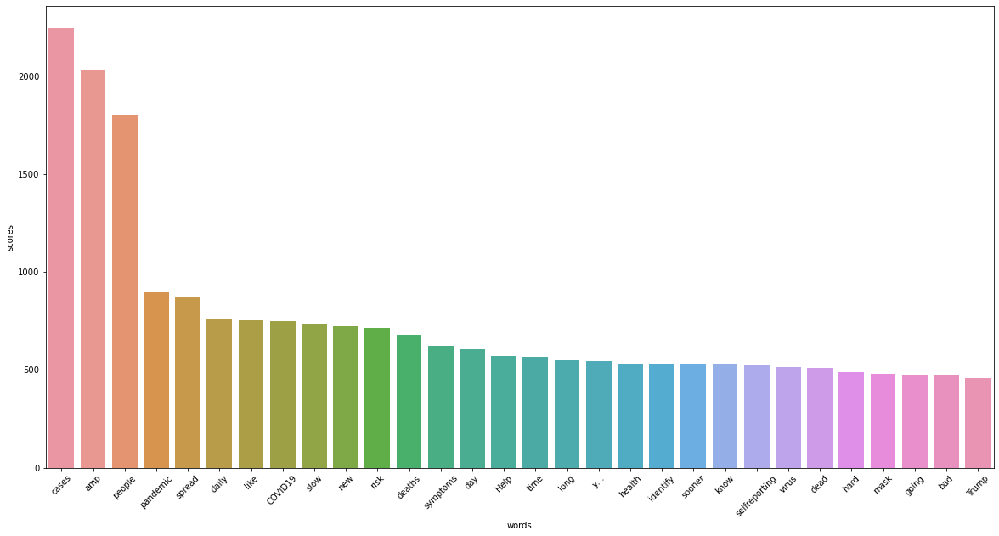

In [67]:
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=neg_df)
plt.xticks(rotation=45)
plt.show()

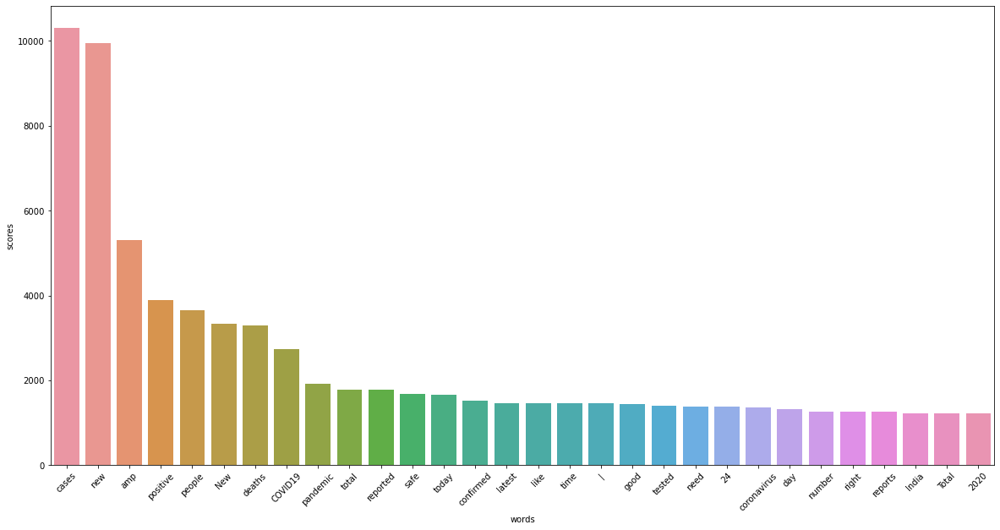

In [68]:
#plot positive words
# Plot with seaborn
pos_df = pd.DataFrame(most_common_pos_words.items(),columns=['words','scores'])
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=pos_df)
plt.xticks(rotation=45)
plt.show()

In [69]:
# Plot with seaborn
neg_df = pd.DataFrame(most_common_neut_words.items(),columns=['words','scores'])
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=neut_df)
plt.xticks(rotation=45)
plt.show()

NameError: name 'neut_df' is not defined

<Figure size 1440x720 with 0 Axes>

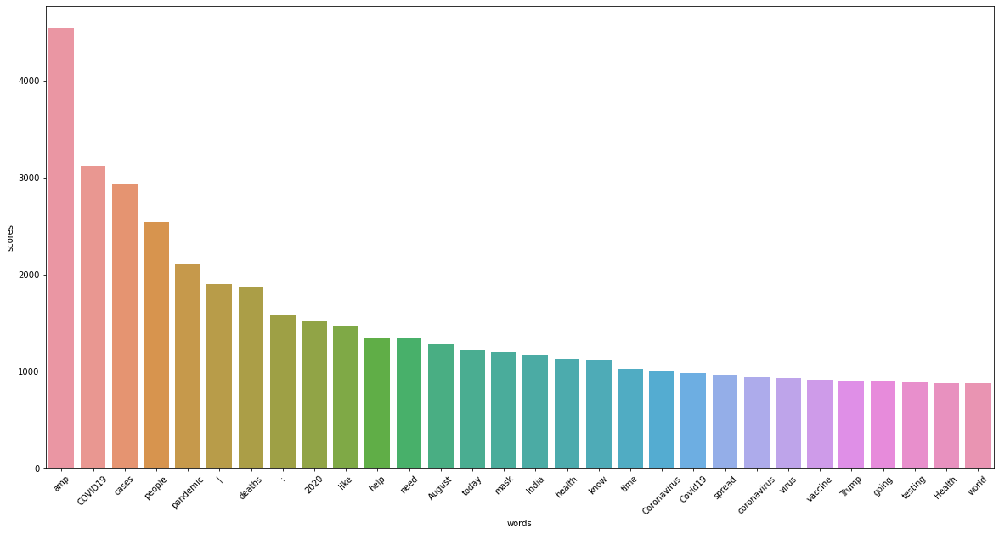

In [70]:
#plot neutral words

neut_df = pd.DataFrame(most_common_neut_words.items(),columns=['words','scores'])
plt.figure(figsize=(20,10))
sns.barplot(x='words',y='scores',data=neut_df)
plt.xticks(rotation=45)
plt.show()


In [71]:
# word coloud

from wordcloud import WordCloud

In [72]:
def plot_wordcloud(docx):
    plt.figure(figsize=(20,10))
    mywordcloud = WordCloud().generate(docx)
    plt.imshow(mywordcloud,interpolation='bilinear')
    plt.axis('off')
    plt.show()

In [73]:
pos_docx = ' '.join(pos_tokens)
neg_docx = ' '.join(neg_tokens)
neut_docx = ' '.join(neut_tokens)

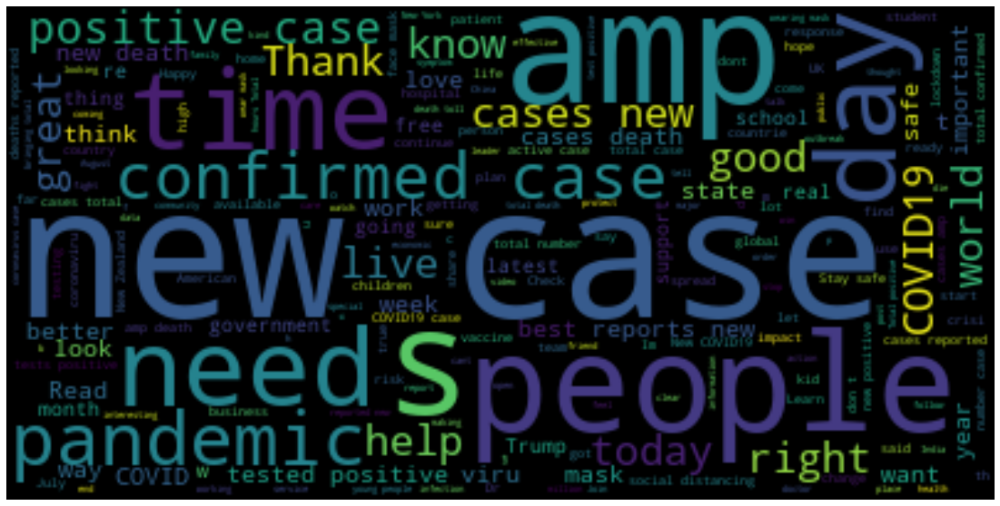

In [74]:
plot_wordcloud(pos_docx)

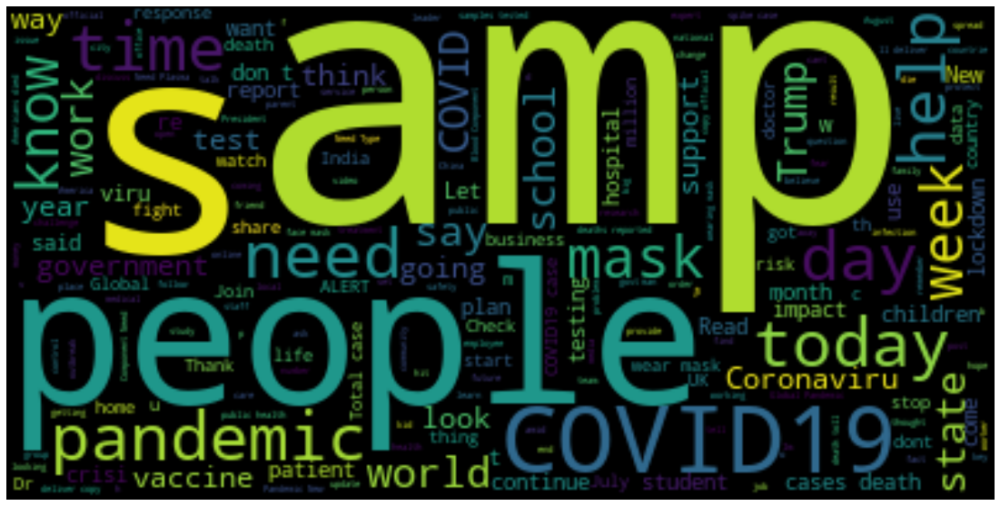

In [75]:
plot_wordcloud(neut_docx)

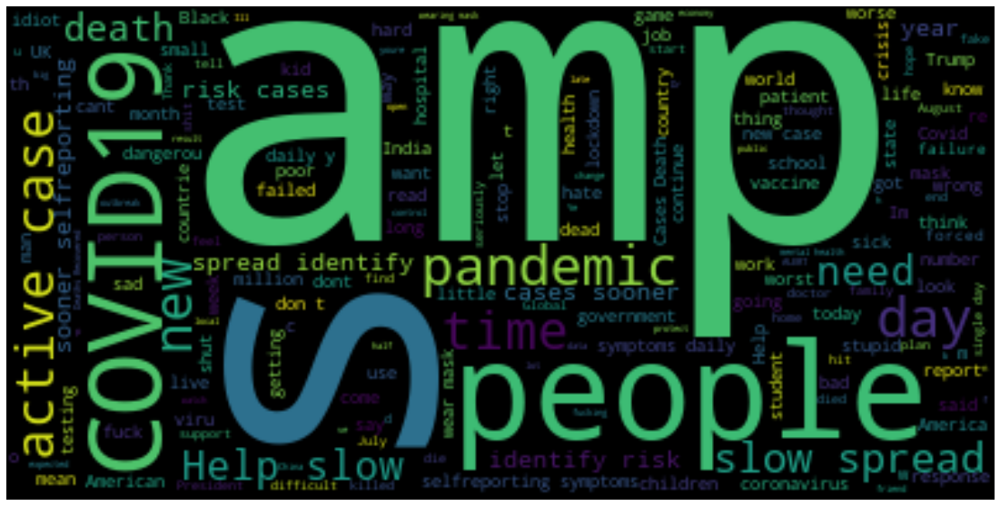

In [76]:
plot_wordcloud(neg_docx)